## MSA 2024 Phase 2 - Part 1 Analysis and Preprocessing

In [1]:
!/opt/anaconda3/bin/python -m pip install xgboost
!/opt/anaconda3/bin/python -m pip install keras 
!/opt/anaconda3/bin/python -m pip install tensorflow
!/opt/anaconda3/bin/python -m pip install fbprophet
!/opt/anaconda3/bin/python -m pip install statsmodels
import pandas as pd
import numpy  as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import sklearn as skl


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.0/64.0 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 26.5 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of pystan to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of pystan to determine which version is compatible with other requirements. This could take a while.
INFO: This is taking longer than usual. You might need to provide the dependency resolver with stricter constraints to reduce runtime. See https://pip.pypa.io/warnings/backtracking for guidance. If you want to abort this run, press Ctrl + C.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.2/16.2 MB 27.6 MB/s eta 0:00:0000:0100:01
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.9/47.9 kB 6.4 MB/s eta 0:00:00
   ━━━

### 1. Find all variables and understand them

In [2]:
# Choose W Store Sales as the dataset and merged the three tables
url_features="https://raw.githubusercontent.com/NZMSA/2024-Phase-2/main/data-science/0.%20Resources/datasets/W%20store%20sales/features.csv"
df_features=pd.read_csv(url_features)
df_features.info()

url_sales="https://raw.githubusercontent.com/NZMSA/2024-Phase-2/main/data-science/0.%20Resources/datasets/W%20store%20sales/sales.csv"
df_sales=pd.read_csv(url_sales)
df_sales.info()

url_stores="https://raw.githubusercontent.com/NZMSA/2024-Phase-2/main/data-science/0.%20Resources/datasets/W%20store%20sales/stores.csv"
df_stores=pd.read_csv(url_stores)
df_stores.info()

# Merging the three tables by the unique keys
merged_data=pd.merge(df_sales, df_features, on=['Store','Date','IsHoliday'],how='left')
merged_data=pd.merge(merged_data, df_stores, on='Store', how='left')

merged_data=merged_data.sort_values(by=['Store','Dept','Date'])
                                       

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8190 entries, 0 to 8189
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         8190 non-null   int64  
 1   Date          8190 non-null   object 
 2   Temperature   8190 non-null   float64
 3   Fuel_Price    8190 non-null   float64
 4   MarkDown1     4032 non-null   float64
 5   MarkDown2     2921 non-null   float64
 6   MarkDown3     3613 non-null   float64
 7   MarkDown4     3464 non-null   float64
 8   MarkDown5     4050 non-null   float64
 9   CPI           7605 non-null   float64
 10  Unemployment  7605 non-null   float64
 11  IsHoliday     8190 non-null   bool   
dtypes: bool(1), float64(9), int64(1), object(1)
memory usage: 712.0+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         4

### 2. Setting the labels and the distribution of values in columns

The number of rows before data processing: 382955
The number of rows after data processing: 345774
<class 'pandas.core.frame.DataFrame'>
Index: 345774 entries, 0 to 421545
Data columns (total 28 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Store             345774 non-null  int64  
 1   Dept              345774 non-null  int64  
 2   Date              345774 non-null  object 
 3   Weekly_Sales      345774 non-null  float64
 4   IsHoliday         345774 non-null  bool   
 5   Temperature       345774 non-null  float64
 6   Fuel_Price        345774 non-null  float64
 7   MarkDown1         77753 non-null   float64
 8   MarkDown2         64944 non-null   float64
 9   MarkDown3         72286 non-null   float64
 10  MarkDown4         69783 non-null   float64
 11  MarkDown5         78076 non-null   float64
 12  CPI               345774 non-null  float64
 13  Unemployment      345774 non-null  float64
 14  Type              3457

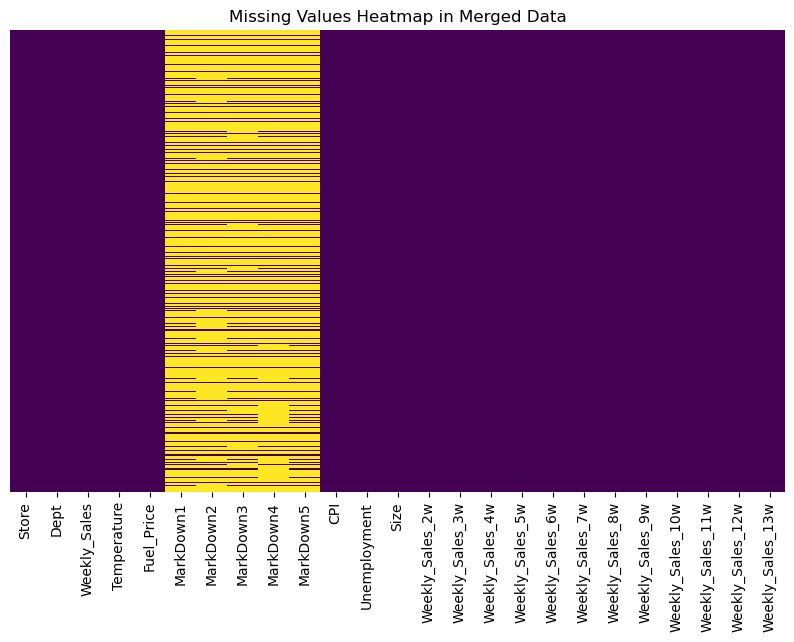

In [14]:
#setting the following 12 weekly sales as labels
for i in range(1,13):
 merged_data[f'Weekly_Sales_{i+1}w']=merged_data.groupby(['Store','Dept'])['Weekly_Sales'].shift(-i)
print("The number of rows before data processing:", merged_data.shape[0])
merged_data=merged_data.dropna(subset=['Weekly_Sales_13w'])
print("The number of rows after data processing:", merged_data.shape[0])

# the distribution of values in columns
merged_data.info()
merged_selected_types=merged_data.select_dtypes(include=['float64', 'int64'])
mean=merged_selected_types.mean()
variance=merged_selected_types.var()
std=merged_selected_types.std()
quantiles=merged_selected_types.quantile([0,0.05,0.25,0.5,0.75,0.90,0.95,0.96,0.97,0.98,0.99,1])
print(f"\n Mean:\n{ mean} \n Variance :\n{variance} \n Standard deviation:\n{std} \n Quantiles:\n{quantiles}\n")

plt.figure(figsize=(10,6))
sns.heatmap(merged_selected_types.isnull(),cbar=False, cmap='viridis', yticklabels=False)
plt.title('Missing Values Heatmap in Merged Data')
plt.show()


### 3. Clean data

In [16]:
#Data cleaning
# Consider the solution to process the missing values in columns
for i in range(1, 6):
    print(f"the number of 0 in MarkDown{i} is: {(merged_data[f'MarkDown{i}'] == 0).sum()}")
# Considering that the proportion of missing values in columns Markdown1-5 exceeds 70%, and there are valid values of 0, 
# in order to avoid unexpected impacts on the model results, these columns will not be considered as input variables (X variables) 
# in the subsequent modeling process.

#Transfering the bool variable into numeric 
merged_data['IsHoliday']=merged_data['IsHoliday'].astype(int)
# Convert "Type" to numeric type, create a mapping dictionary, and use the map method to convert the type to integer
type_mapping = {'A': 0, 'B': 1, 'C': 2}
merged_data['Type'] = merged_data['Type'].map(type_mapping)
# to avoid the influence of outliers in y lables, we drop the values which are lager than 90% quantile and smaller than 10%
data_frames = {}  # Used to store processed dataframes
for i in range(2,14):
    quantile_10 = merged_data[f'Weekly_Sales_{i}w'].quantile(0.10)
    quantile_90 = merged_data[f'Weekly_Sales_{i}w'].quantile(0.90)
    filtered_data = merged_data[(merged_data[f'Weekly_Sales_{i}w'] >= quantile_10) & (merged_data[f'Weekly_Sales_{i}w'] <= quantile_90)]
    # Delete sales data for other weeks, ensuring that there is only one y label at a time
    cols_to_keep = [col for col in filtered_data.columns if col == f'Weekly_Sales_{i}w' or 'Weekly_Sales_' not in col]
    filtered_data = filtered_data[cols_to_keep]
    data_frames[f'Weekly_Sales_{i}w'] = filtered_data

for week, df in data_frames.items():
    print(f"Number of rows retained for {week}:\n {df.info()} ")

the number of 0 in MarkDown1 is: 0
the number of 0 in MarkDown2 is: 65
the number of 0 in MarkDown3 is: 0
the number of 0 in MarkDown4 is: 0
the number of 0 in MarkDown5 is: 0
<class 'pandas.core.frame.DataFrame'>
Index: 276618 entries, 1 to 421545
Data columns (total 17 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   Store            276618 non-null  int64  
 1   Dept             276618 non-null  int64  
 2   Date             276618 non-null  object 
 3   Weekly_Sales     276618 non-null  float64
 4   IsHoliday        276618 non-null  int64  
 5   Temperature      276618 non-null  float64
 6   Fuel_Price       276618 non-null  float64
 7   MarkDown1        62554 non-null   float64
 8   MarkDown2        52449 non-null   float64
 9   MarkDown3        58378 non-null   float64
 10  MarkDown4        57526 non-null   float64
 11  MarkDown5        62761 non-null   float64
 12  CPI              276618 non-null  float64
 13  Unemploy

### 4. Visualise data

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


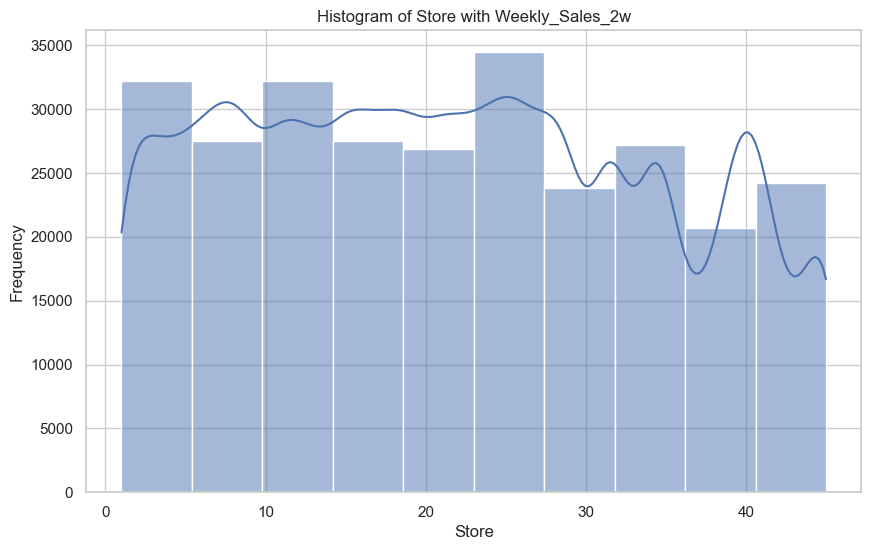

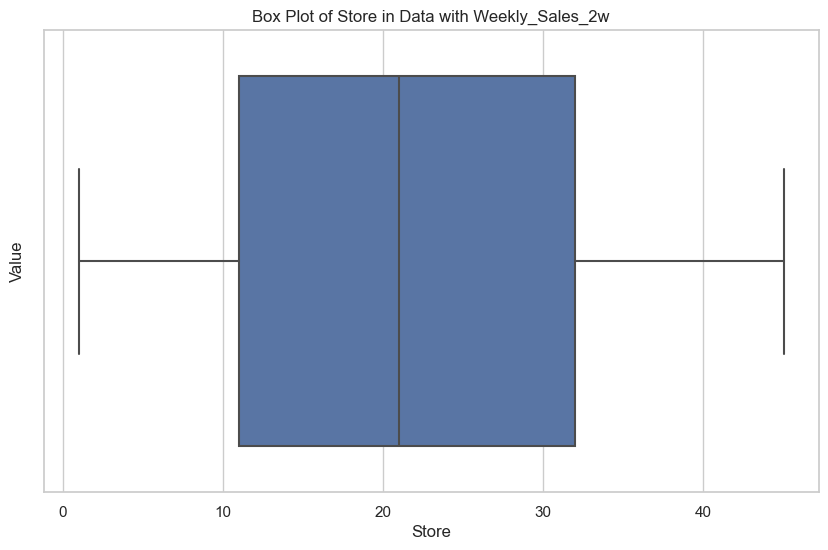

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


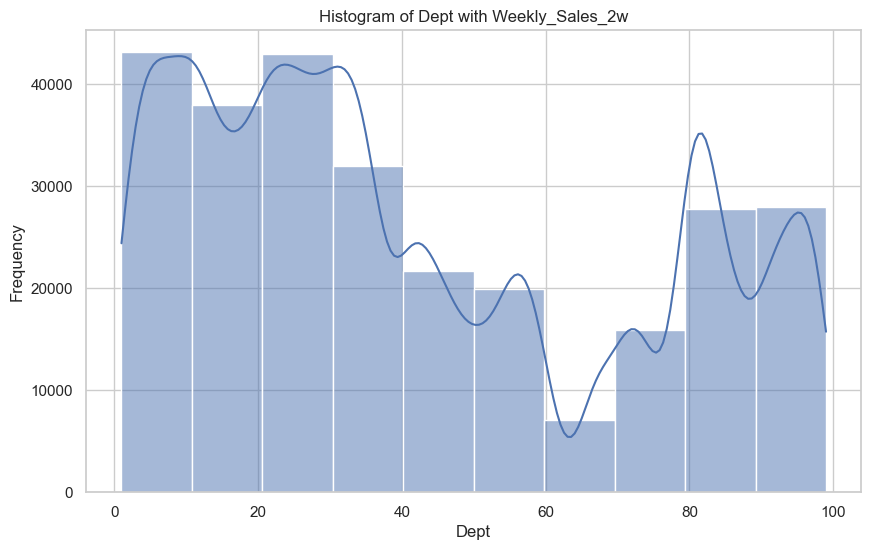

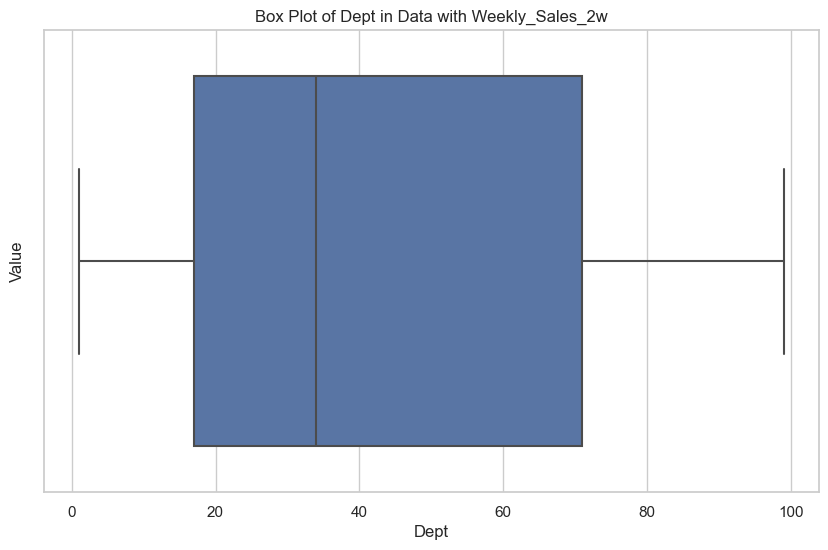

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


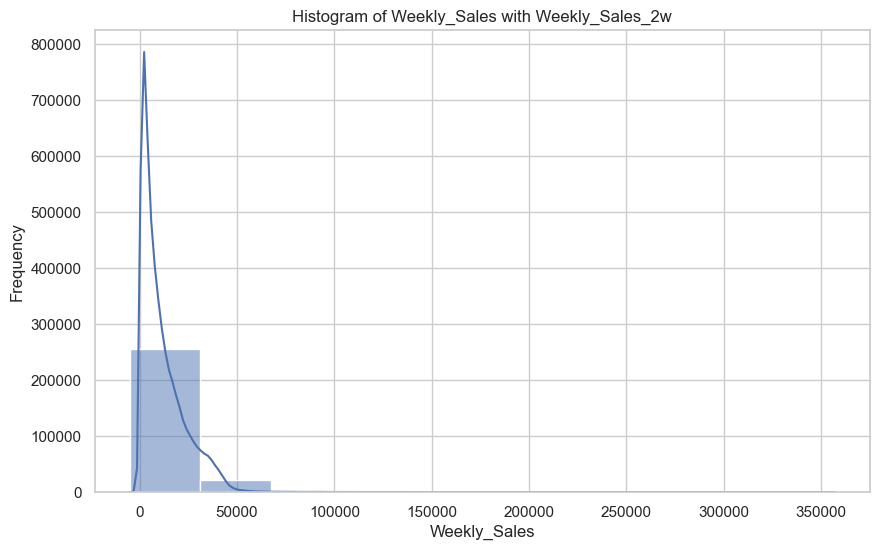

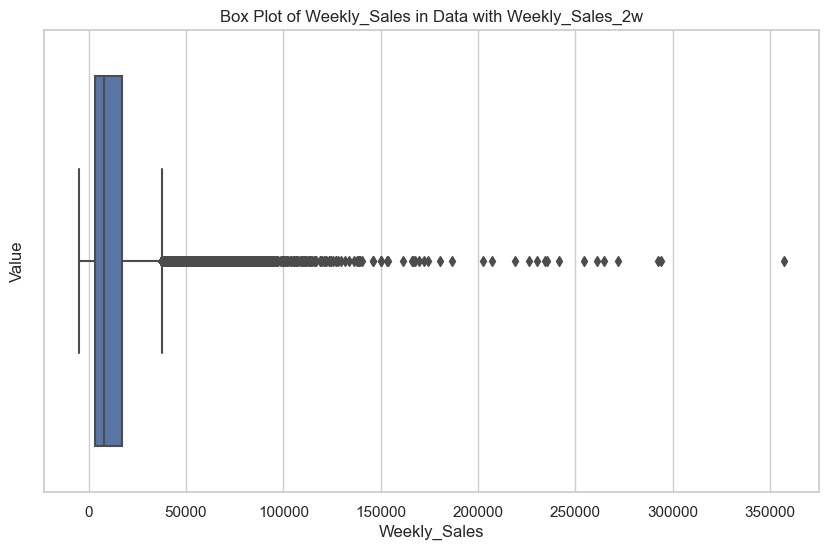

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


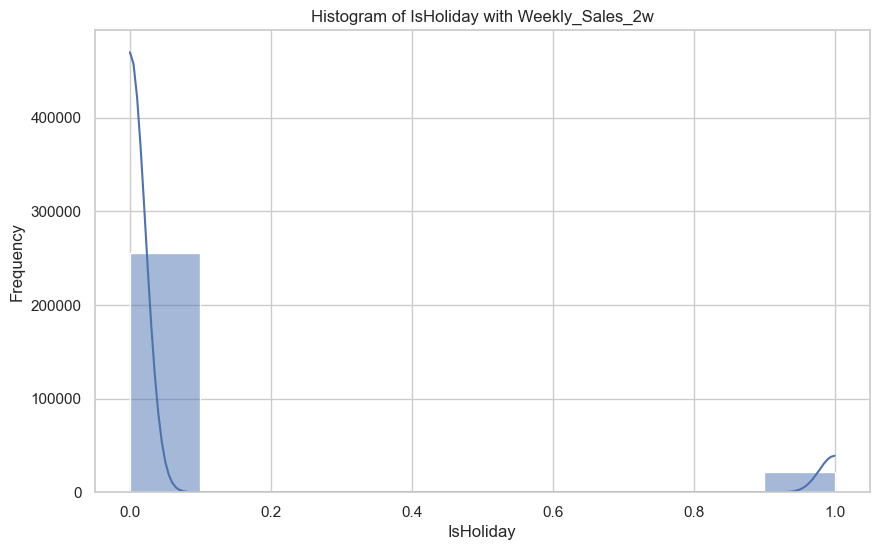

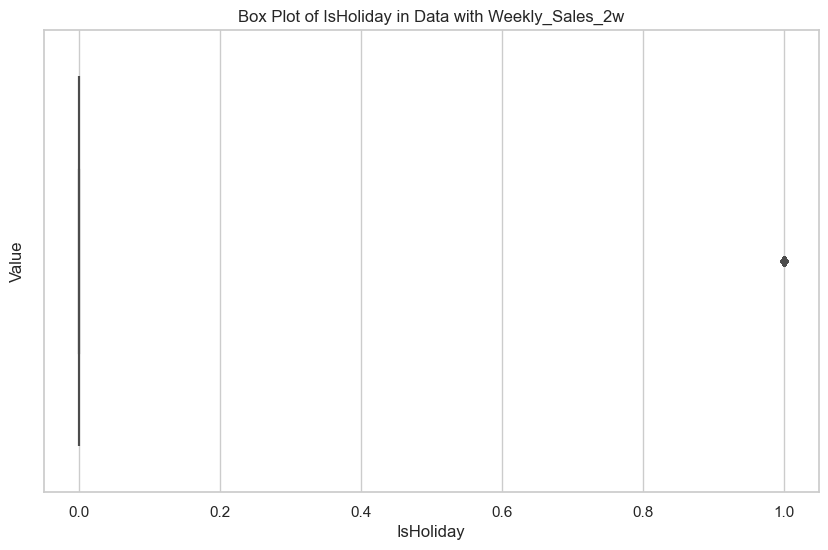

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


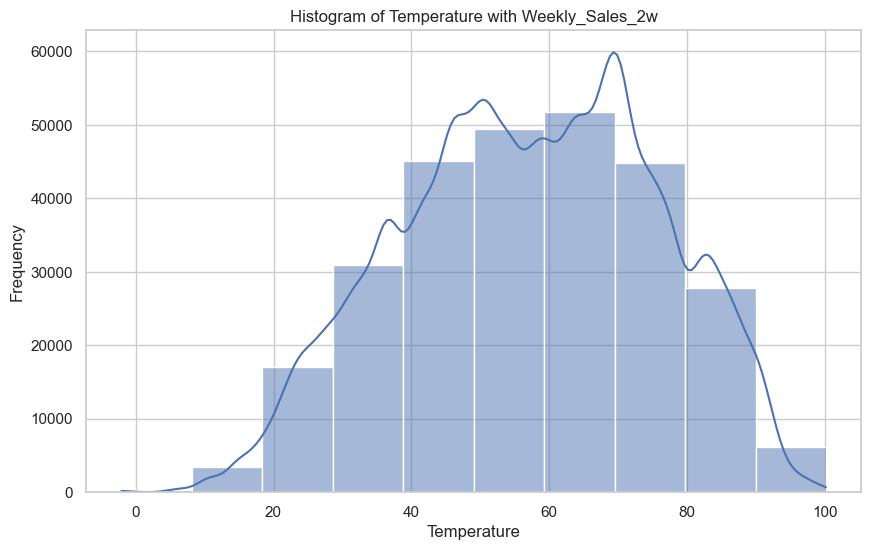

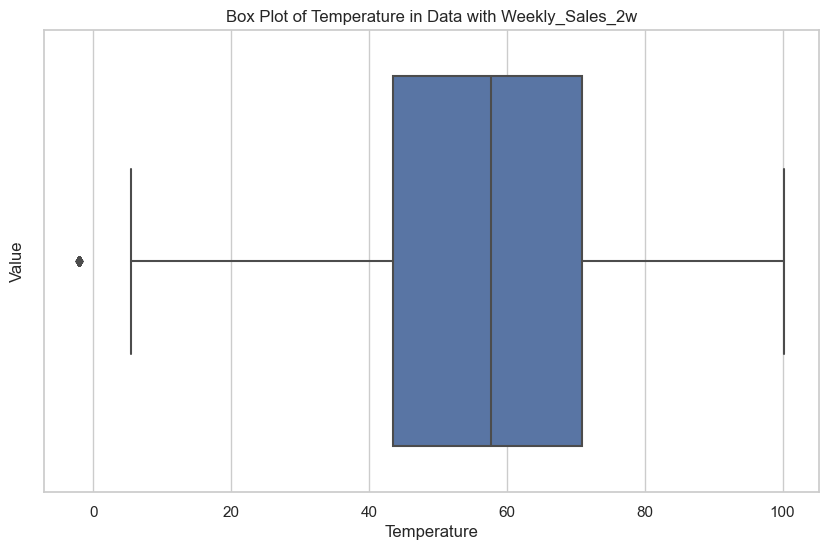

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


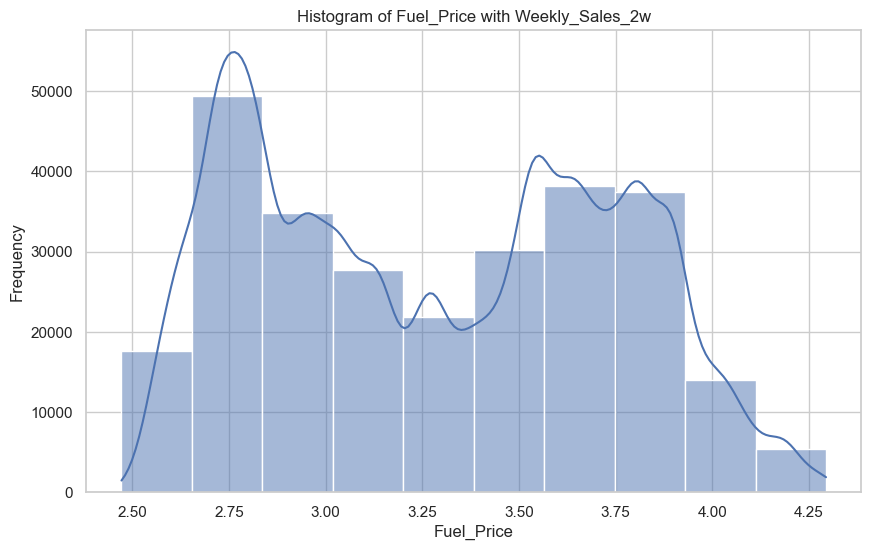

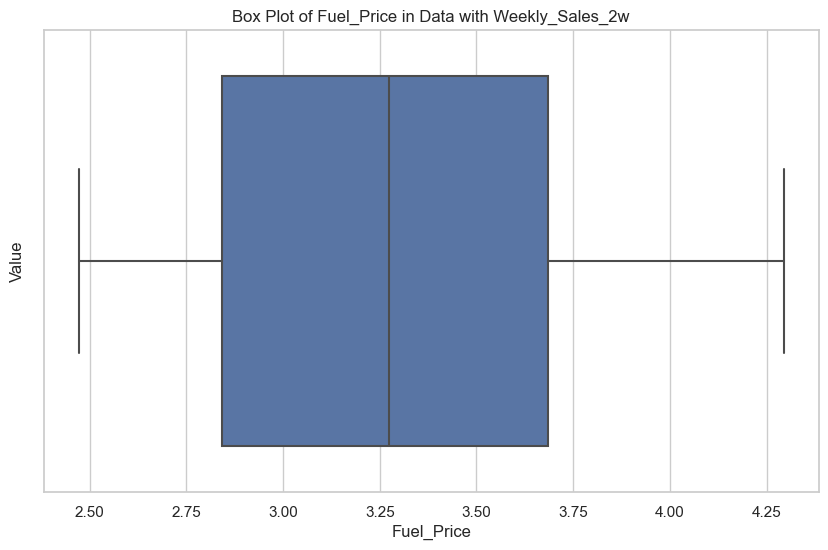

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


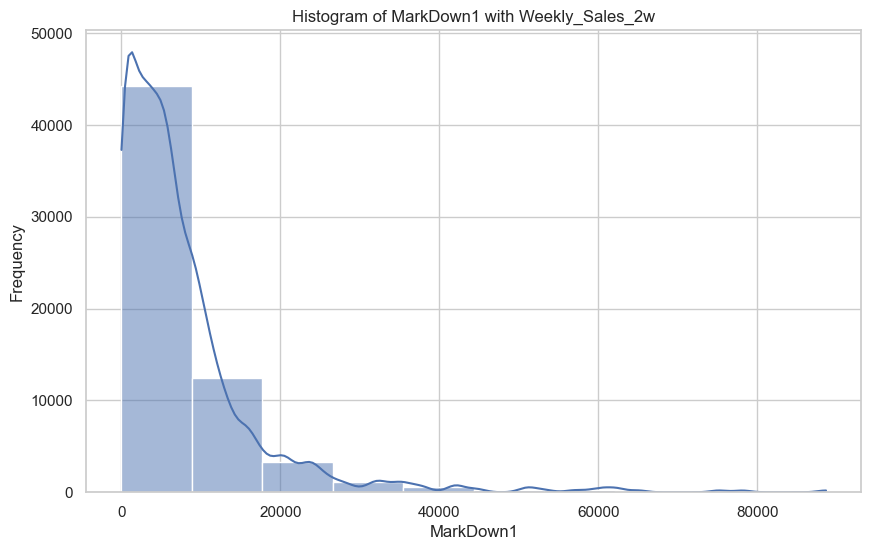

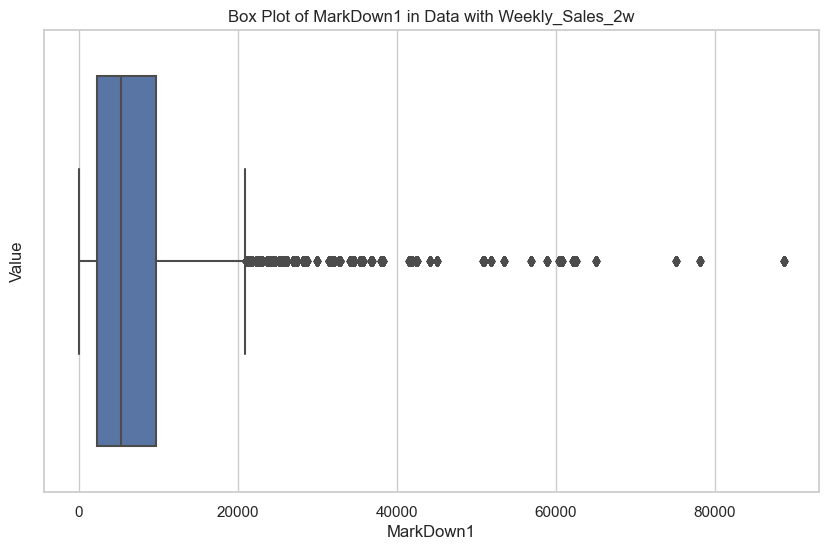

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


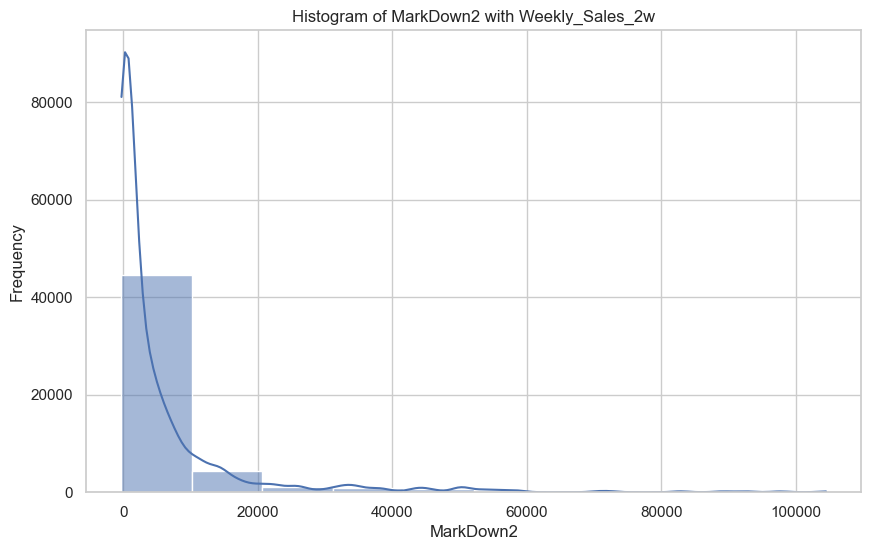

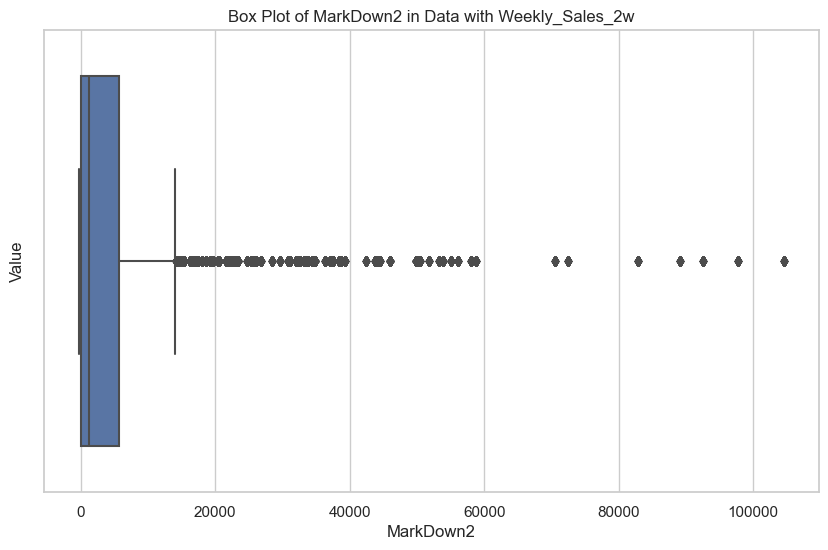

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


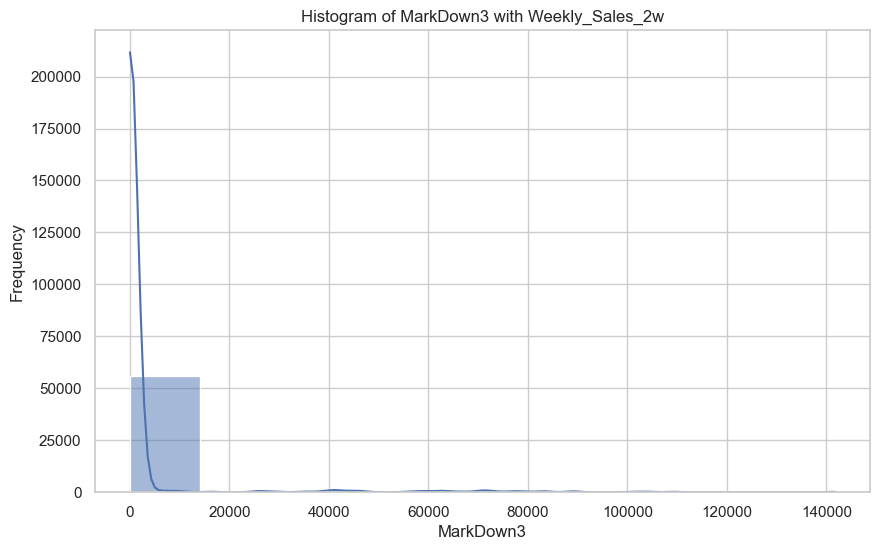

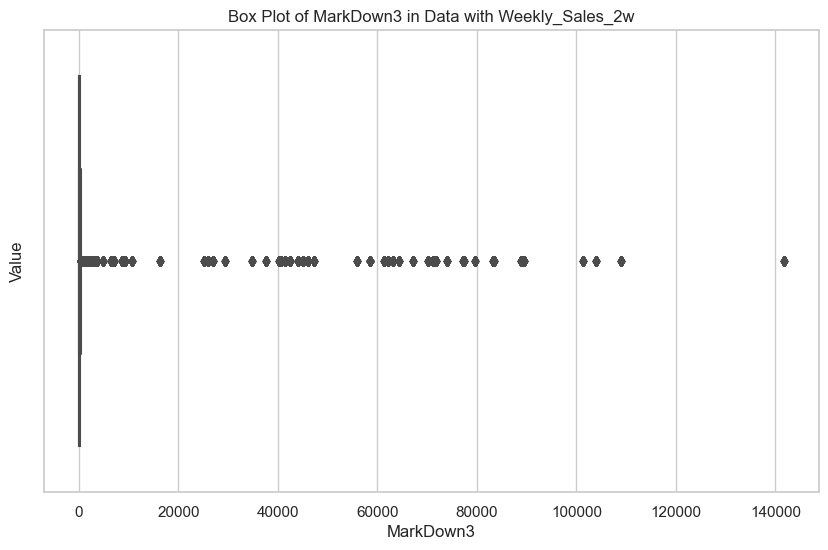

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


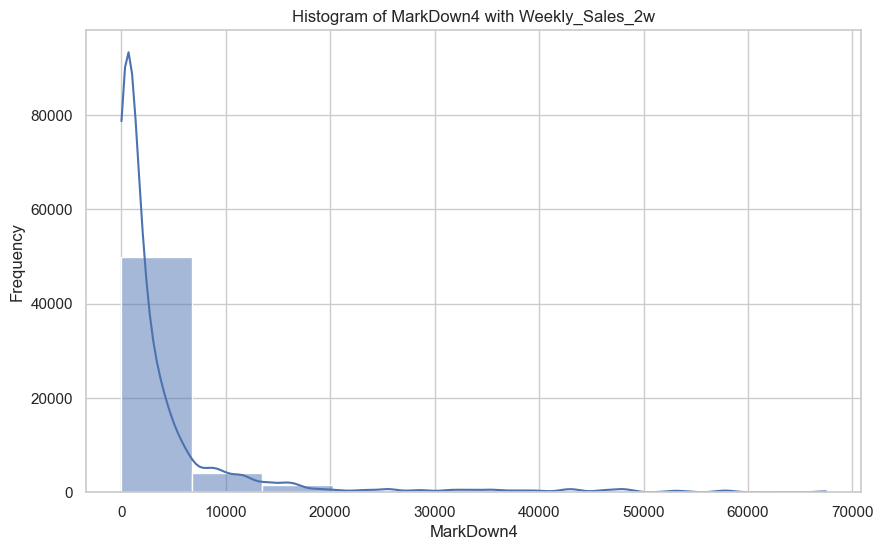

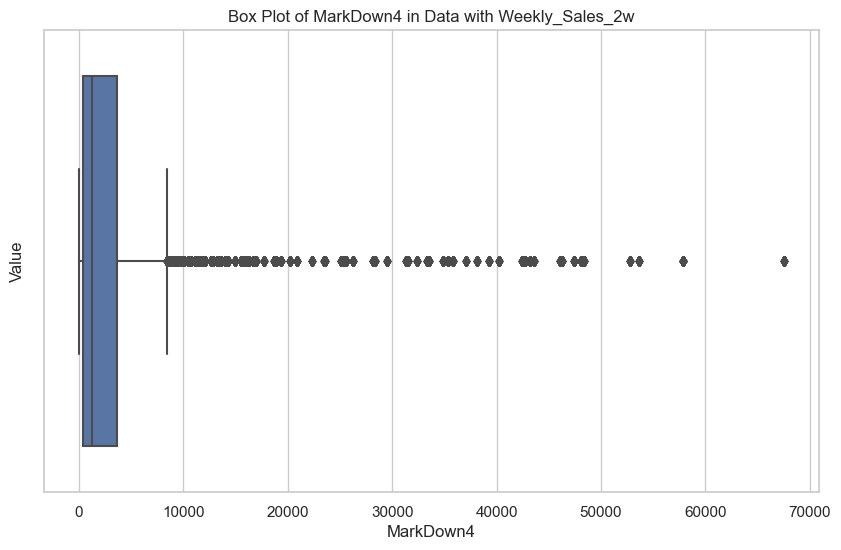

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


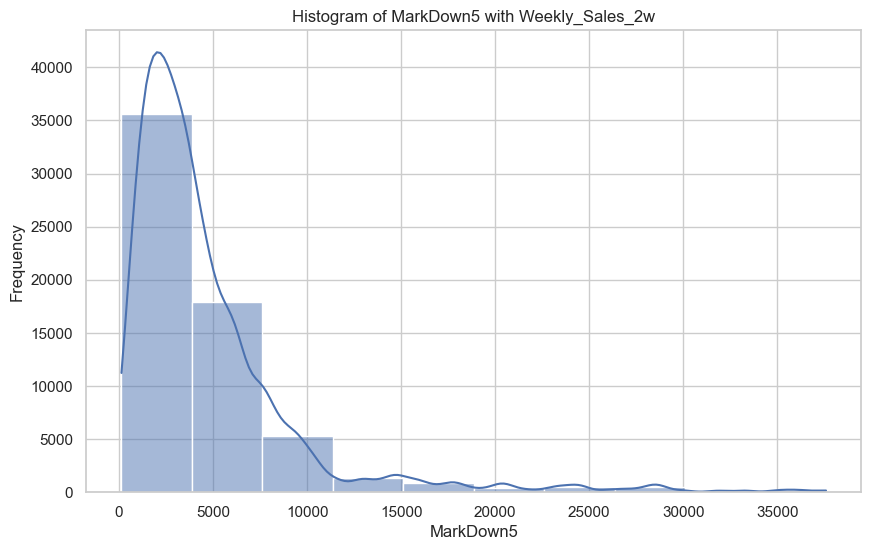

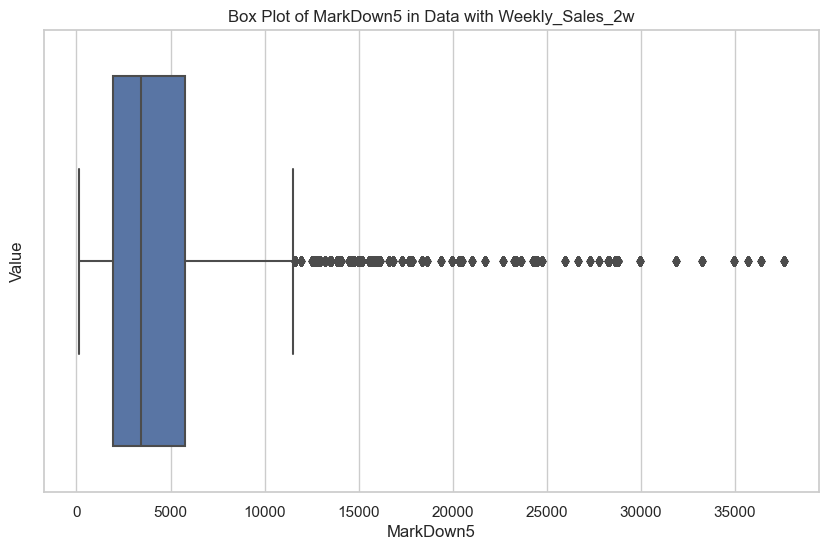

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


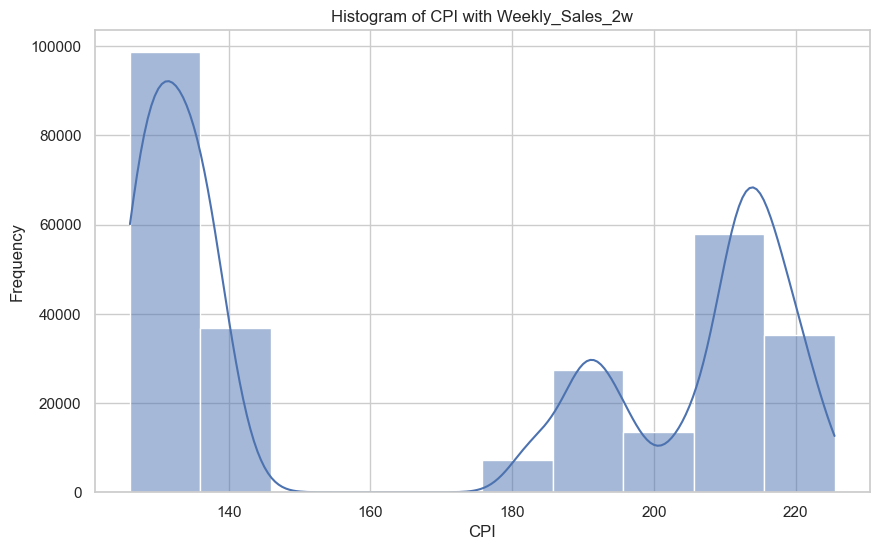

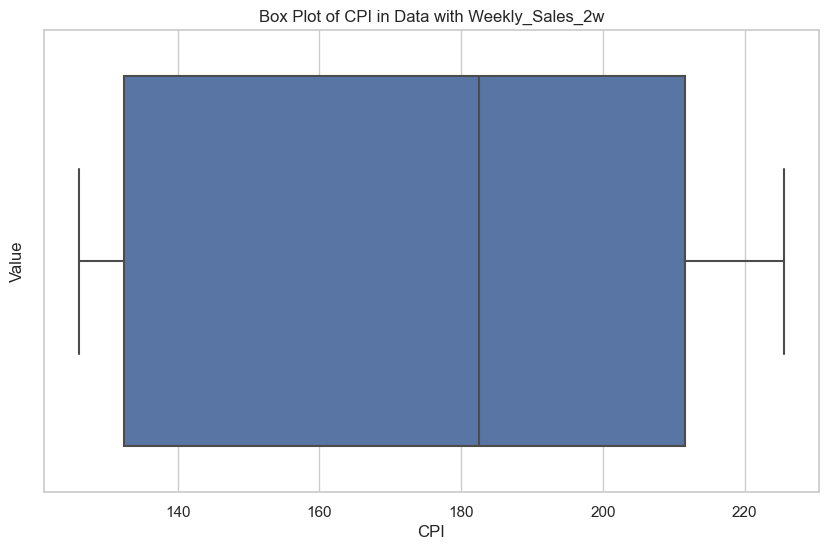

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


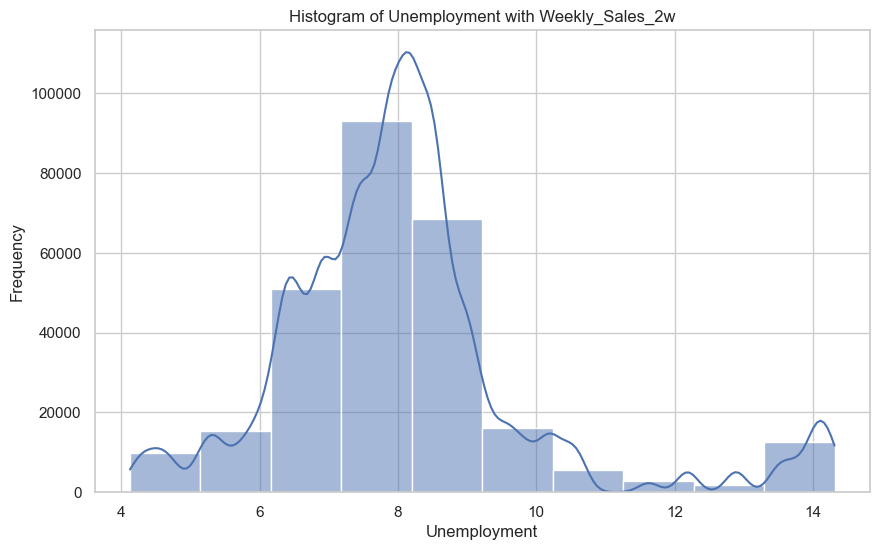

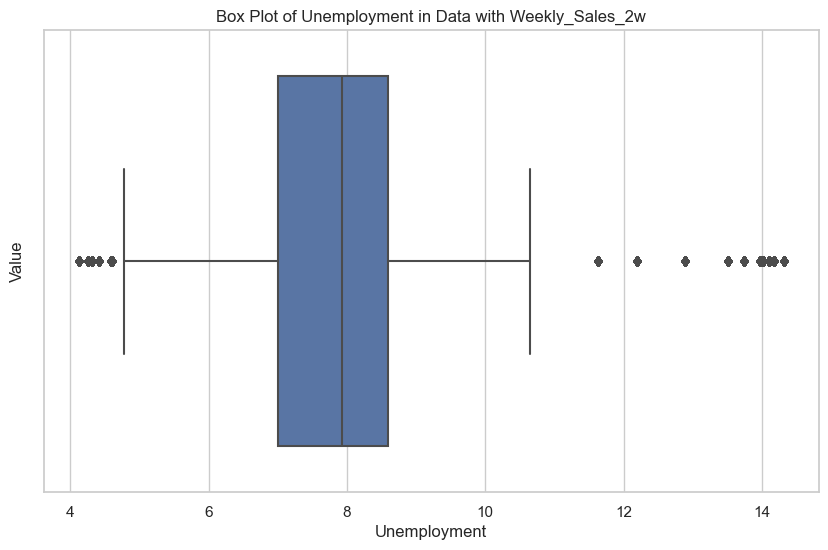

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


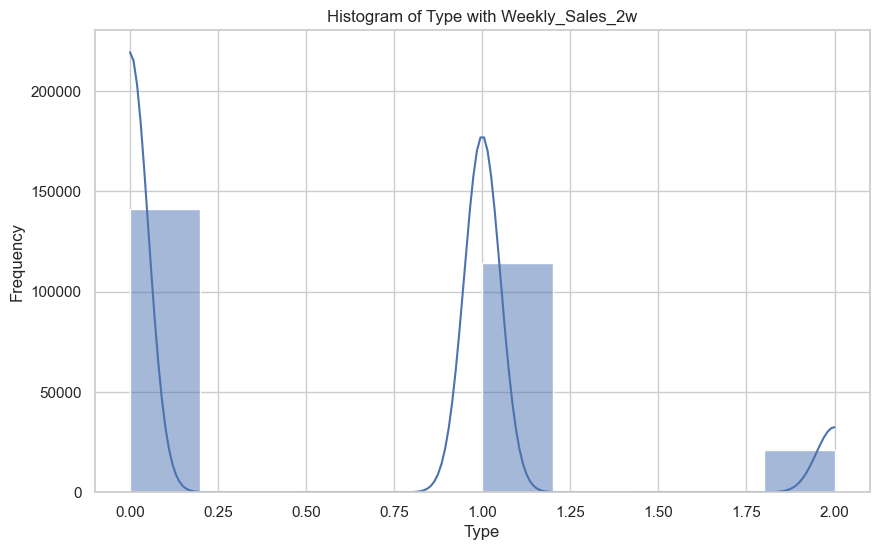

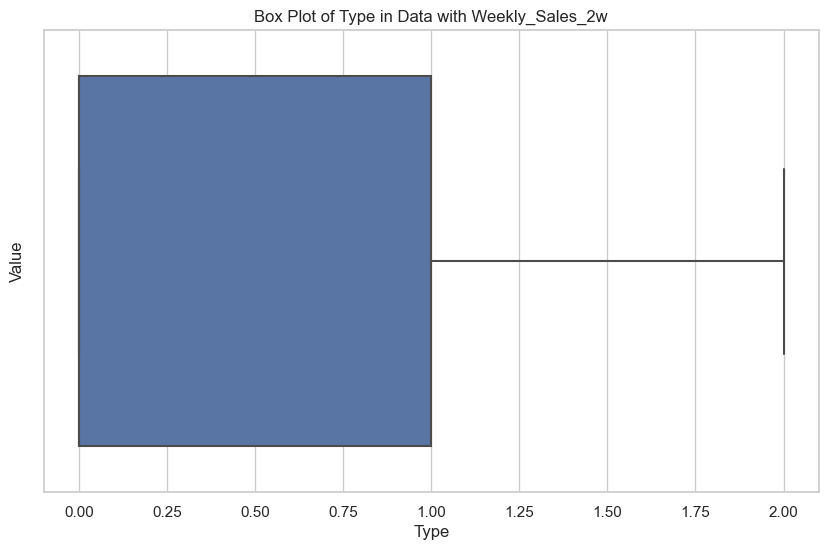

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


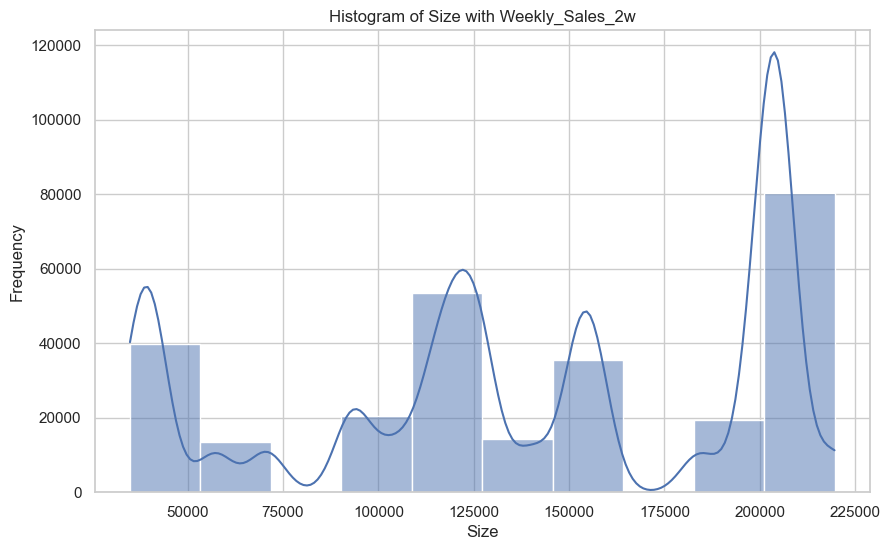

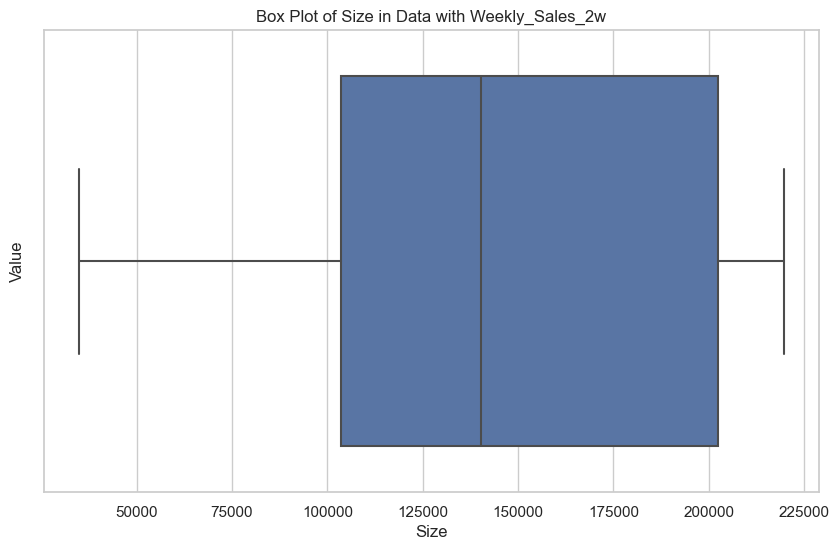

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


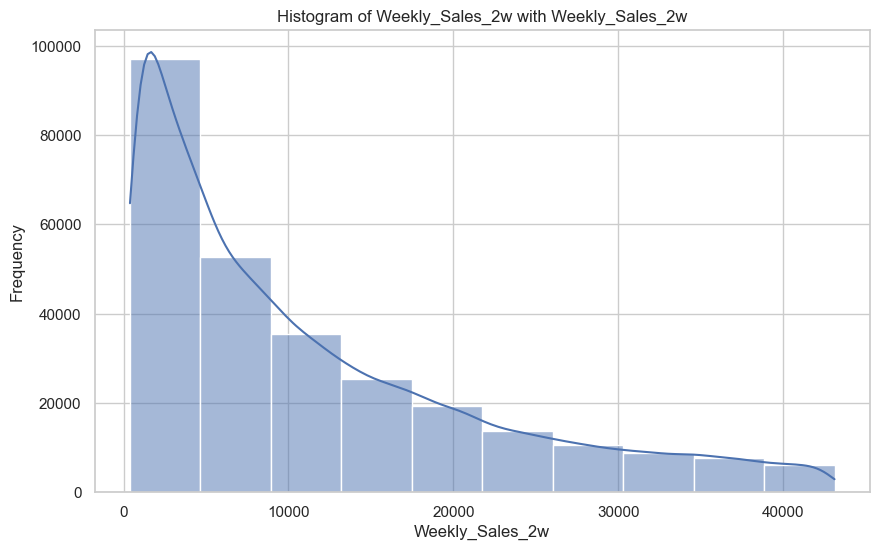

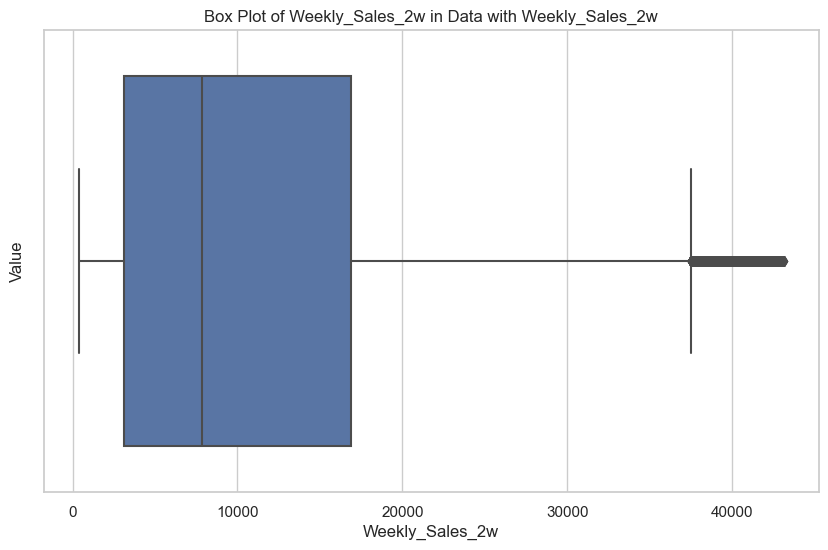

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


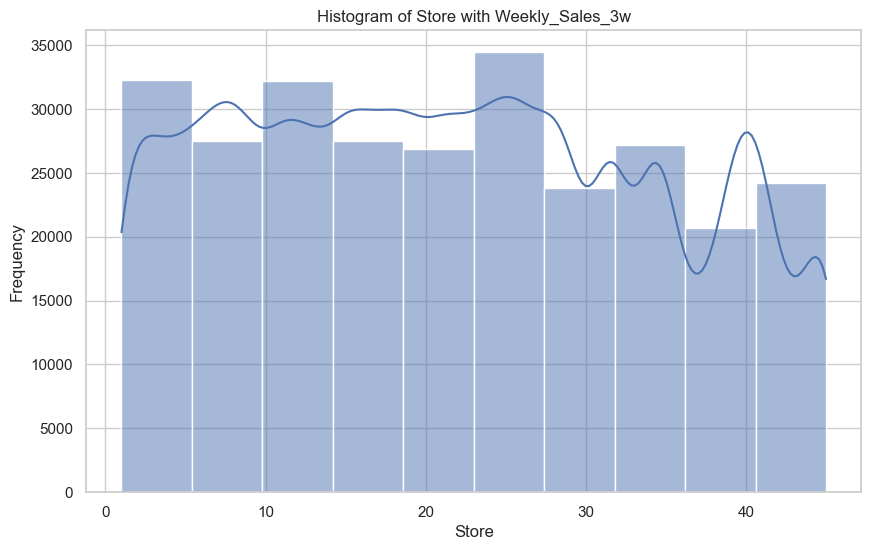

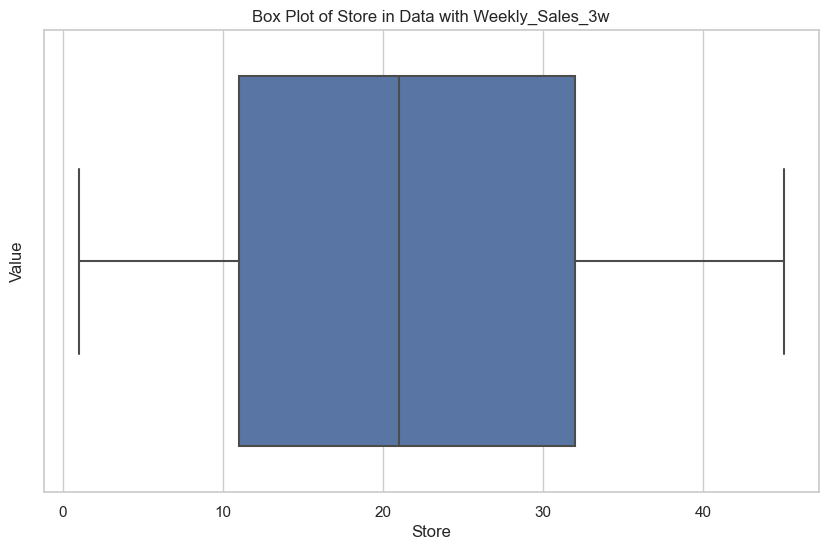

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


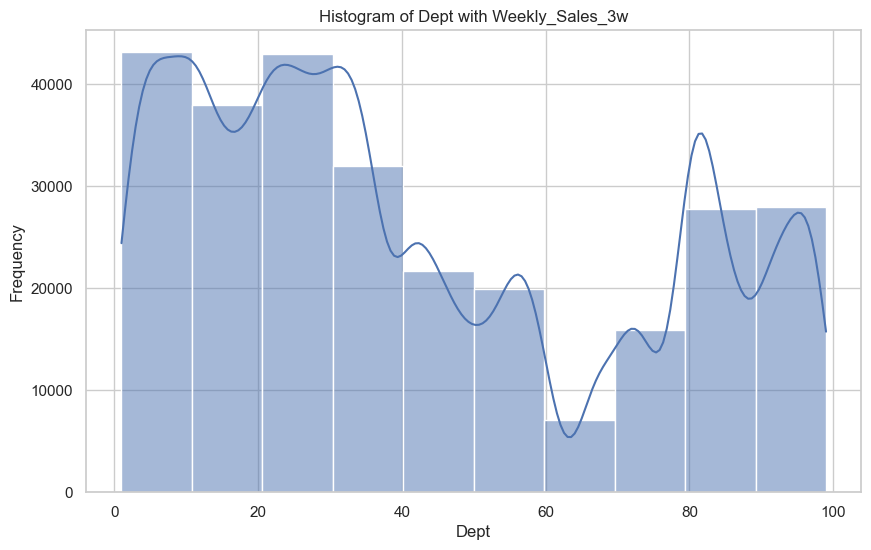

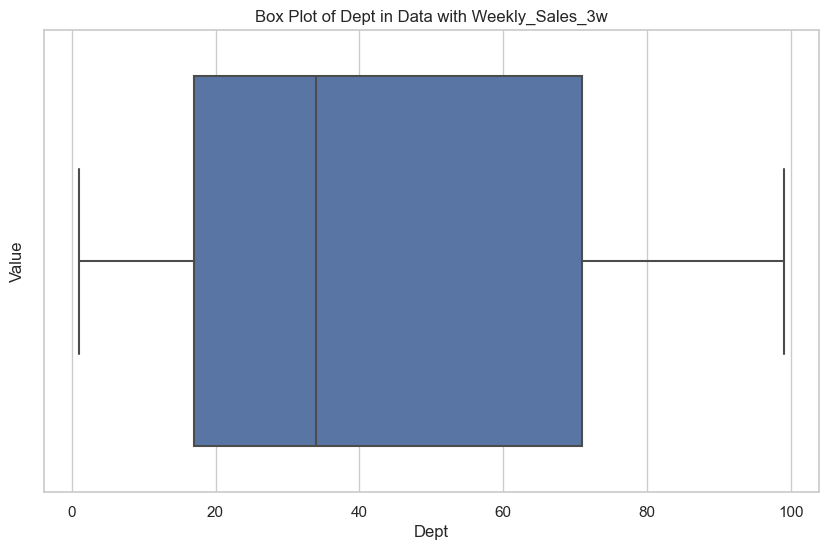

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


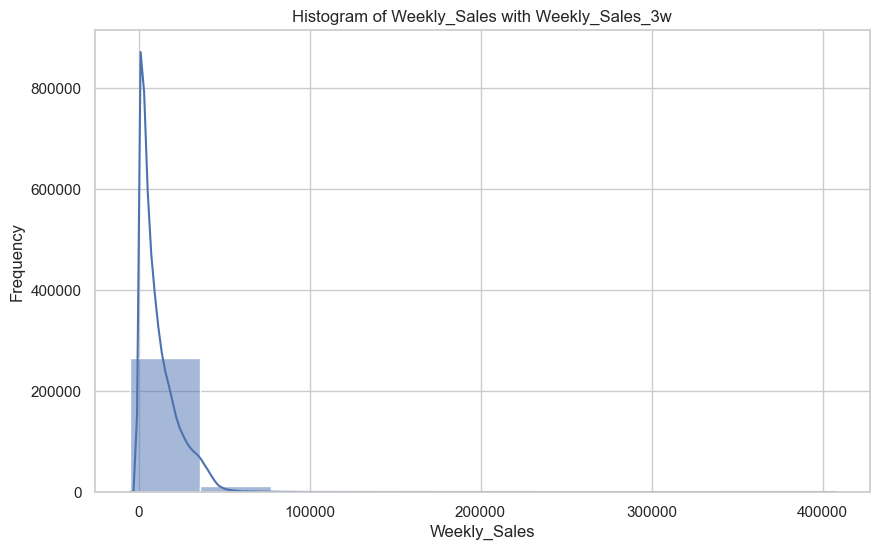

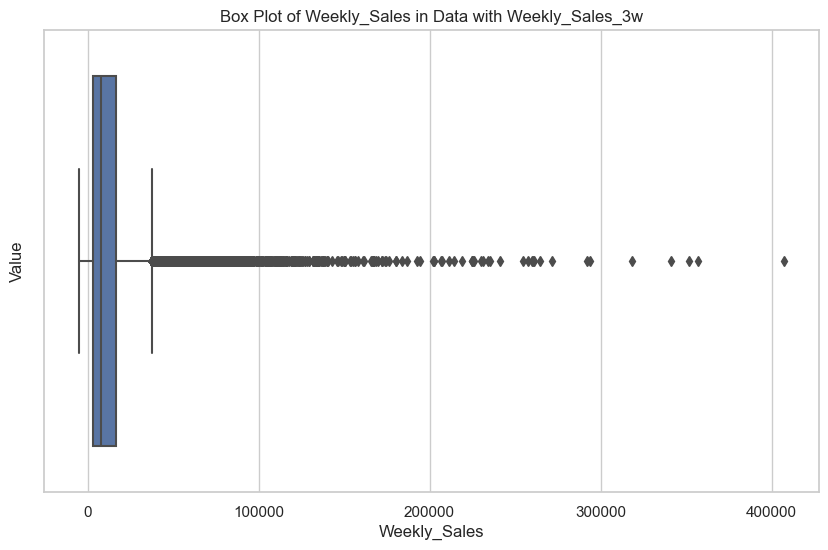

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


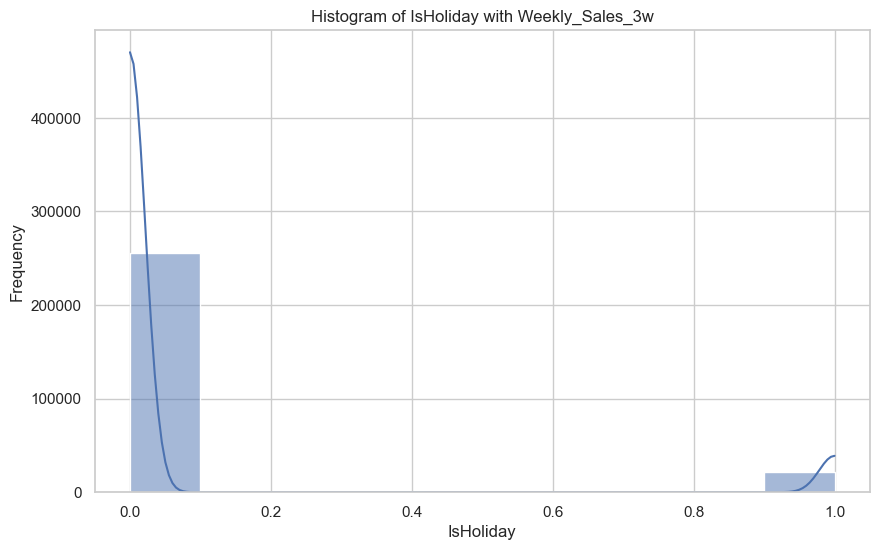

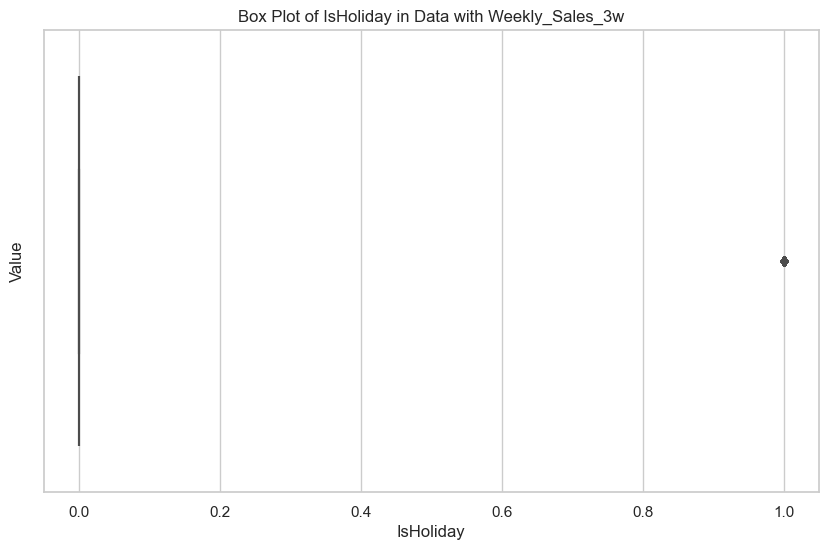

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


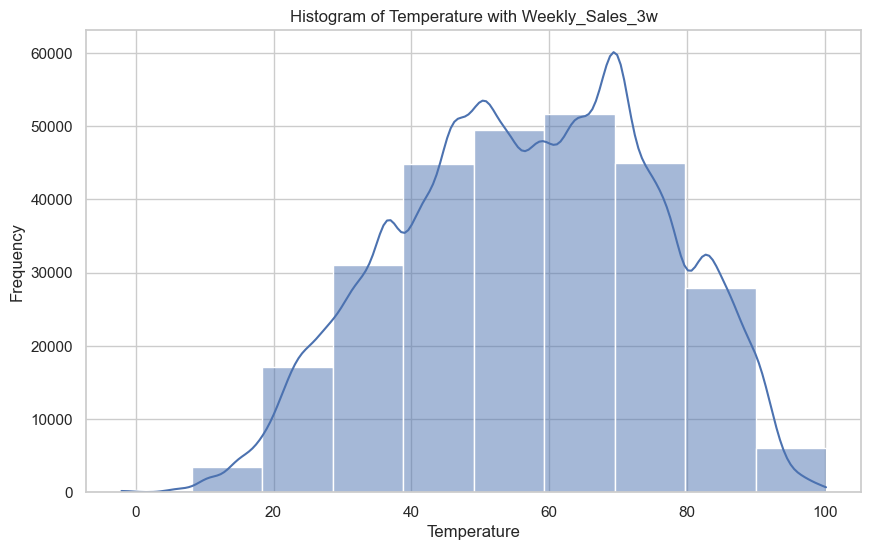

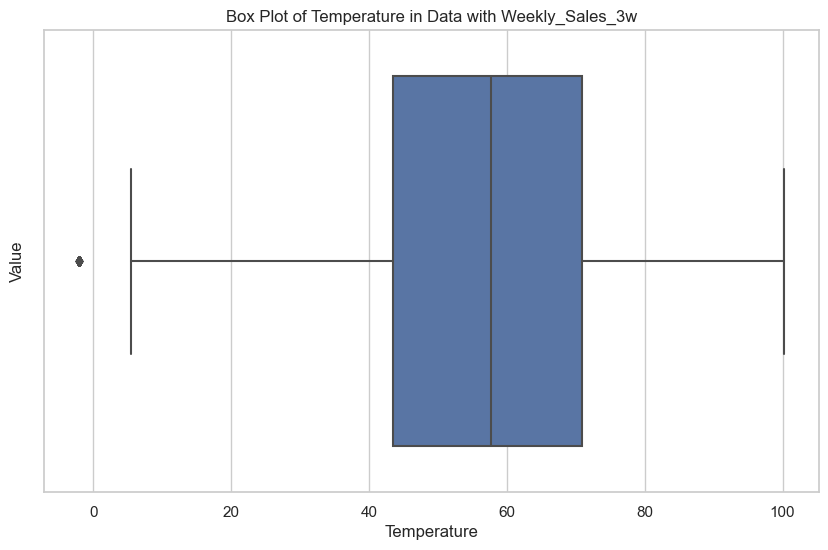

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


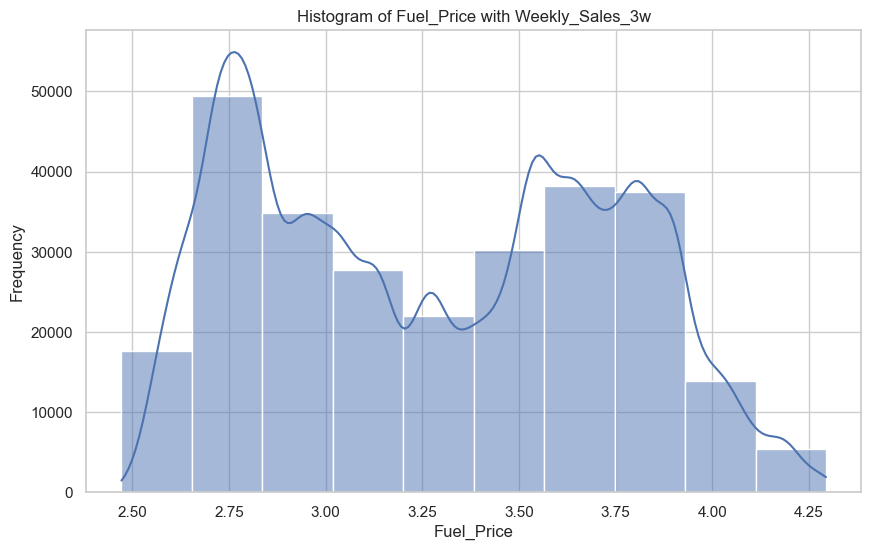

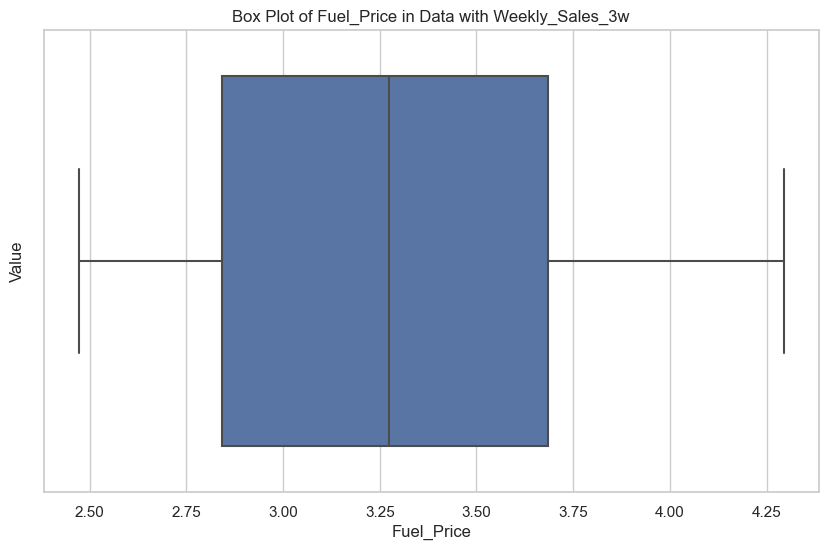

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


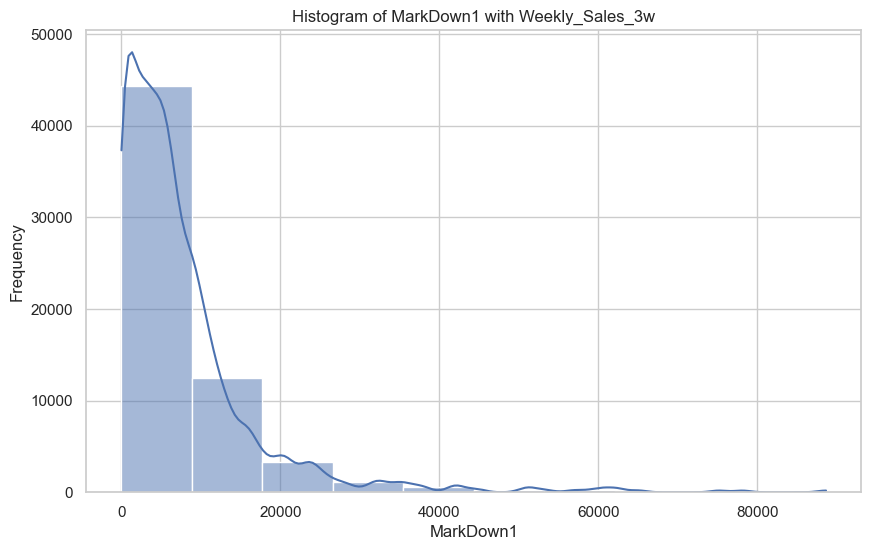

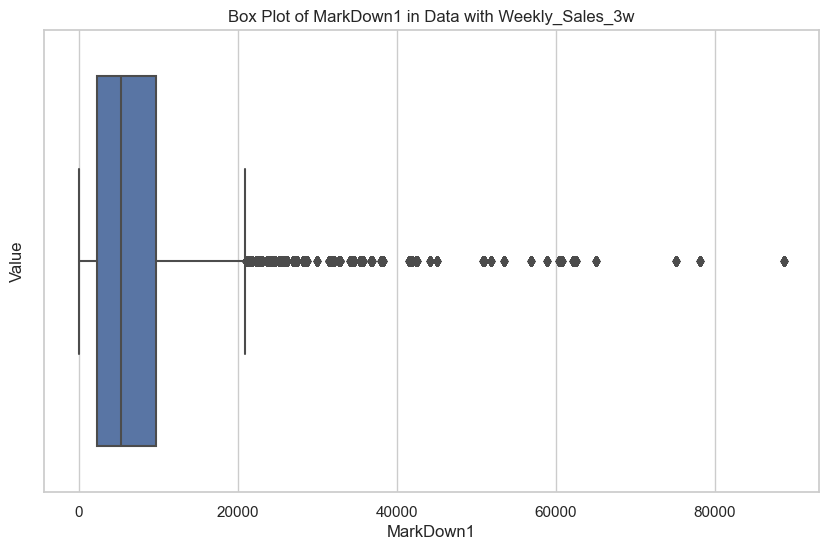

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


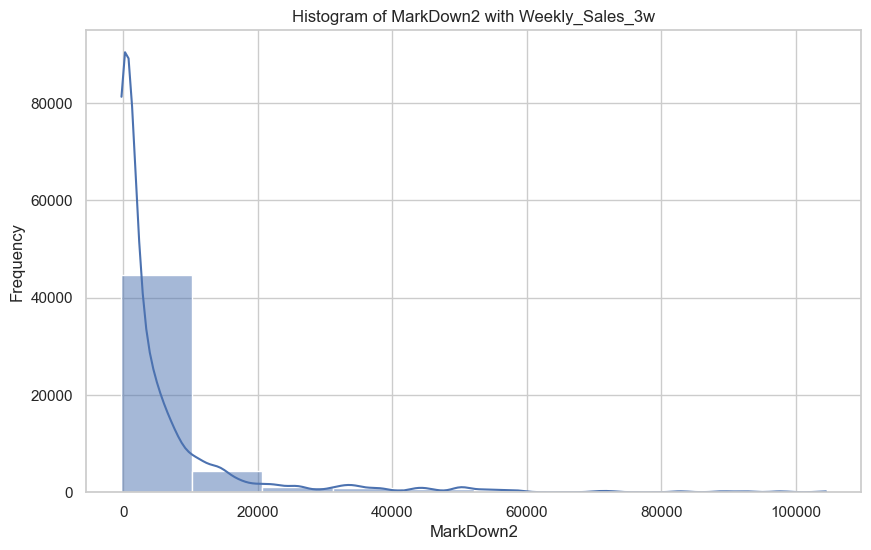

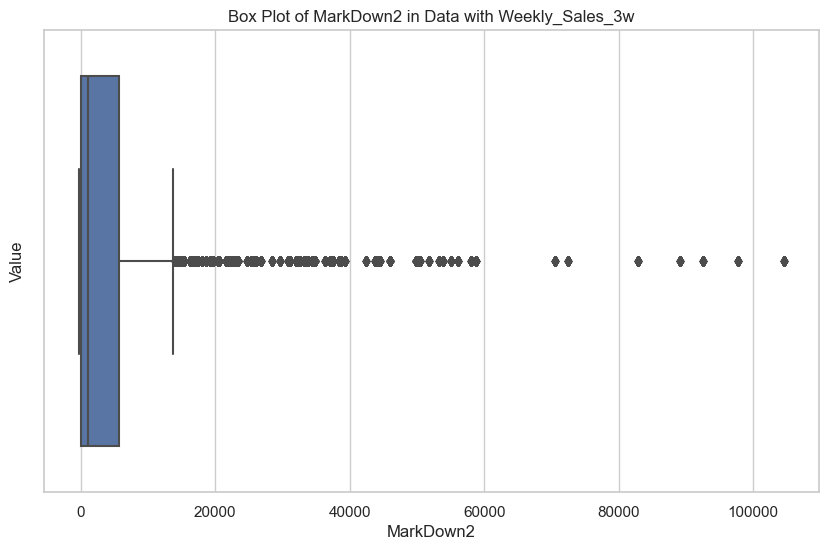

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


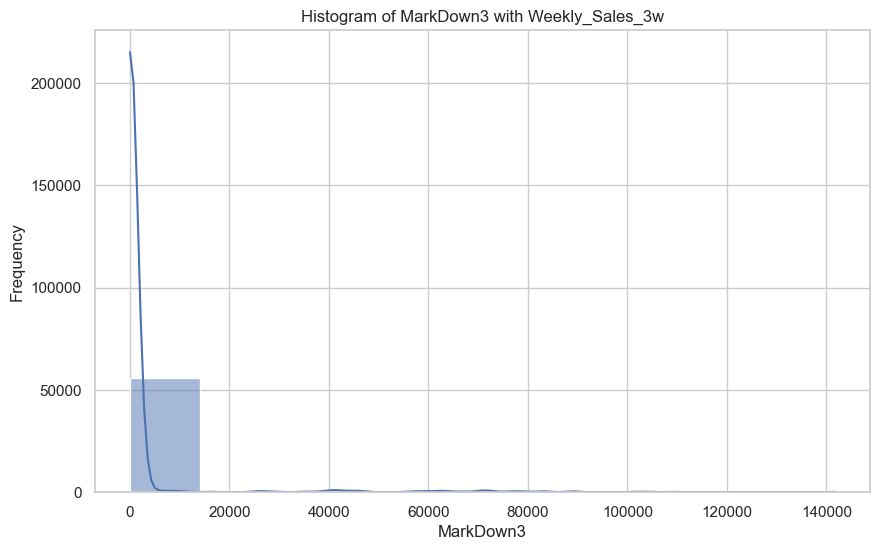

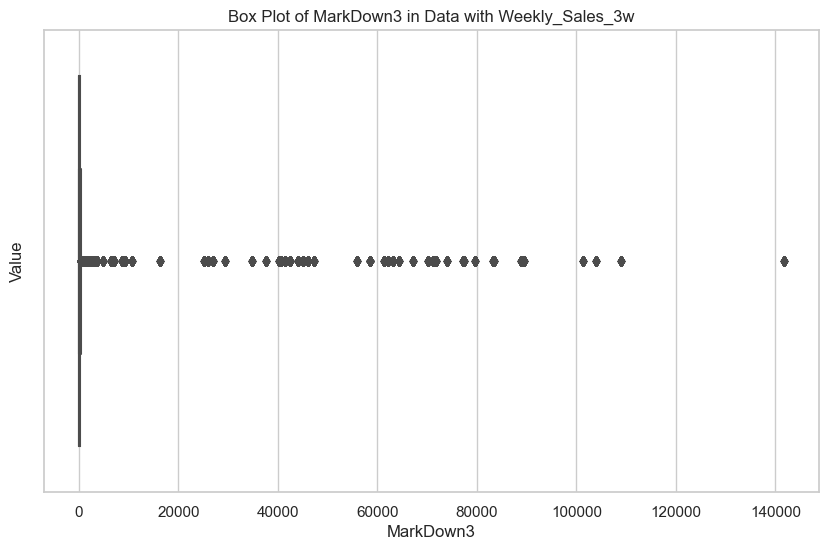

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


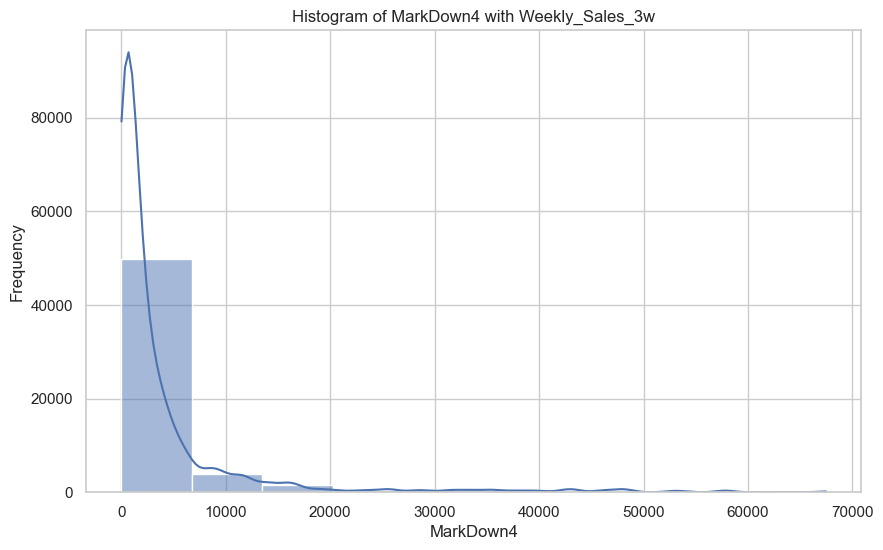

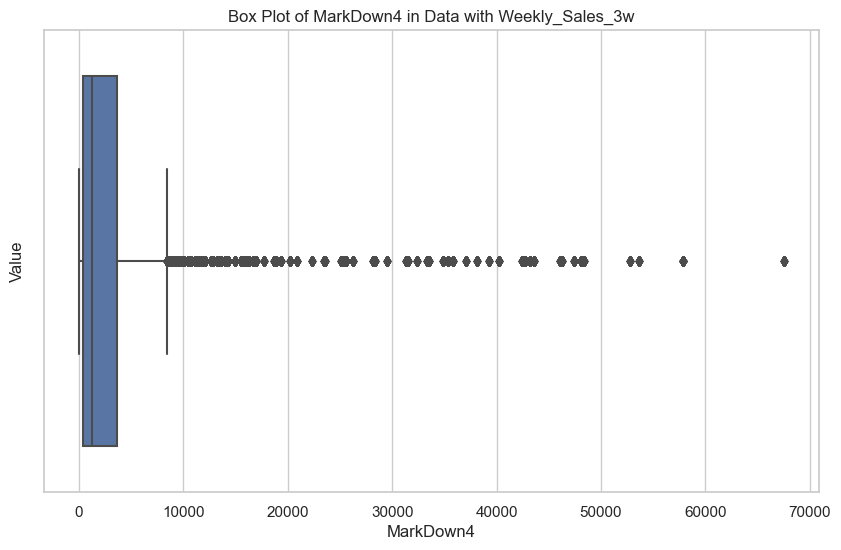

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


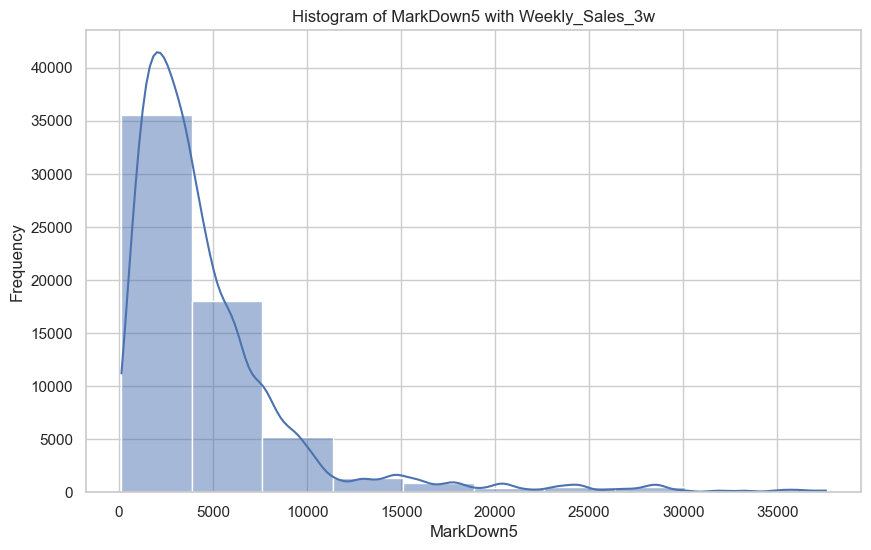

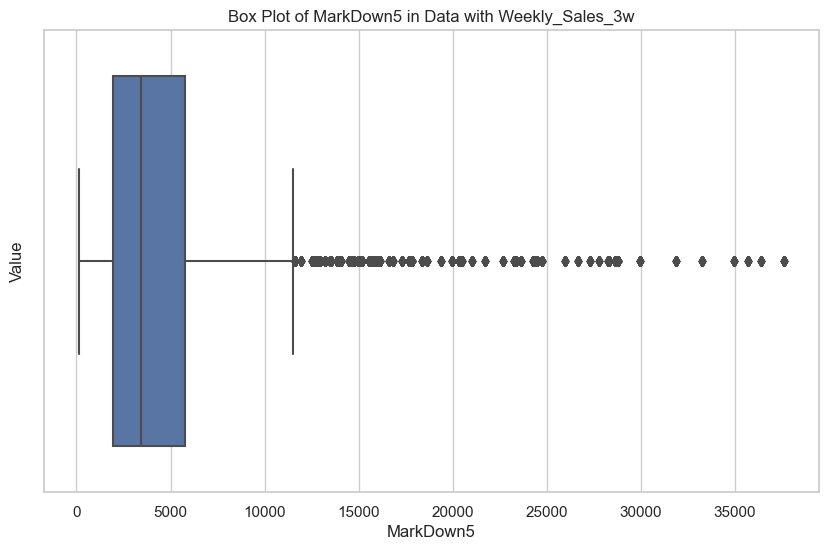

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


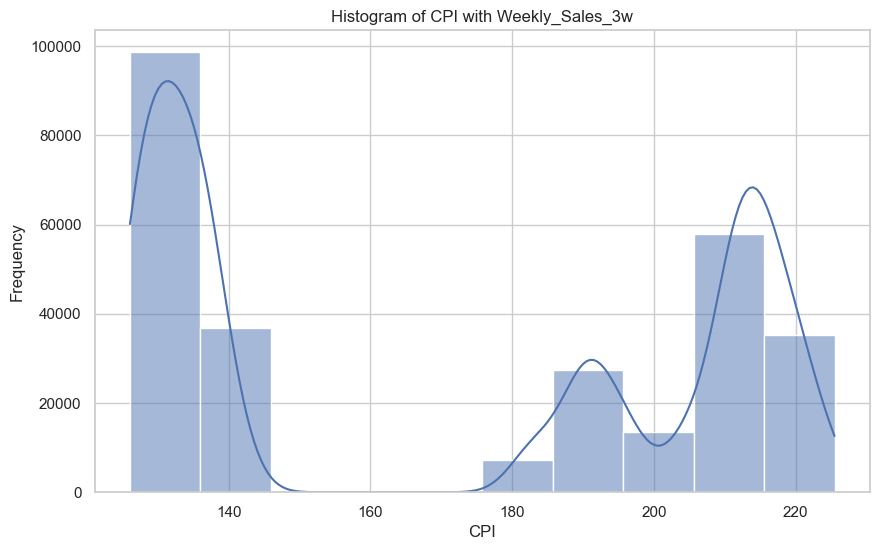

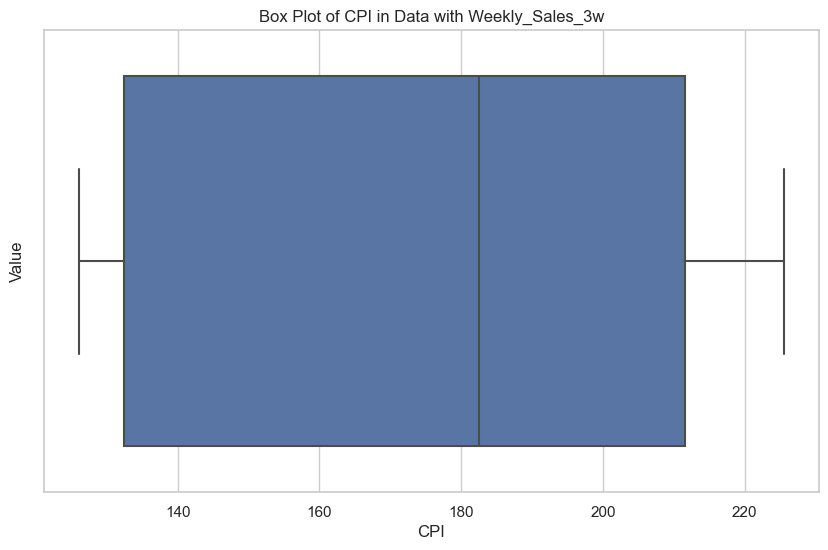

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


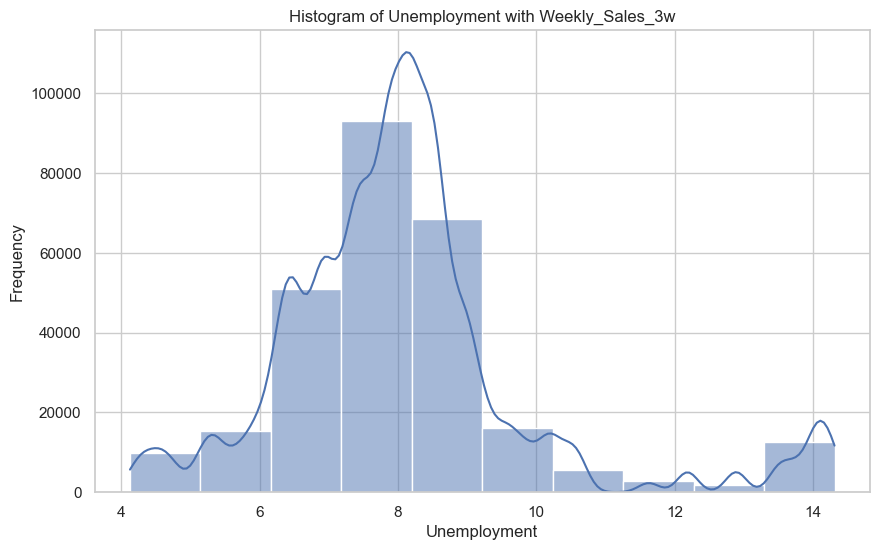

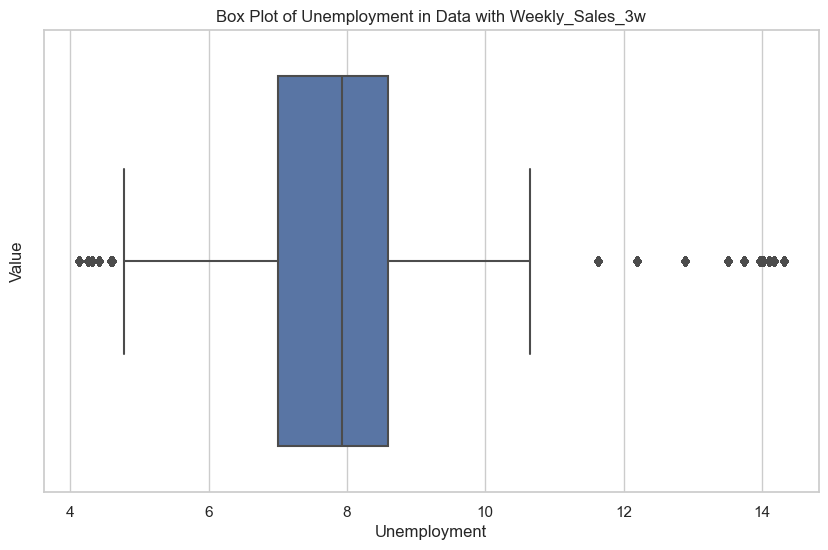

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


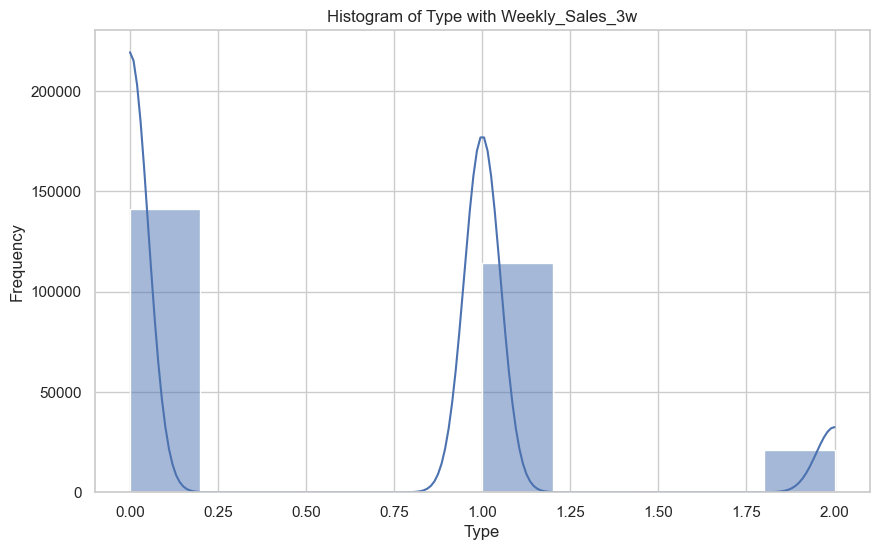

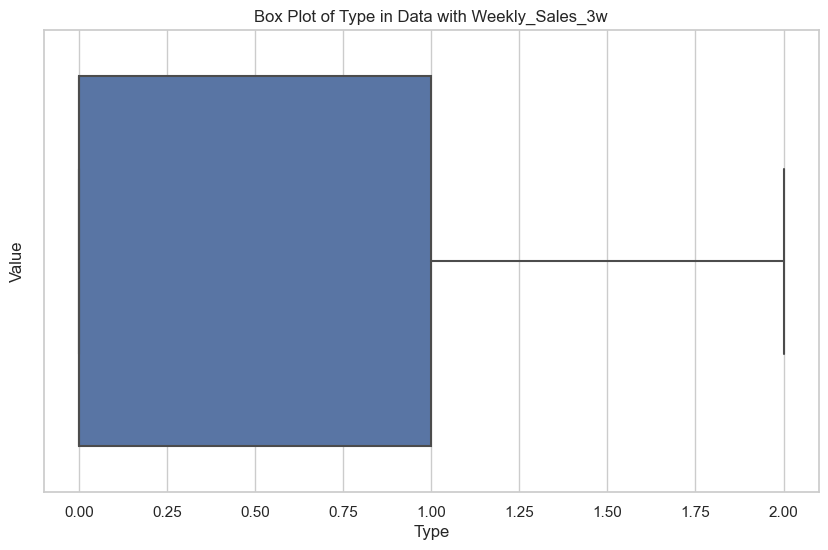

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


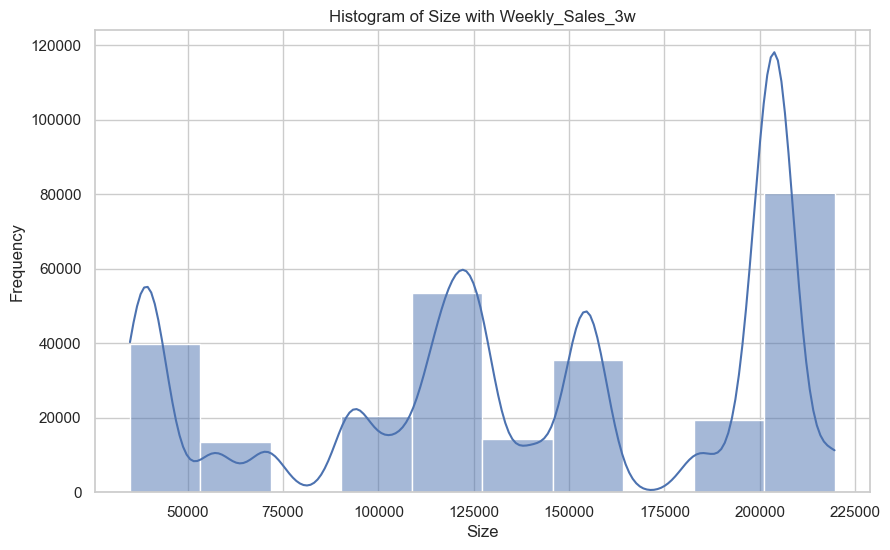

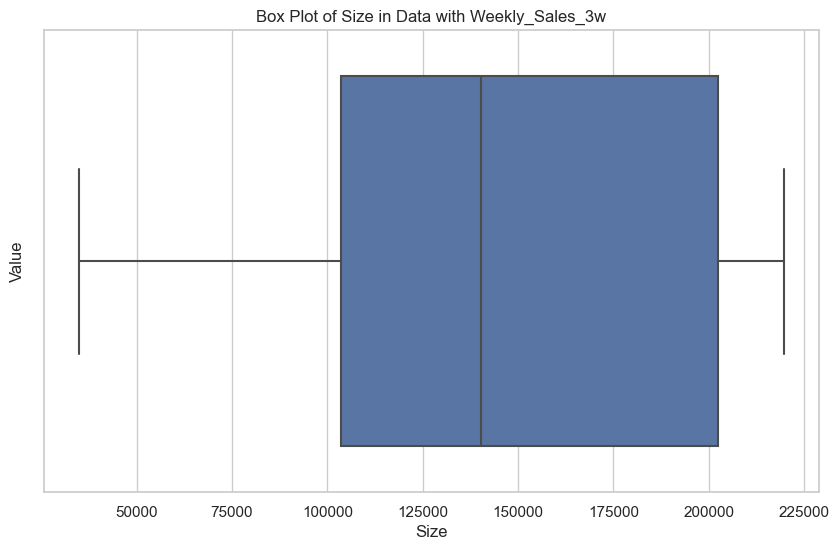

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


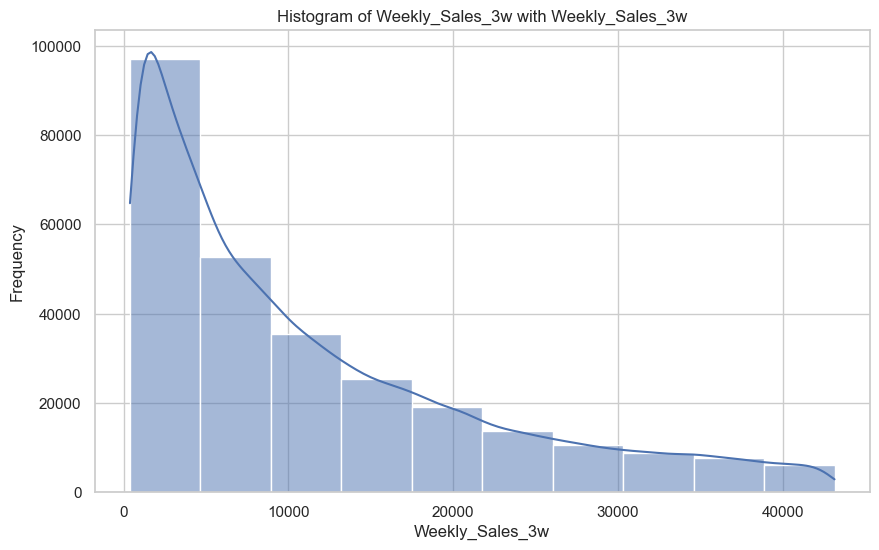

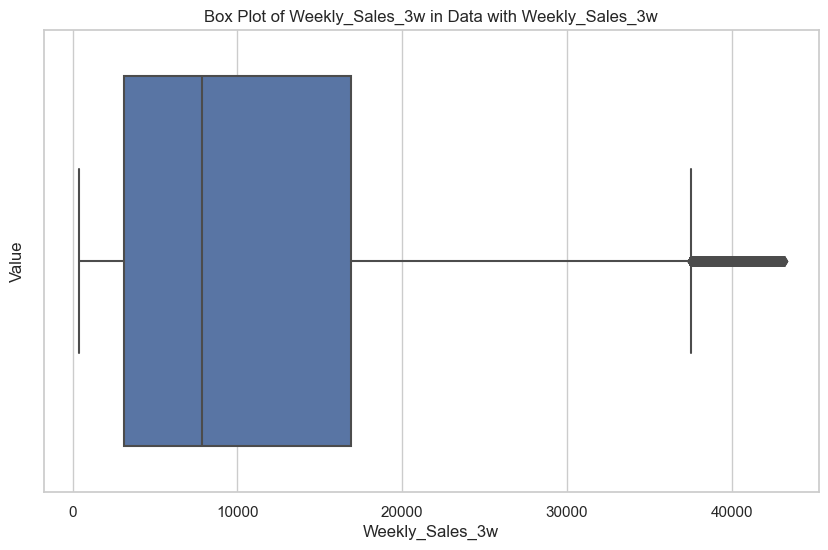

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


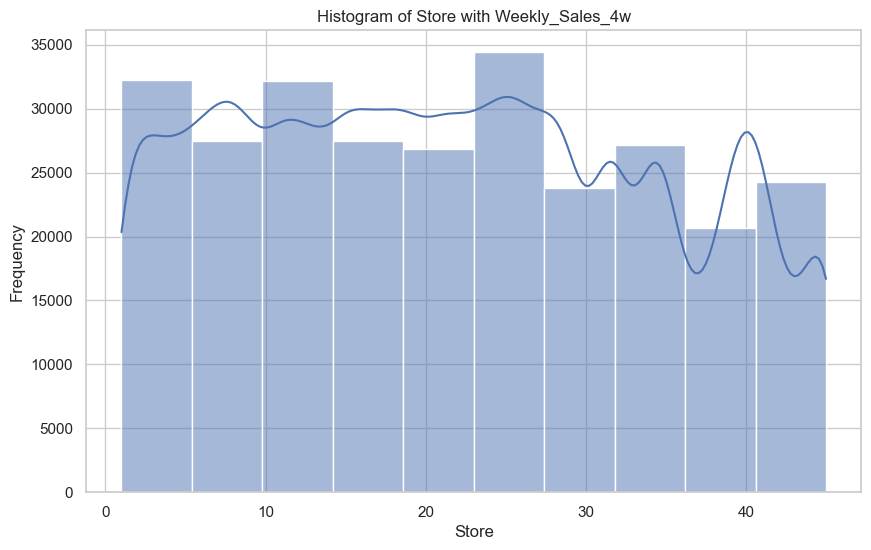

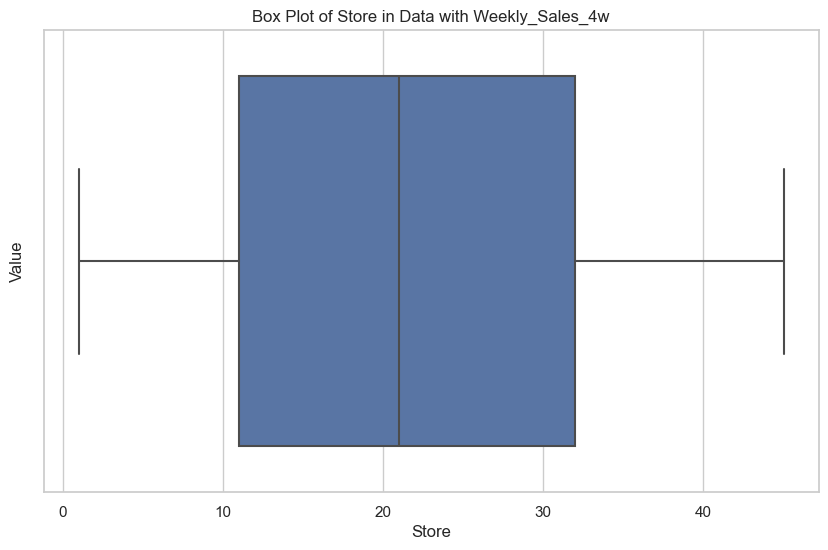

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


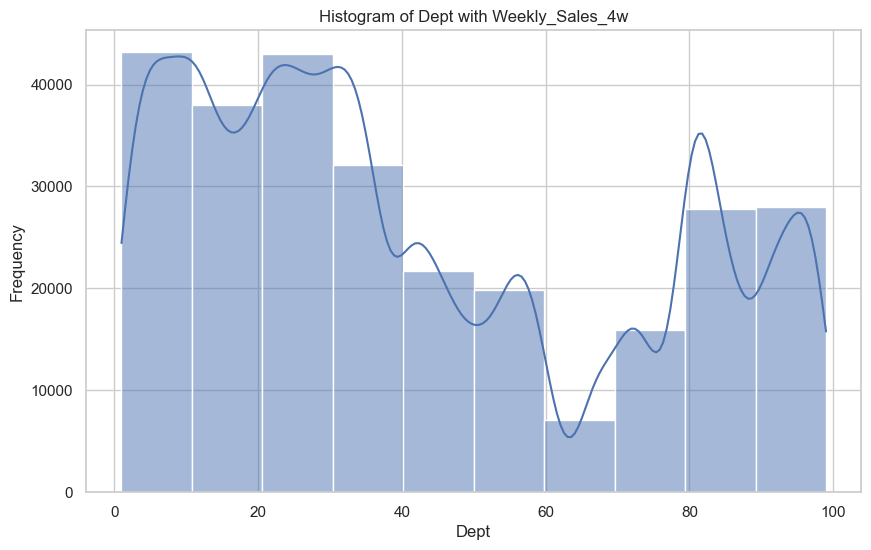

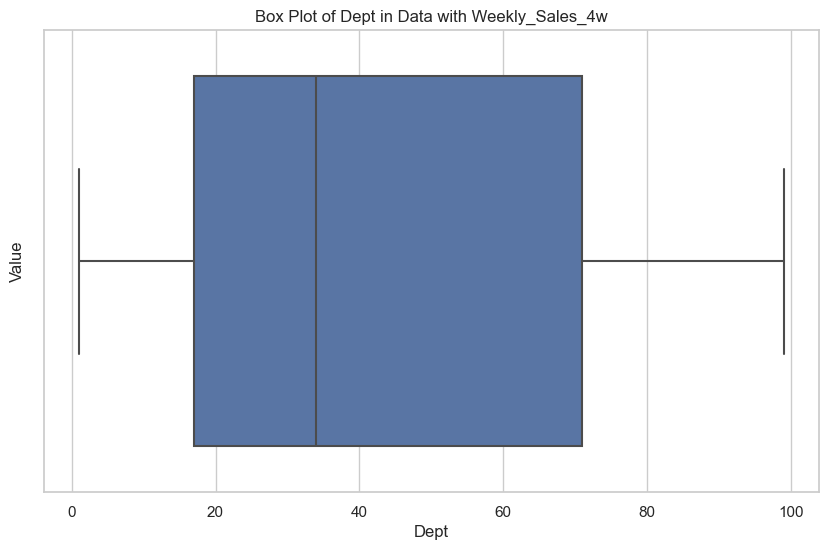

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


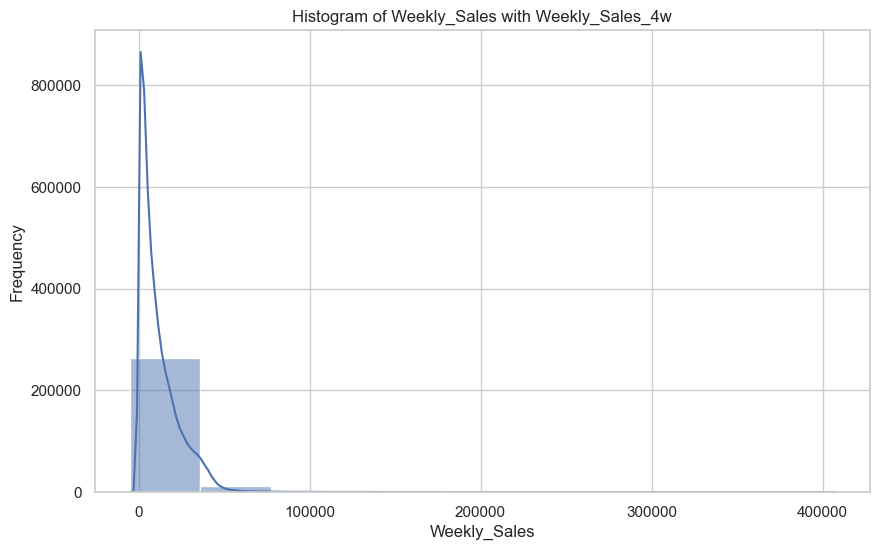

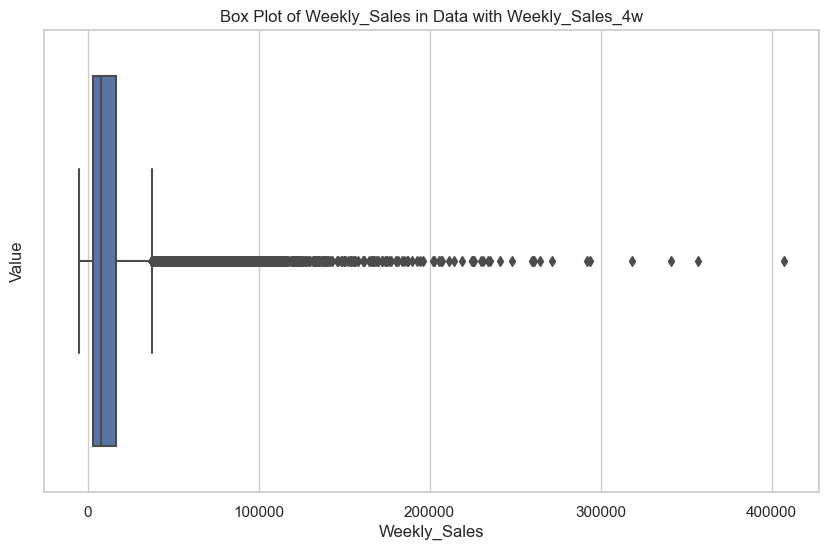

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


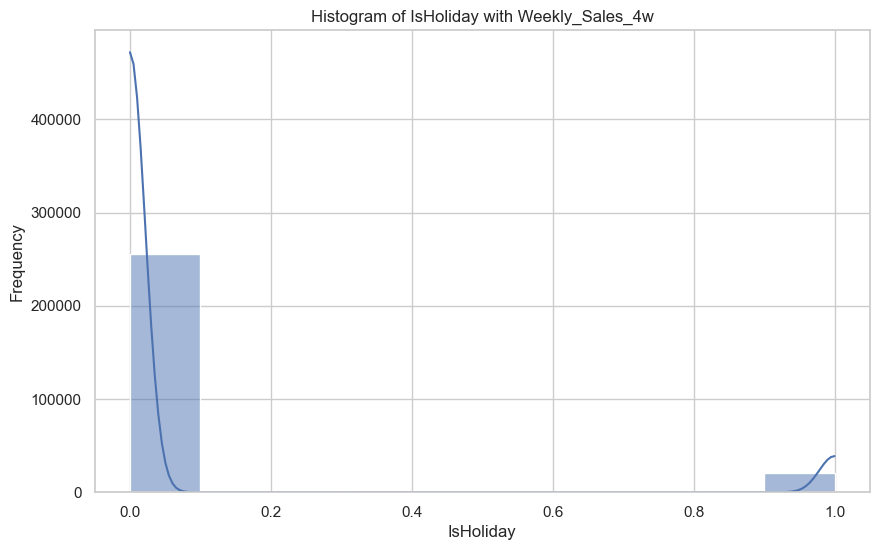

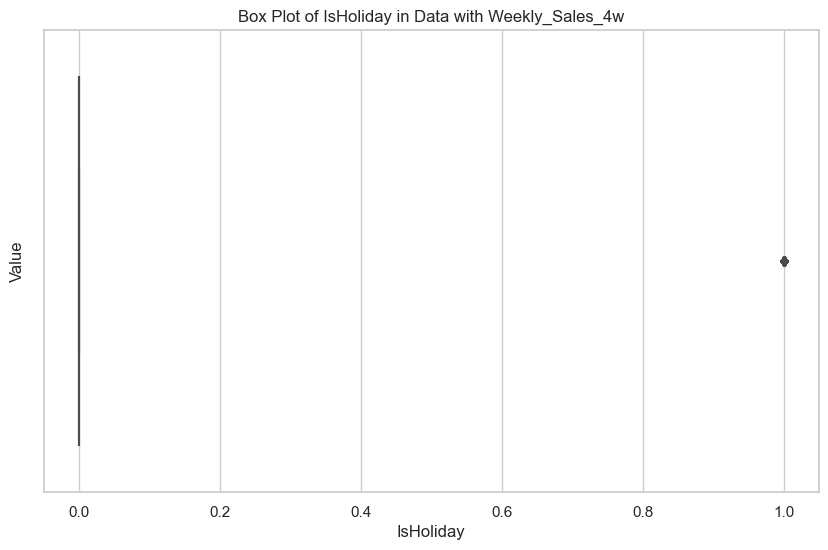

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


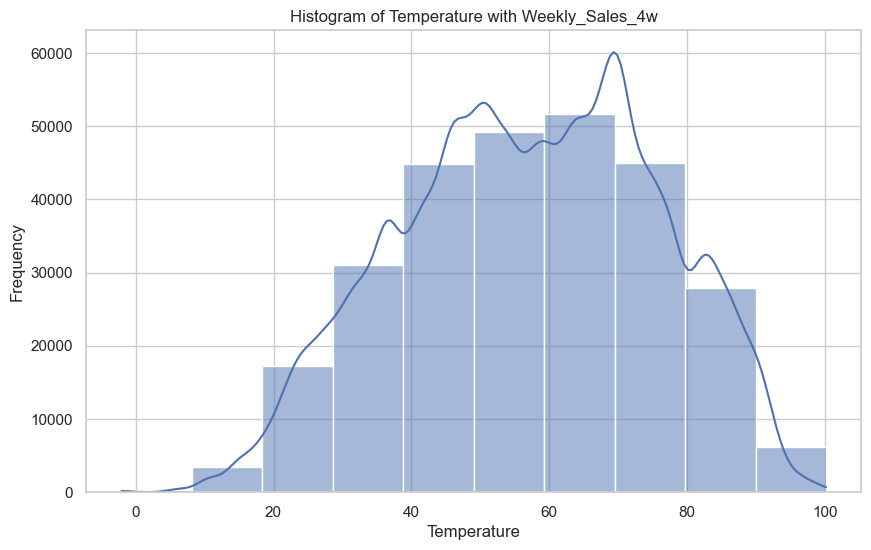

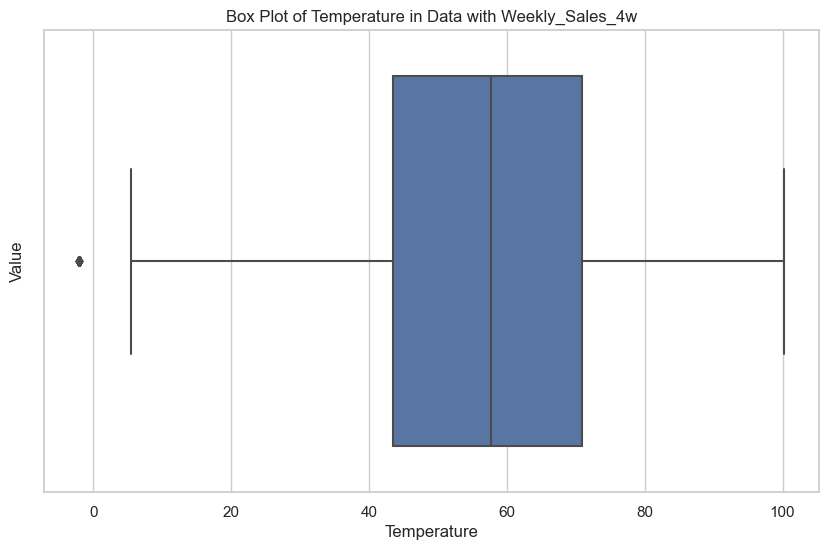

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


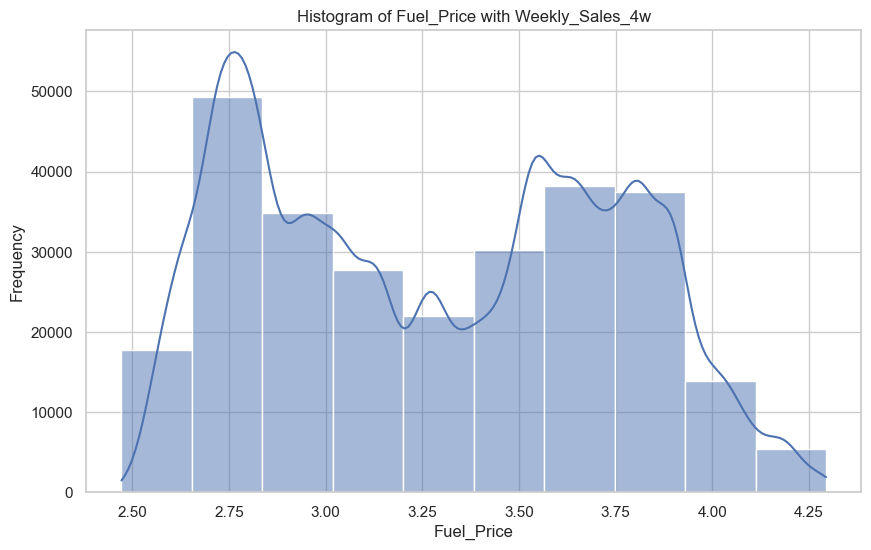

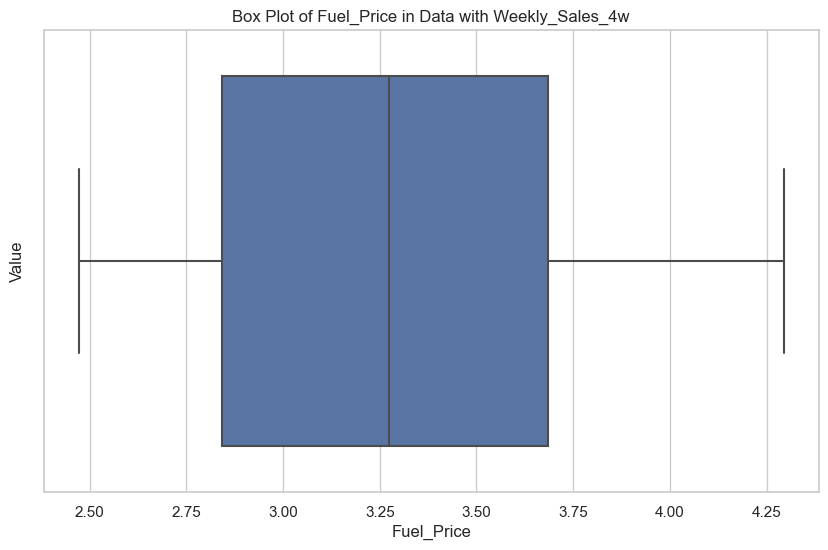

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


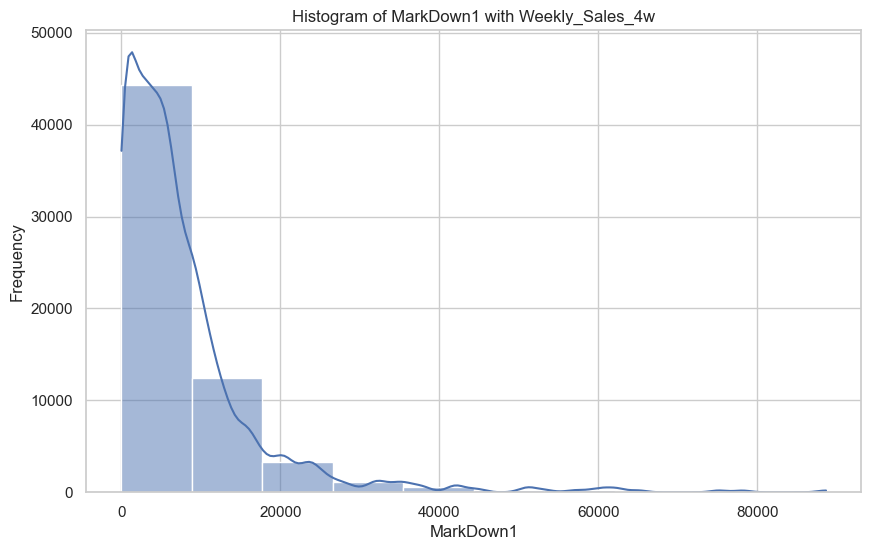

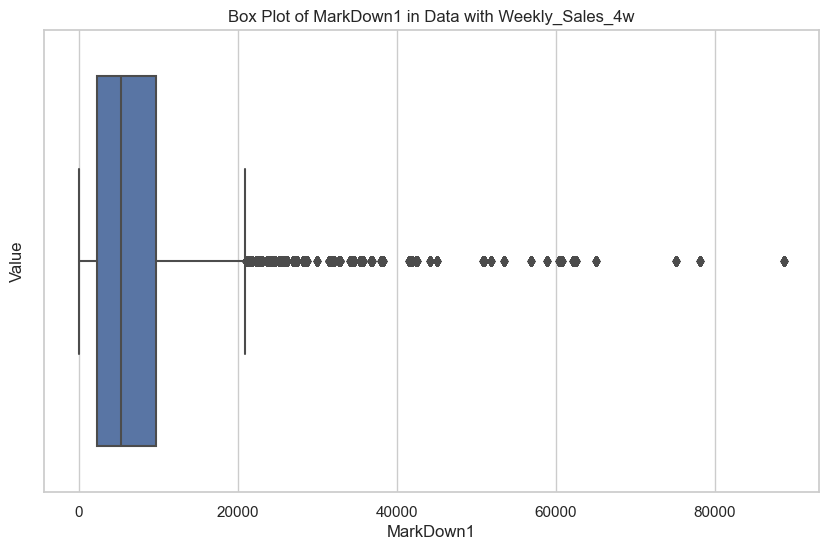

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


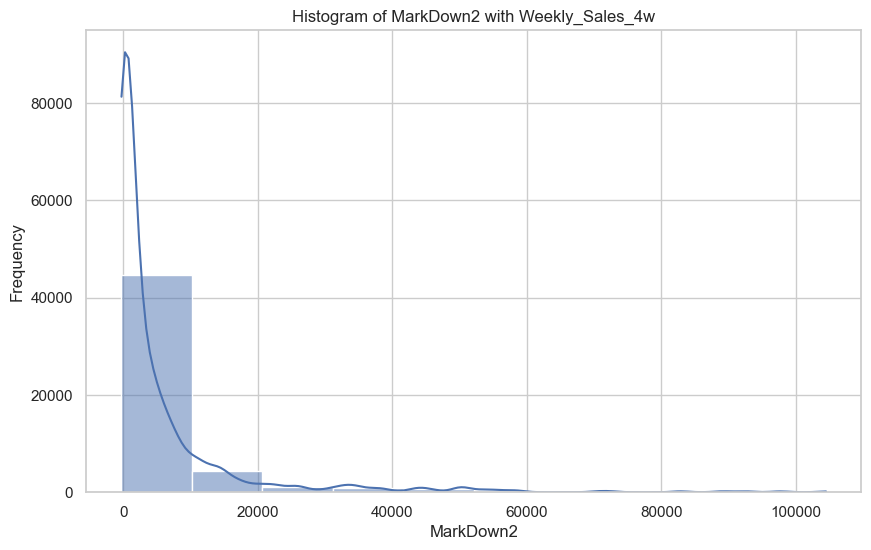

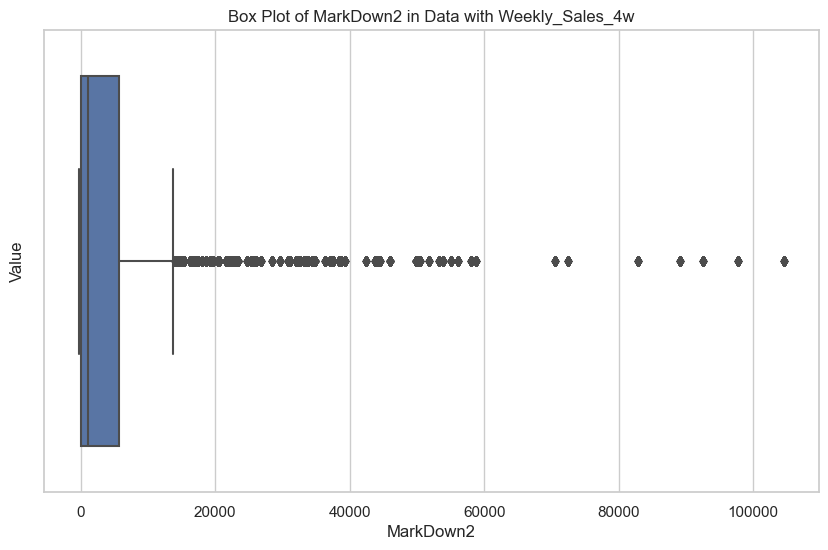

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


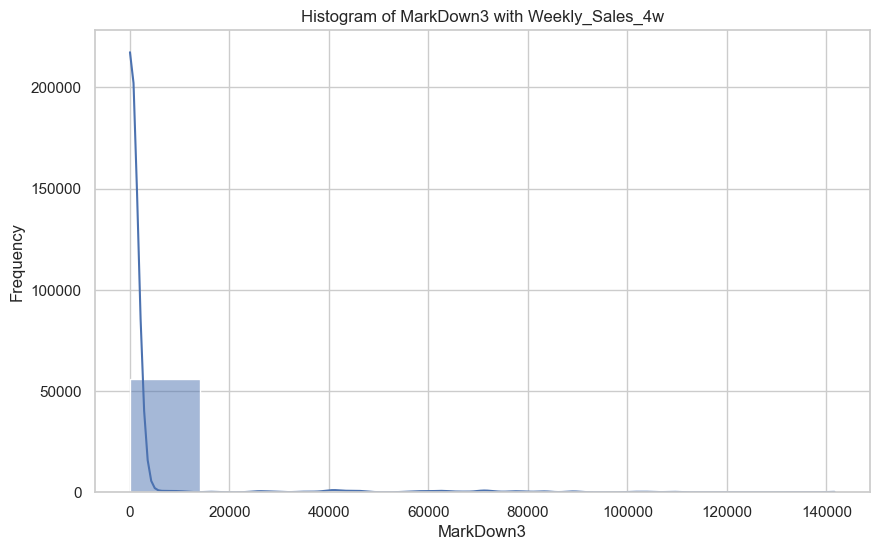

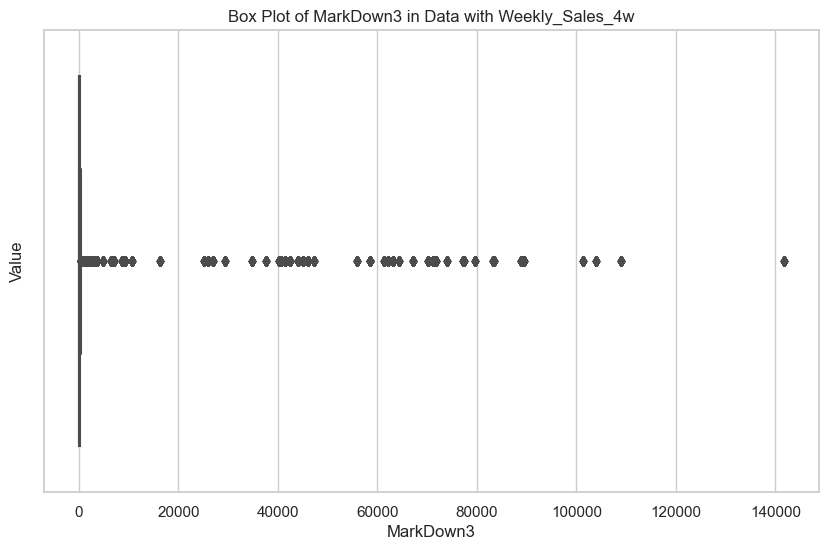

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


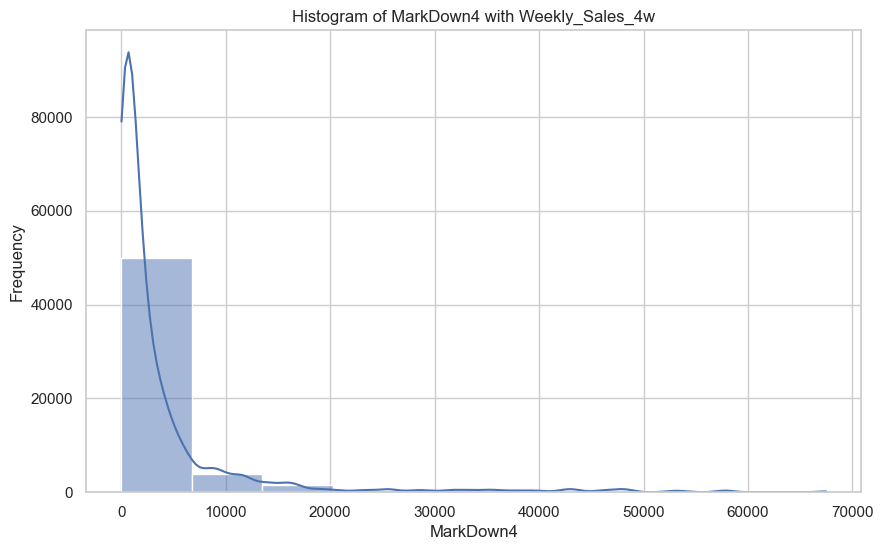

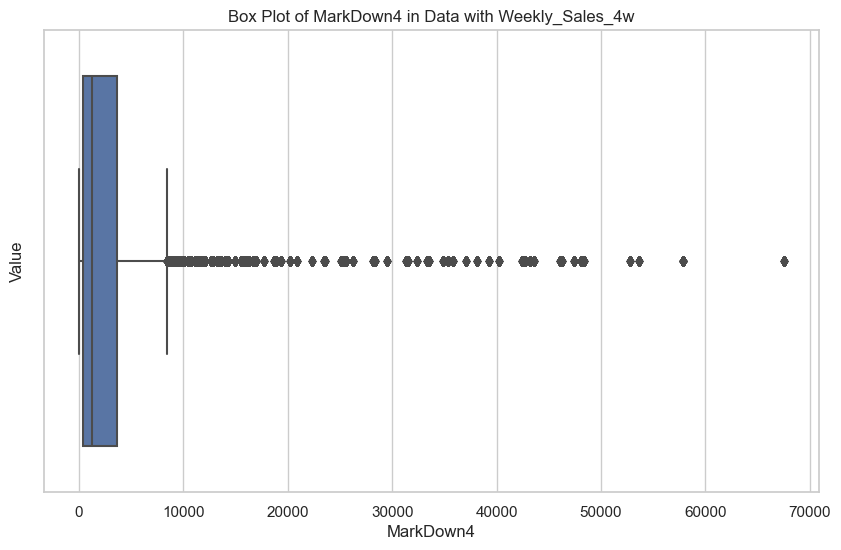

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


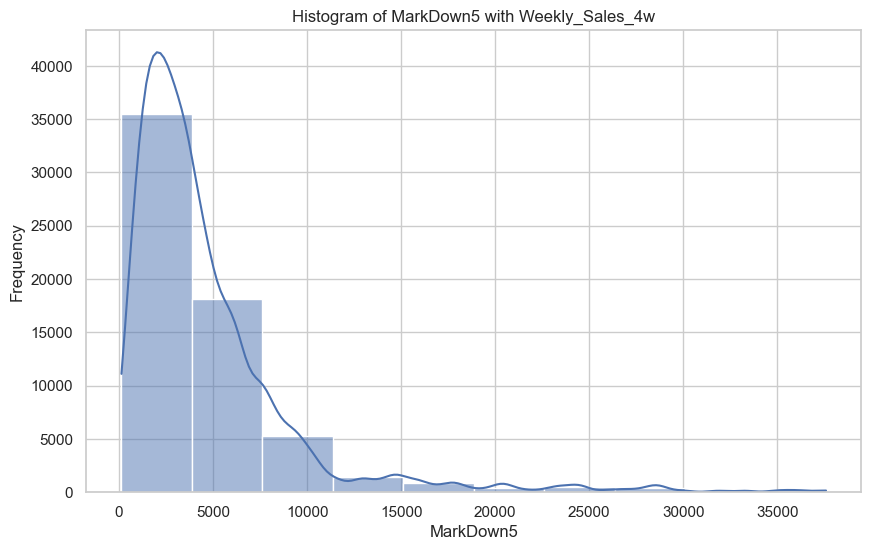

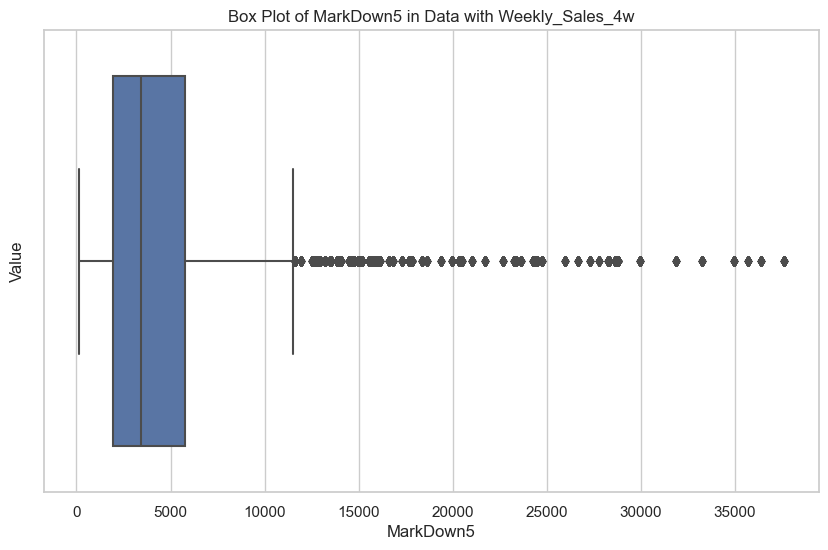

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


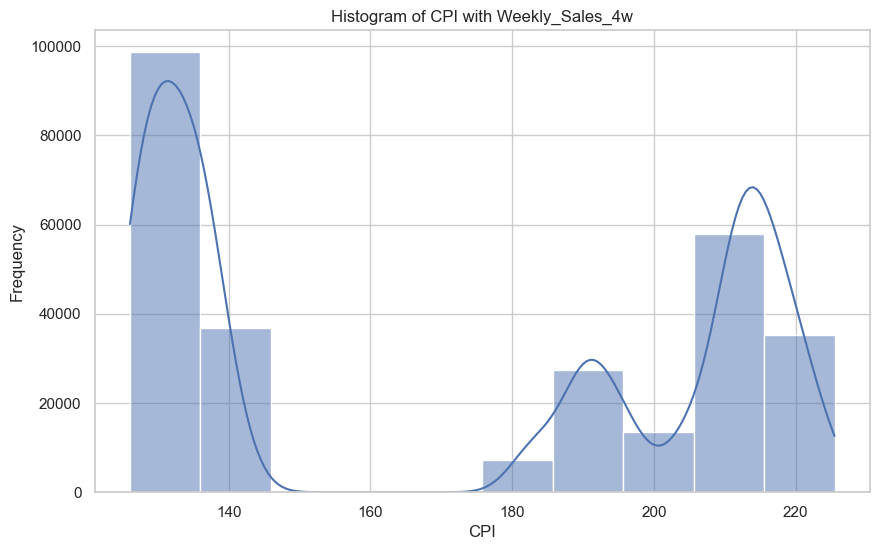

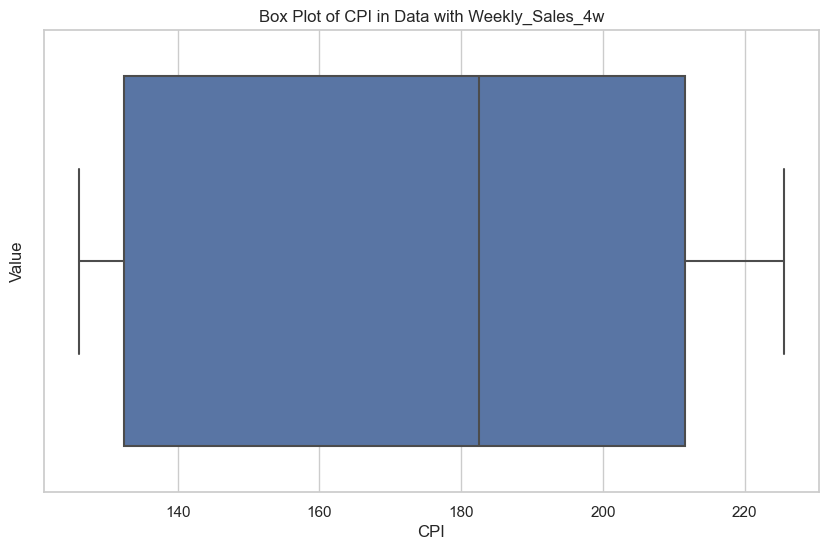

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


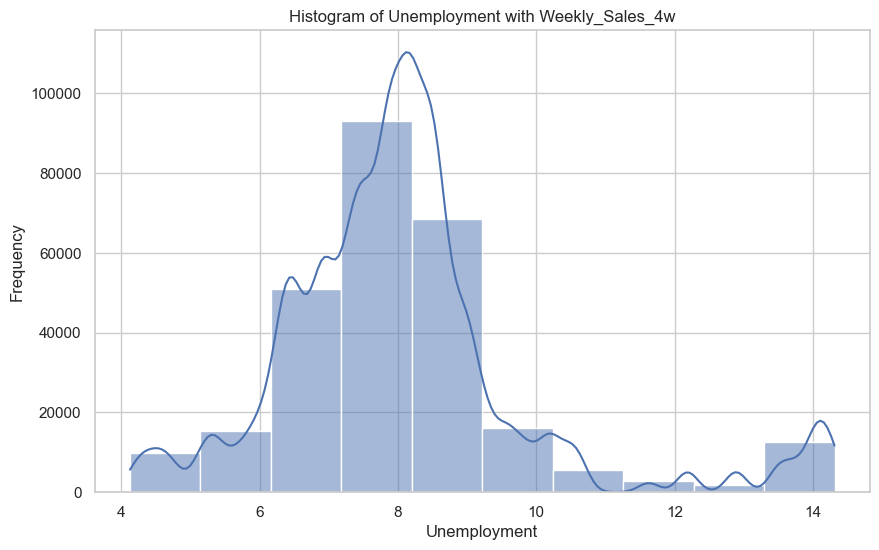

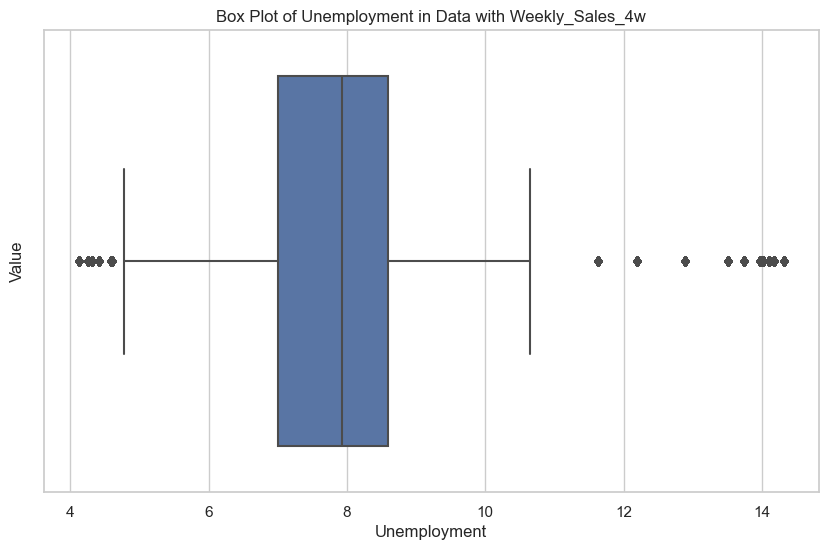

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


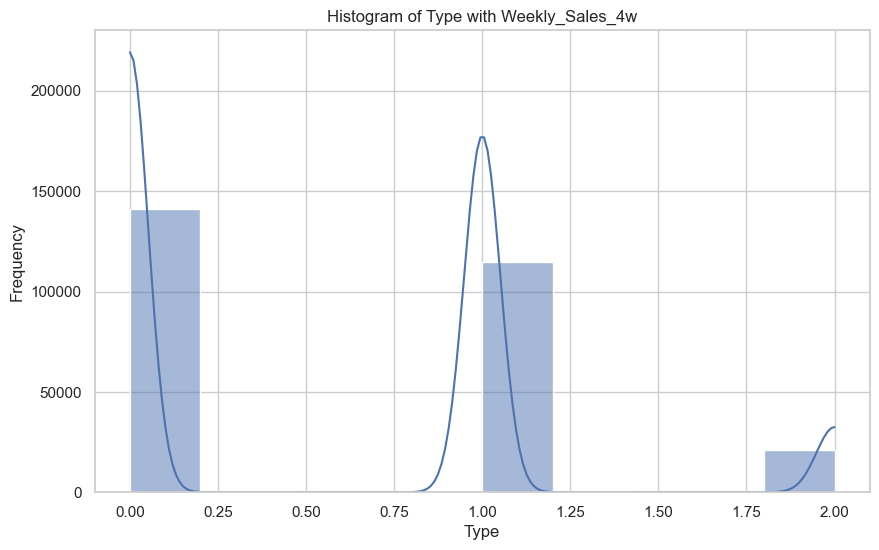

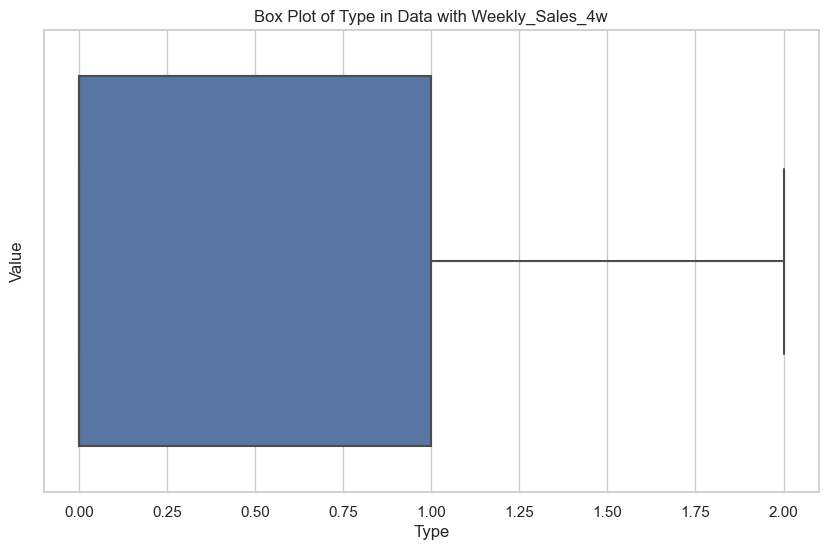

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


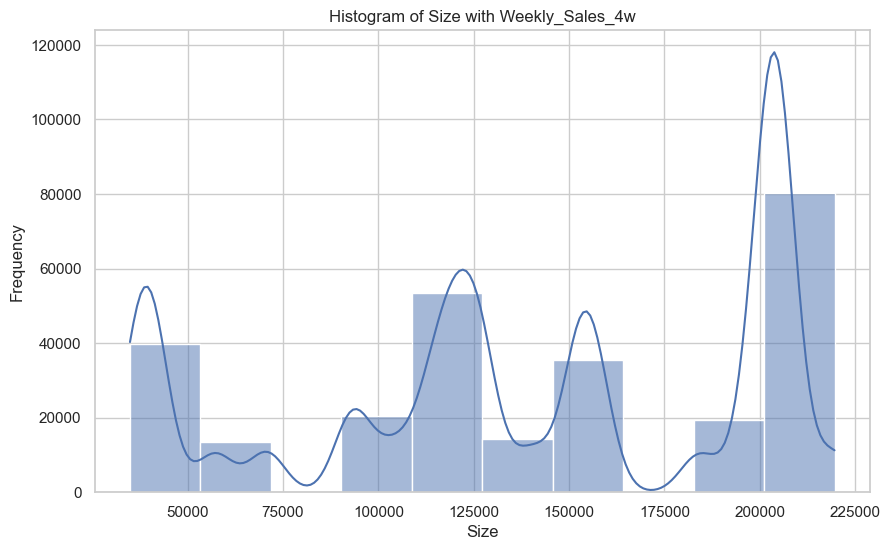

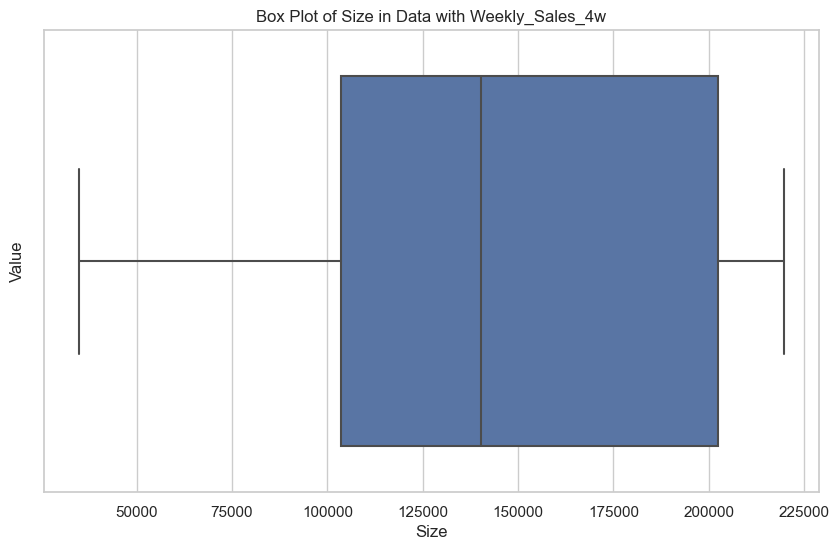

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


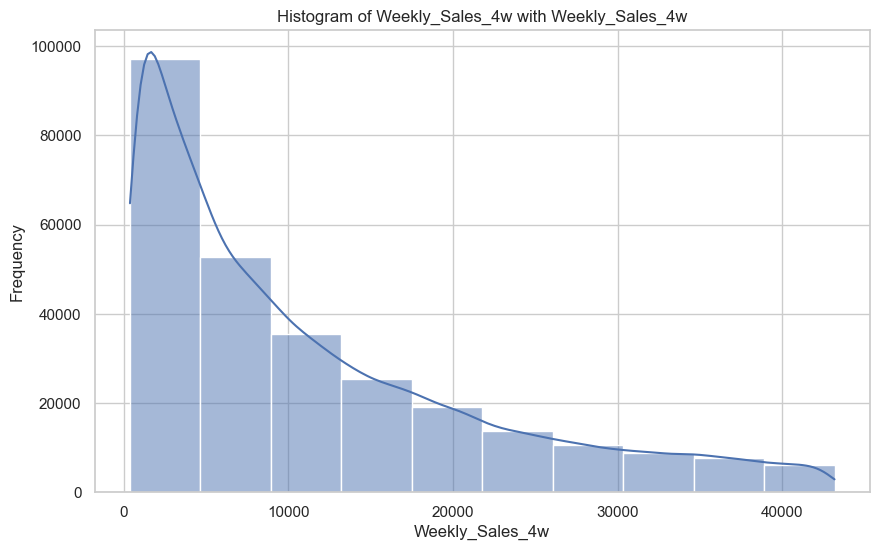

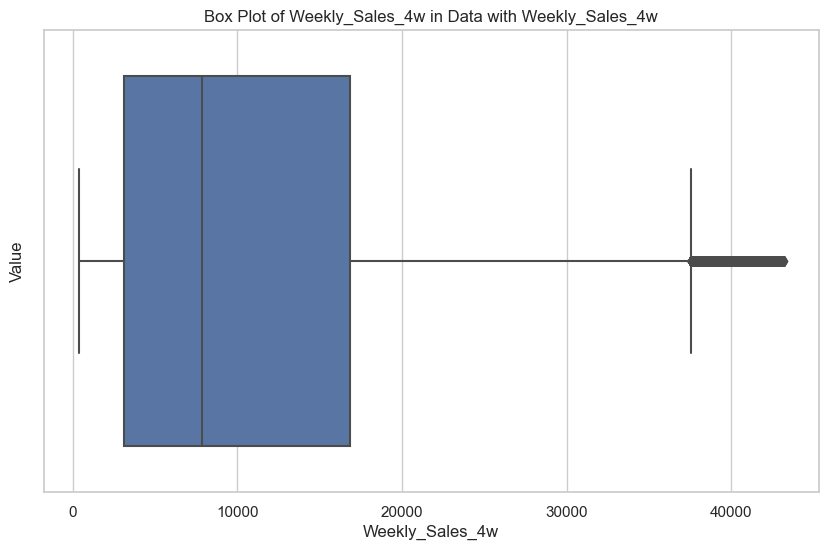

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


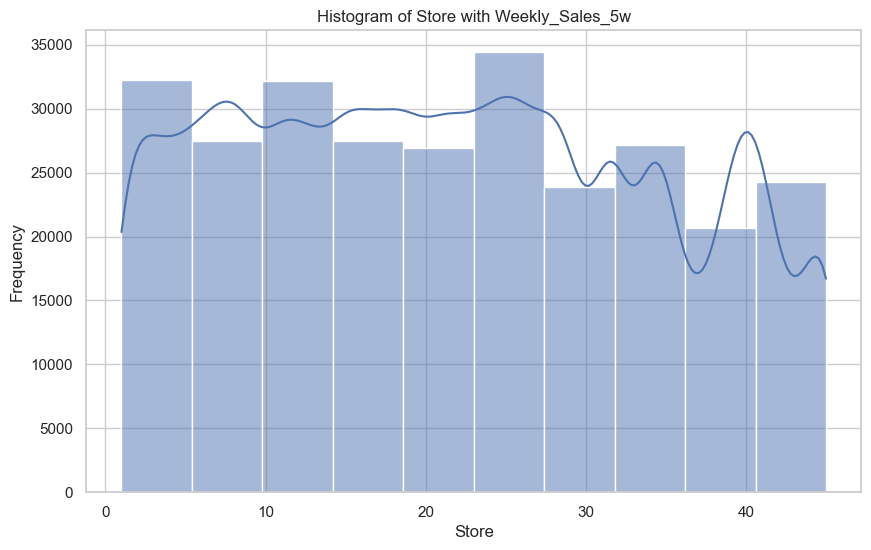

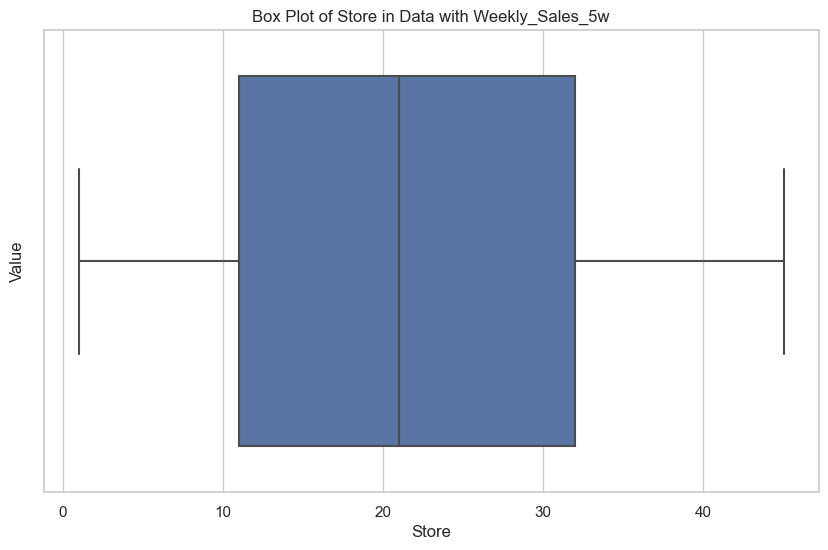

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


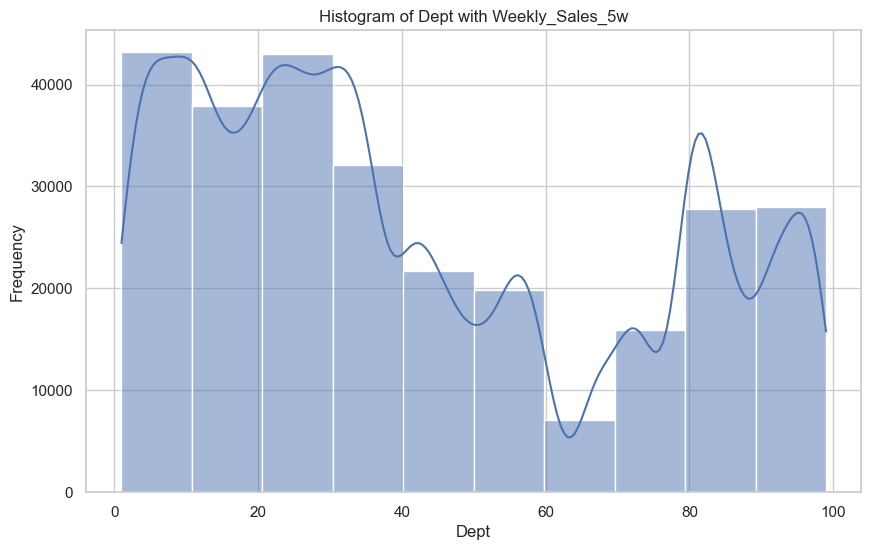

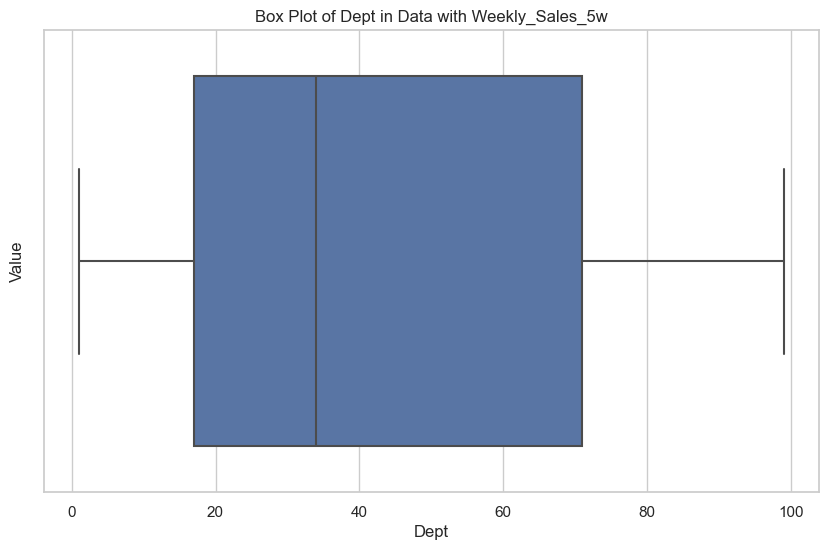

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


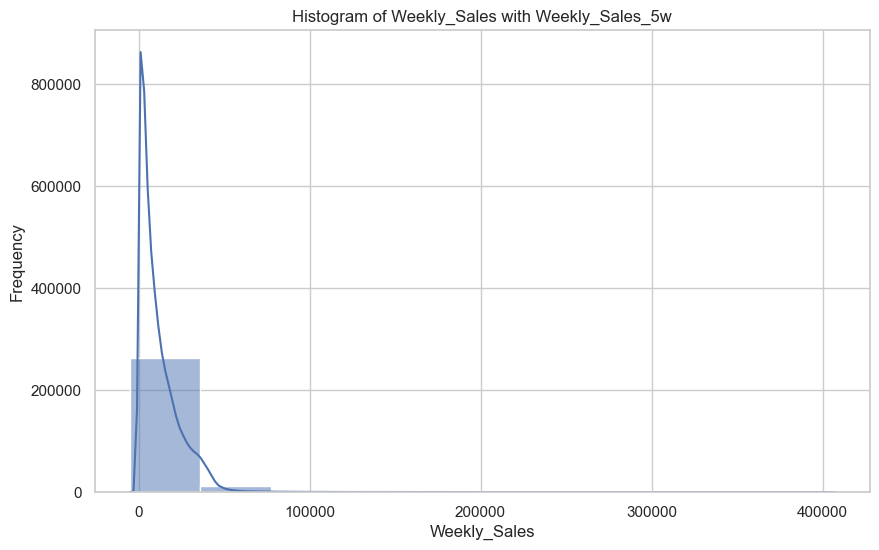

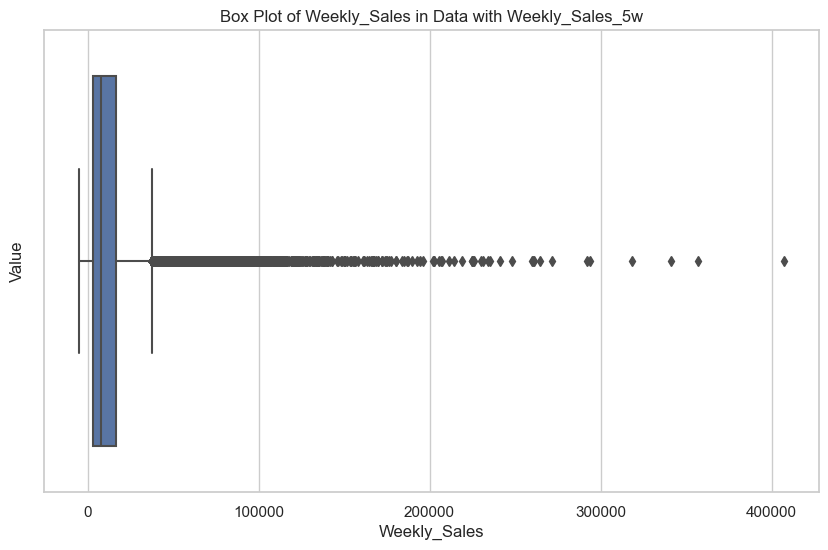

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


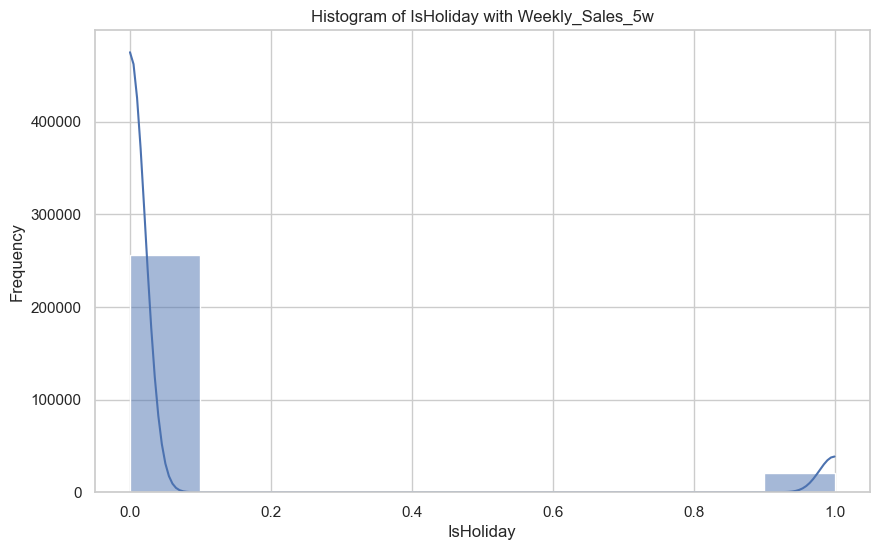

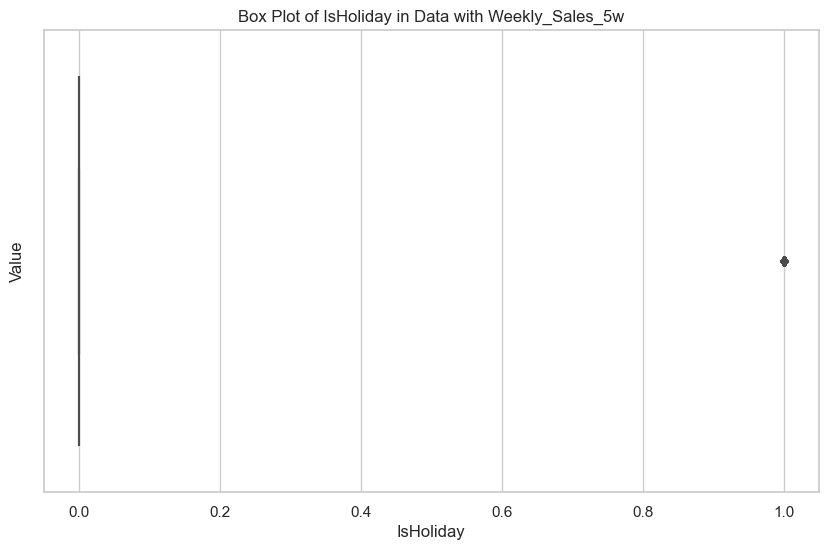

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


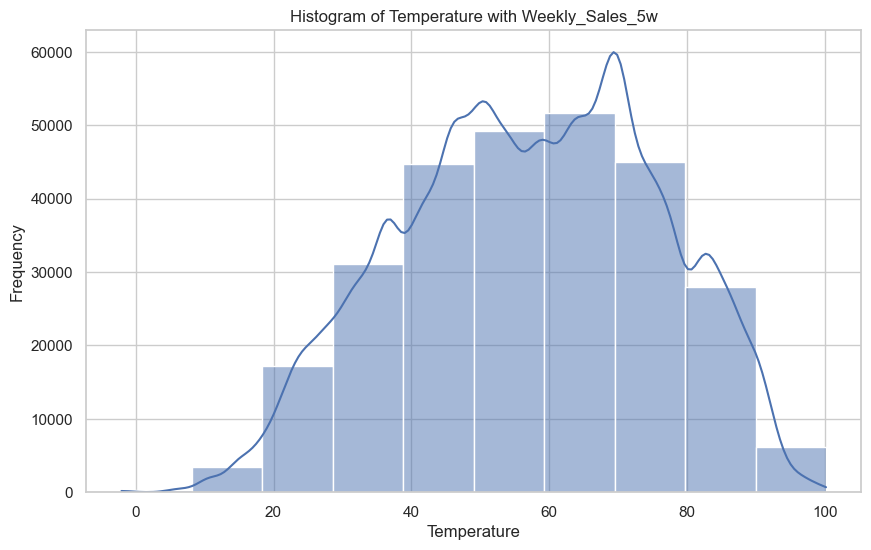

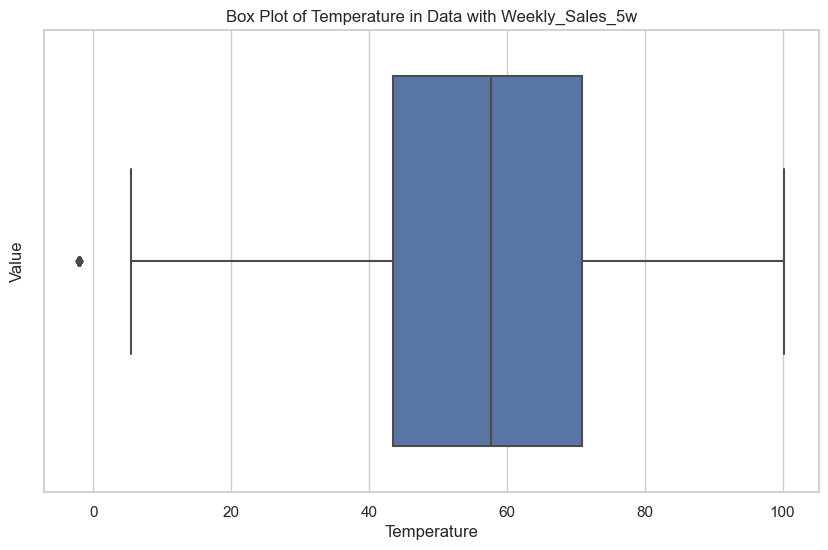

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


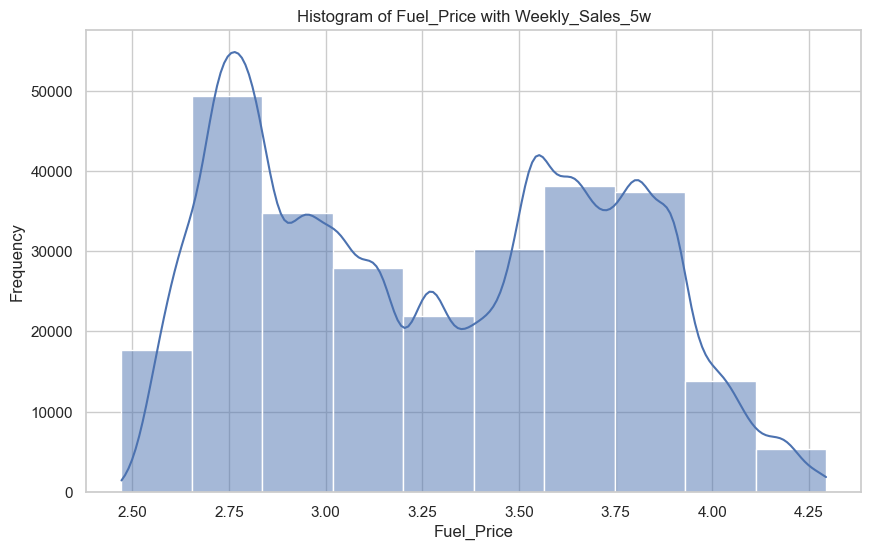

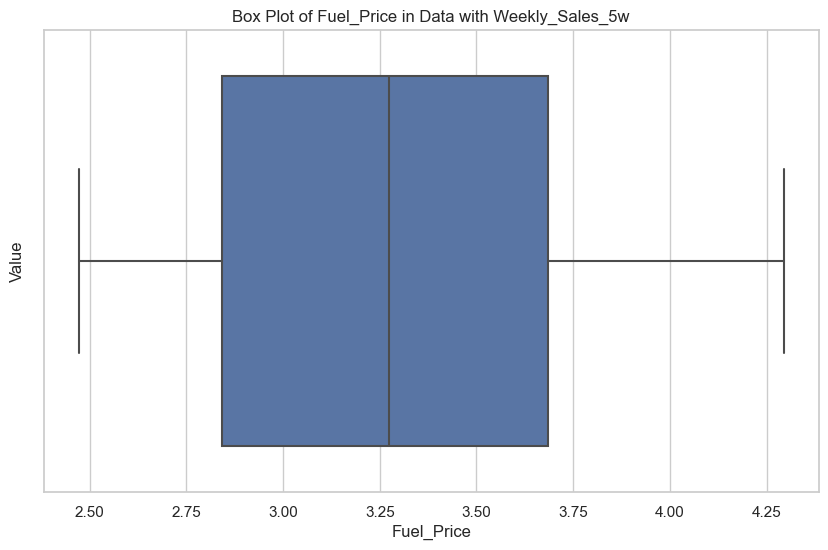

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


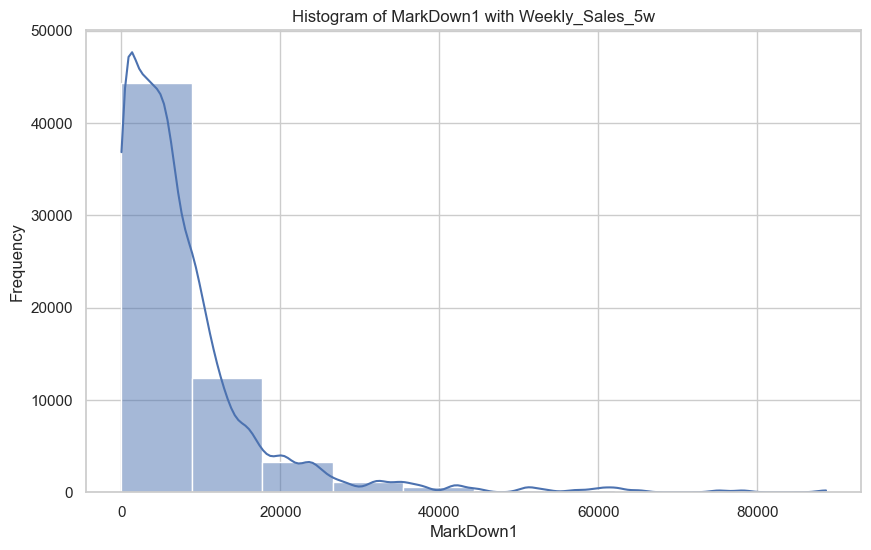

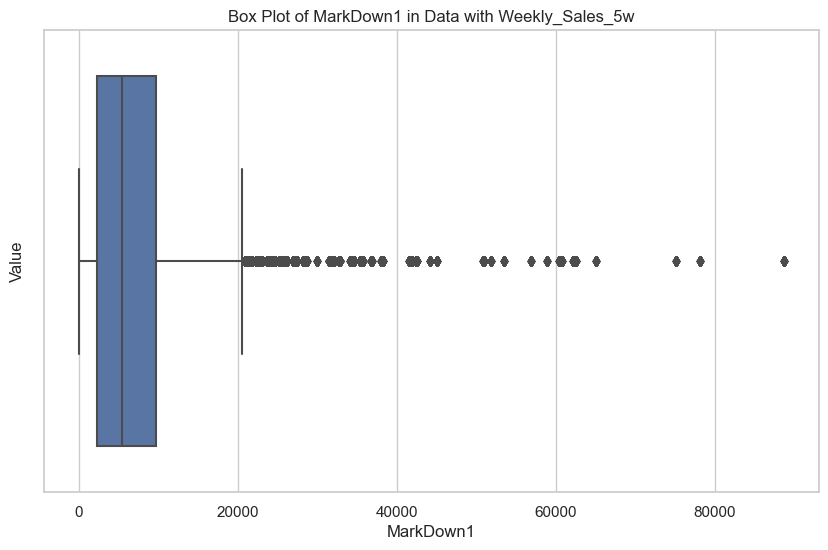

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


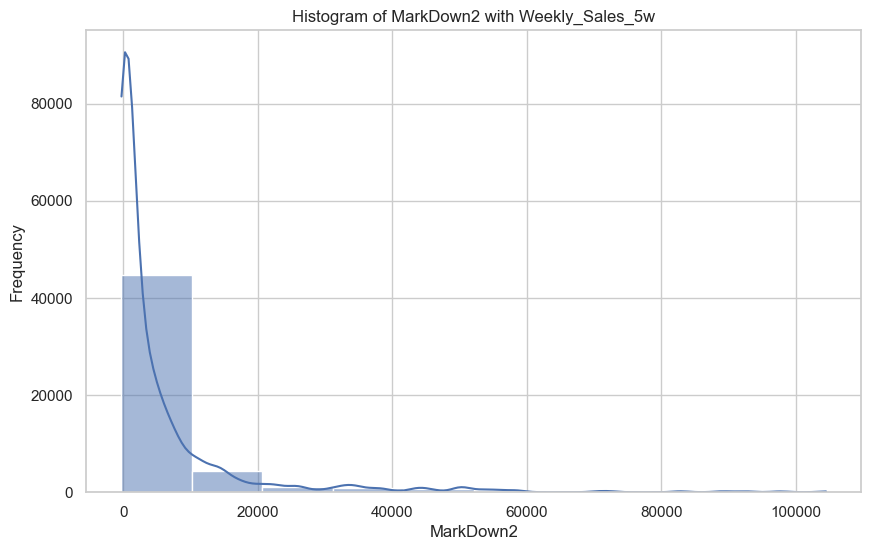

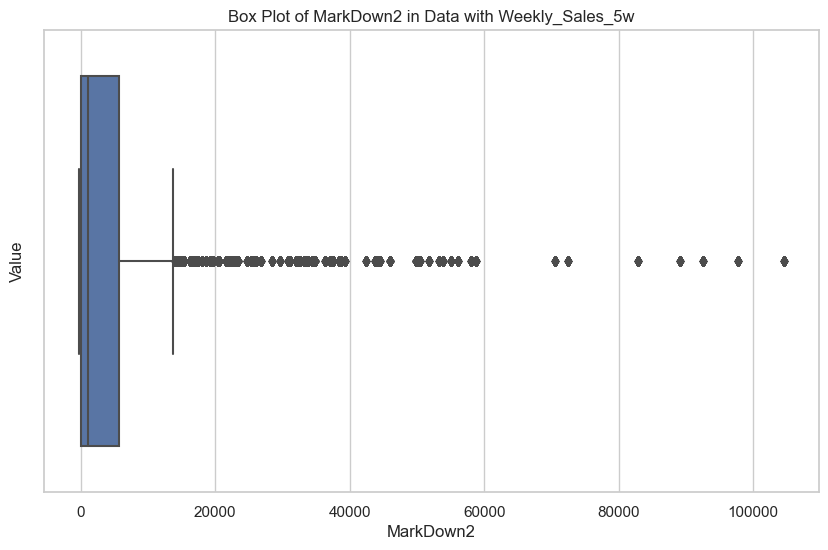

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


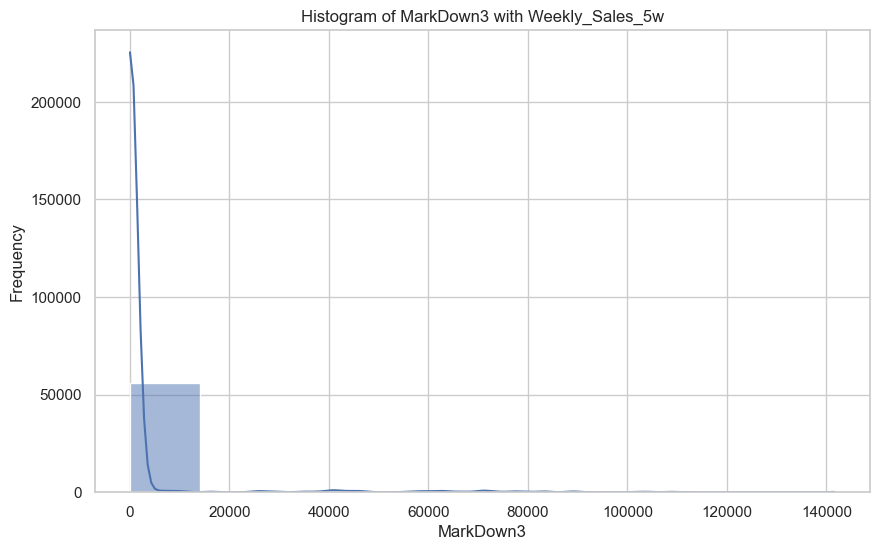

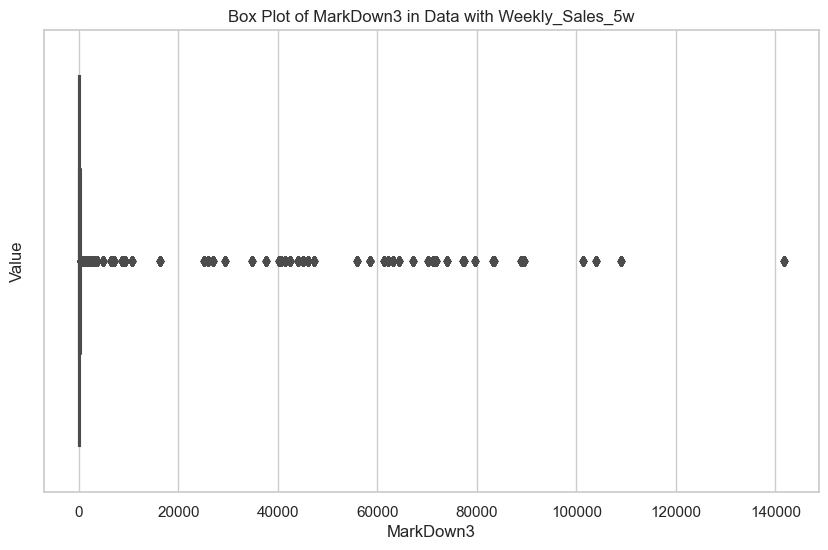

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


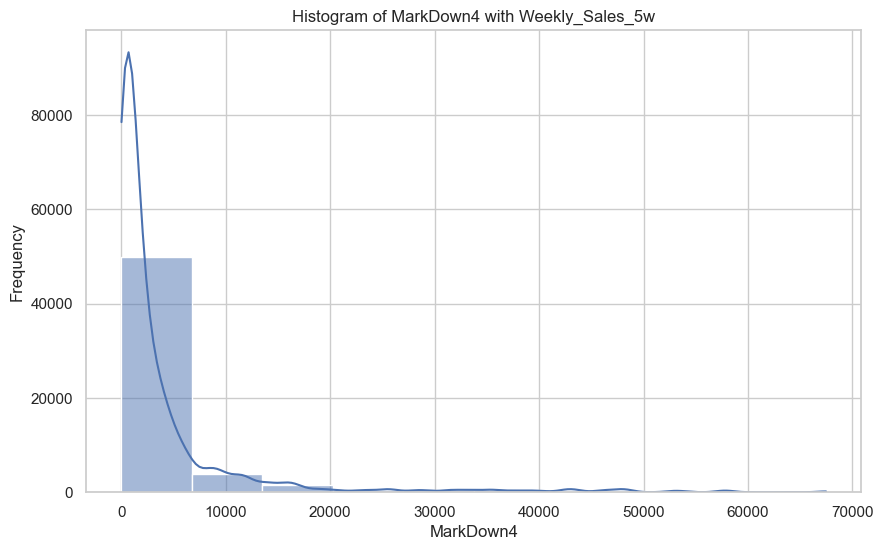

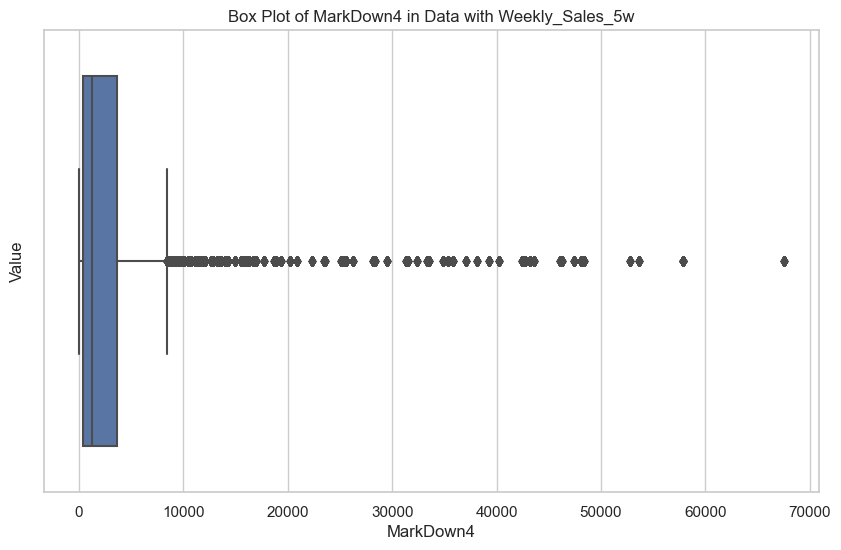

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


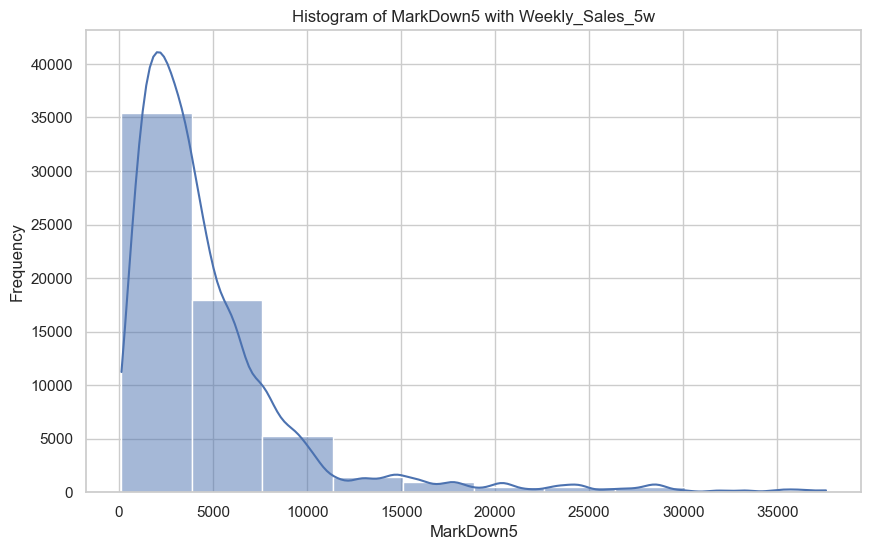

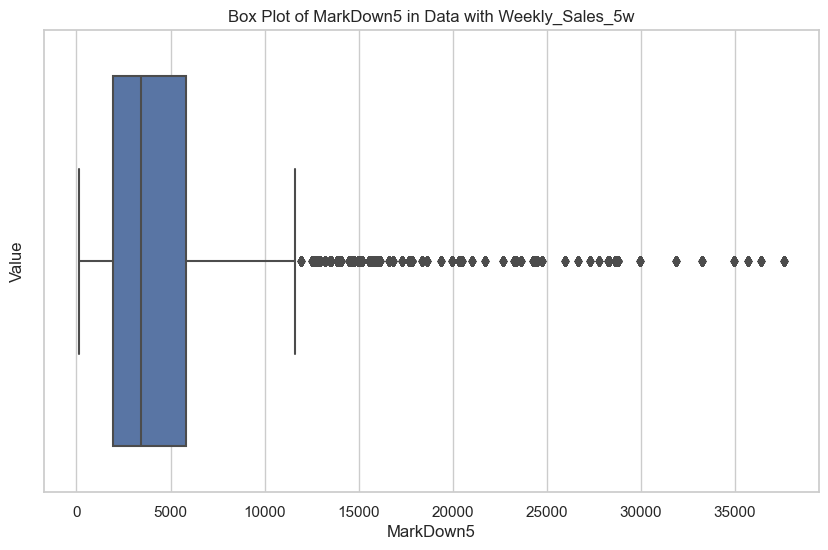

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


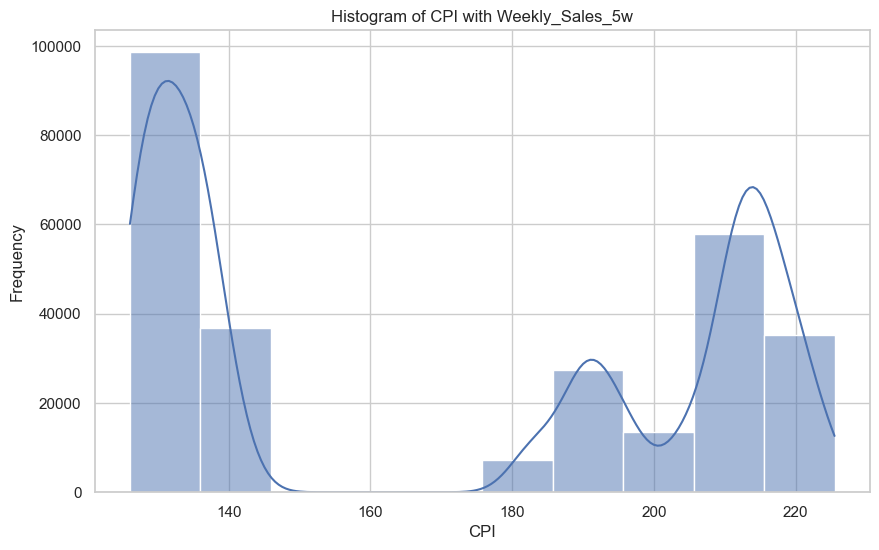

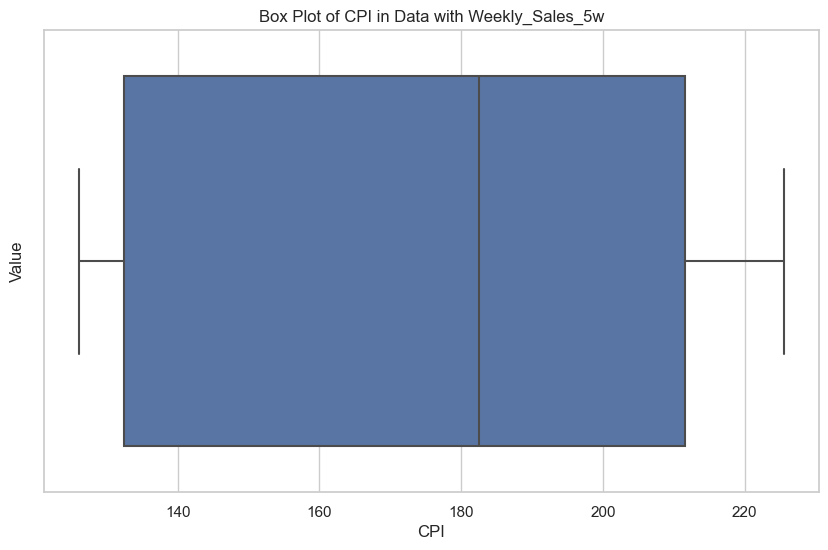

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


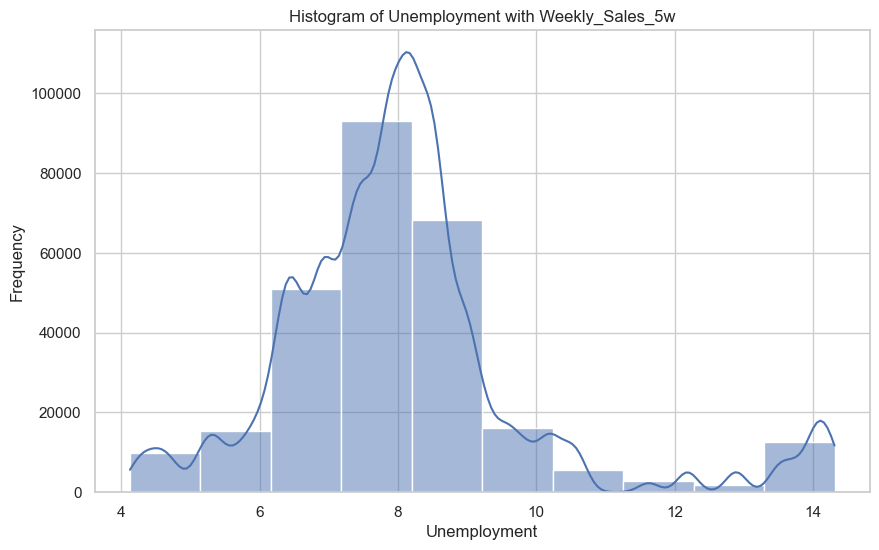

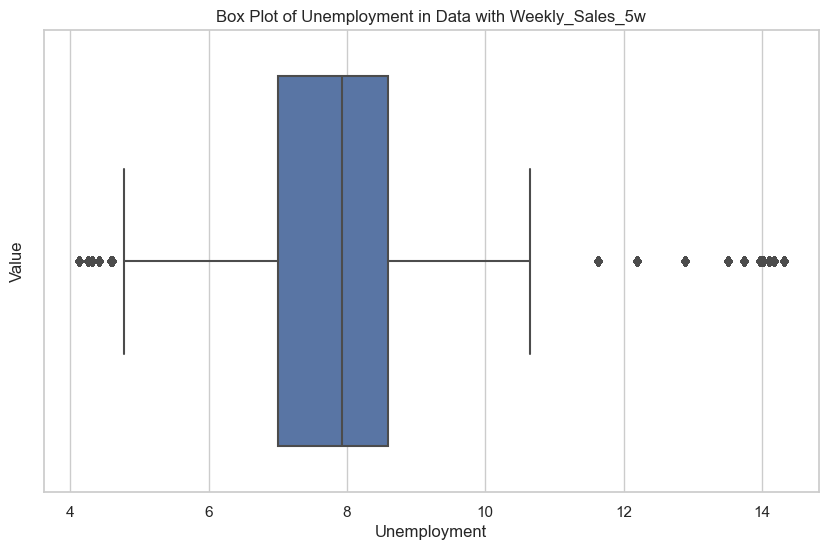

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


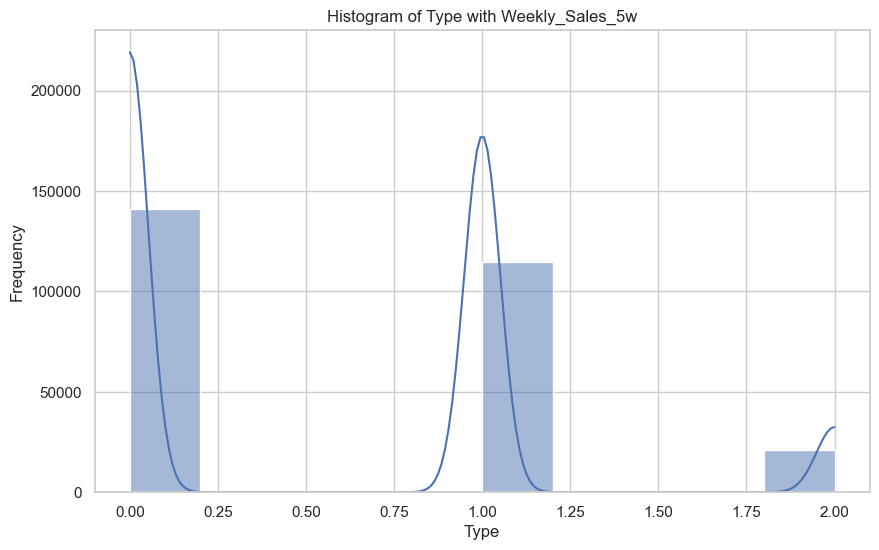

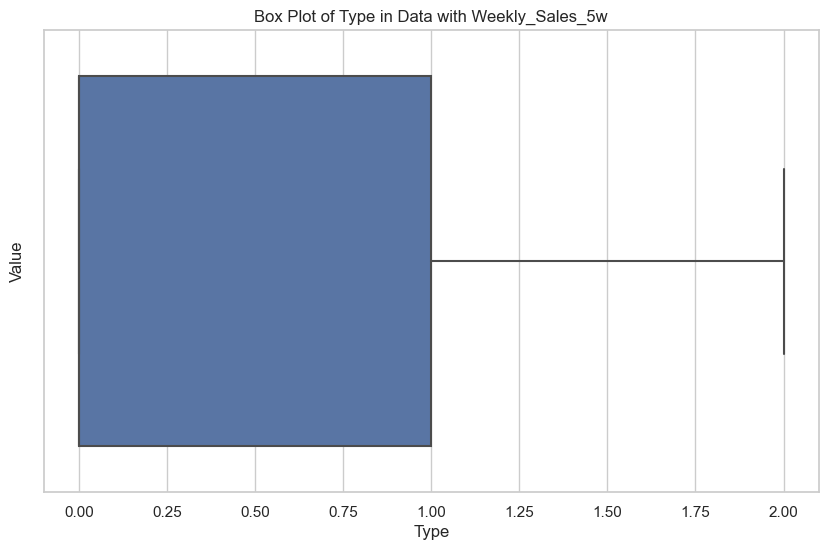

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


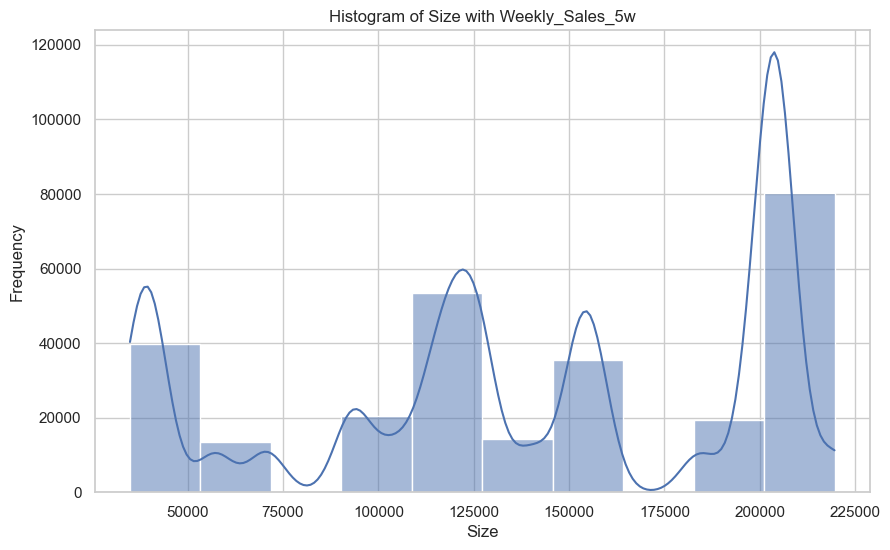

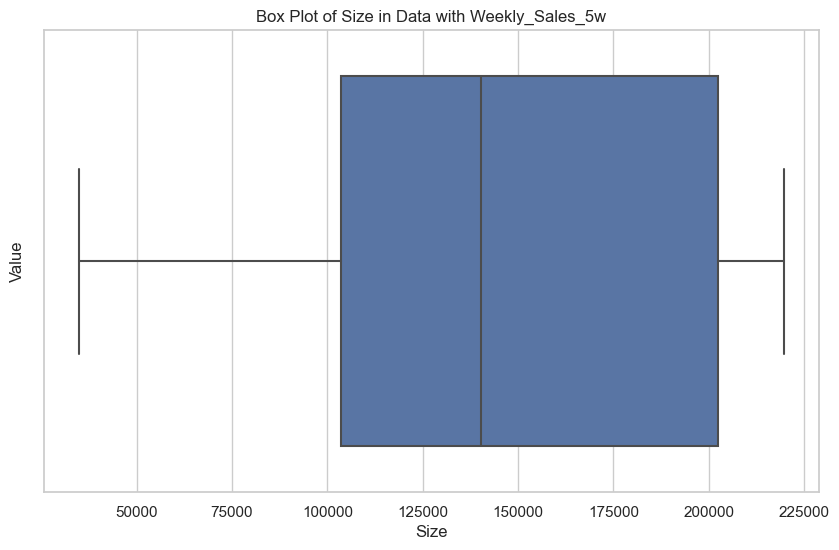

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


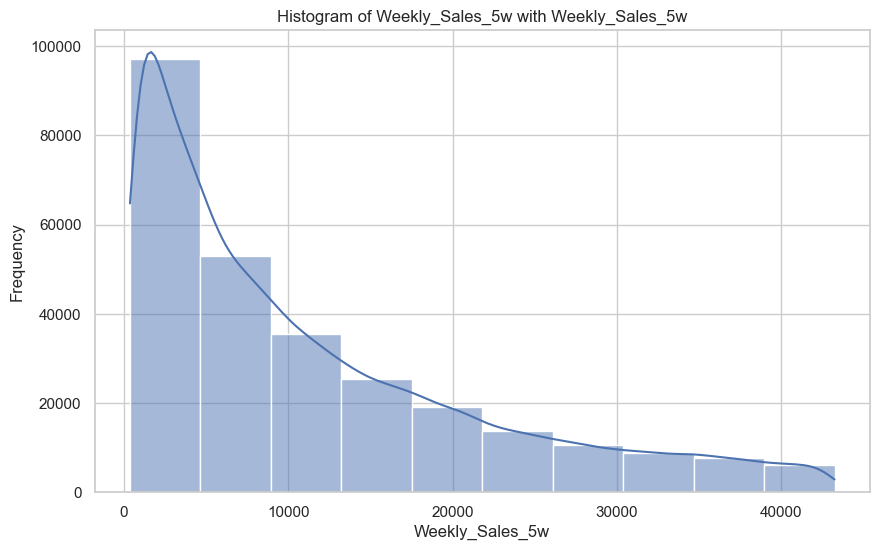

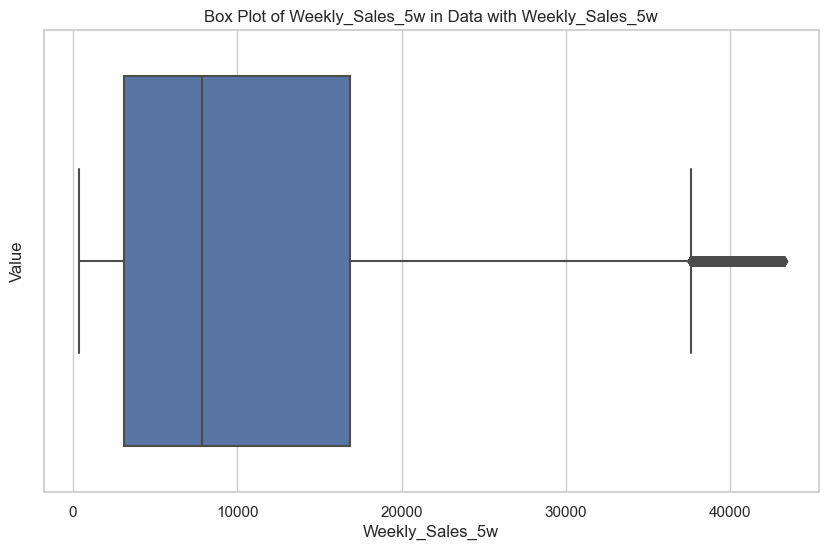

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


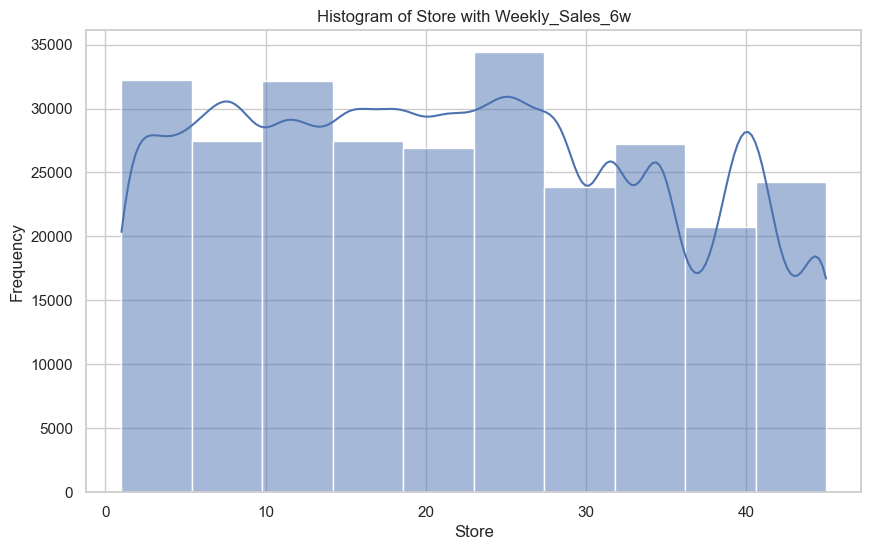

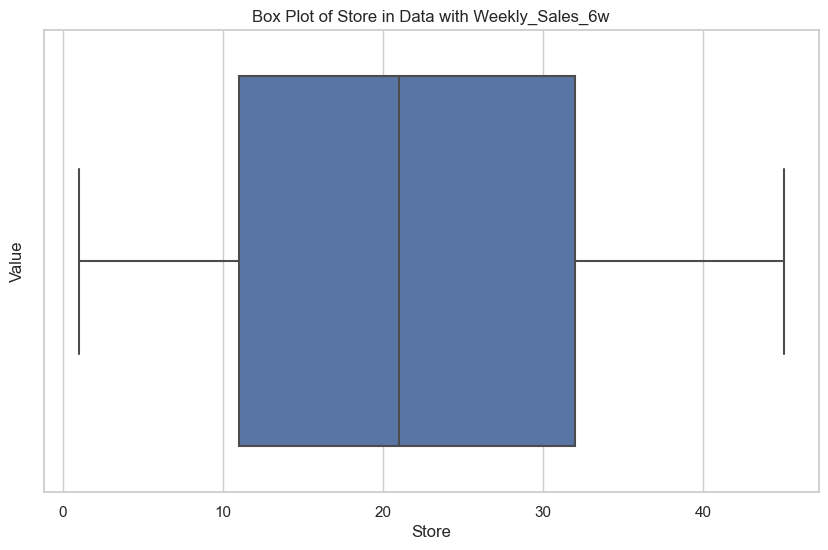

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


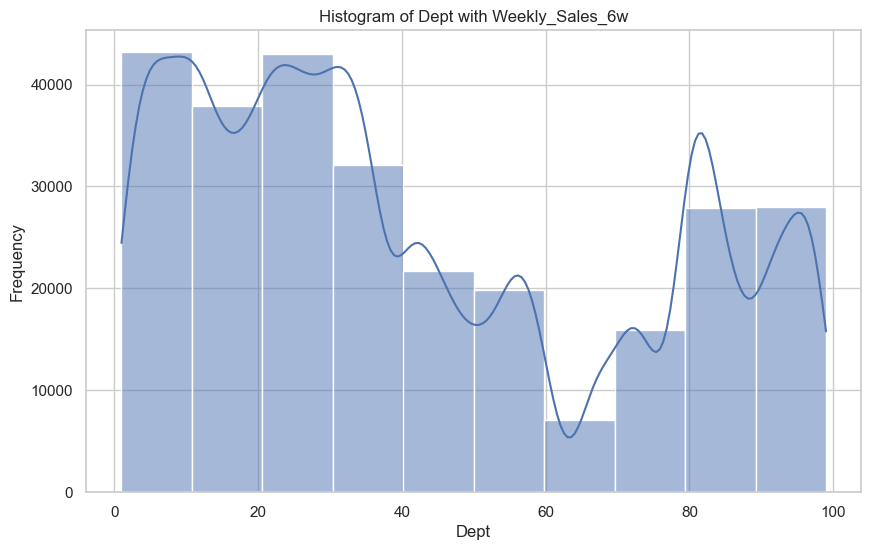

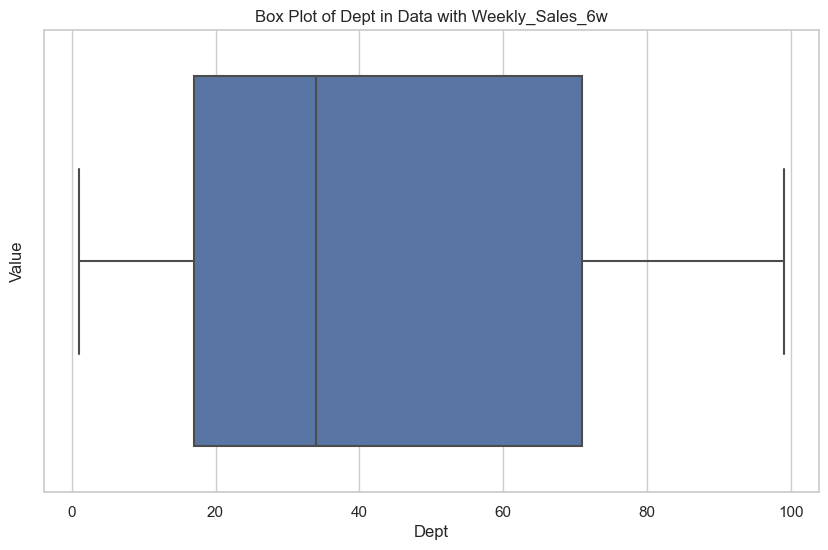

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


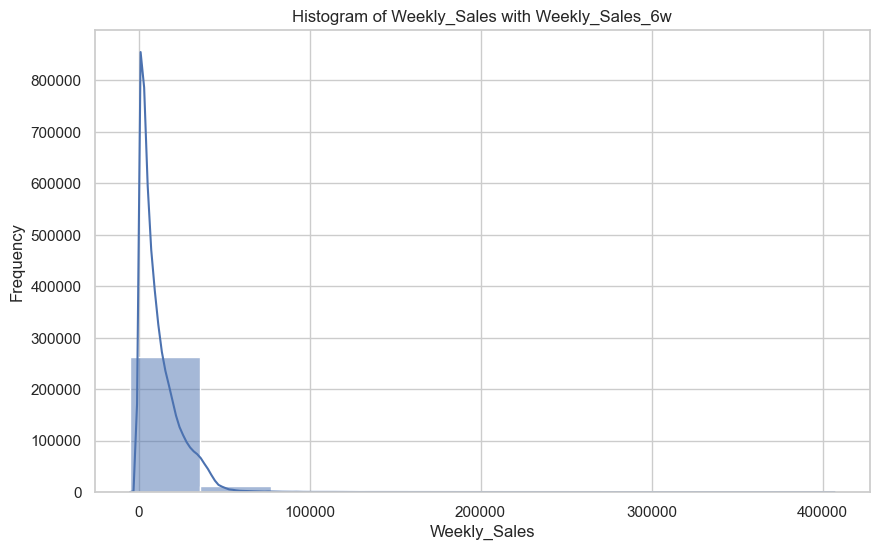

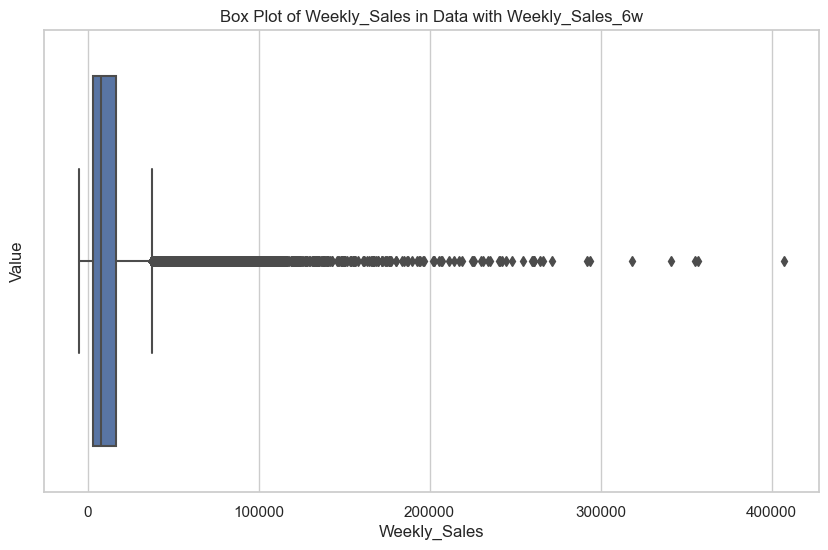

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


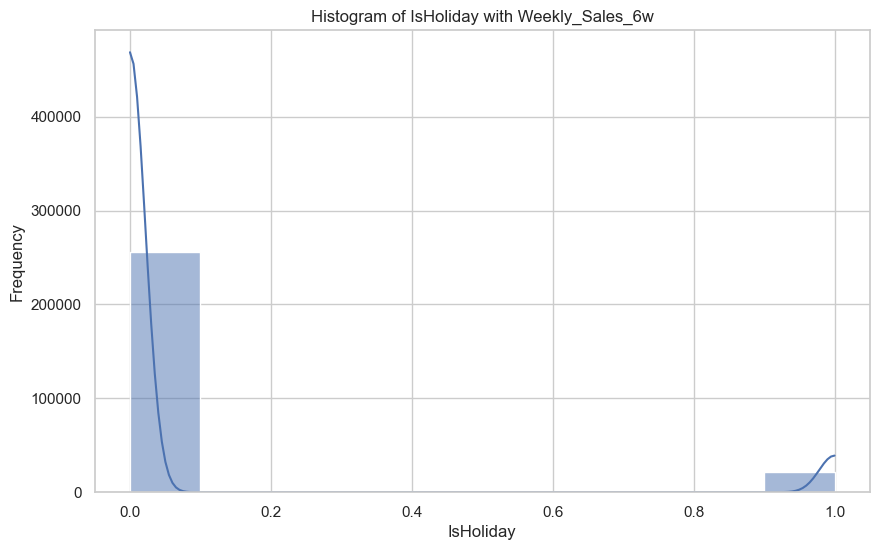

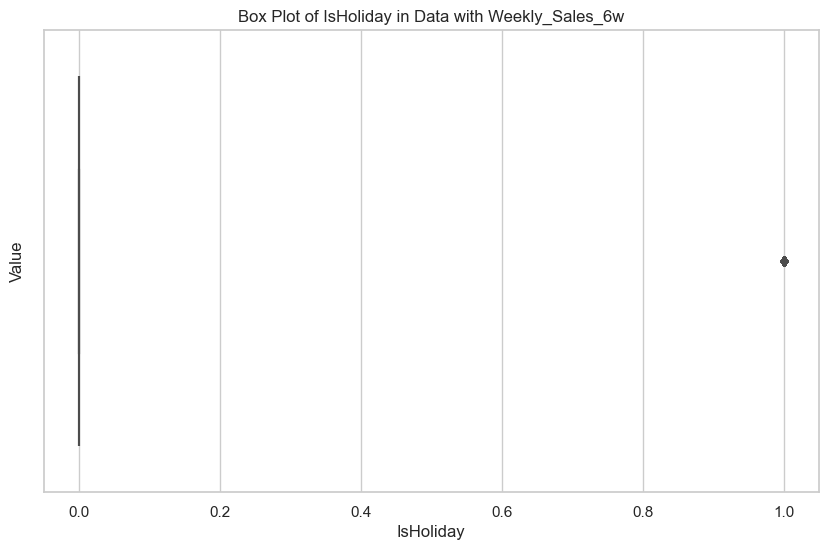

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


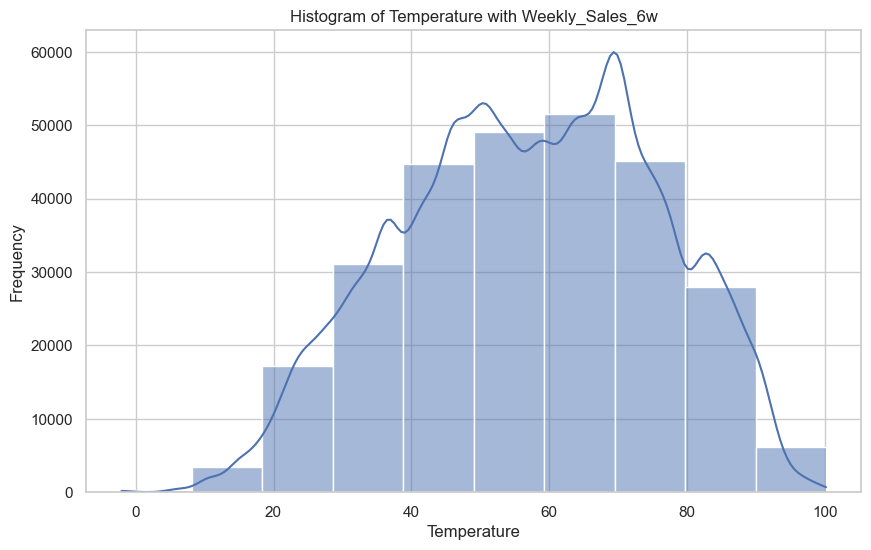

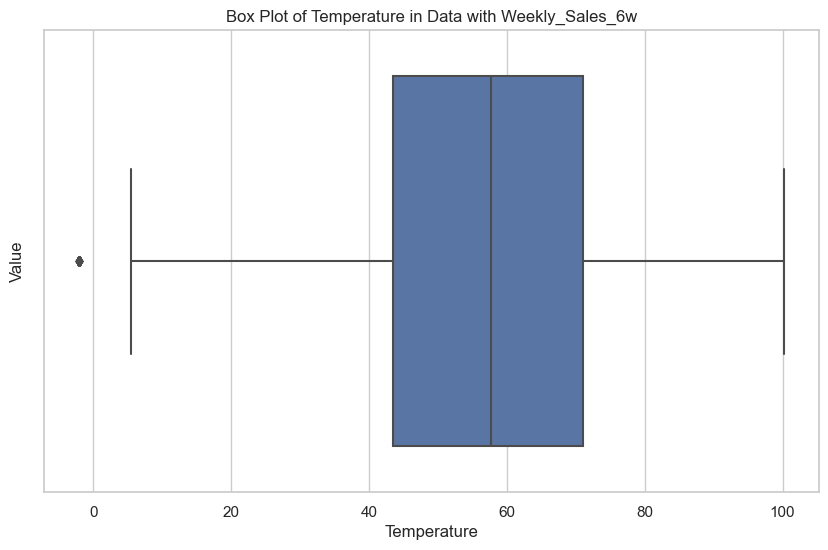

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


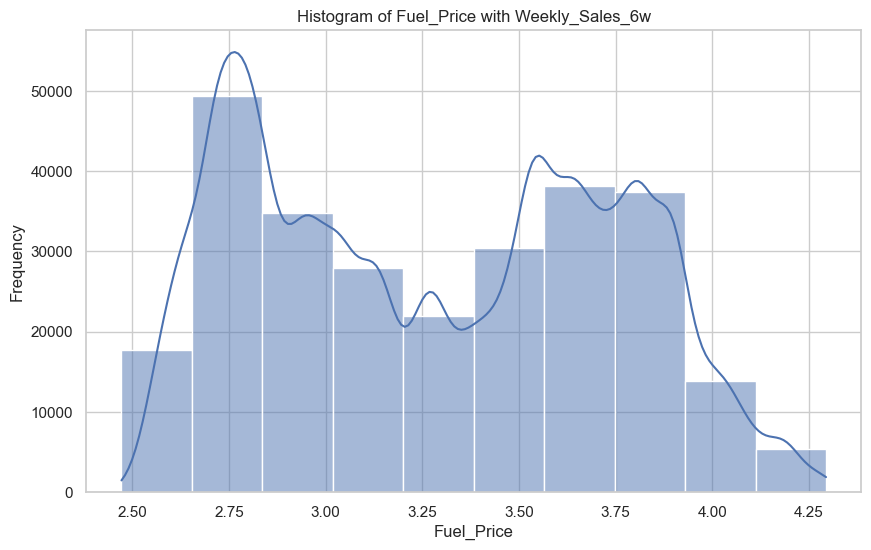

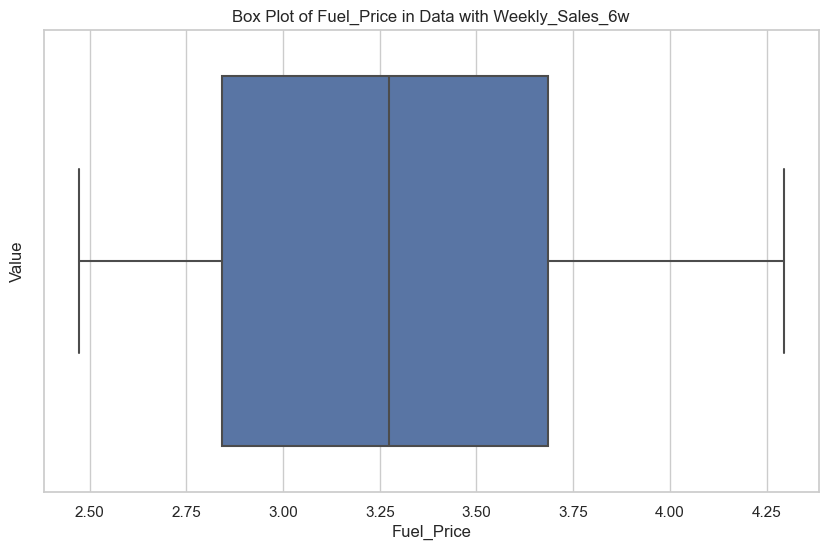

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


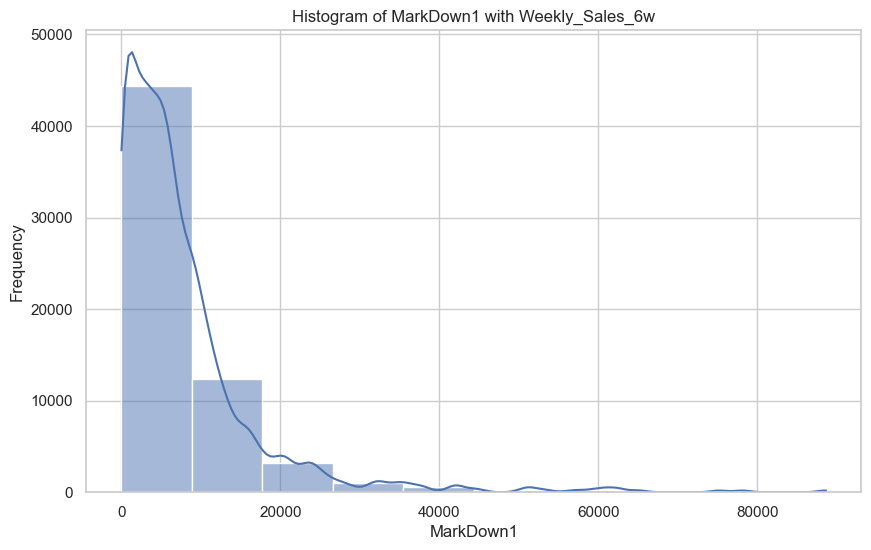

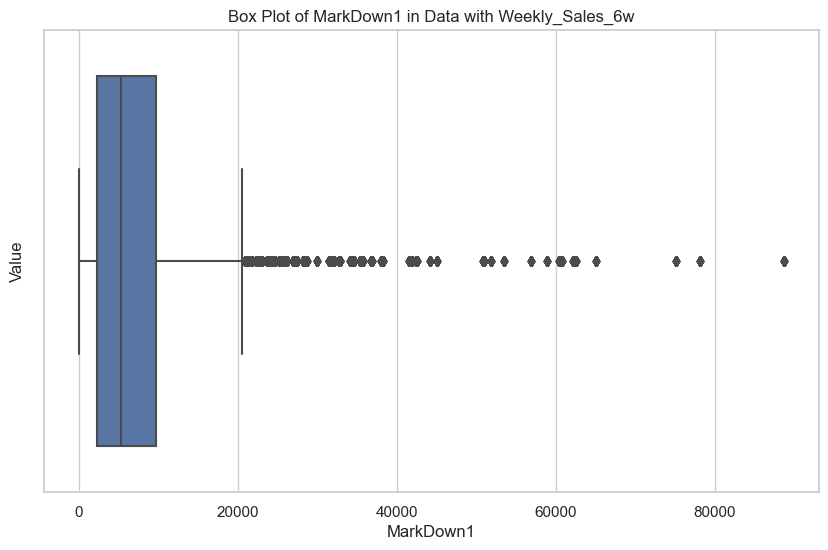

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


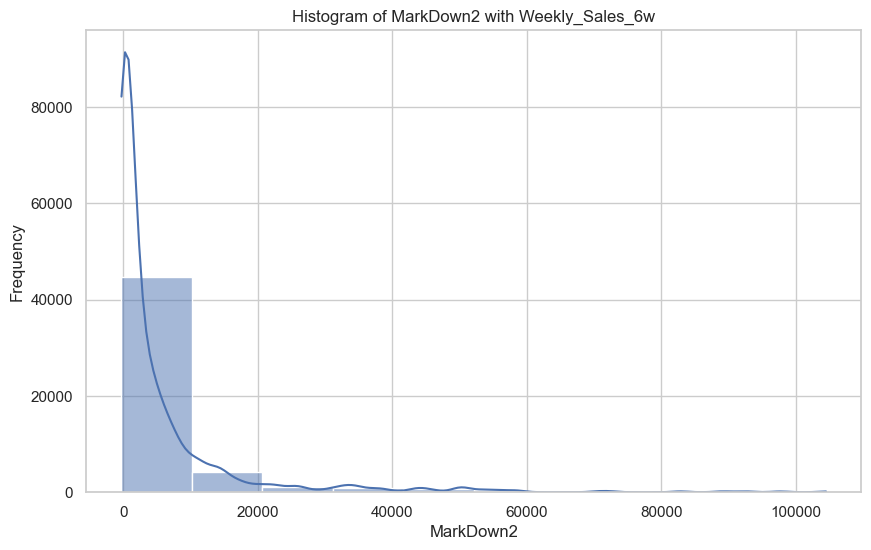

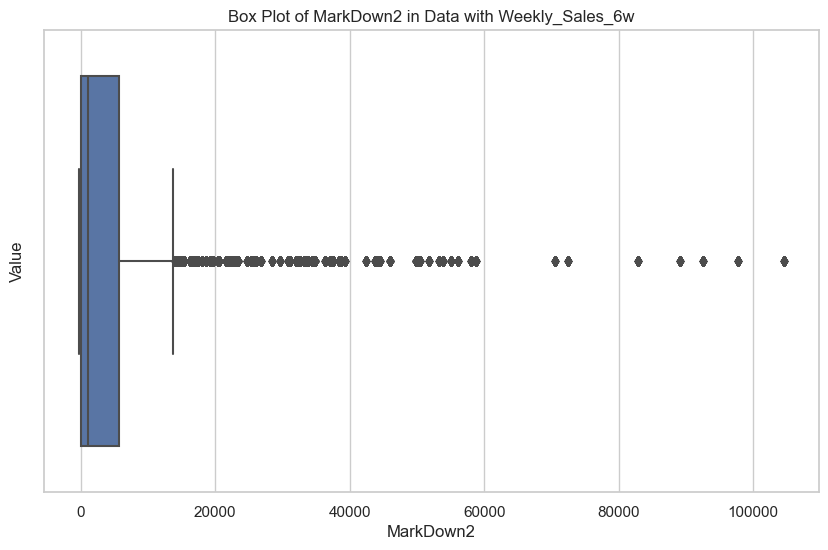

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


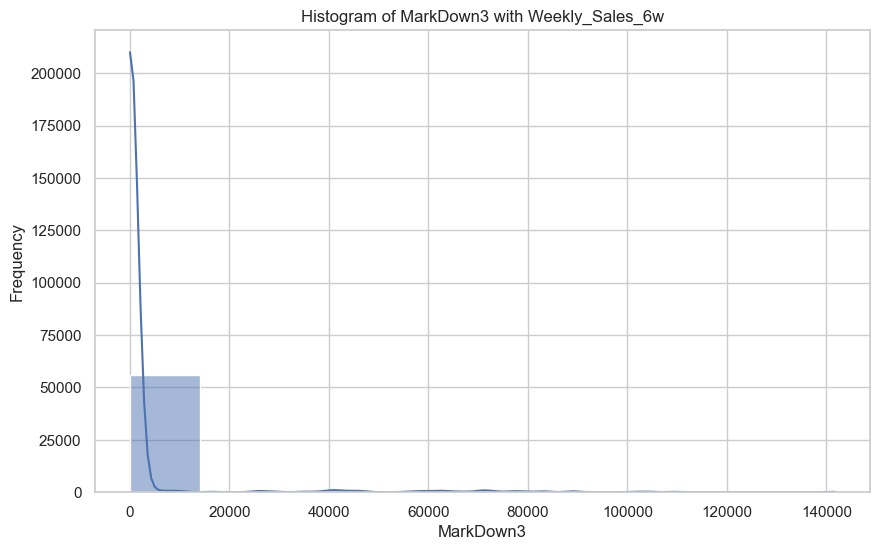

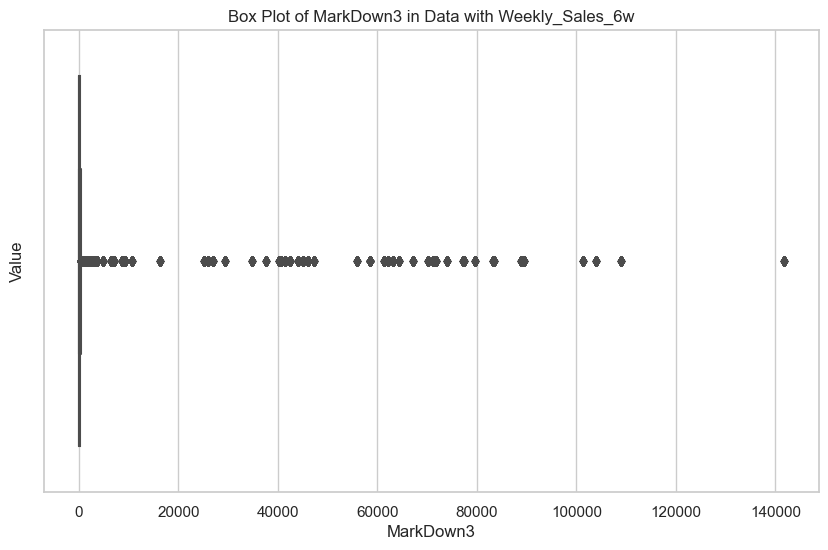

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


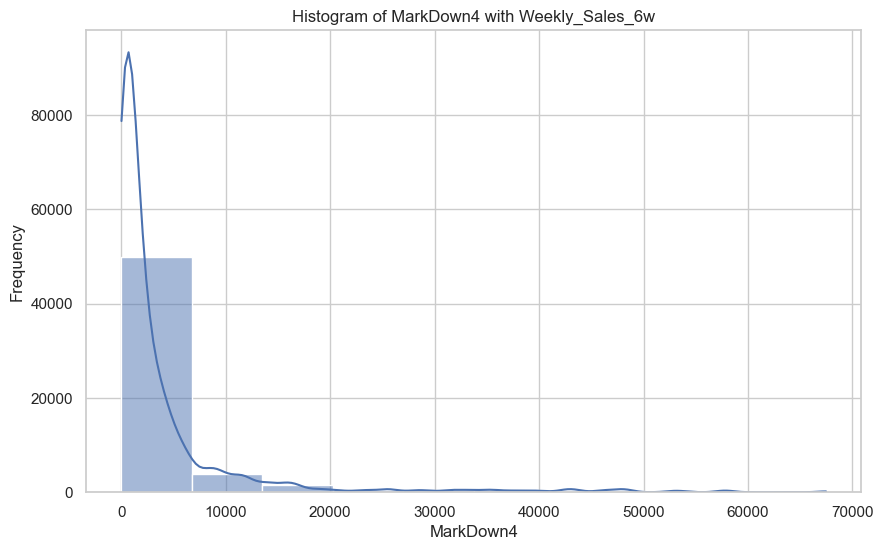

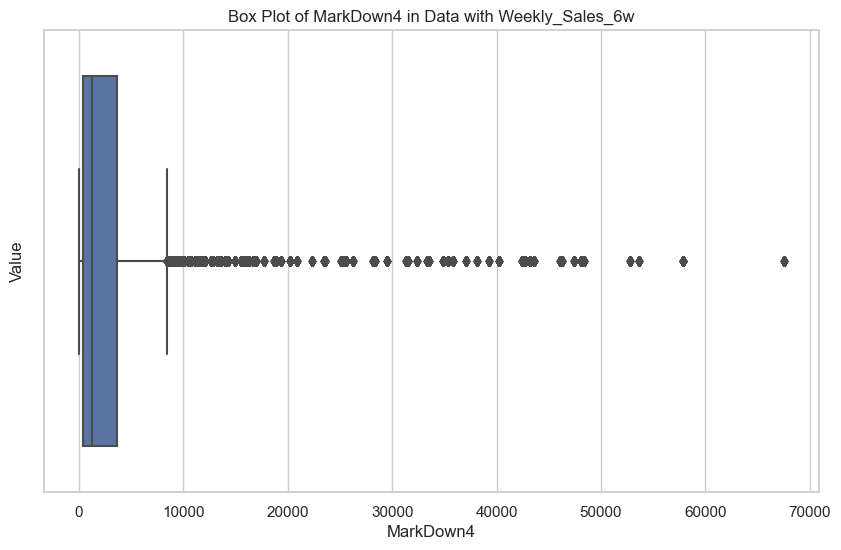

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


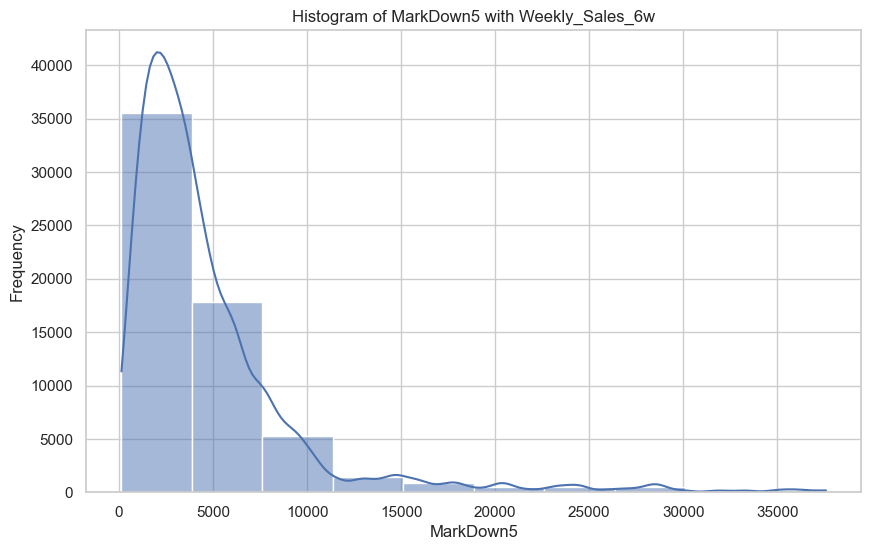

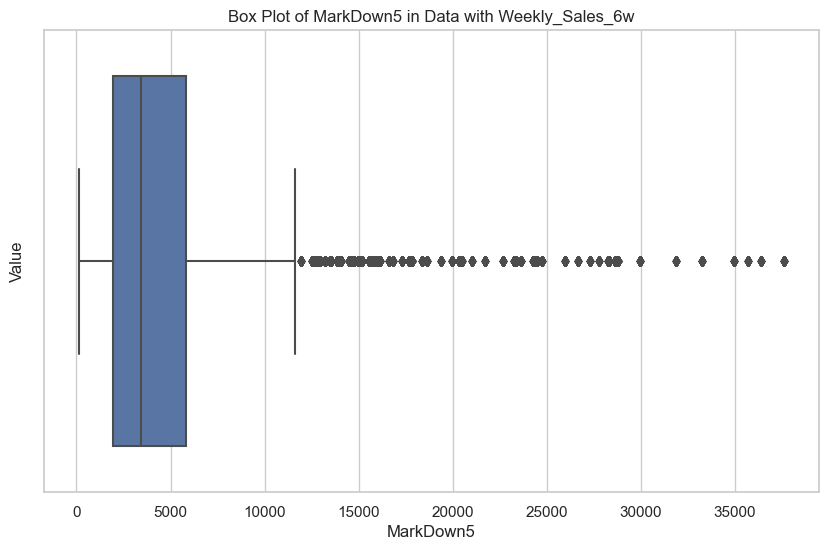

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


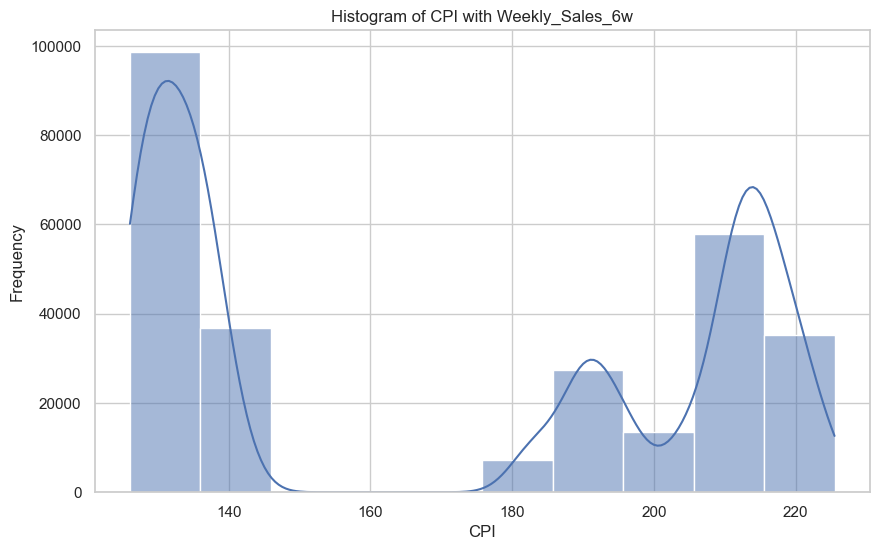

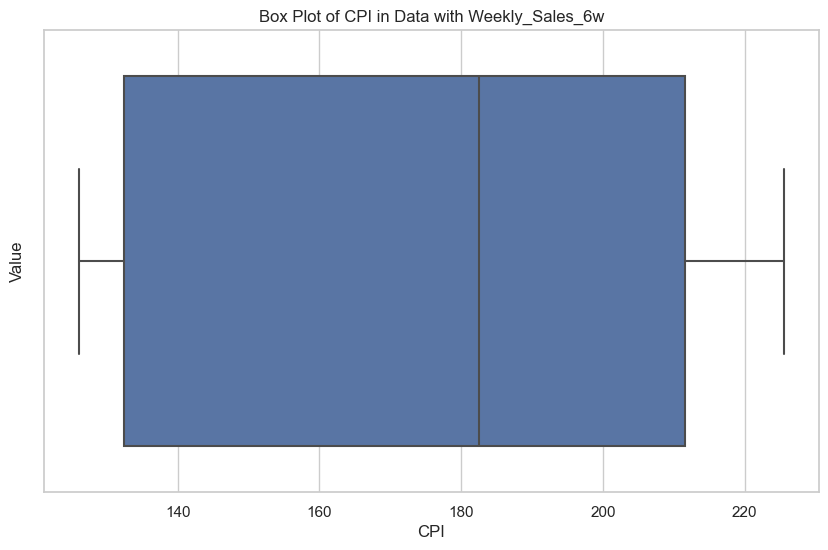

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


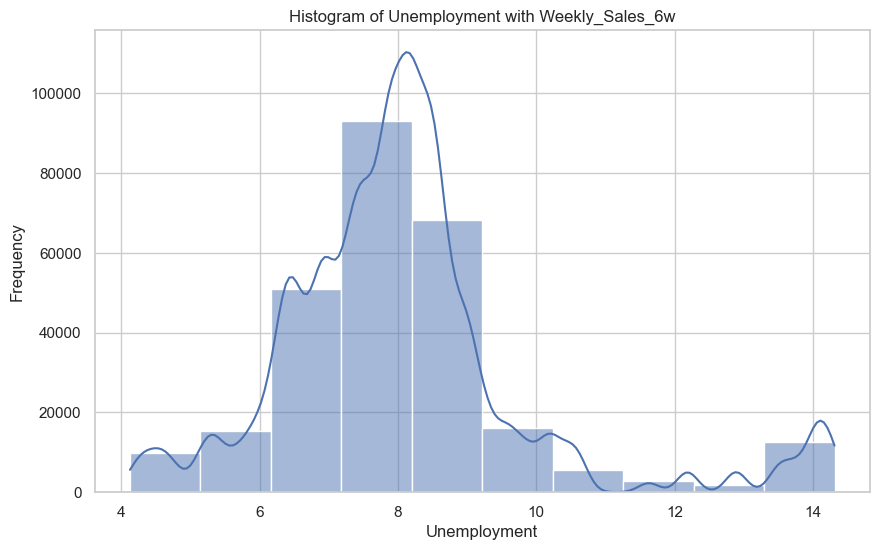

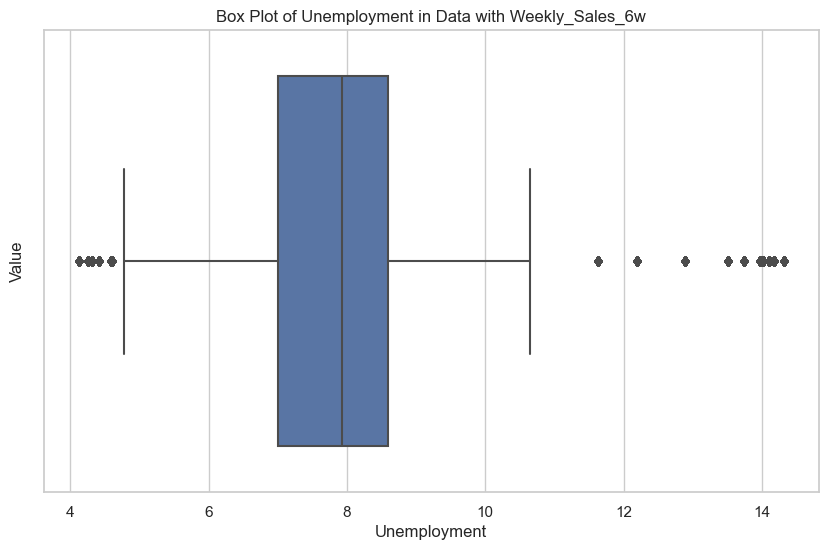

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


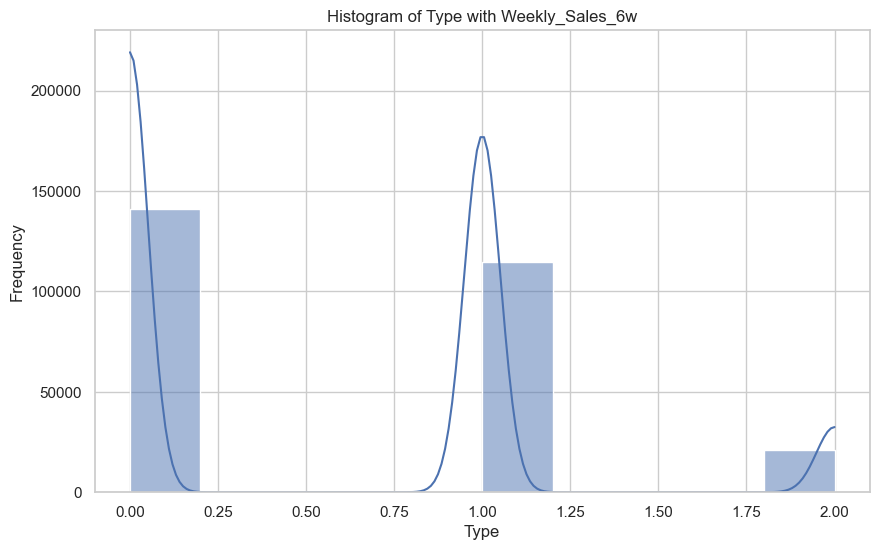

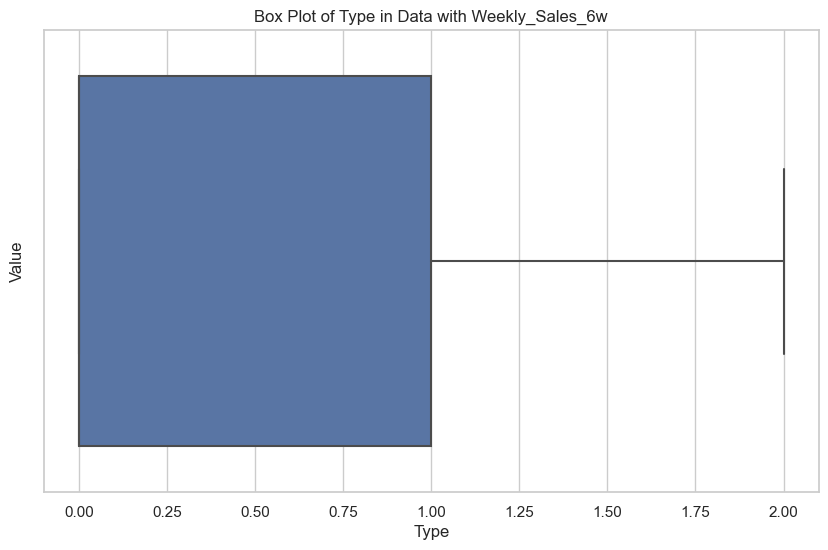

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


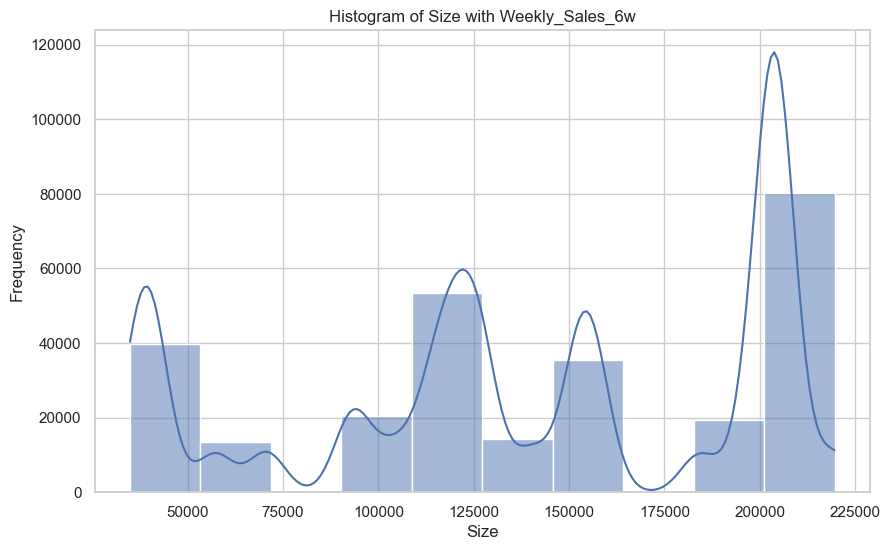

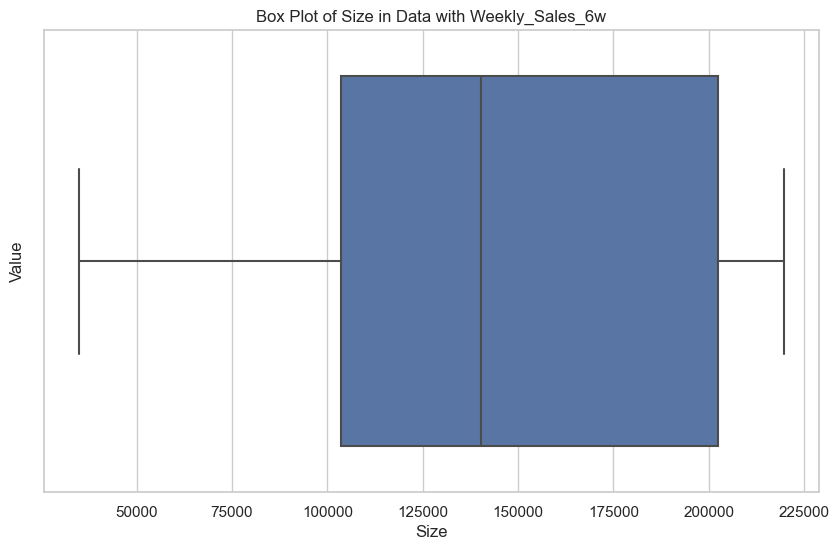

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


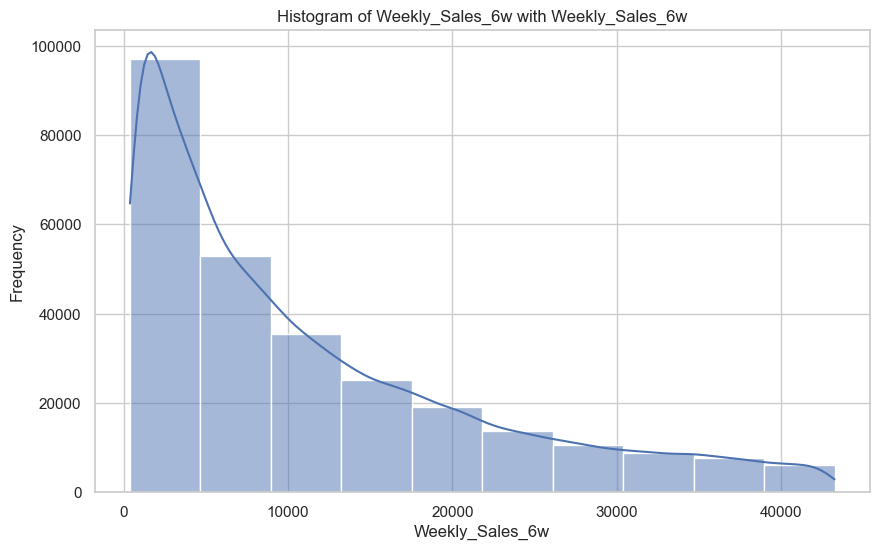

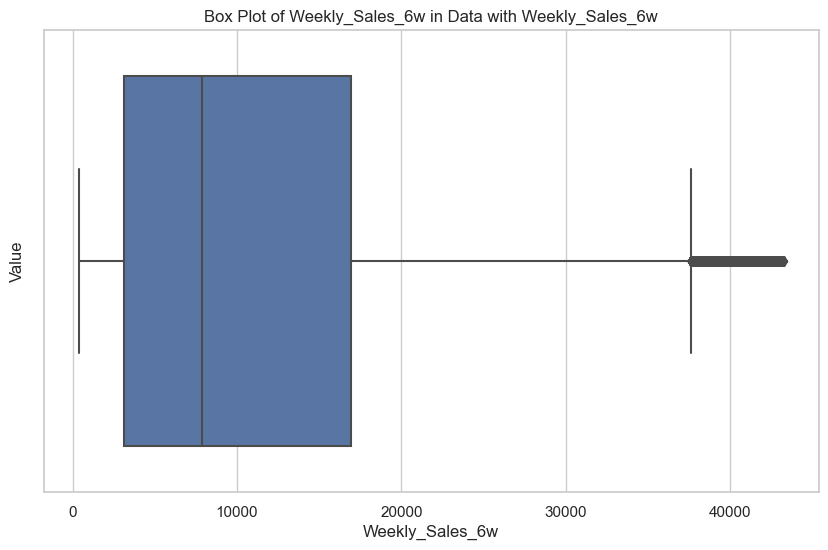

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


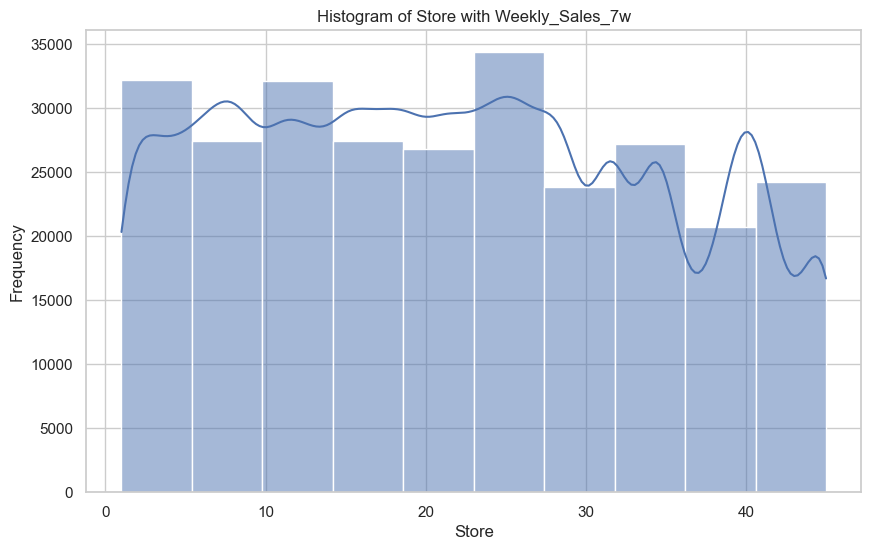

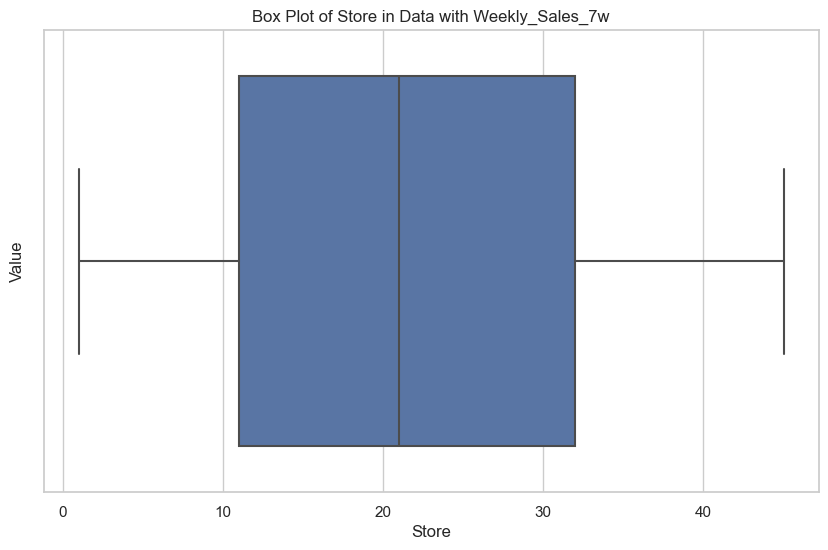

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


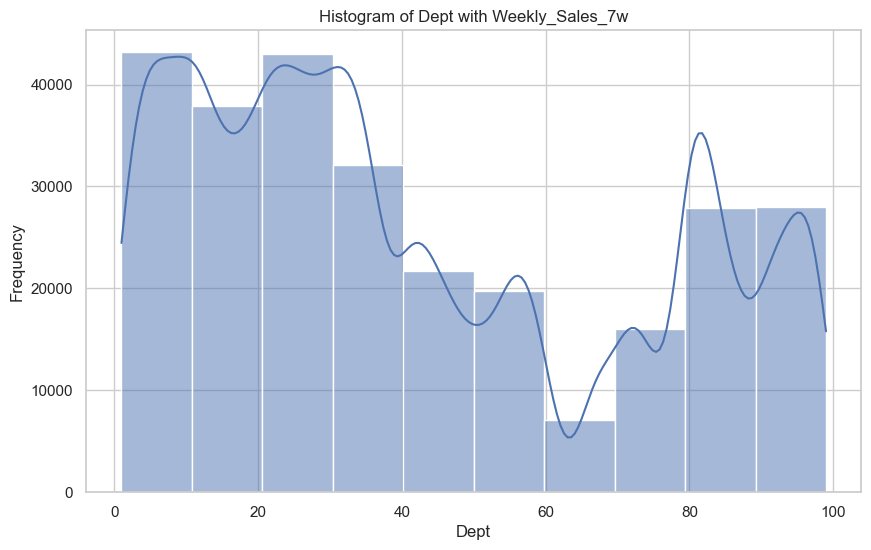

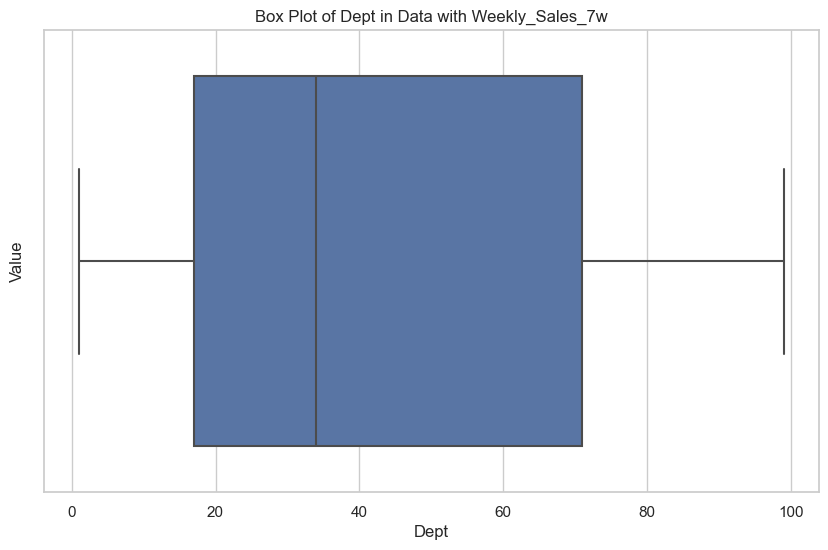

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


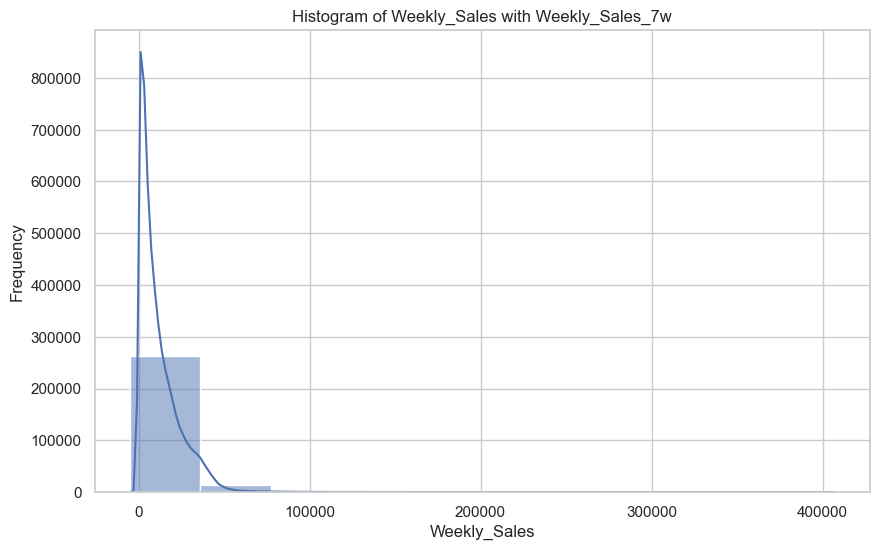

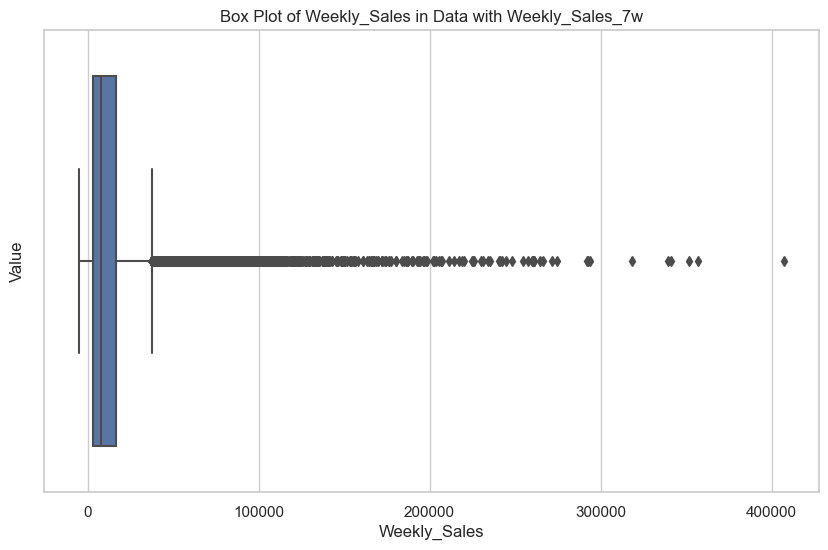

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


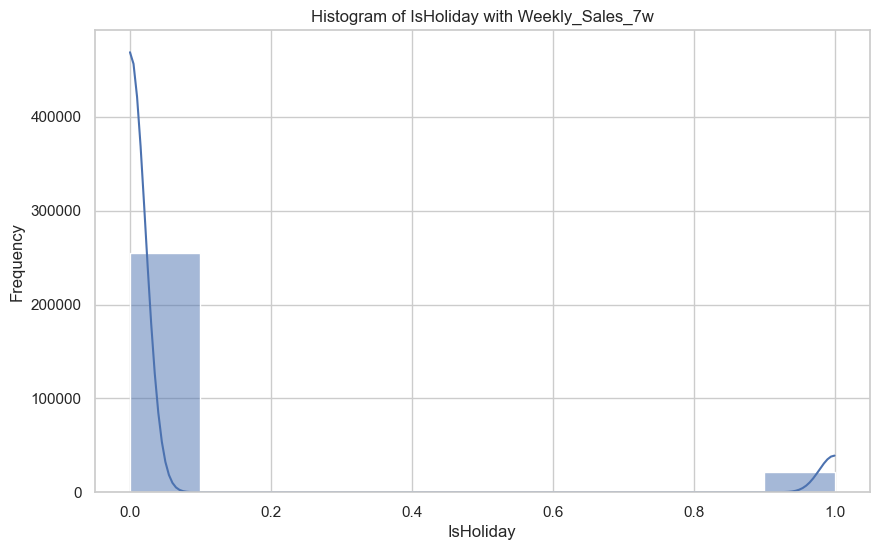

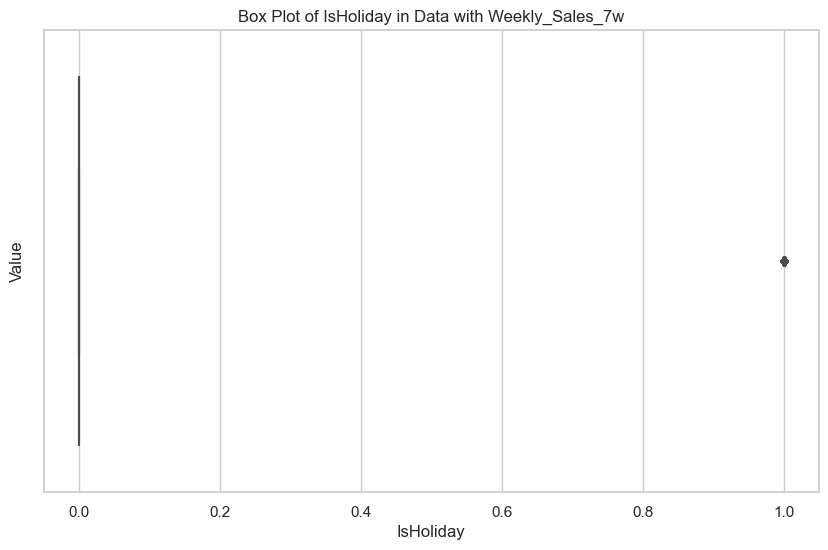

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


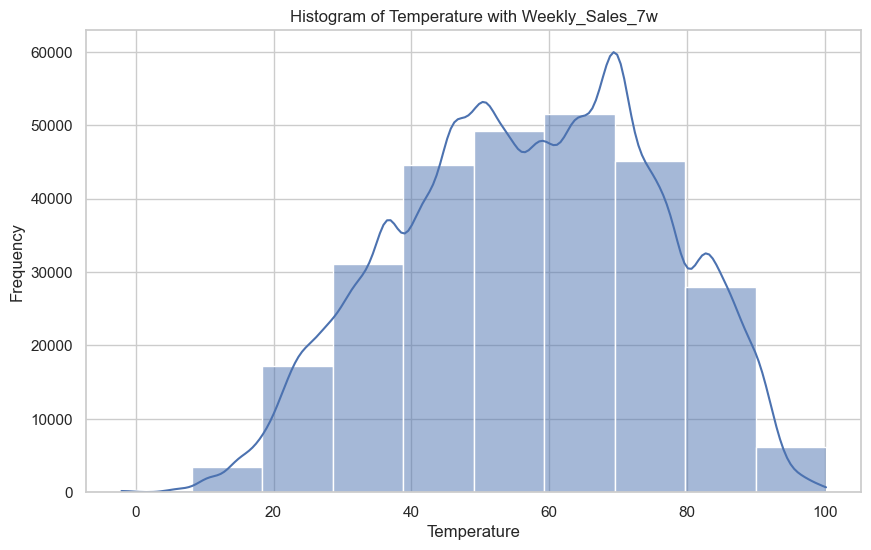

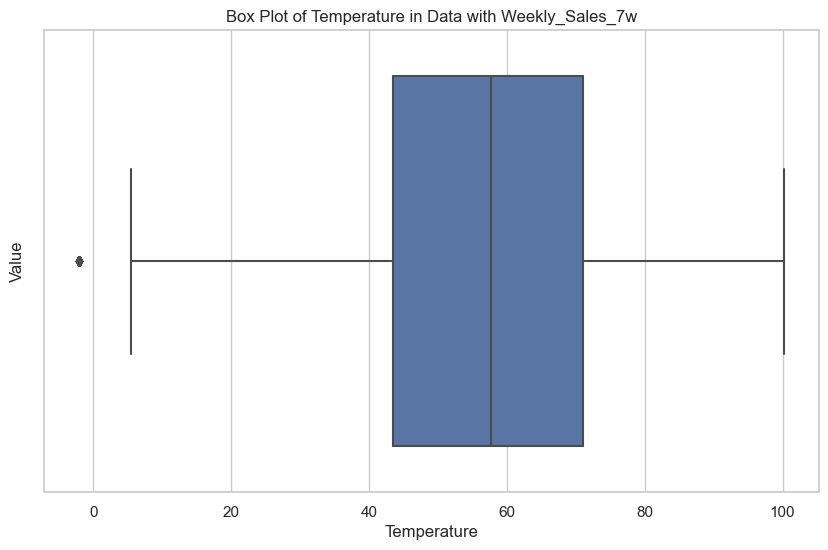

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


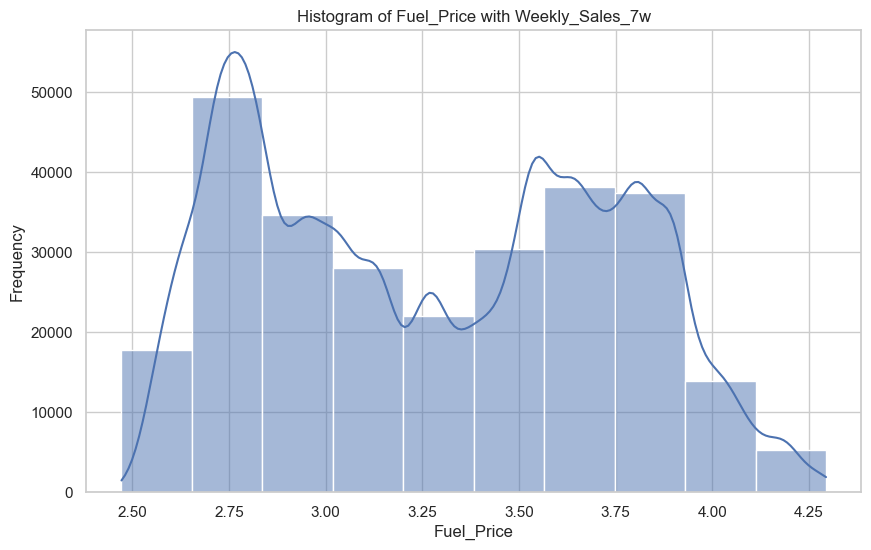

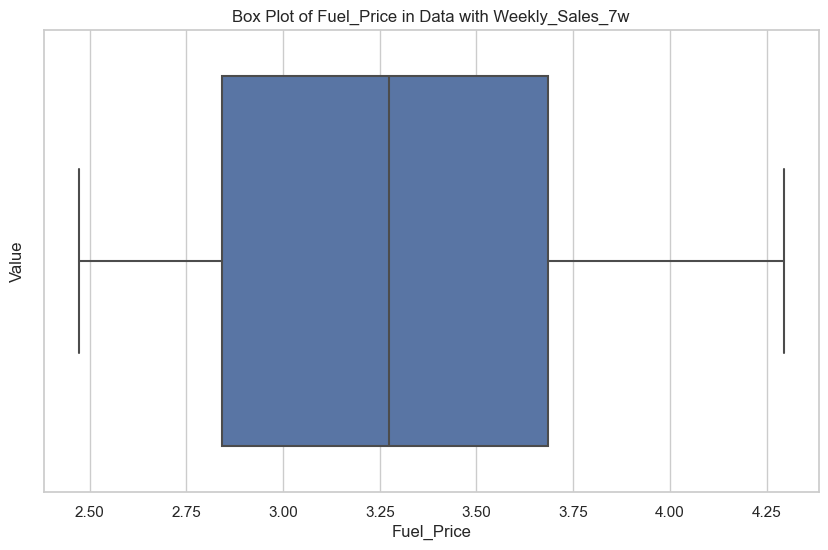

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


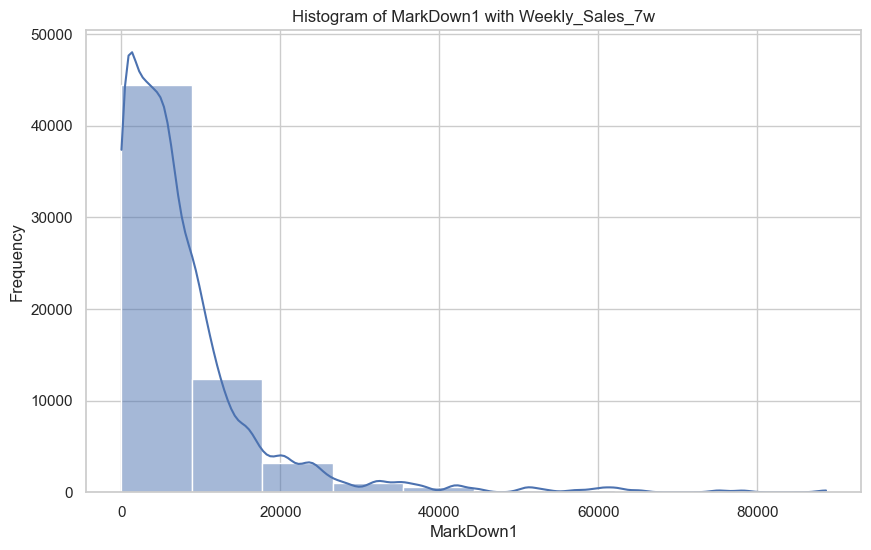

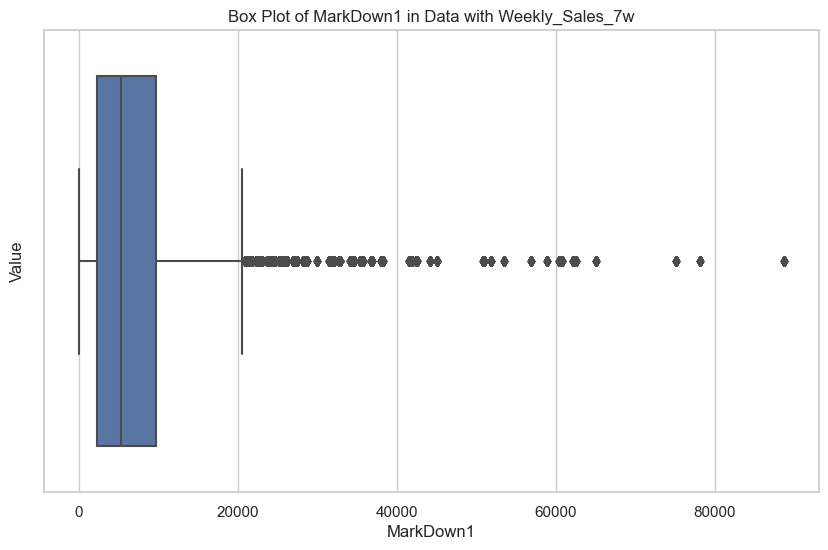

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


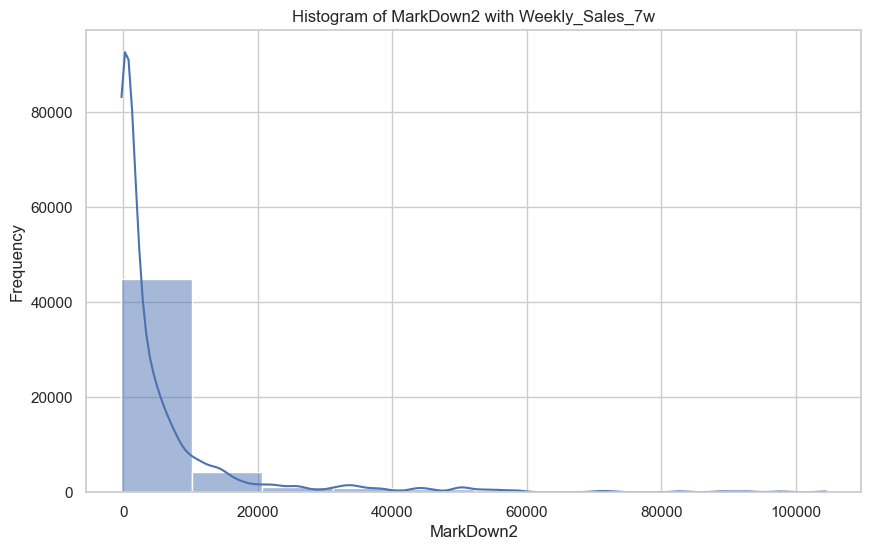

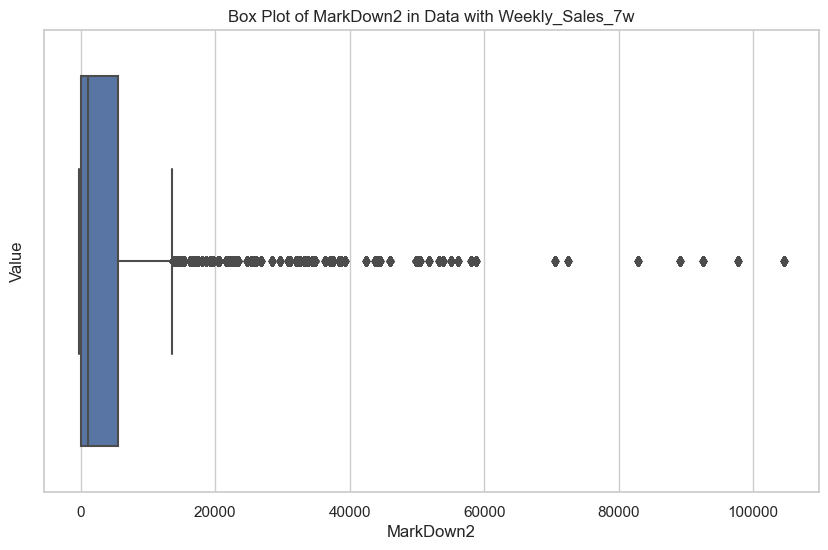

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


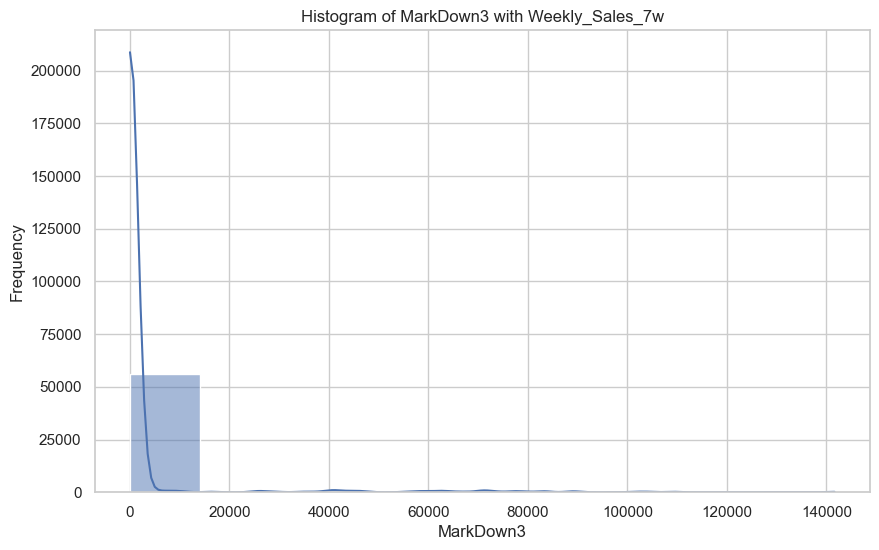

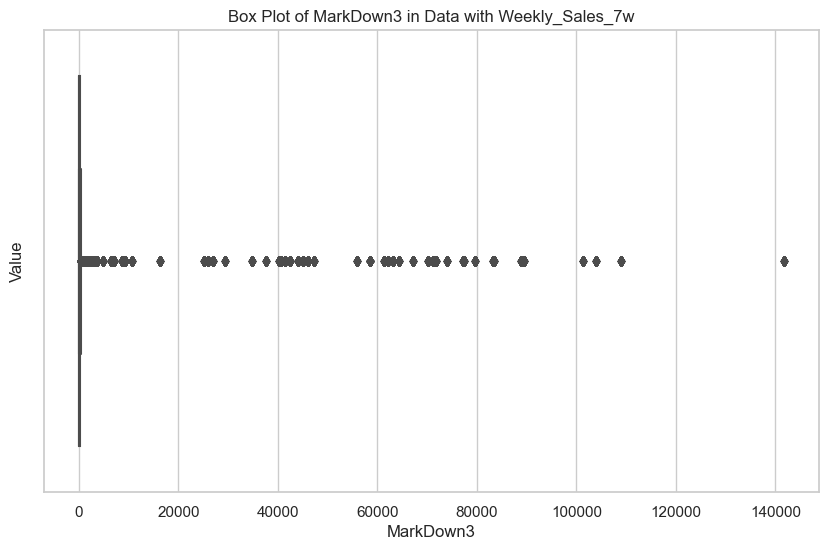

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


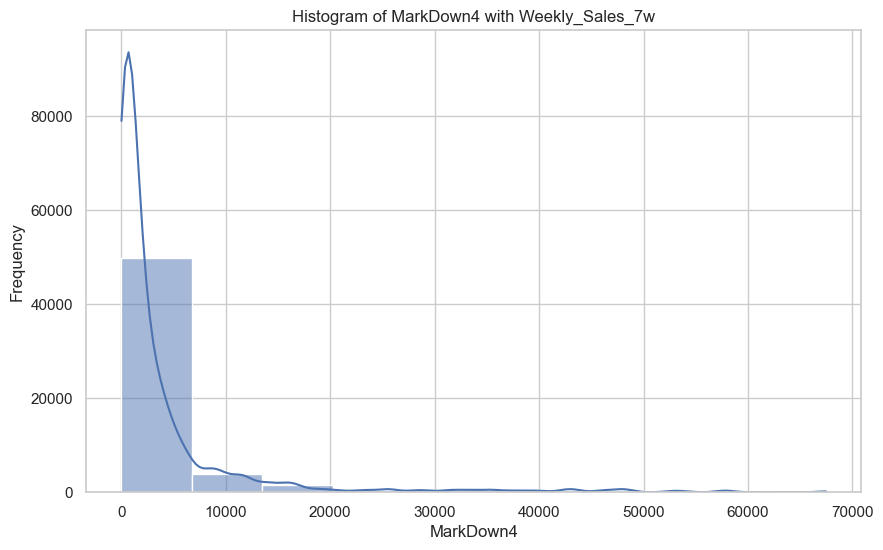

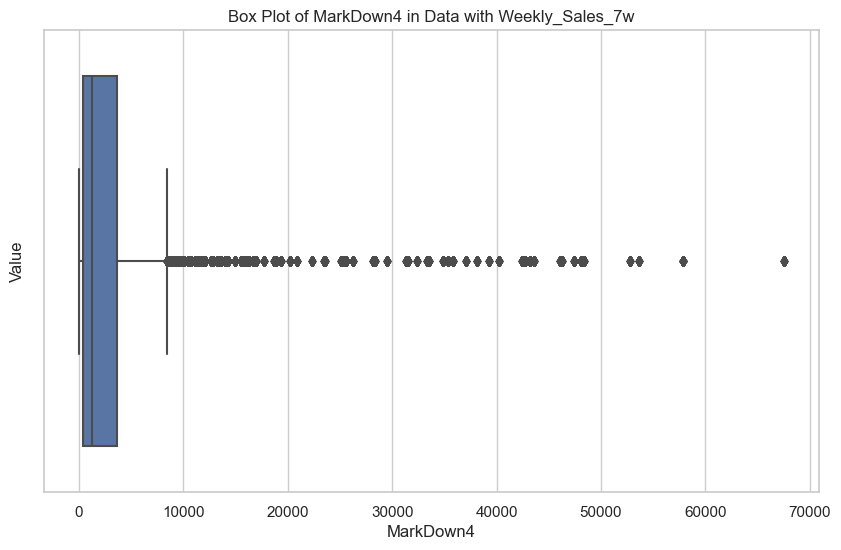

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


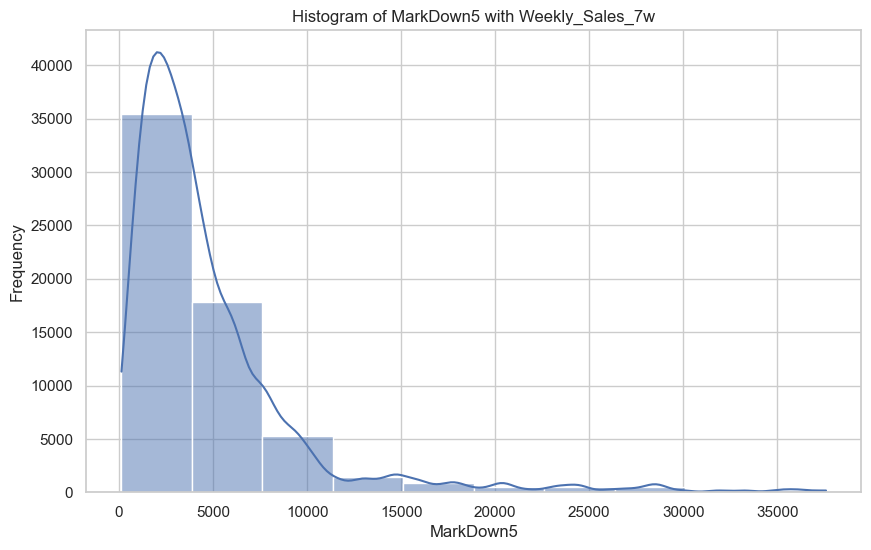

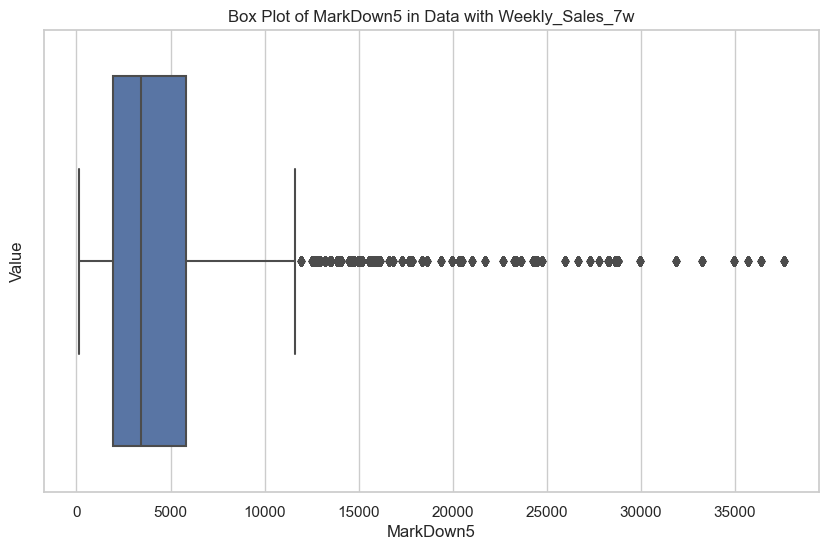

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


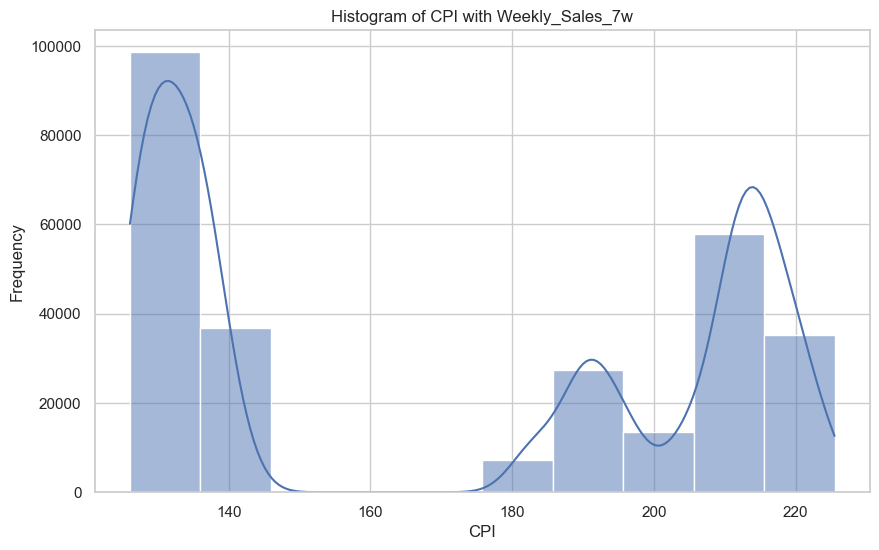

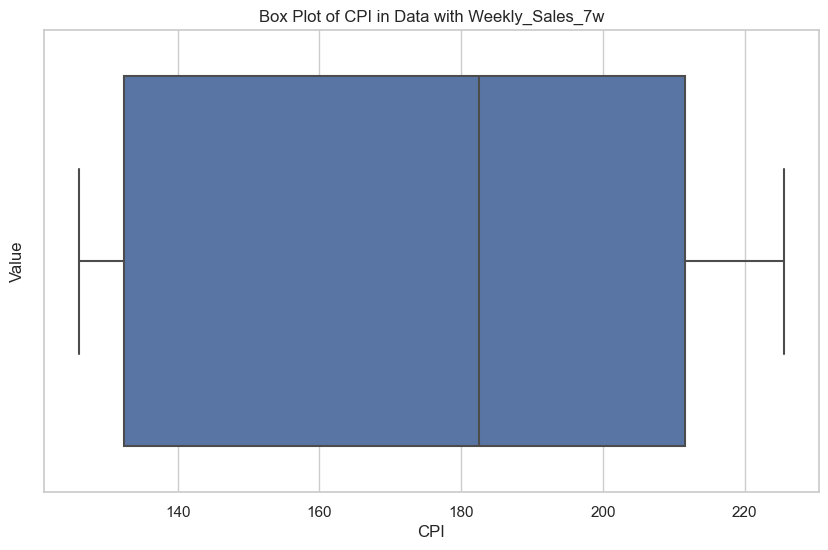

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


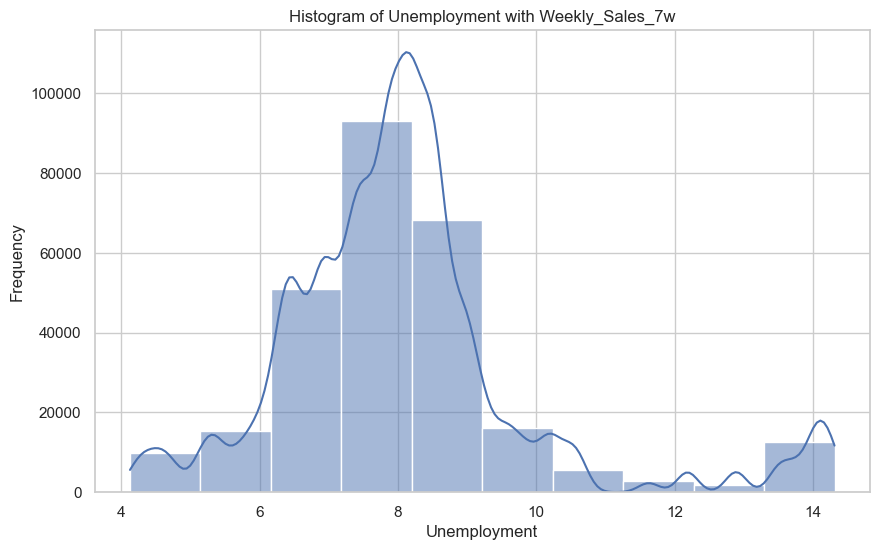

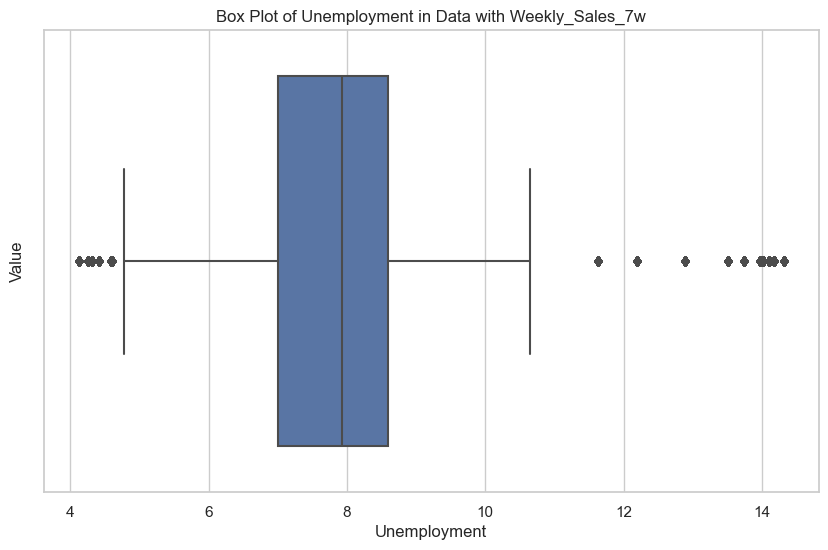

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


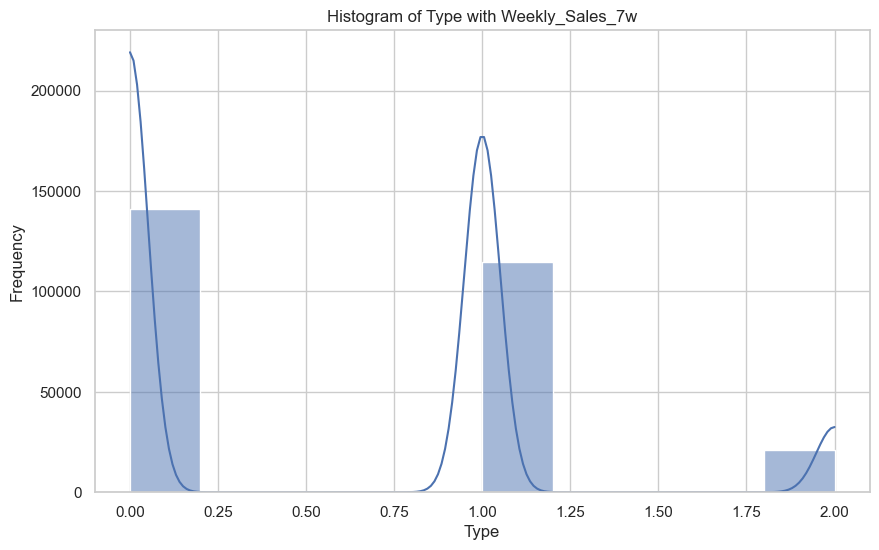

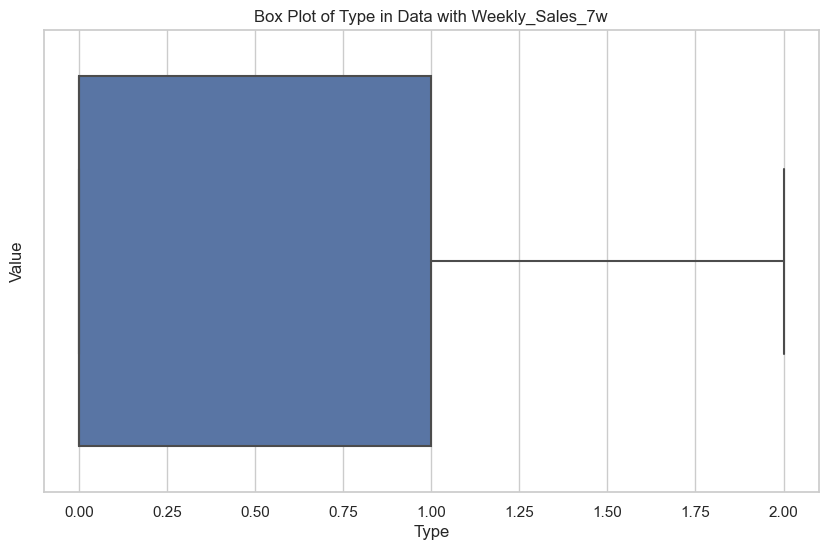

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


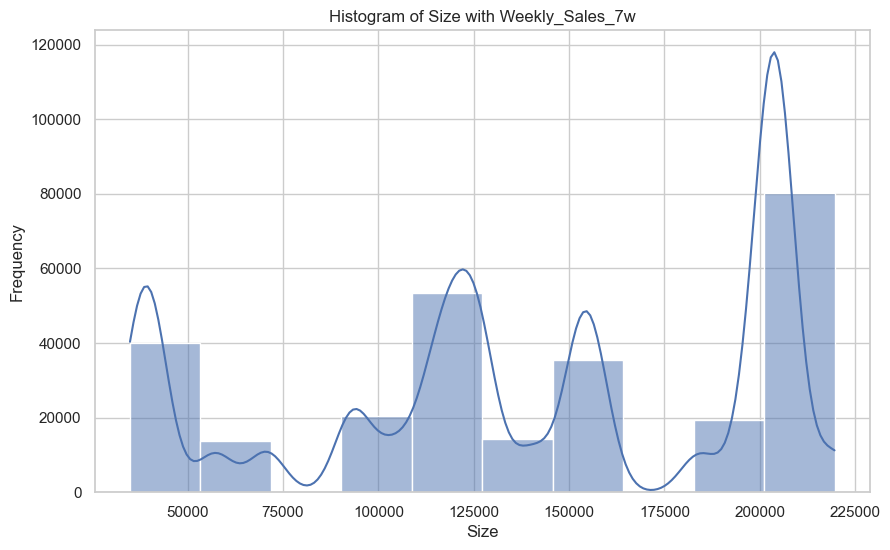

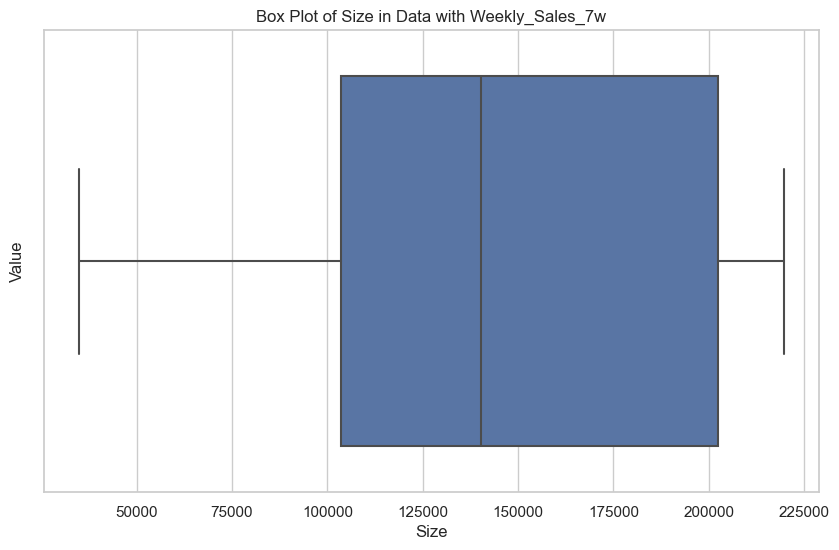

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


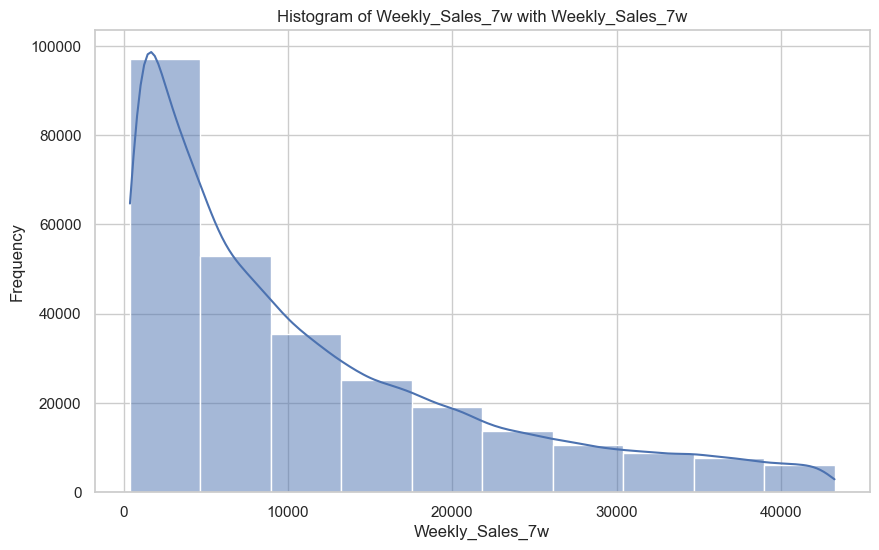

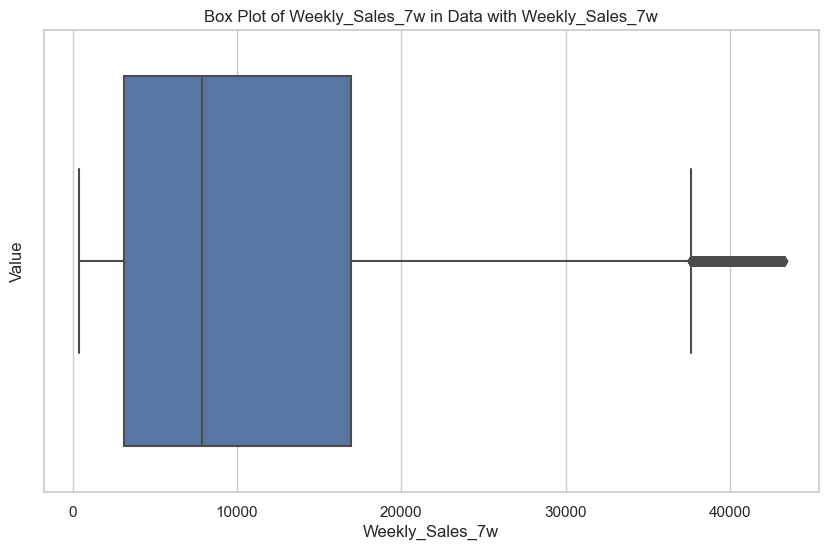

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


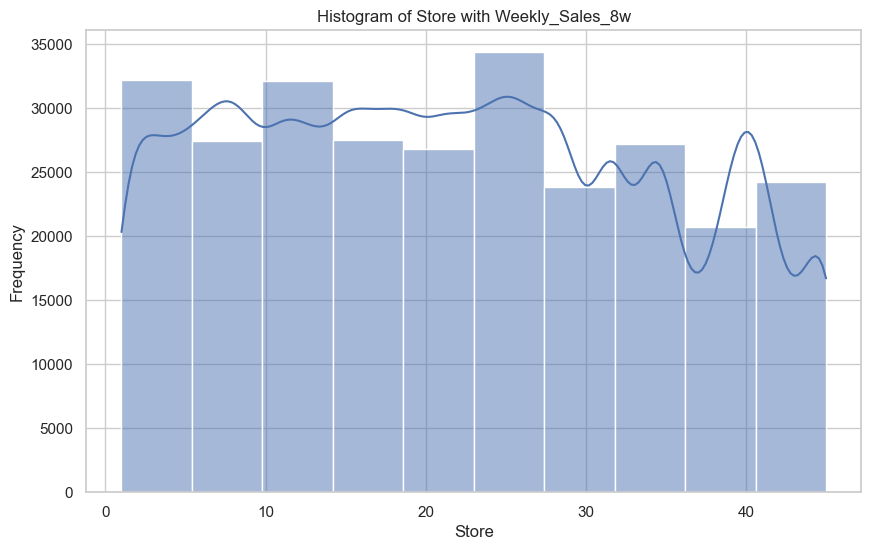

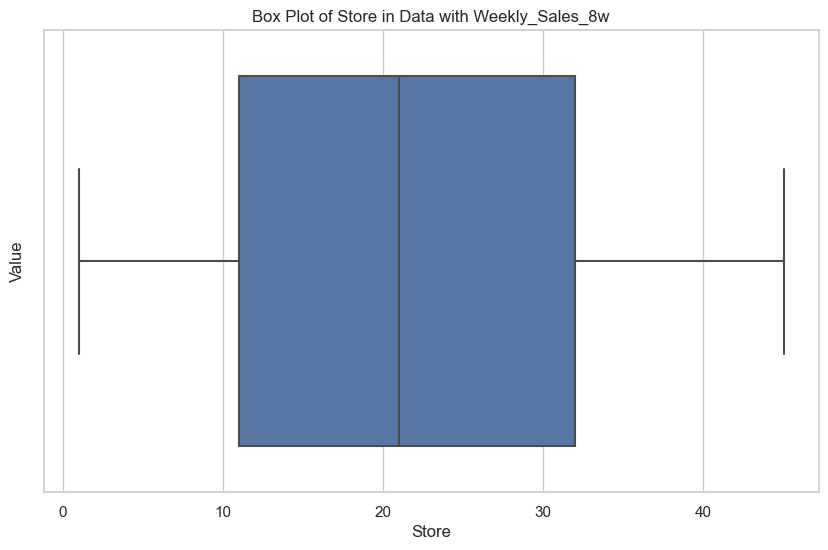

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


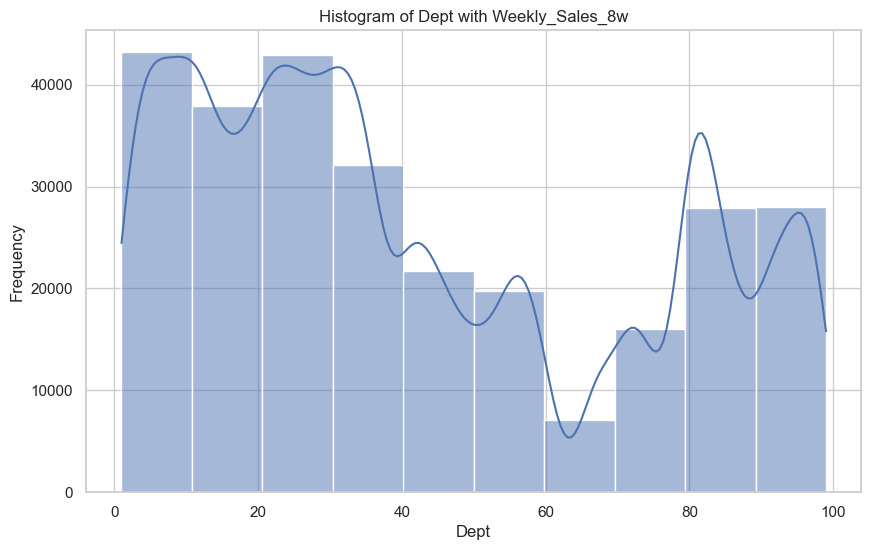

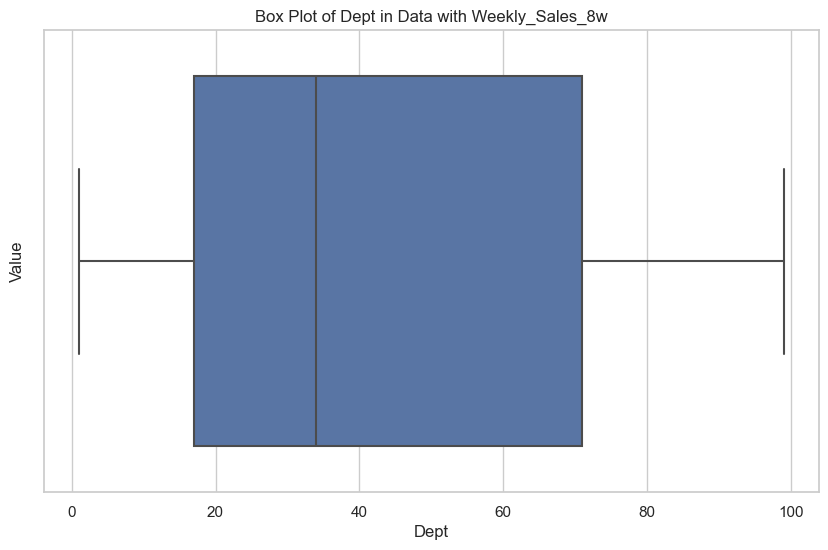

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


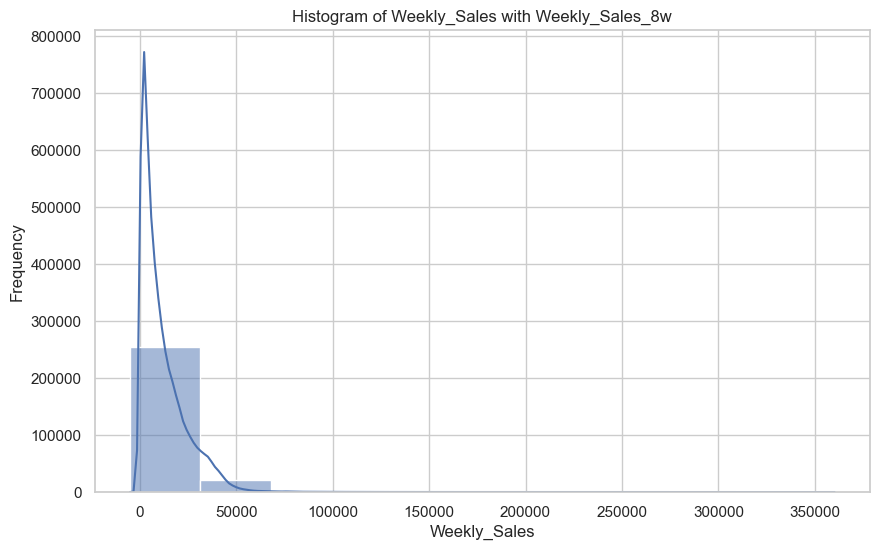

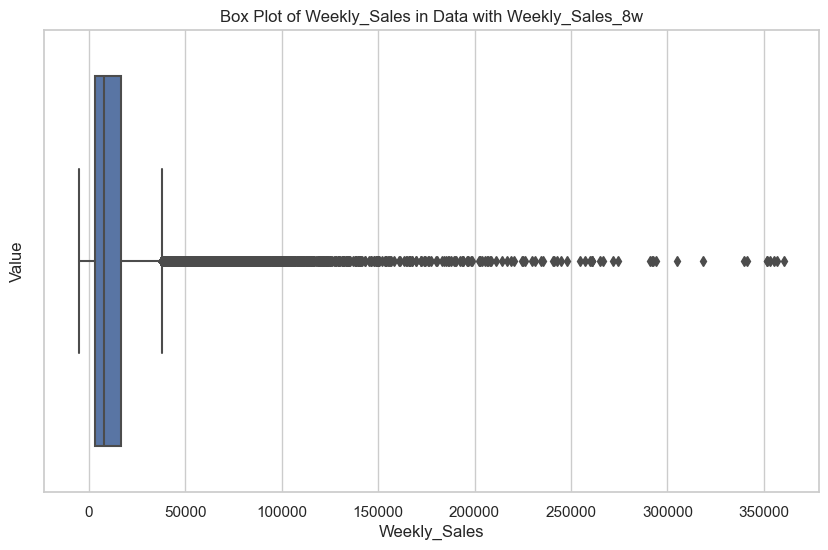

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


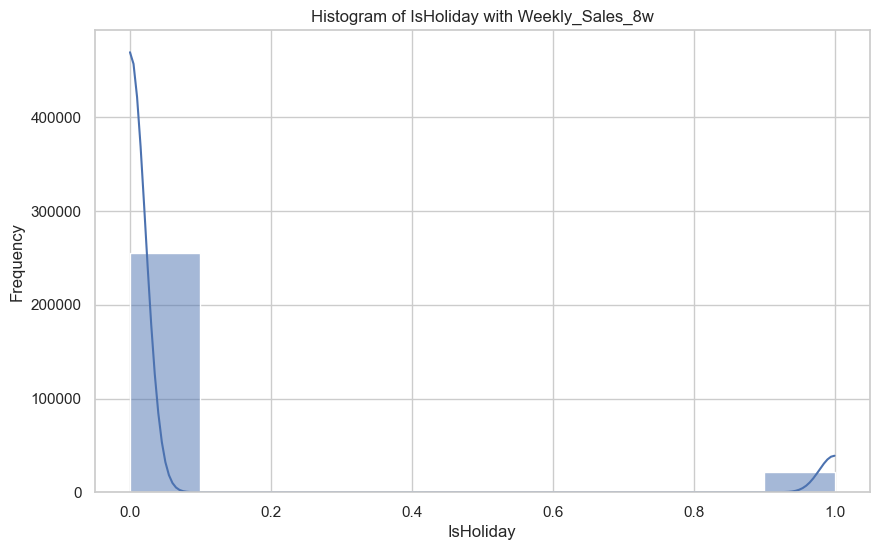

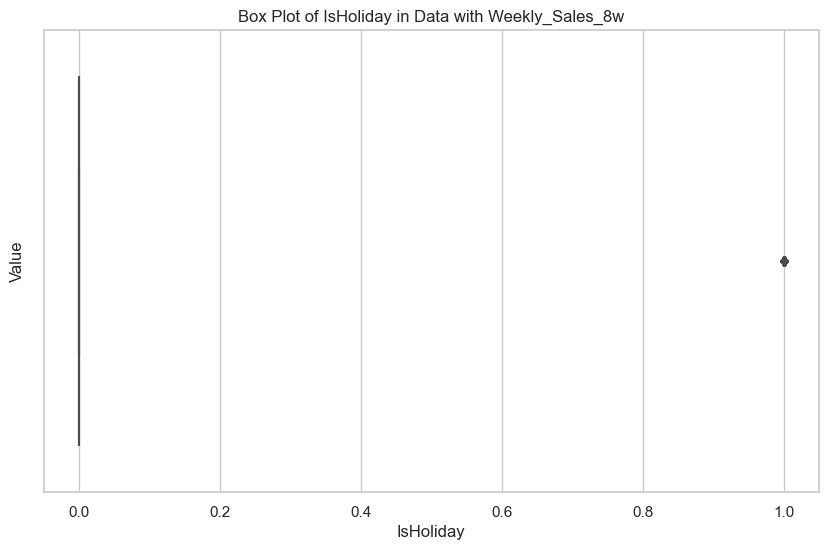

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


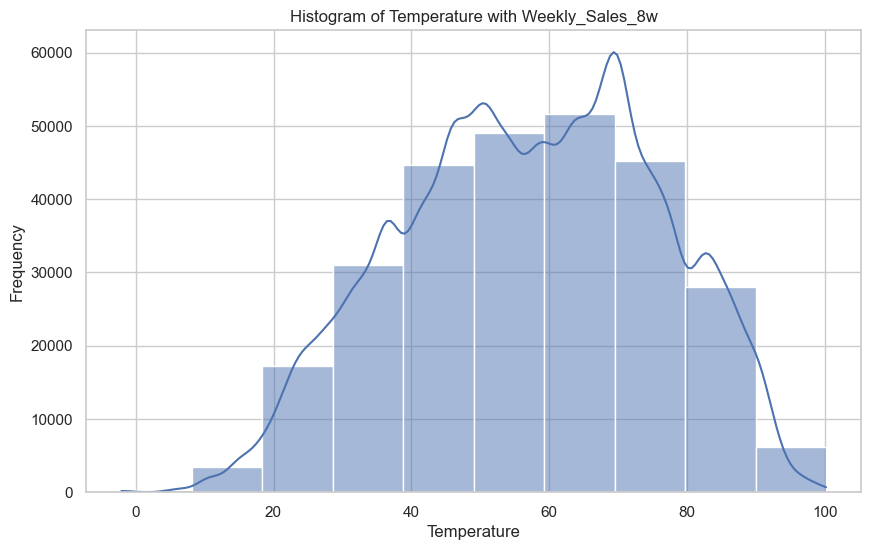

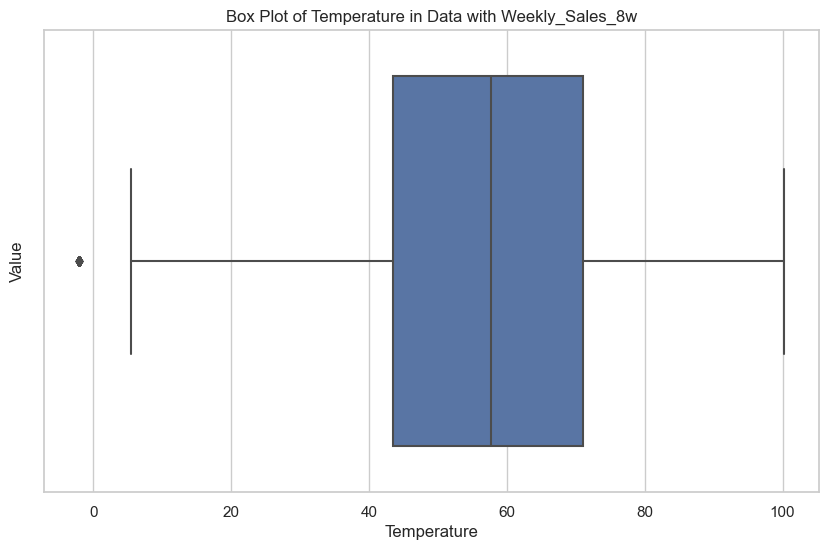

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


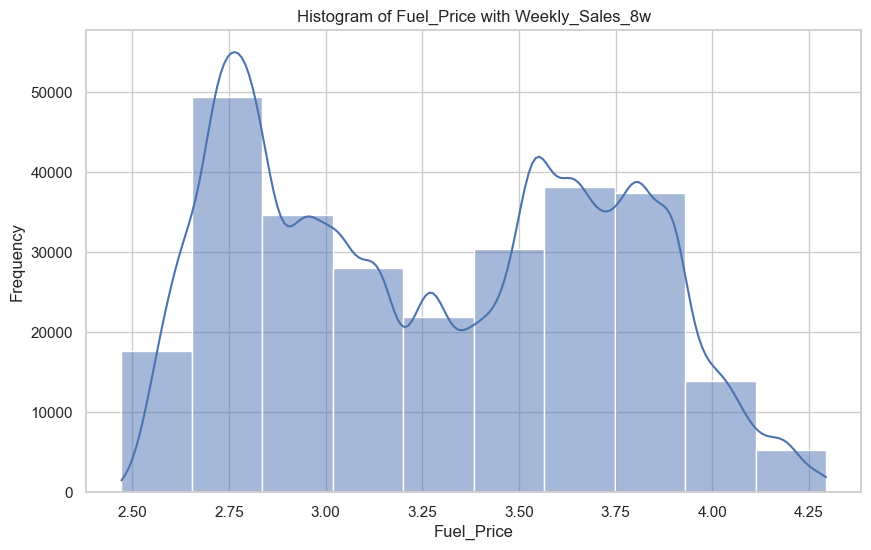

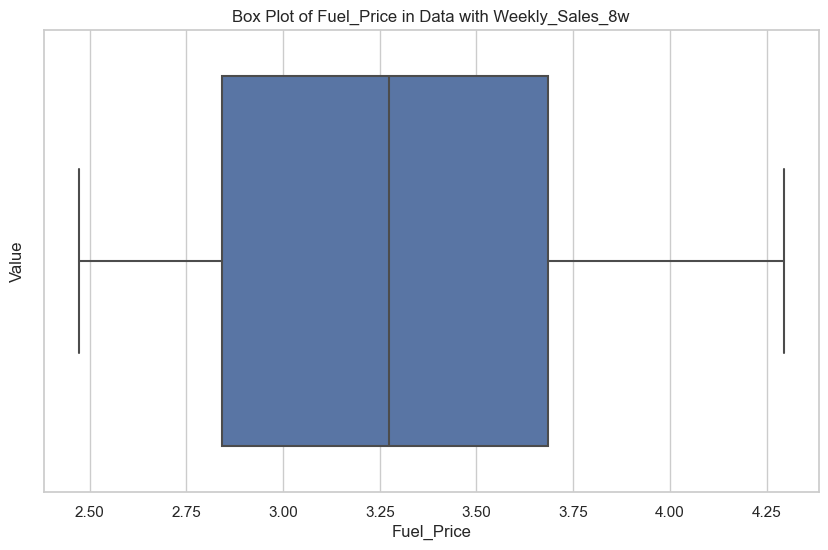

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


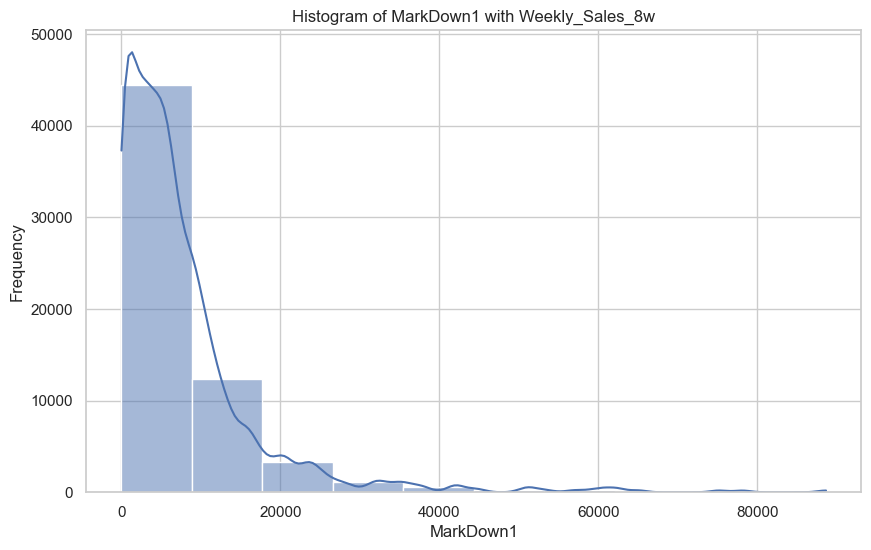

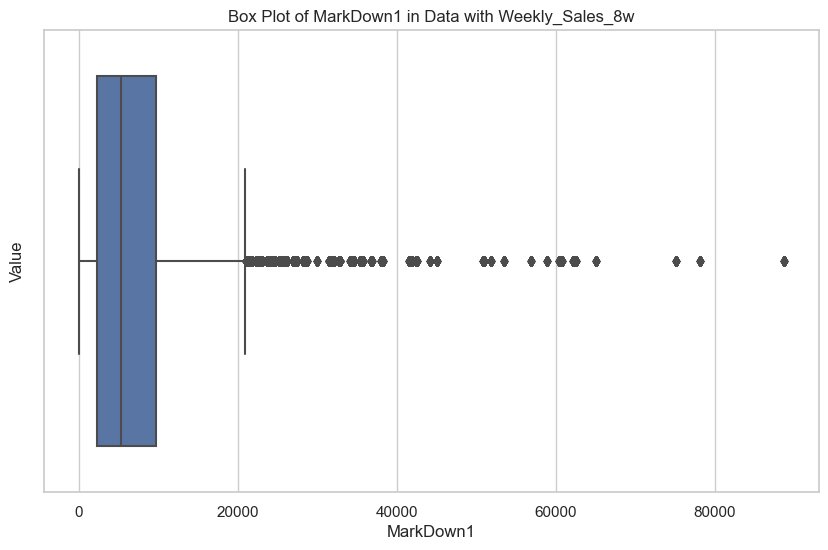

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


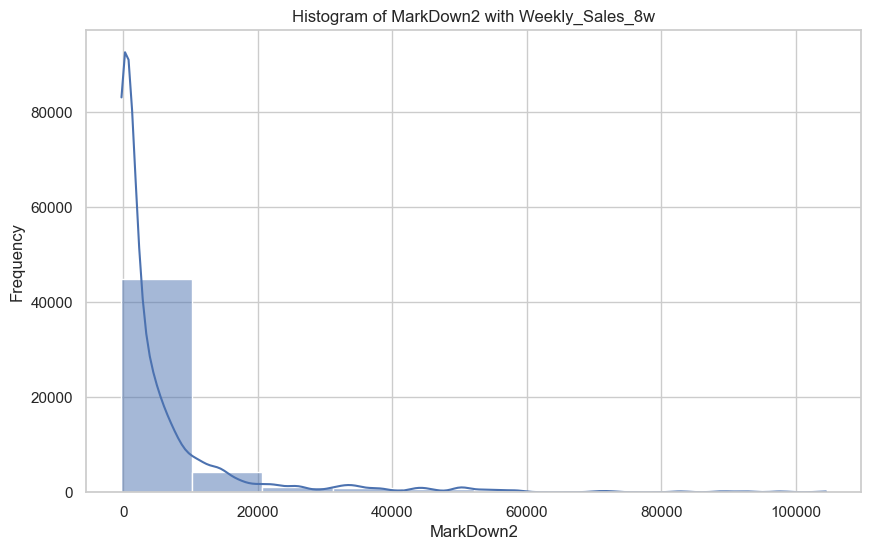

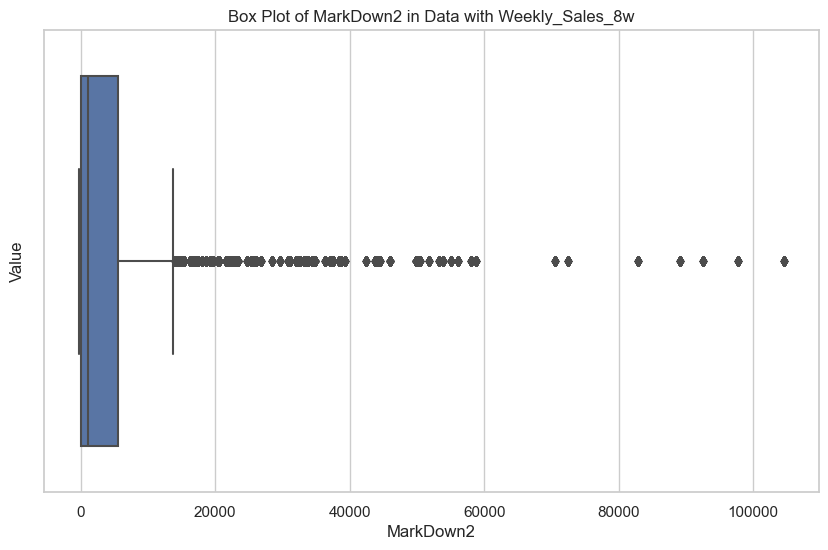

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


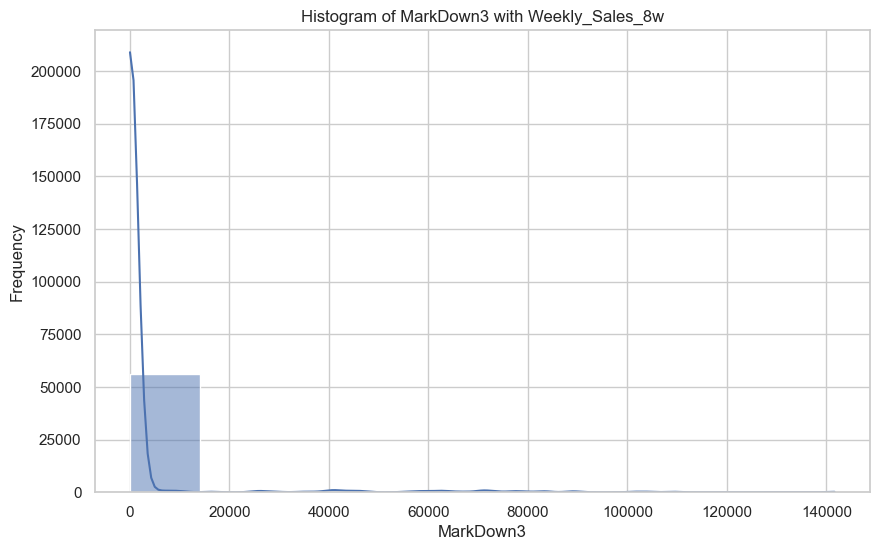

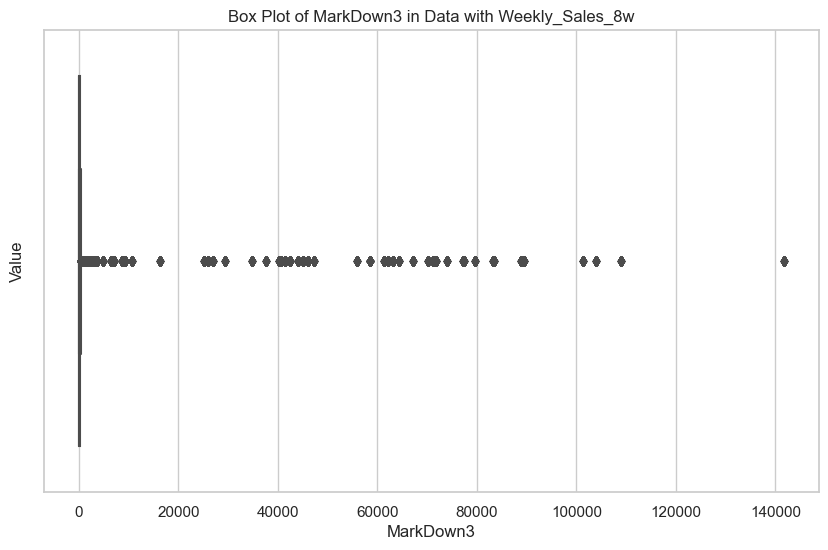

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


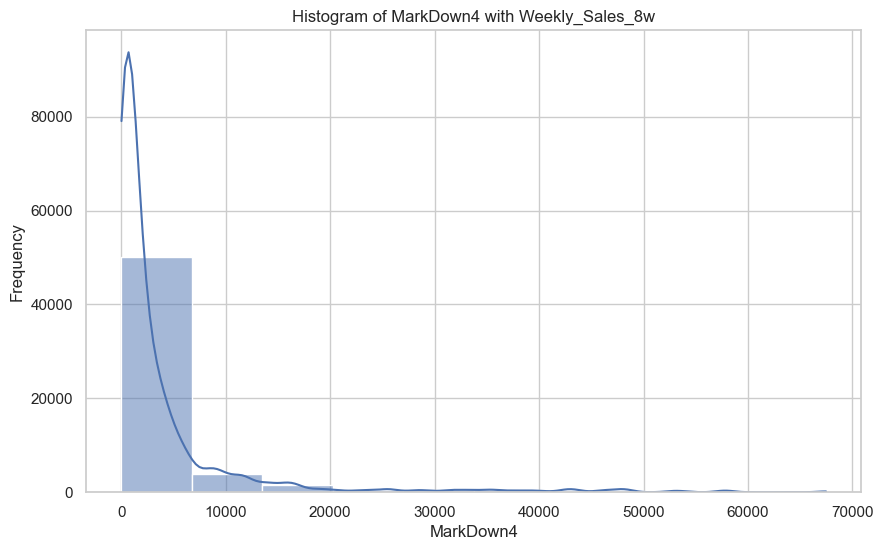

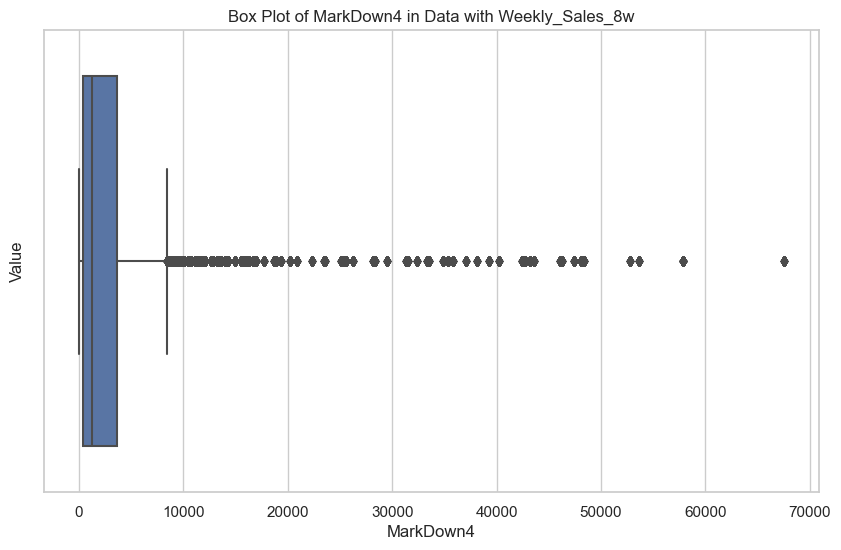

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


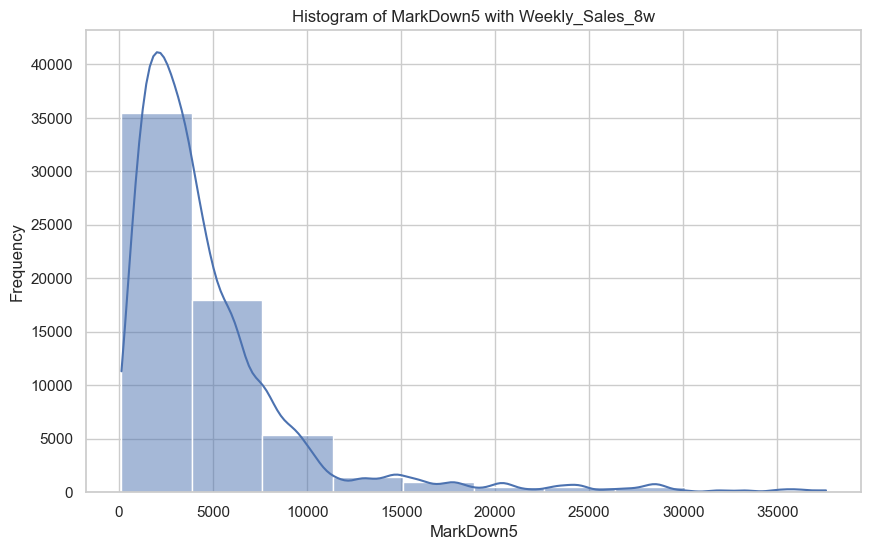

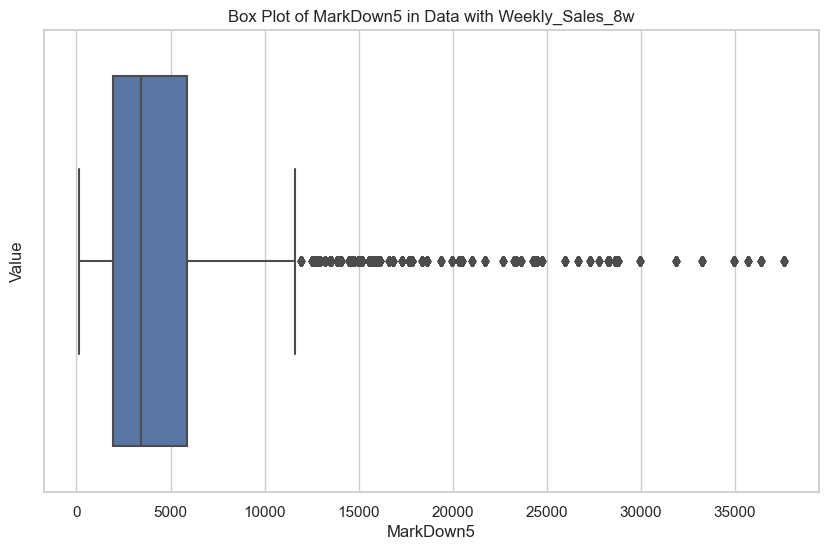

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


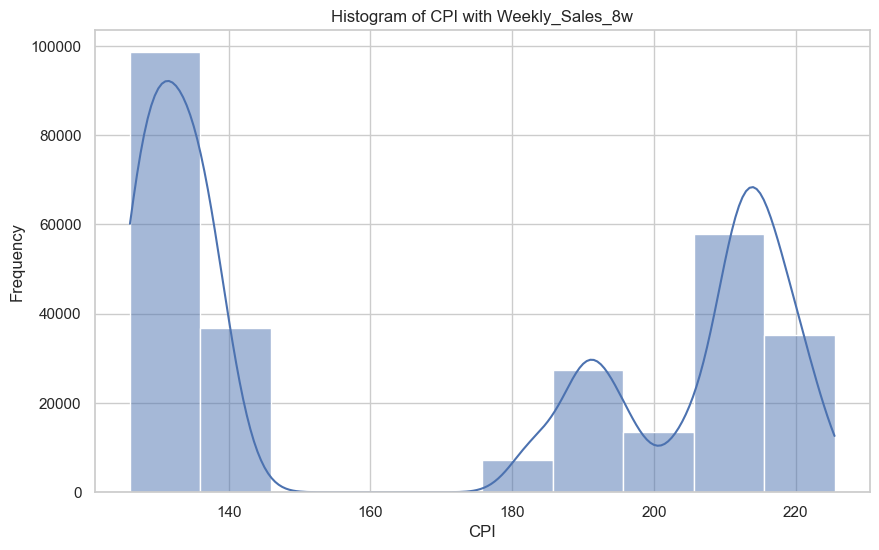

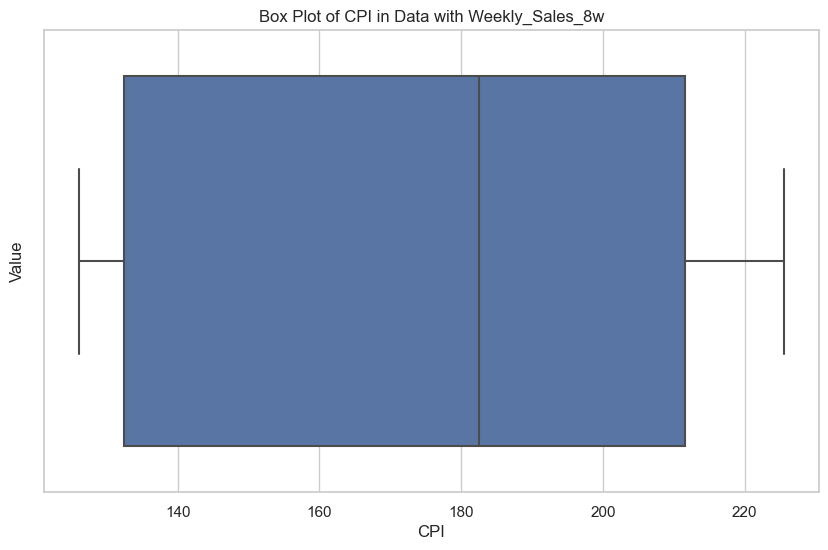

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


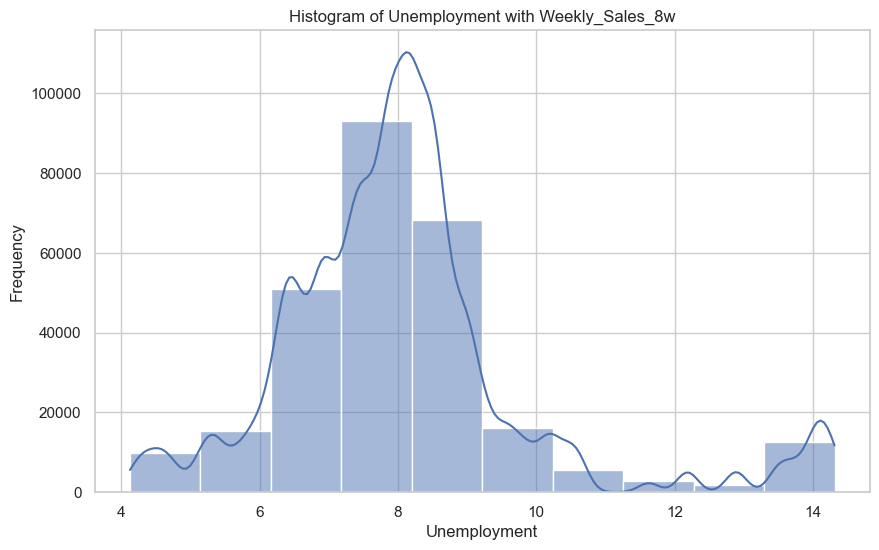

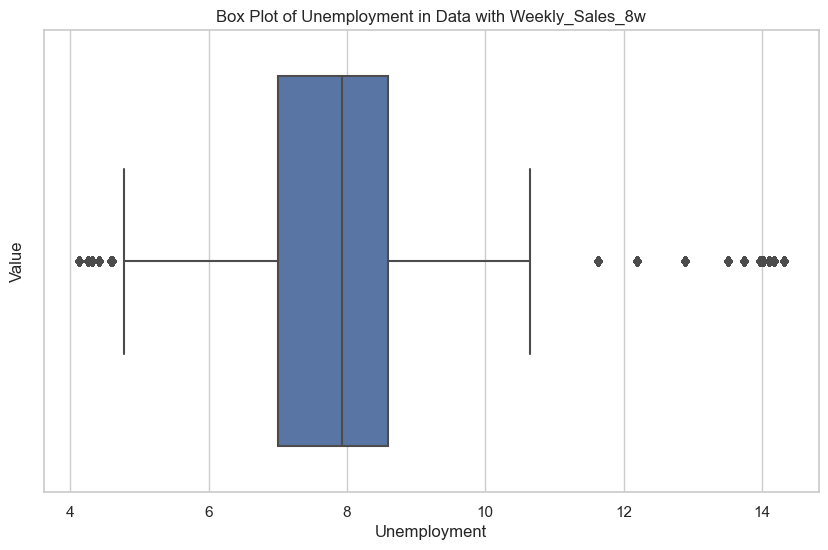

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


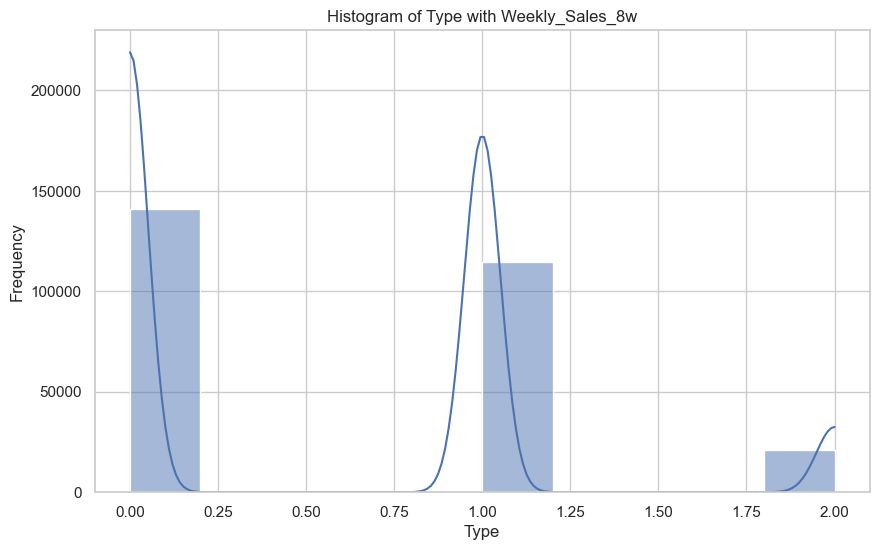

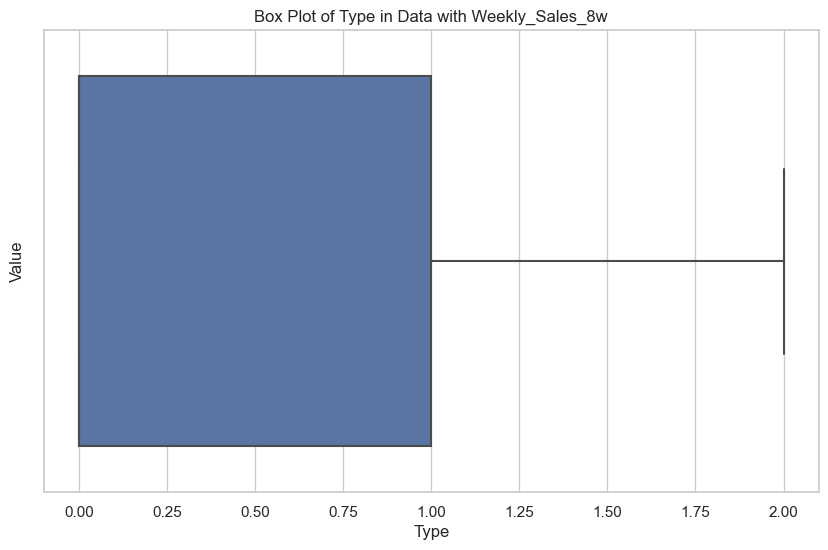

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


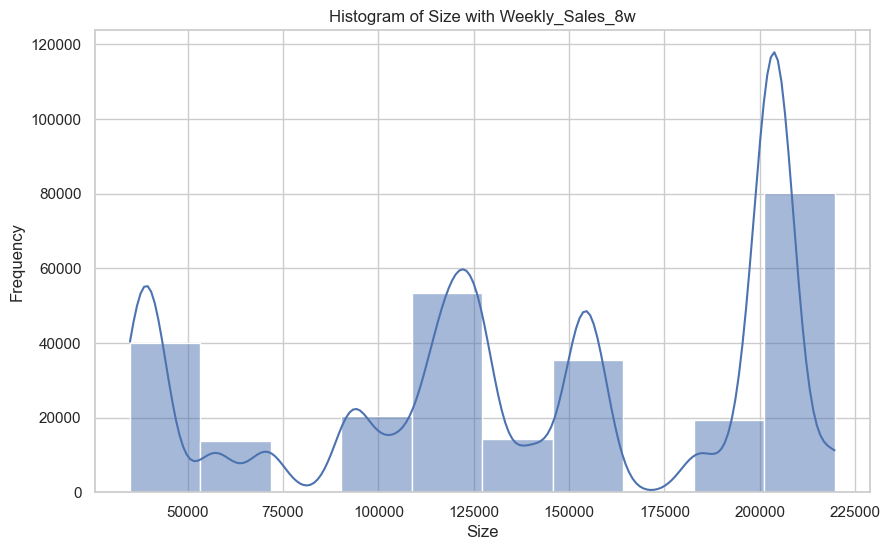

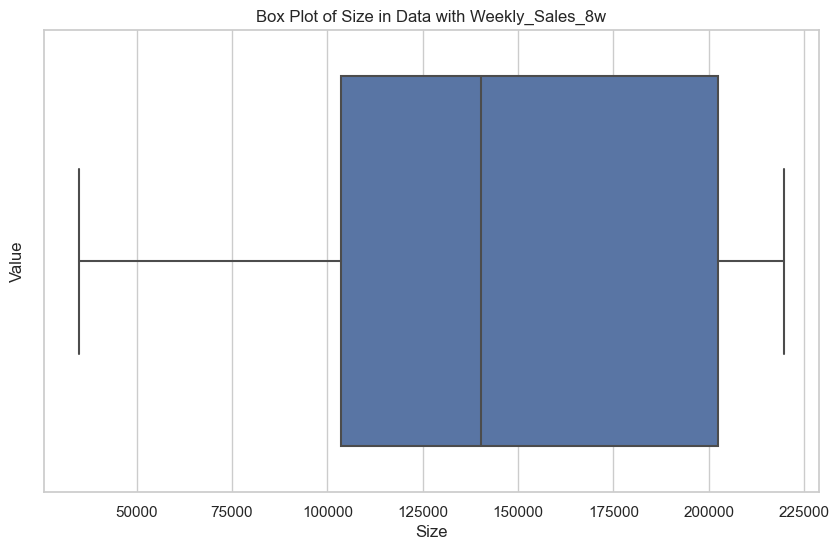

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


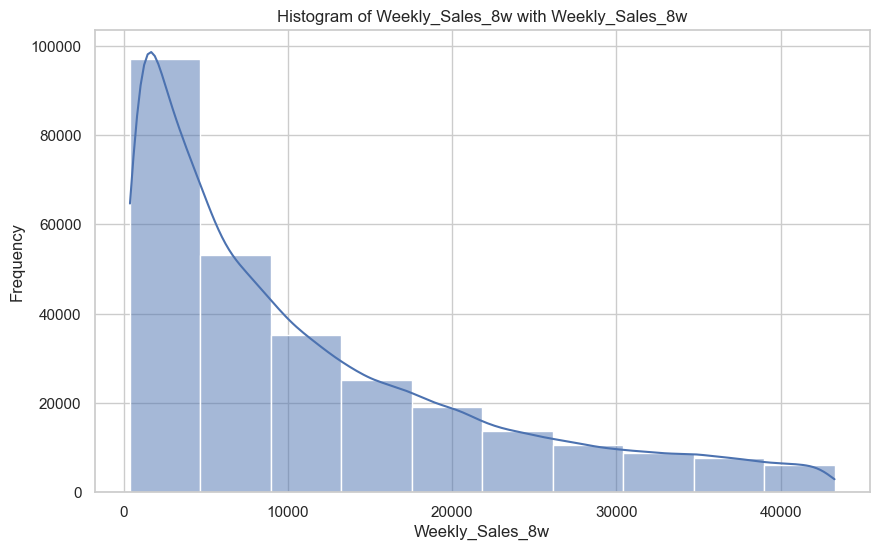

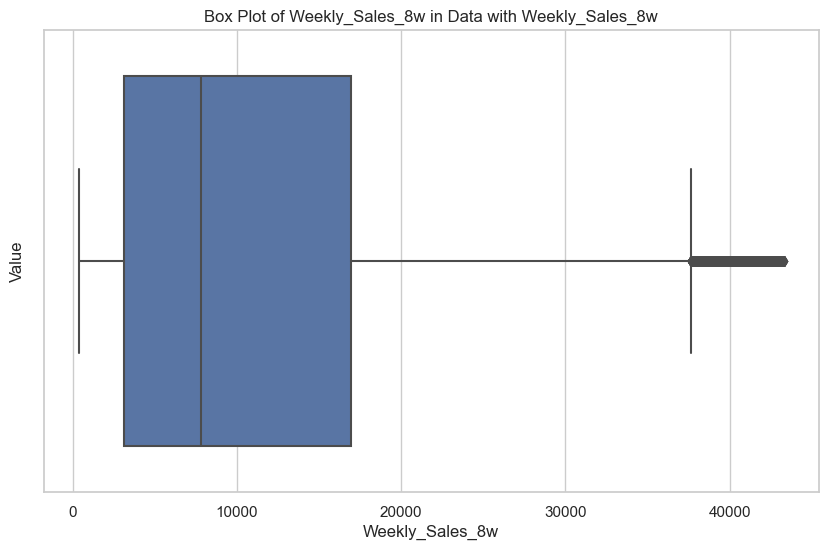

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


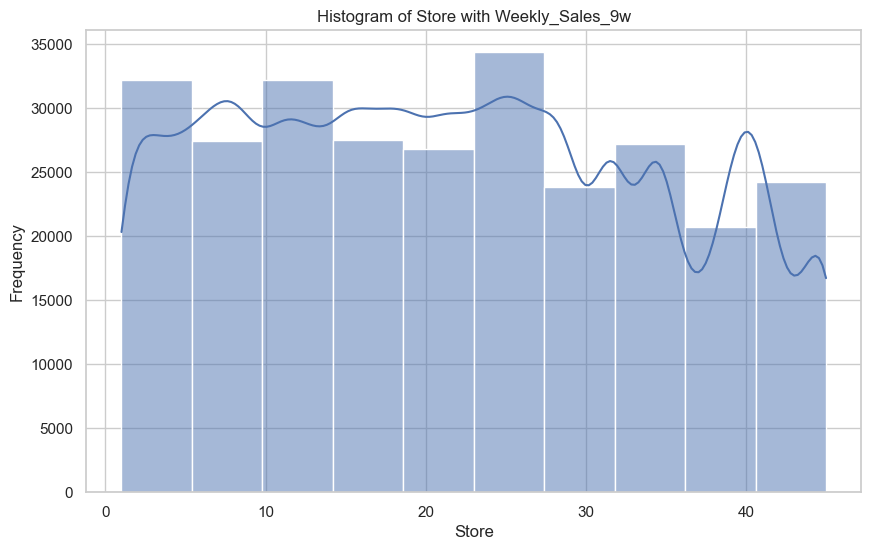

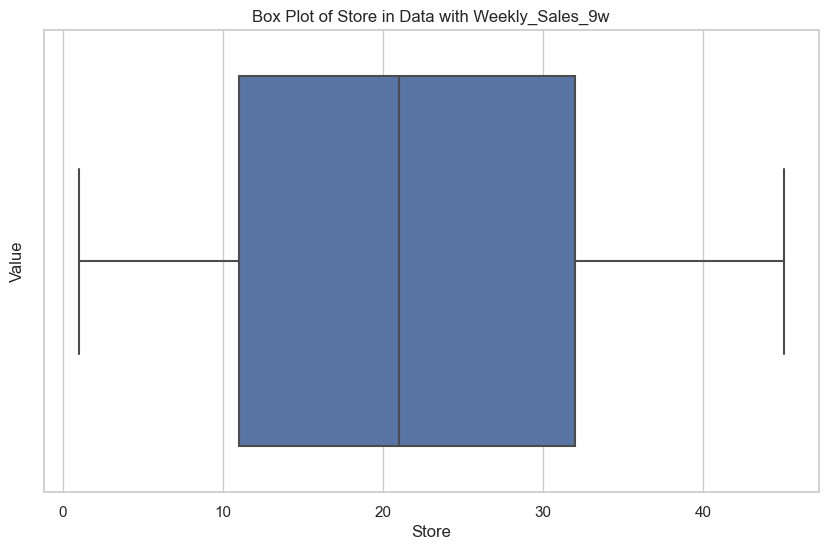

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


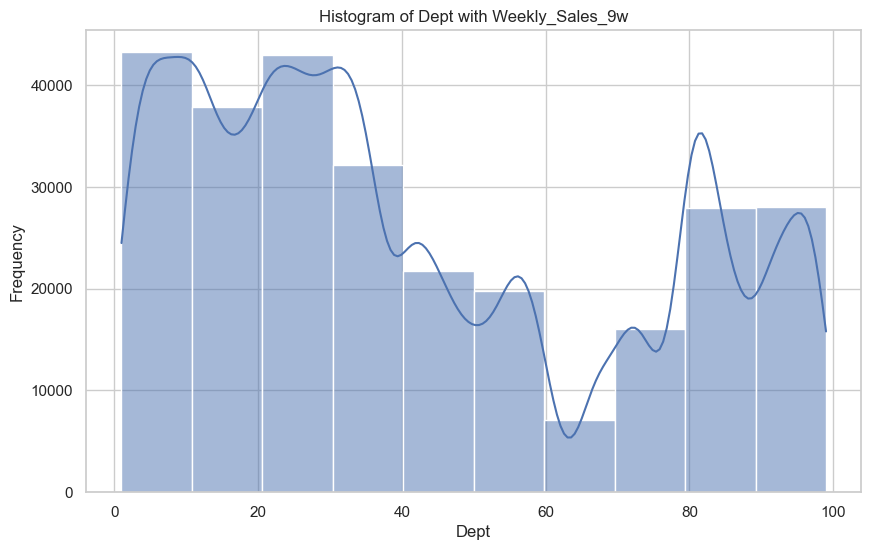

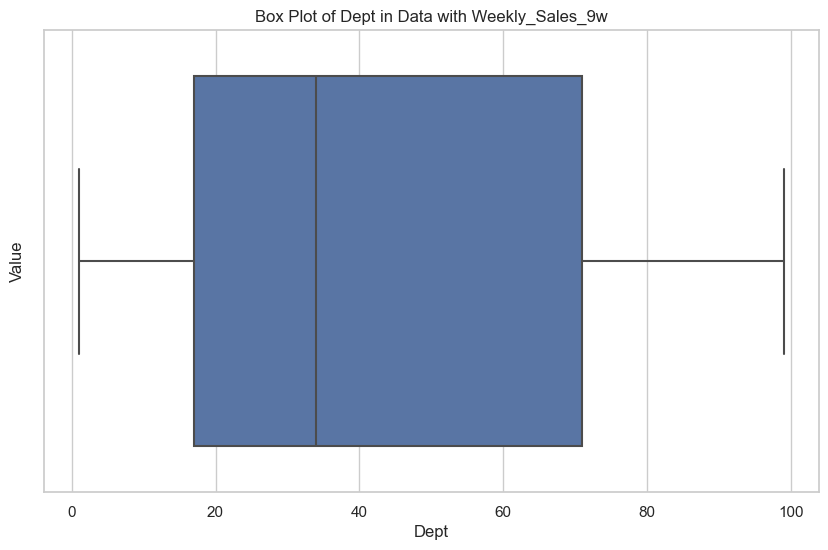

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


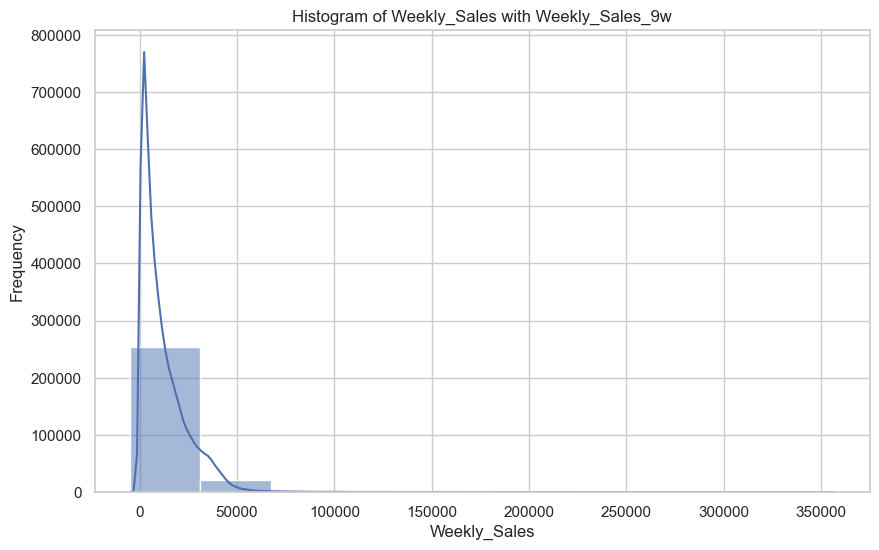

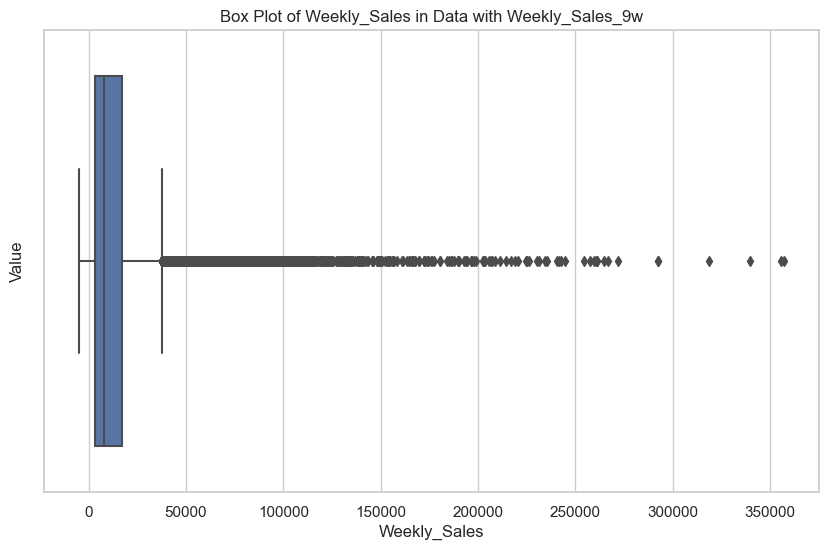

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


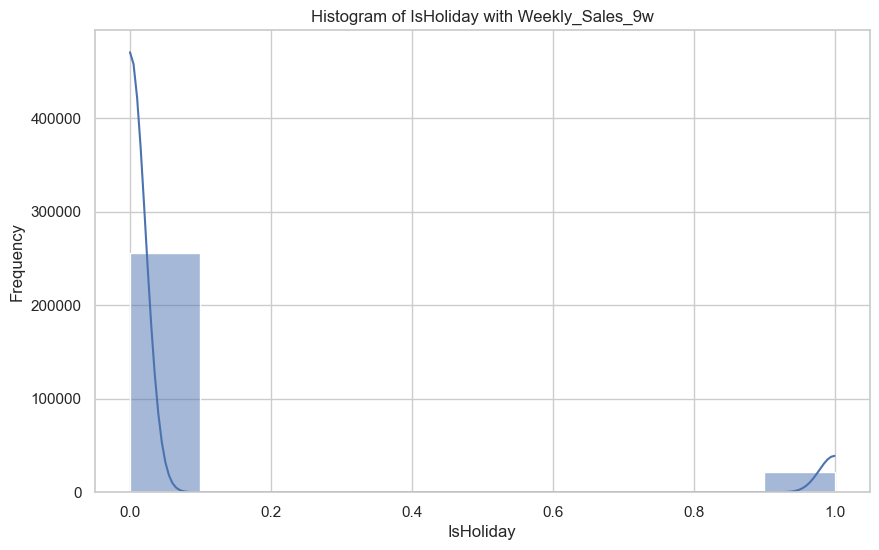

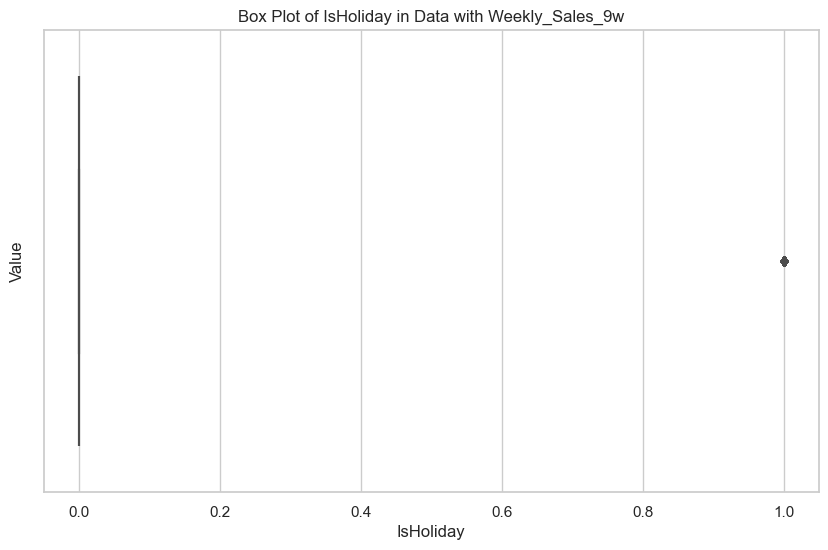

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


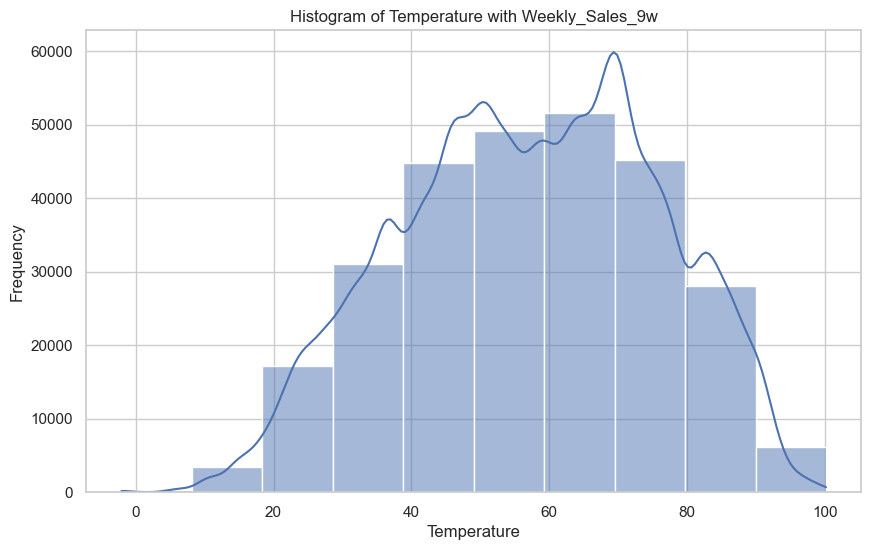

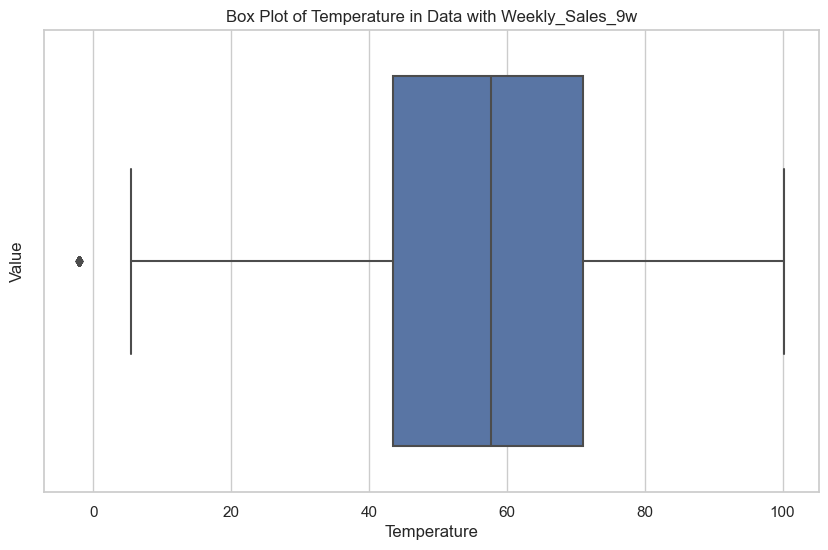

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


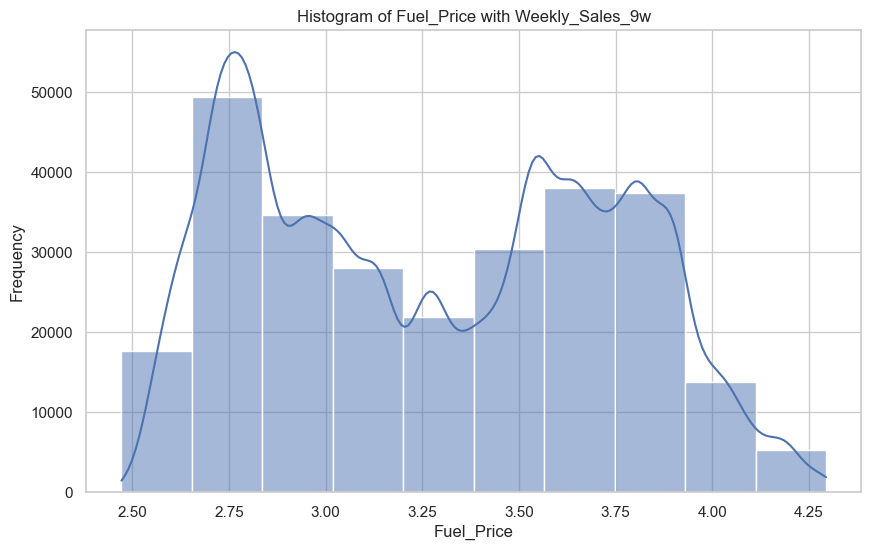

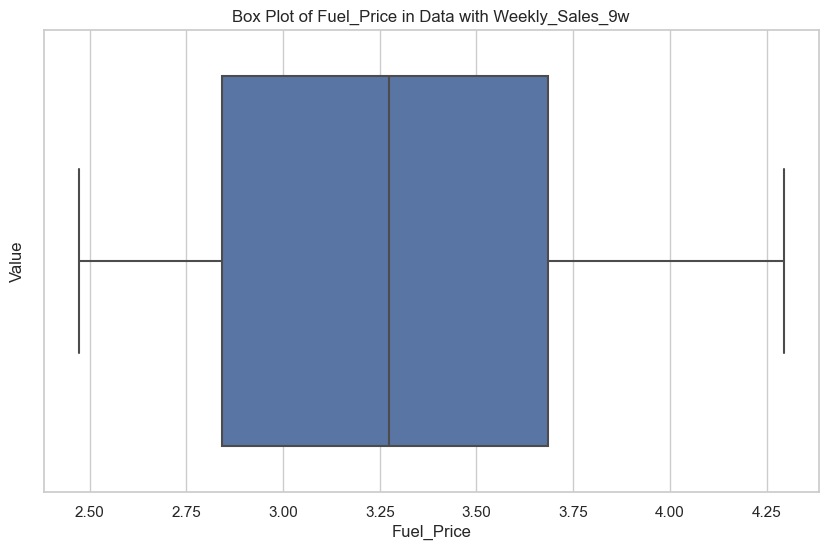

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


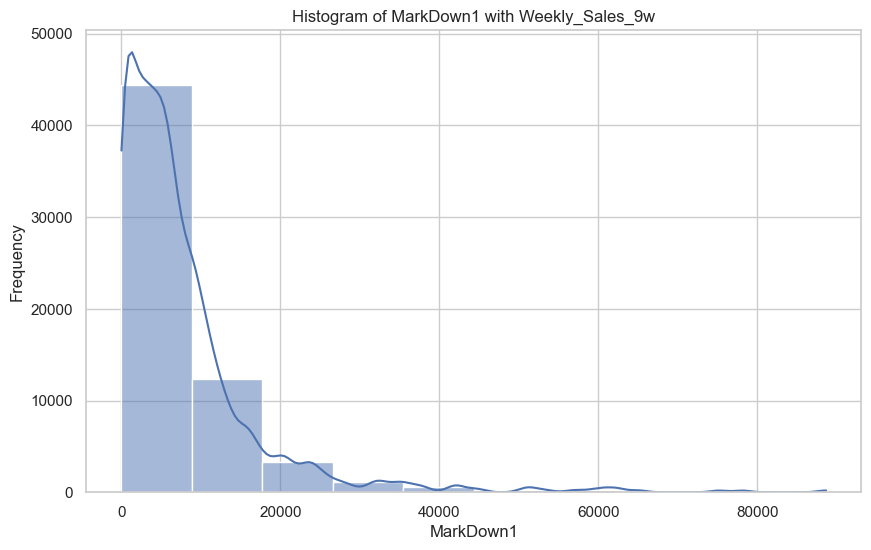

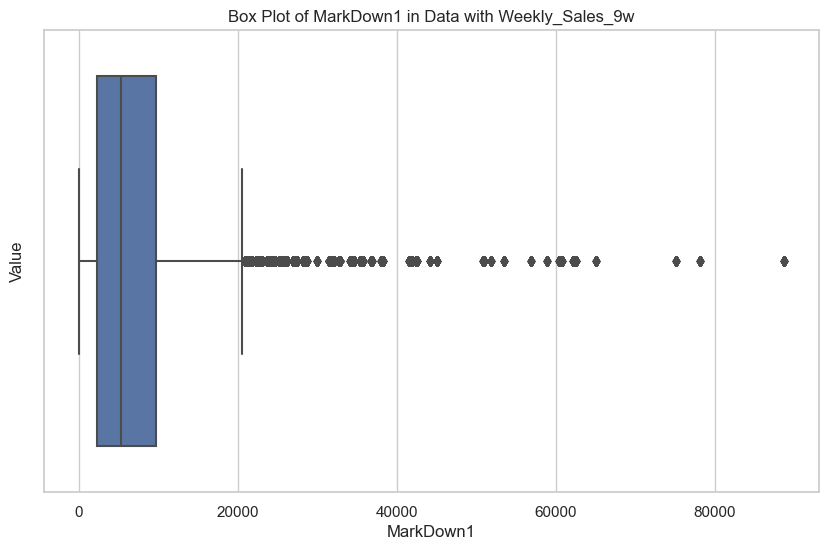

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


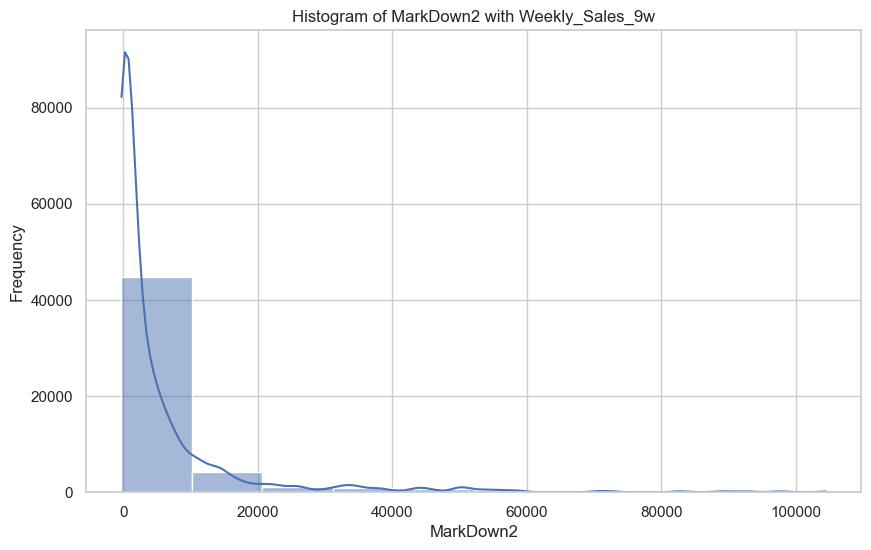

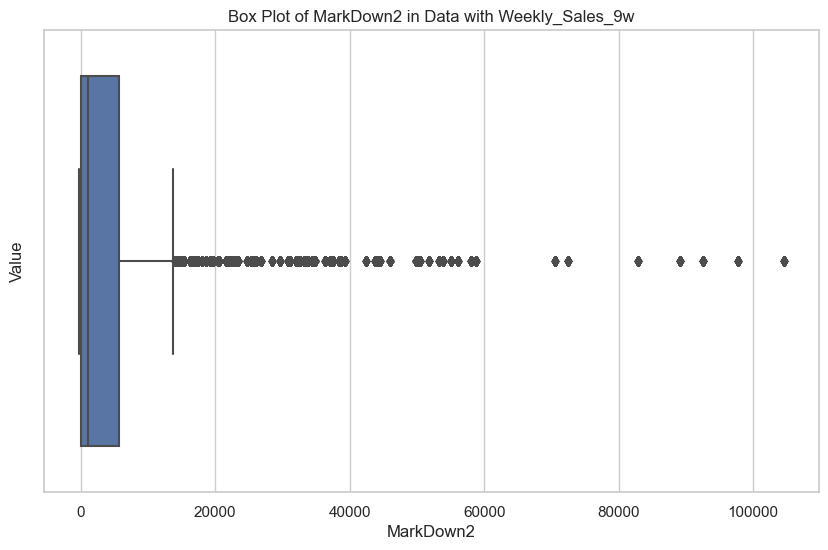

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


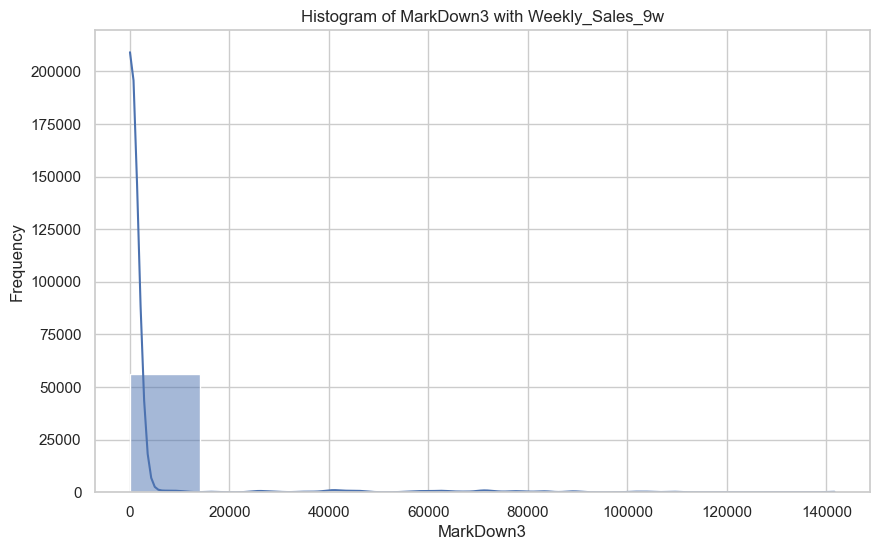

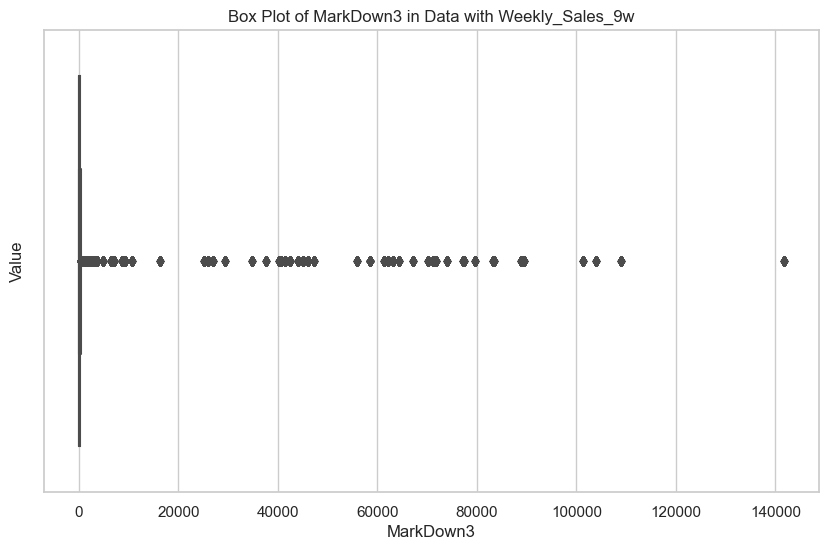

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


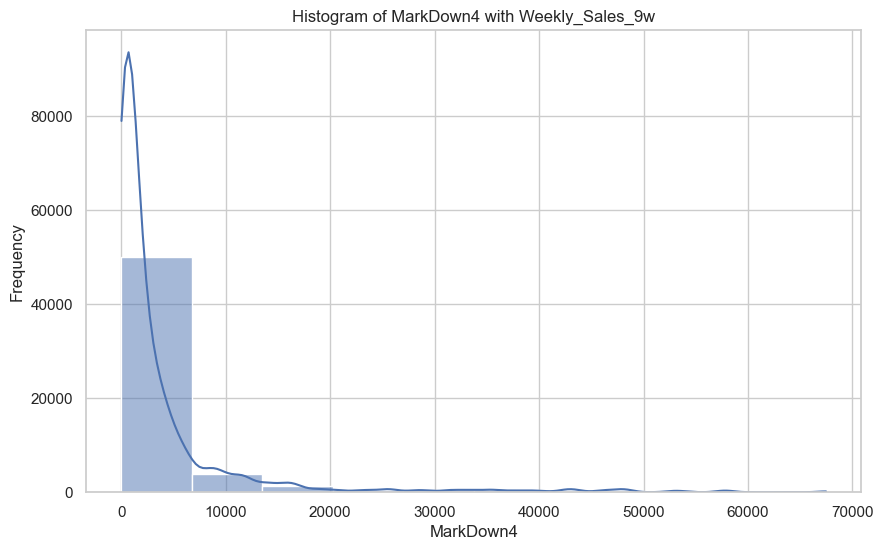

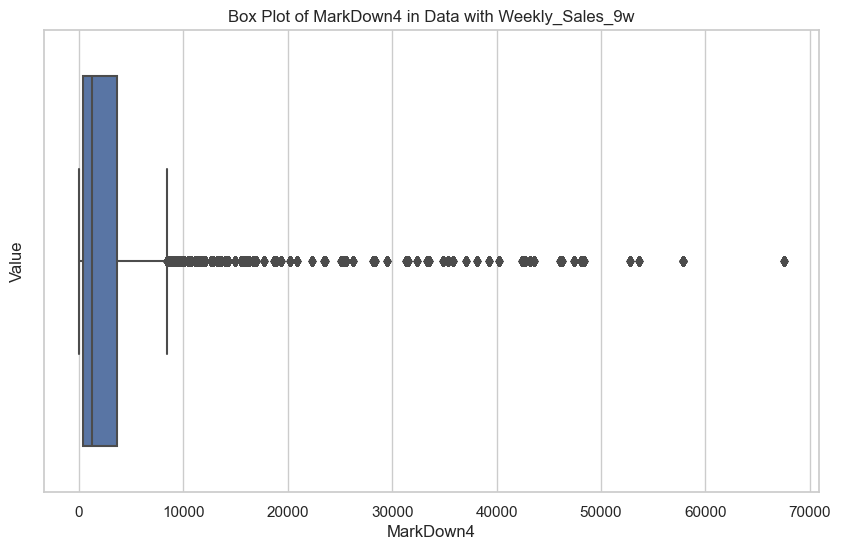

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


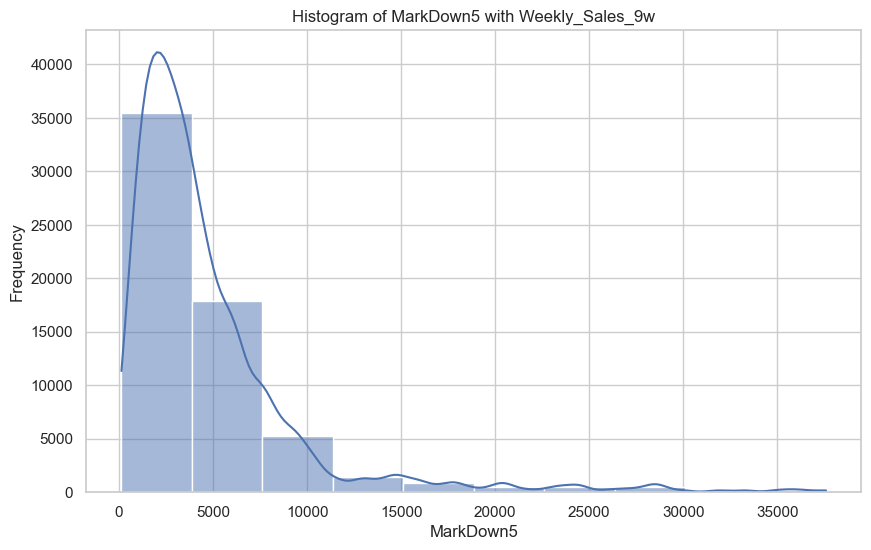

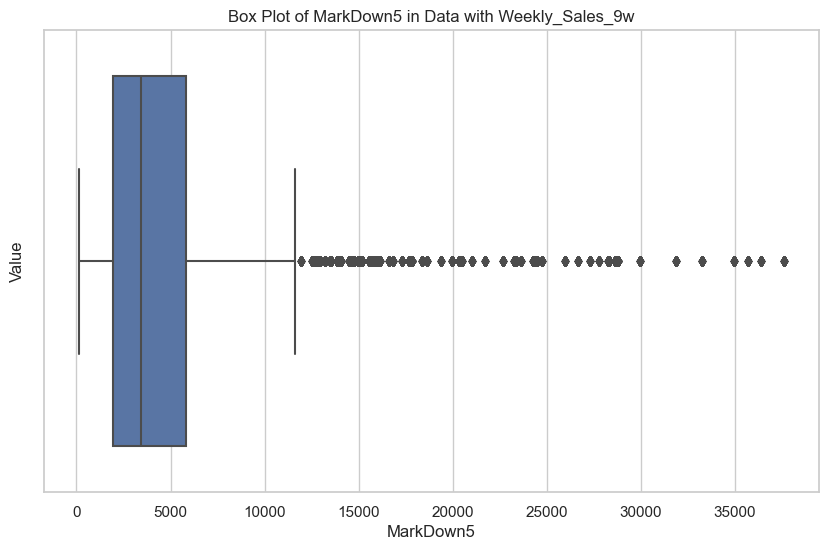

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


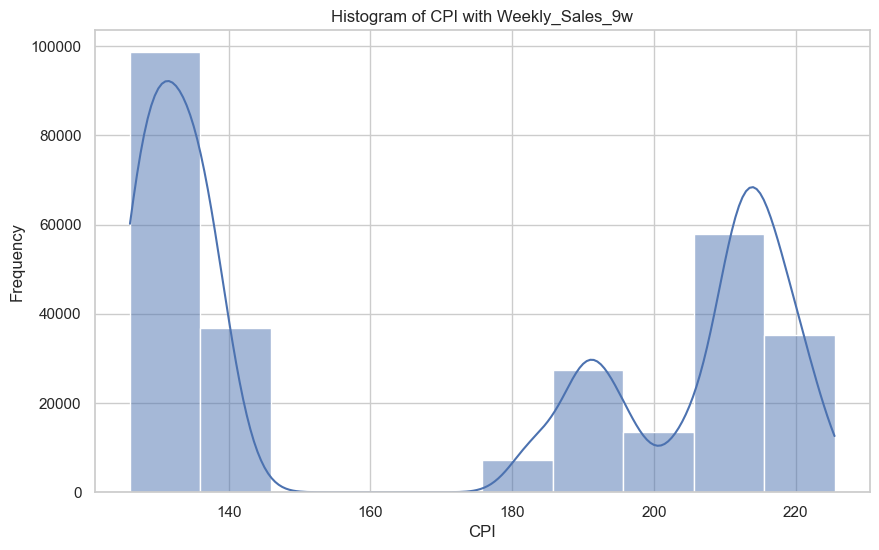

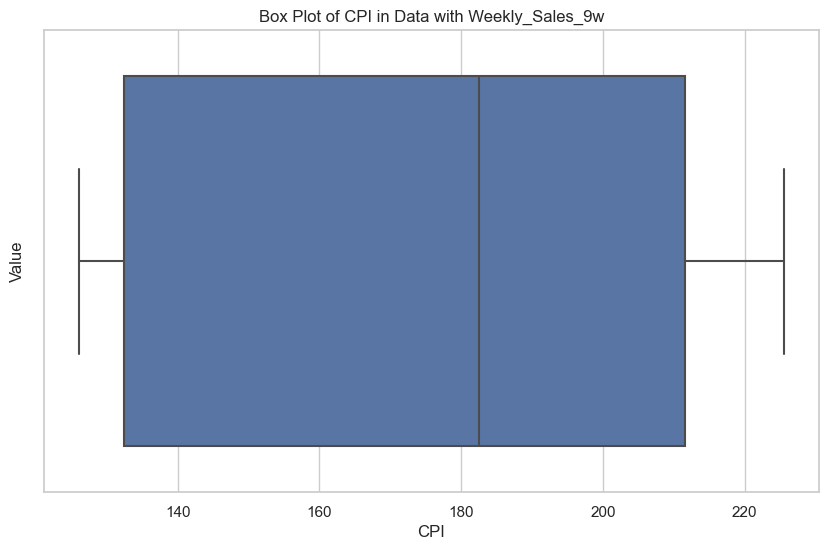

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


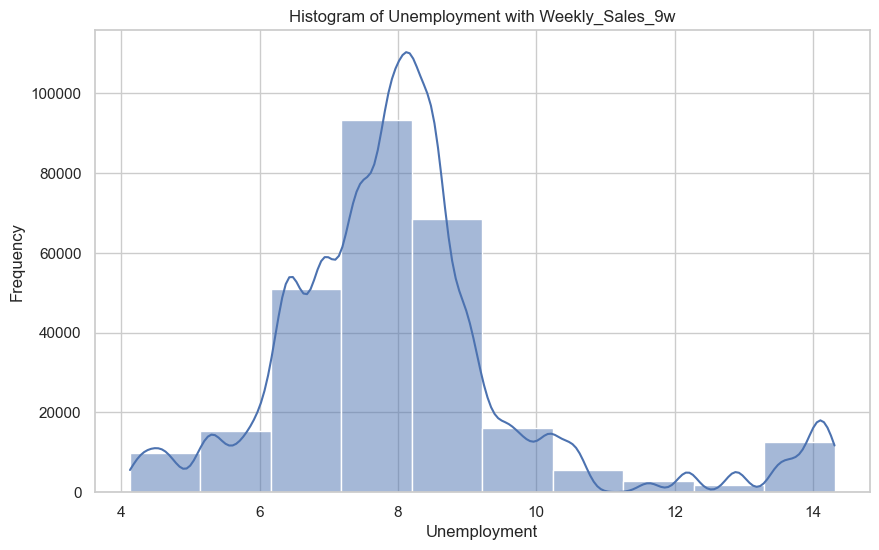

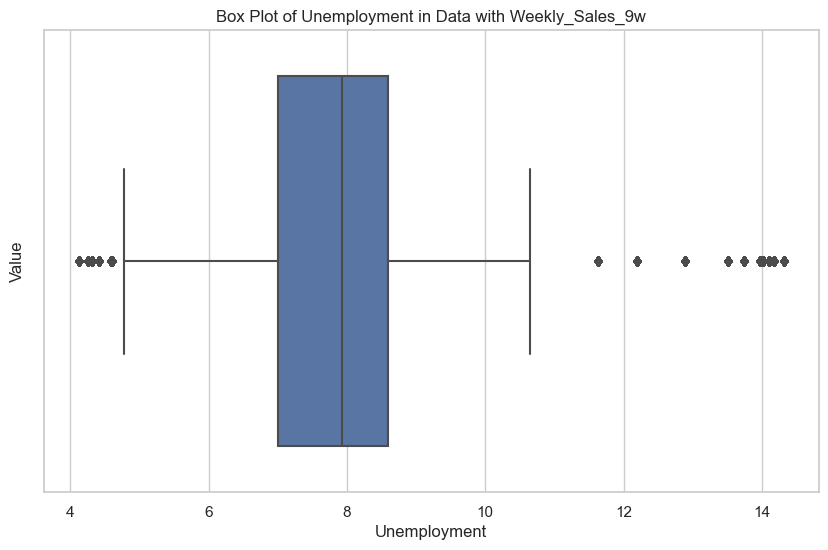

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


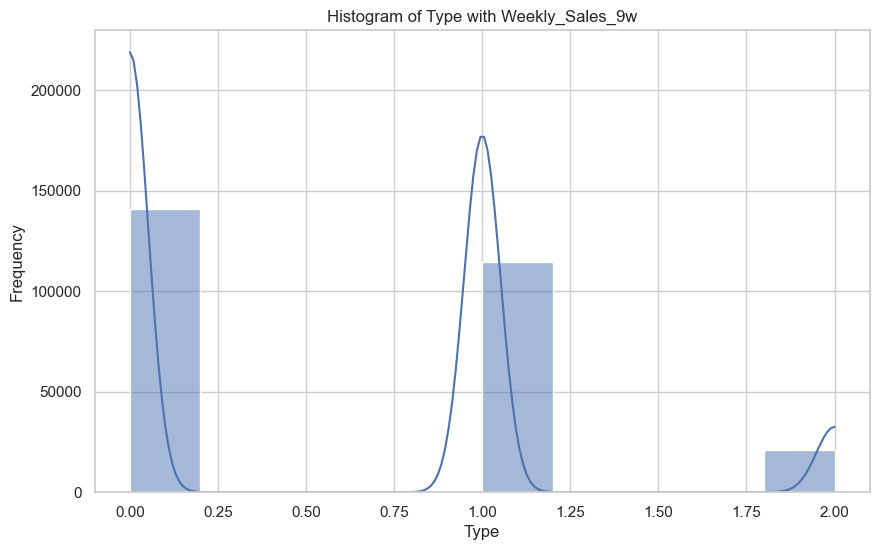

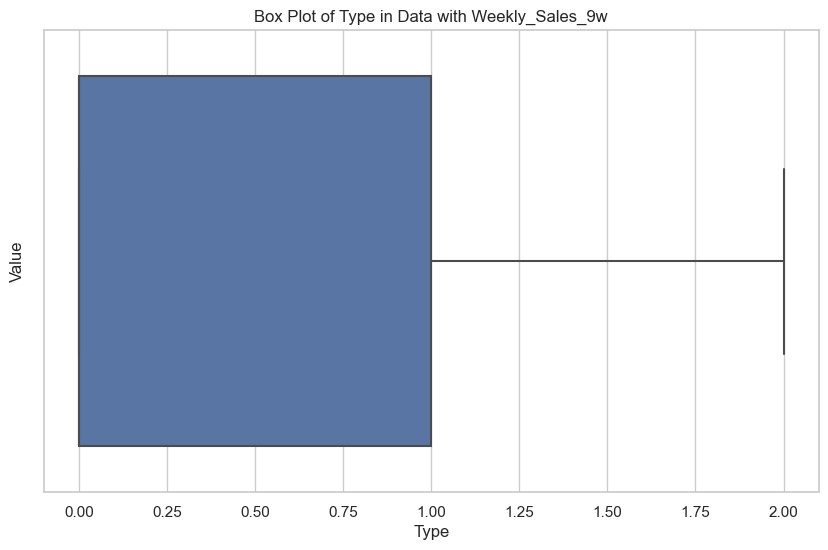

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


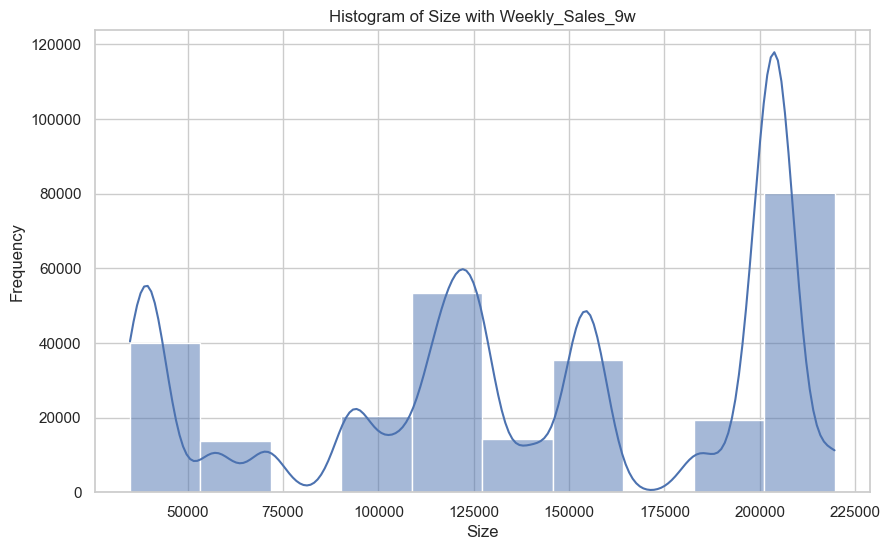

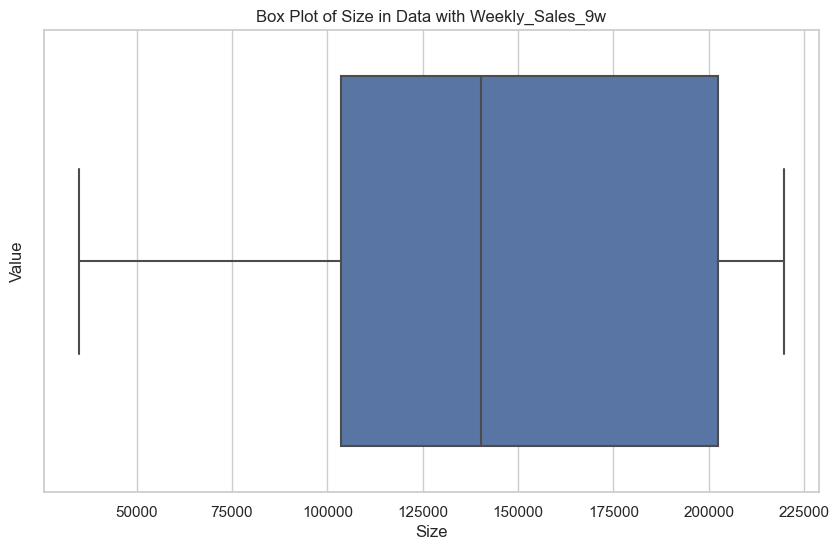

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


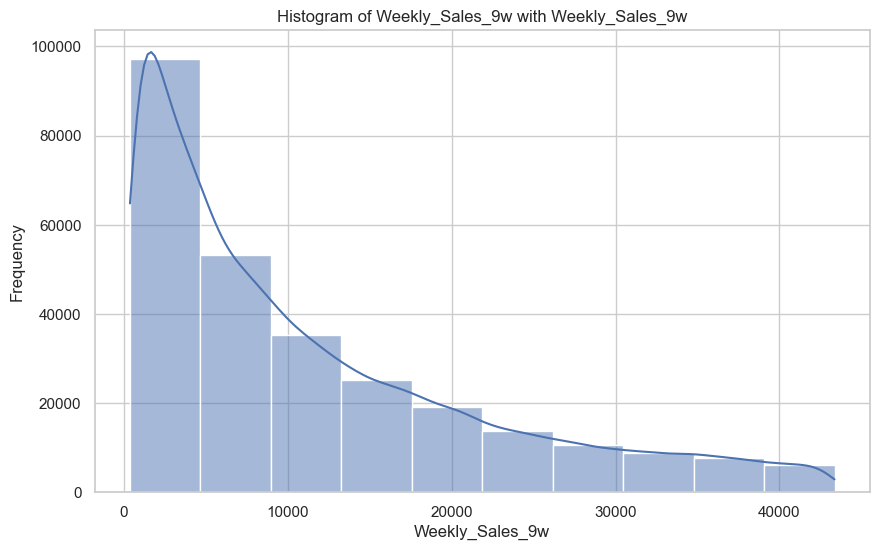

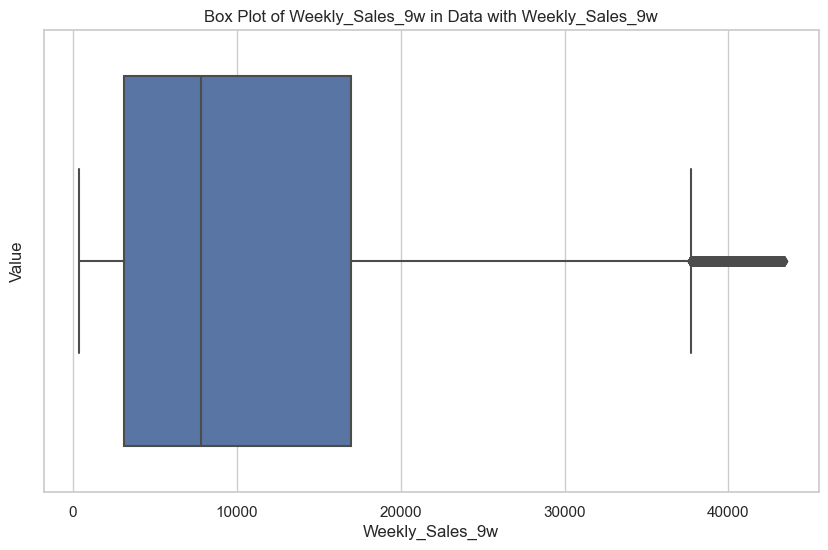

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


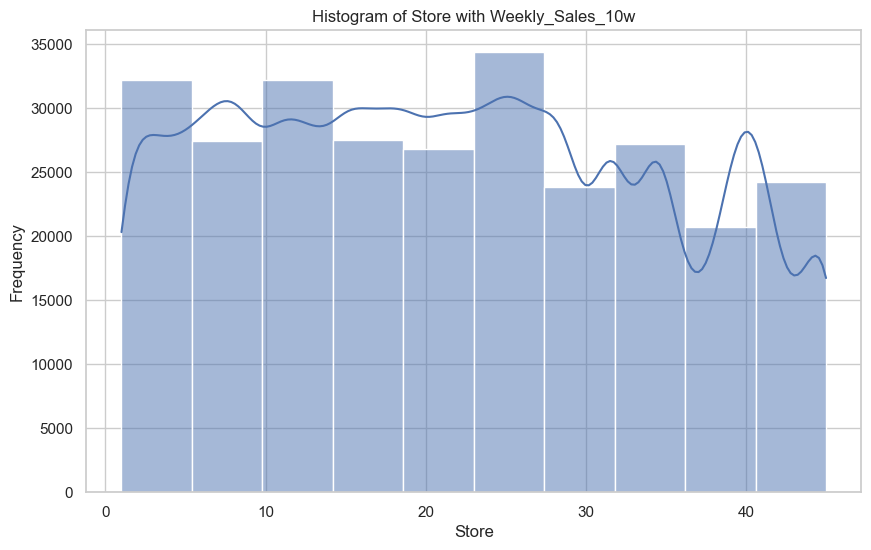

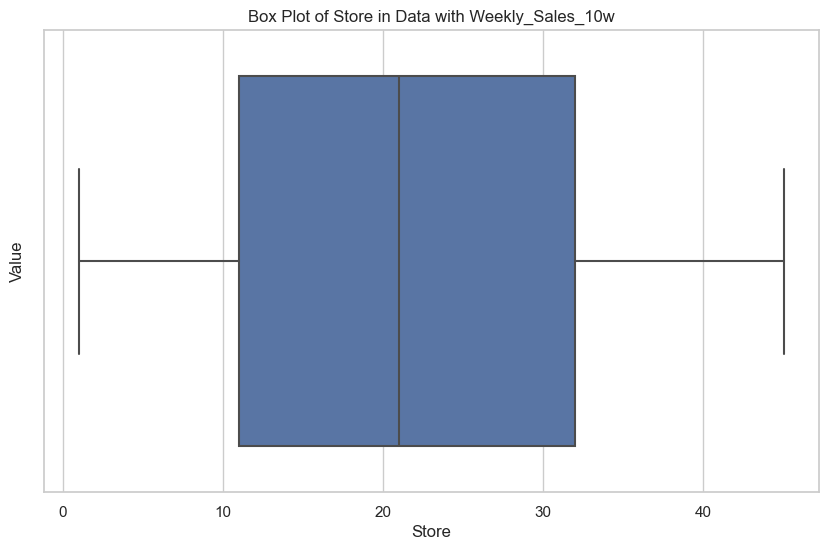

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


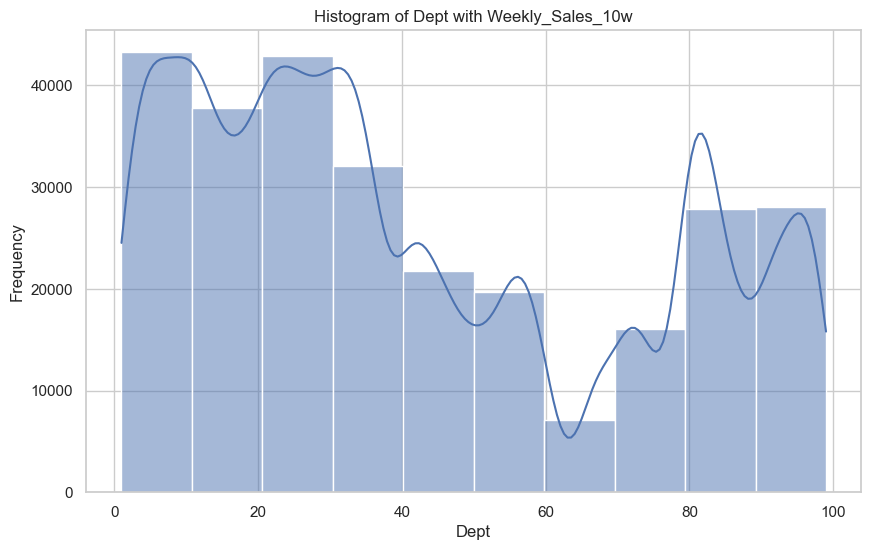

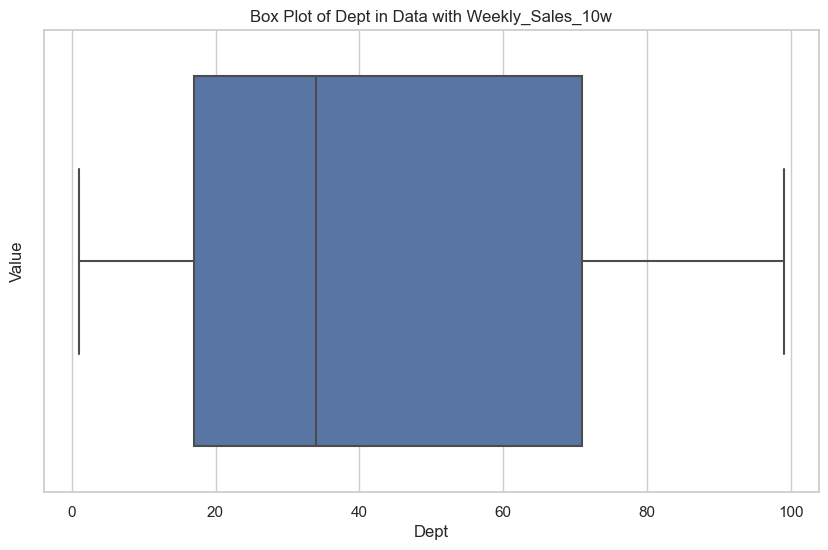

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


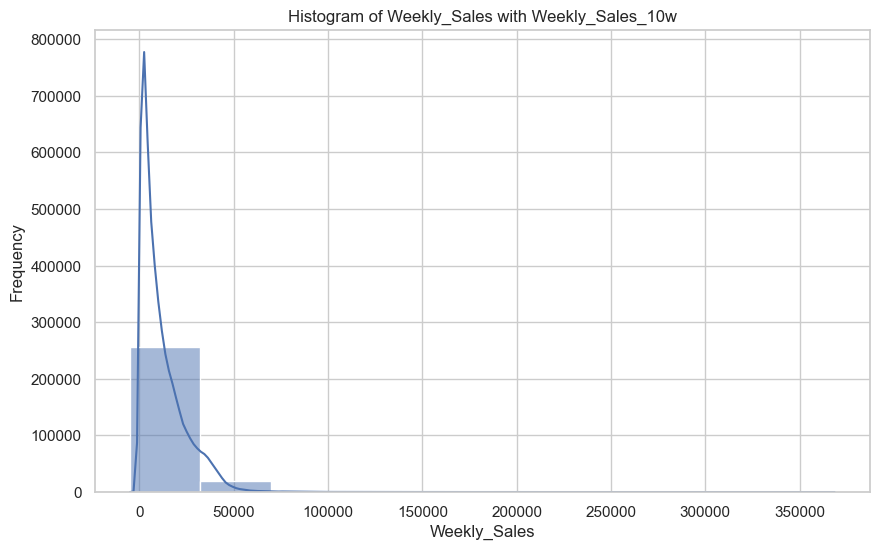

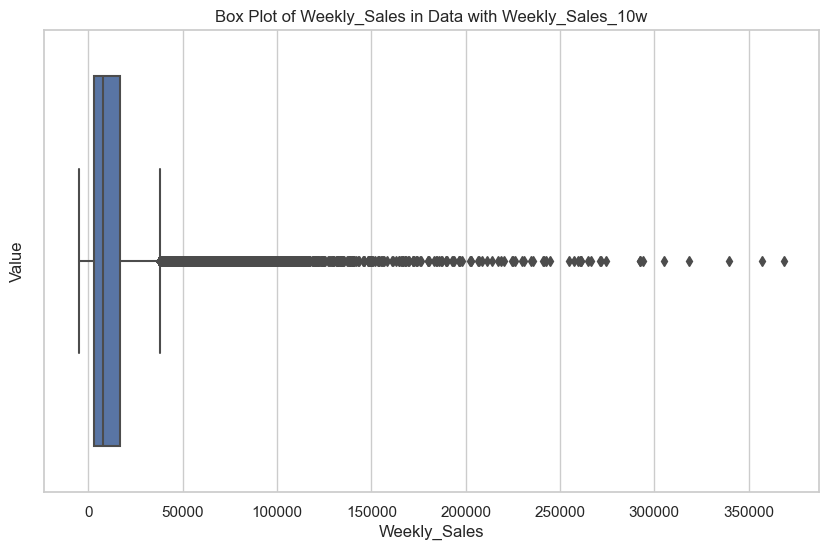

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


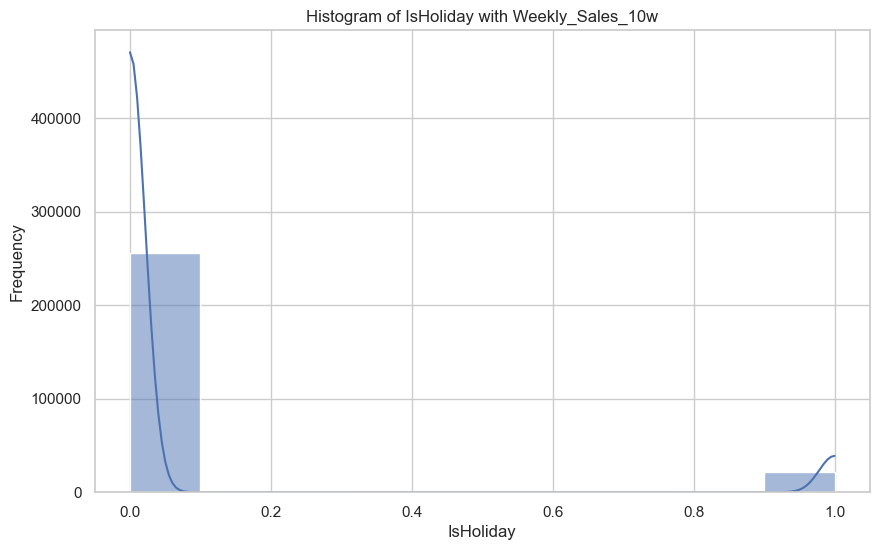

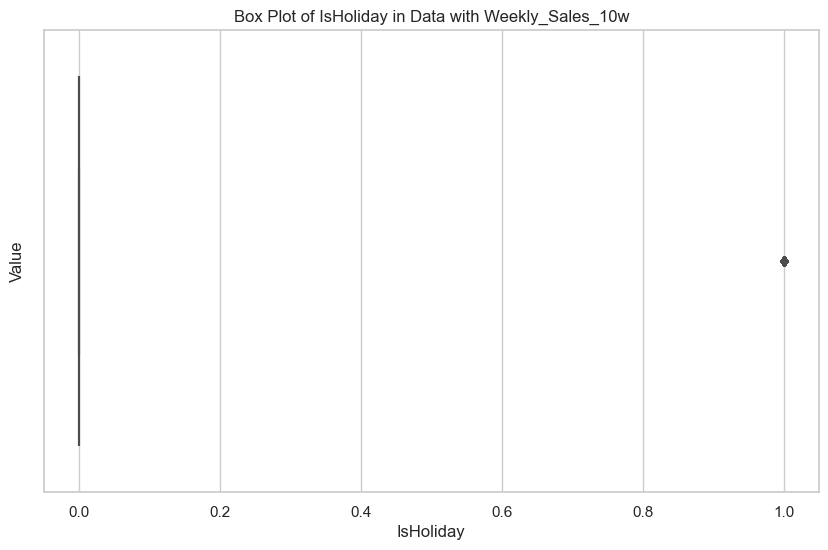

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


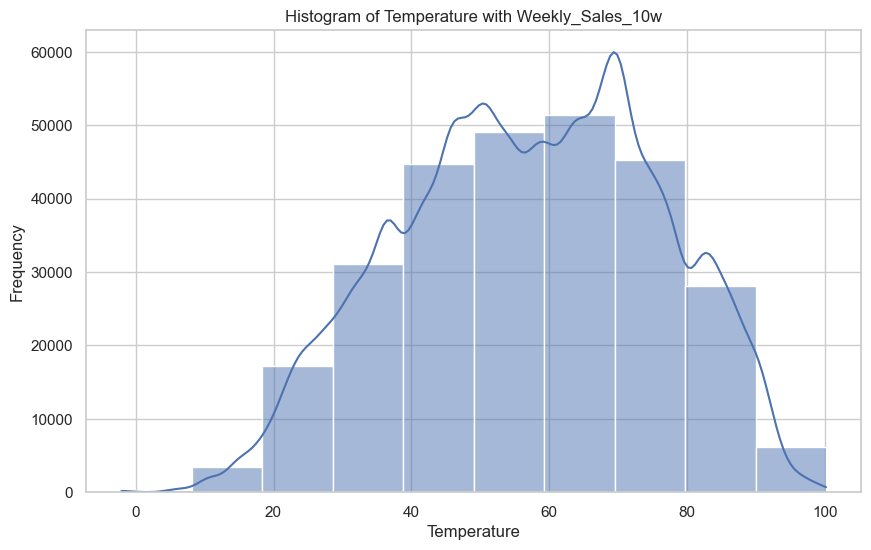

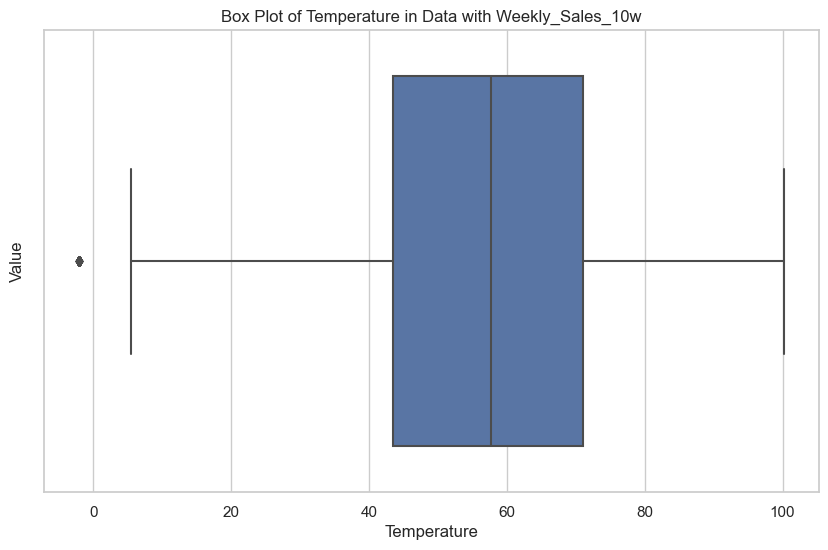

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


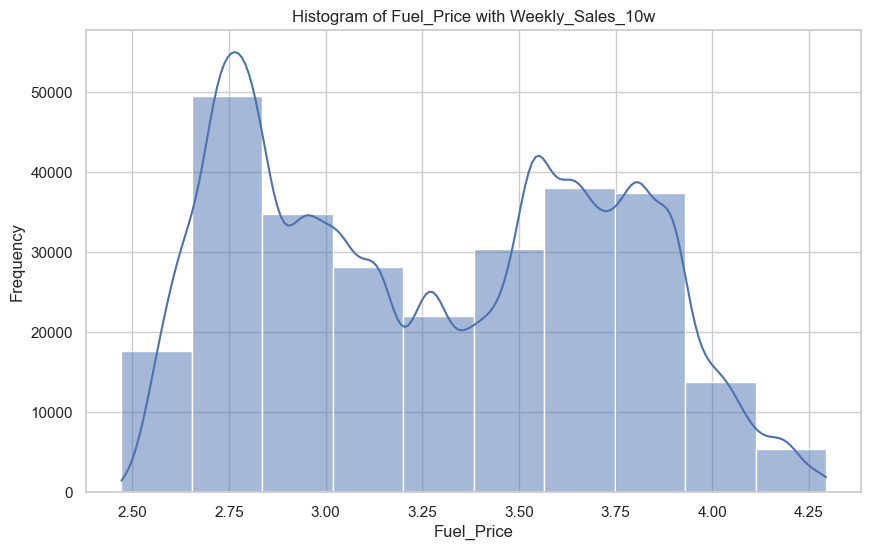

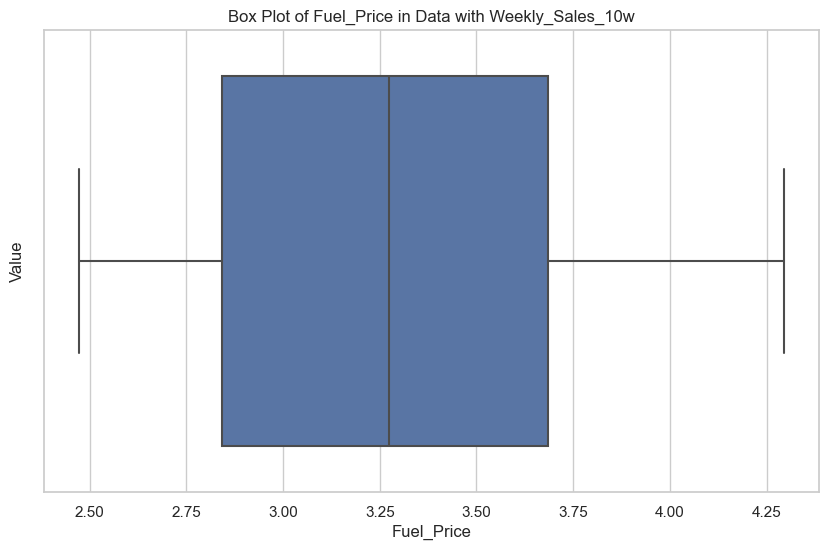

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


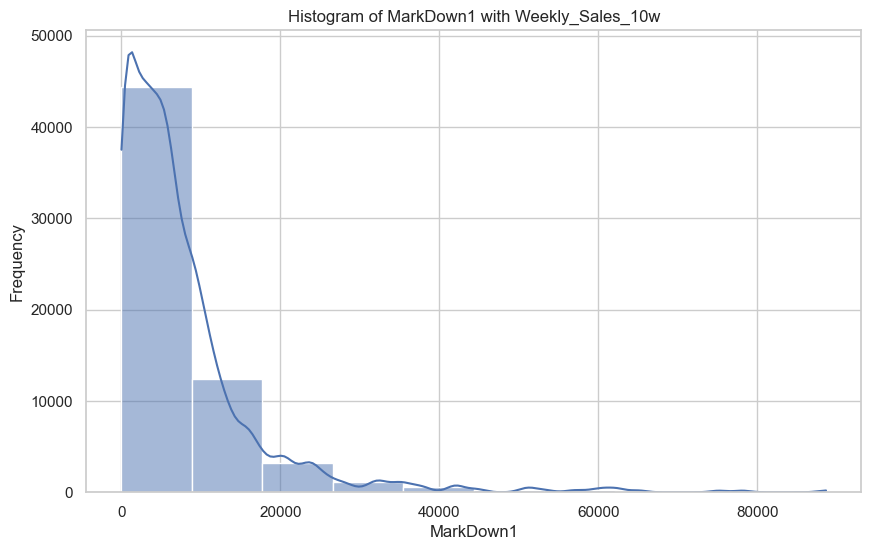

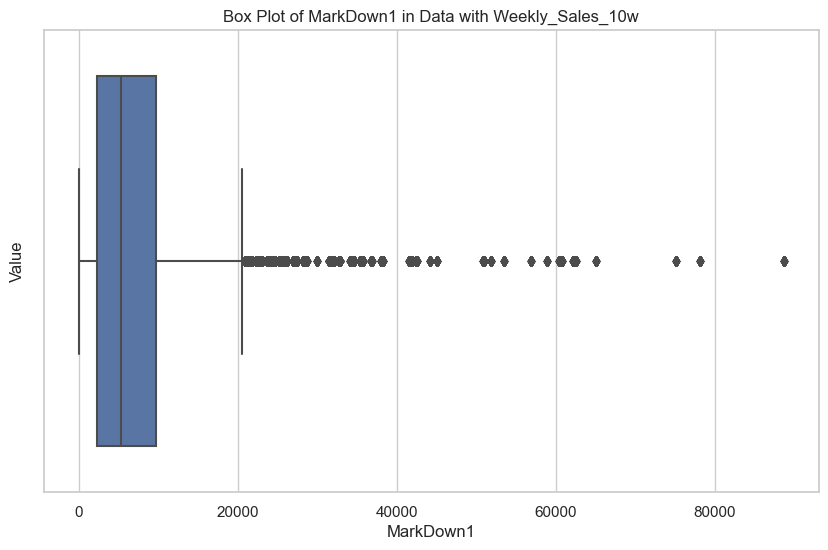

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


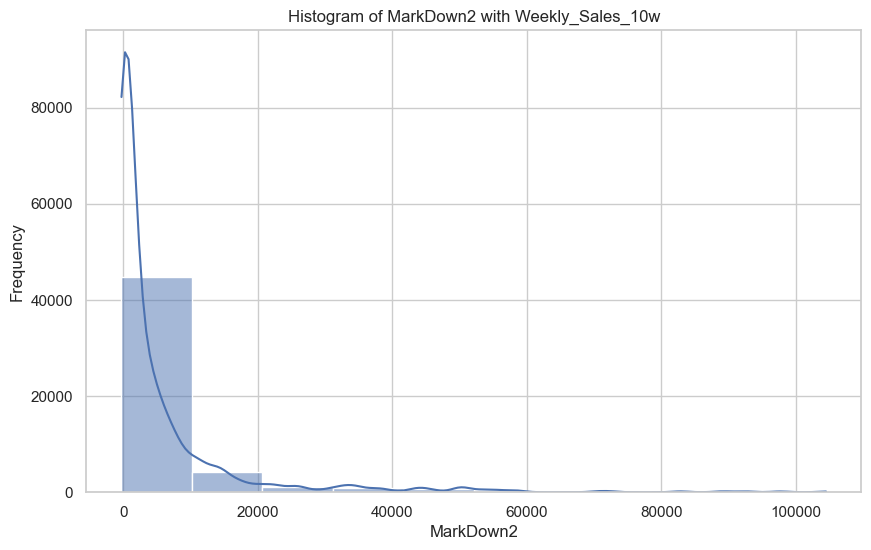

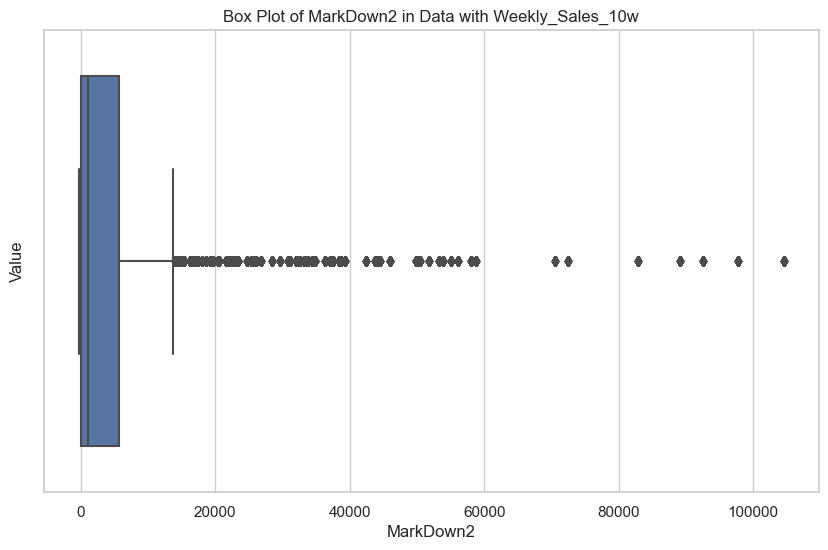

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


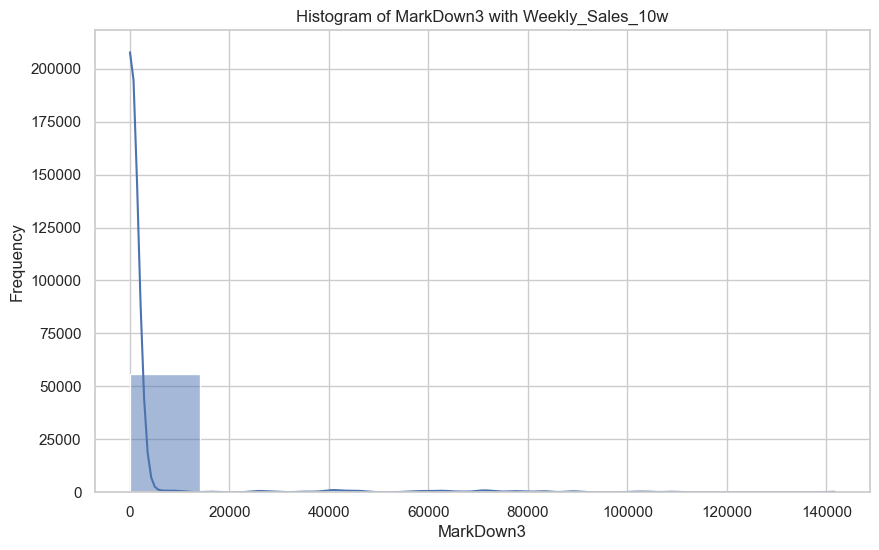

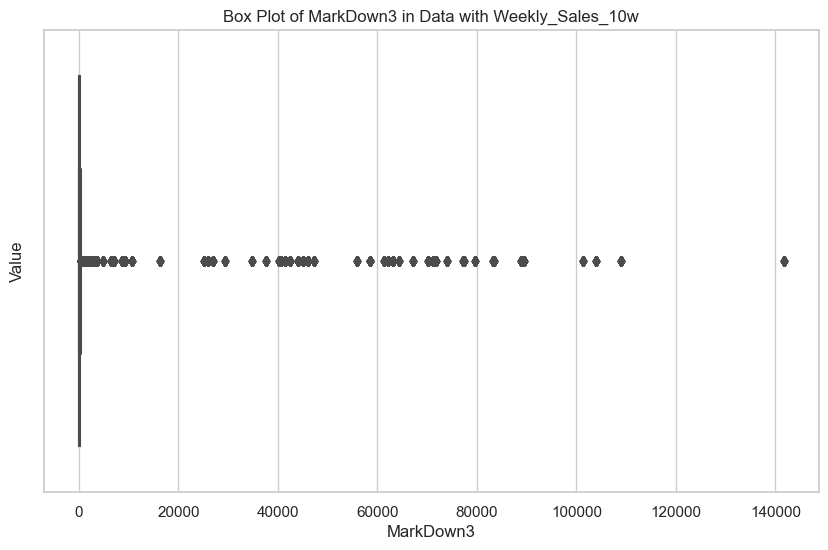

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


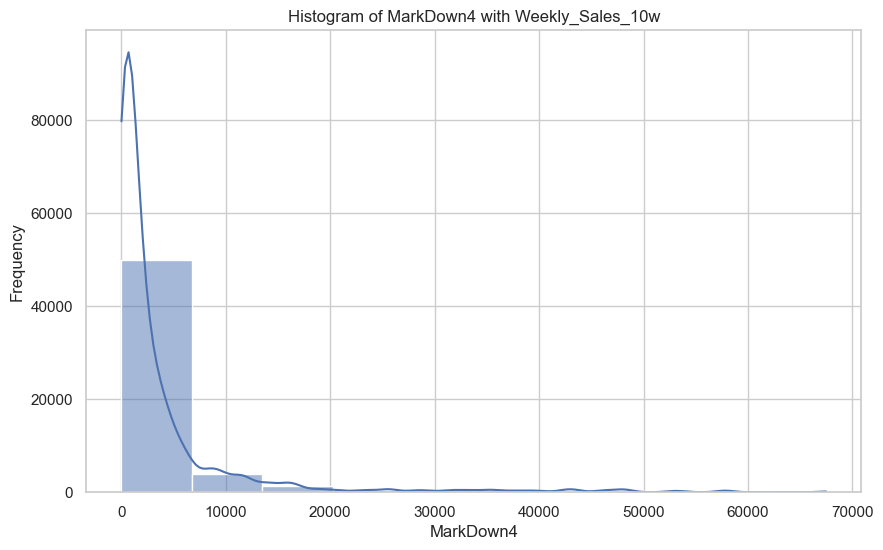

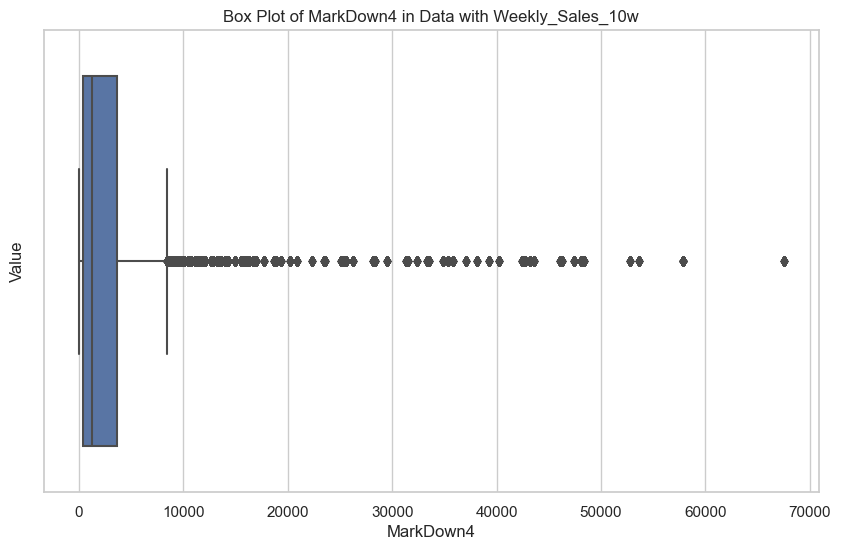

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


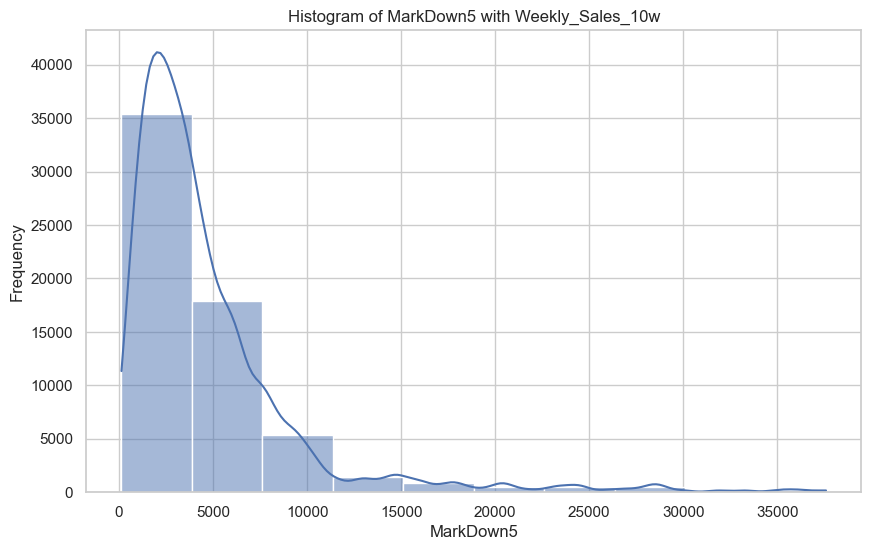

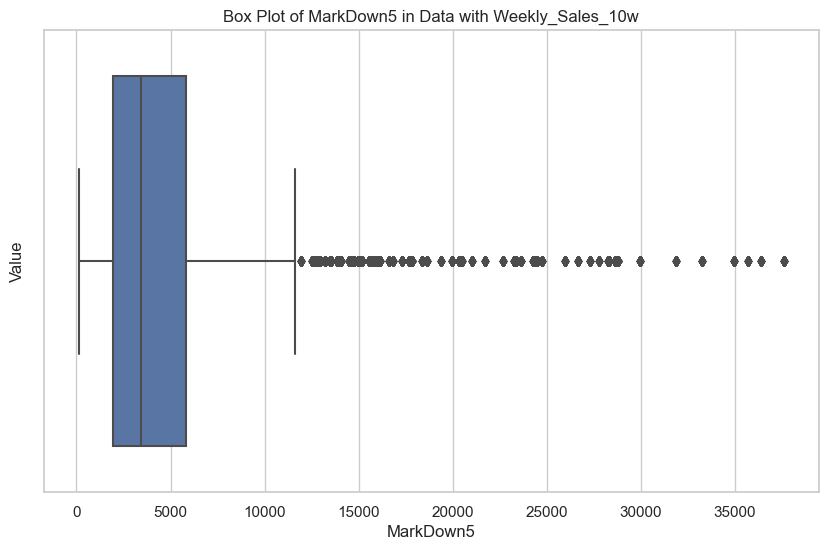

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


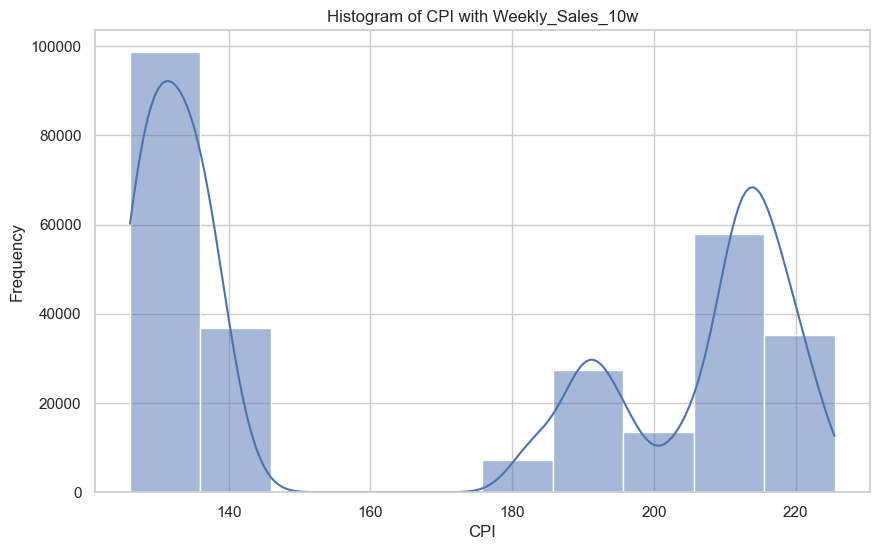

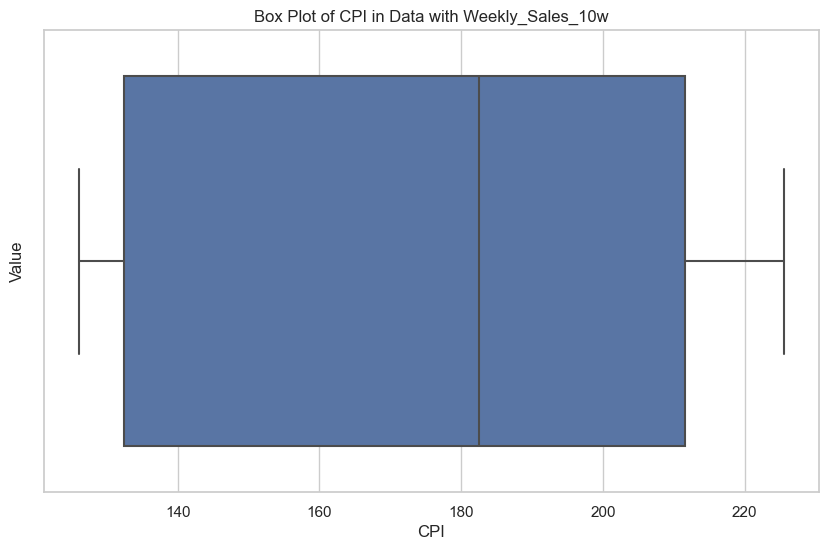

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


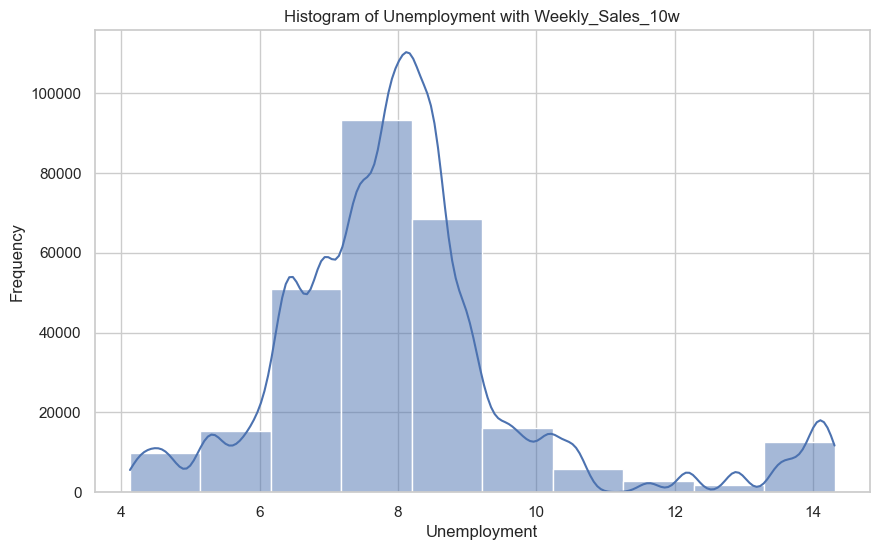

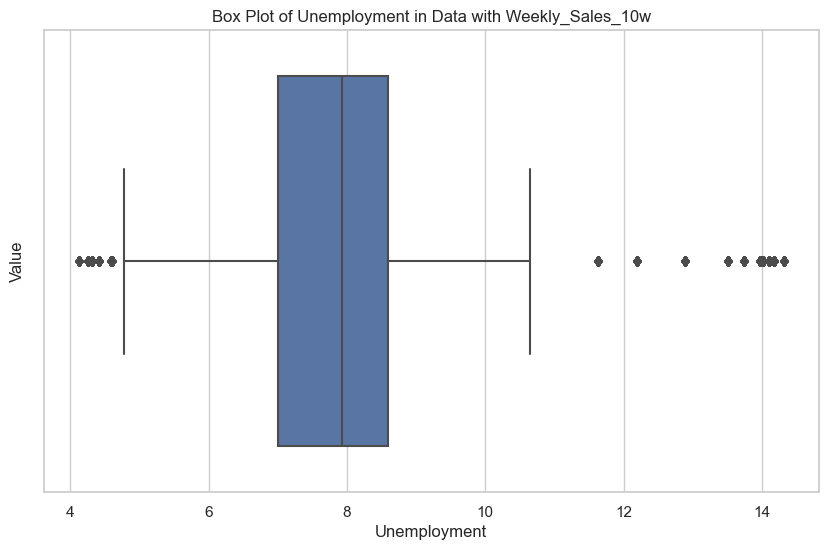

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


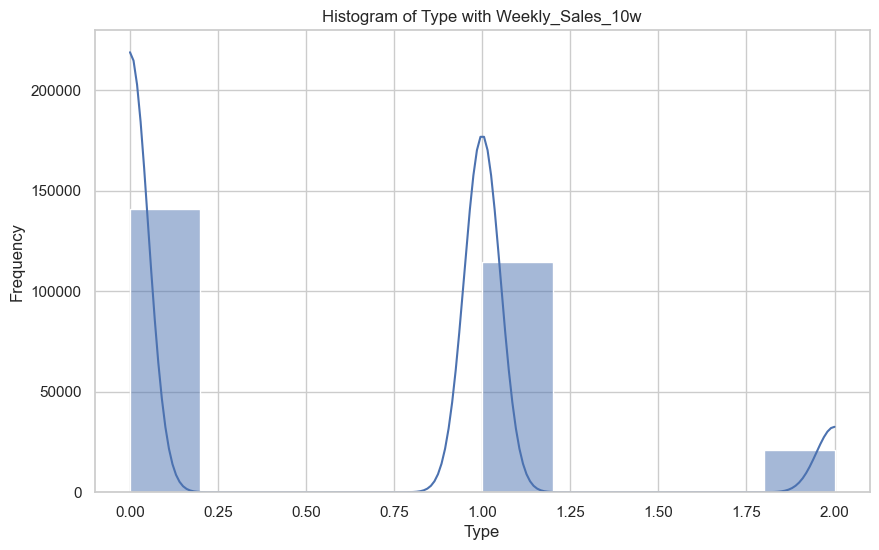

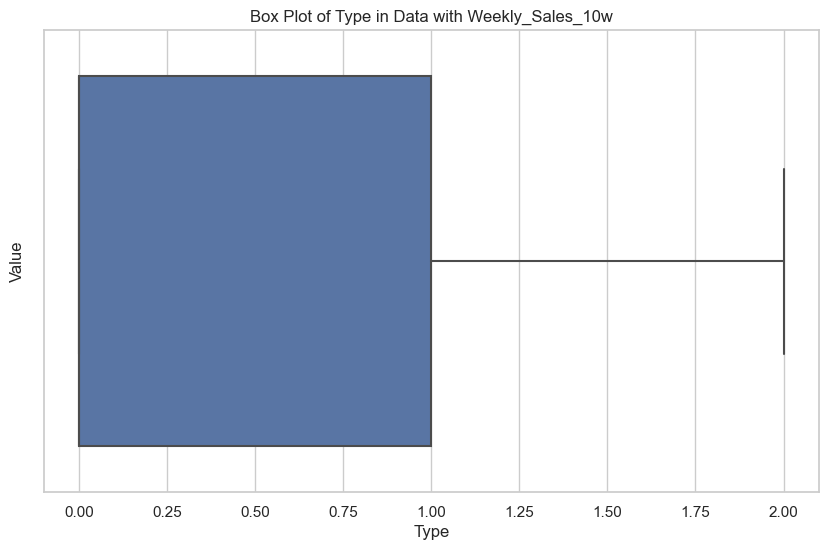

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


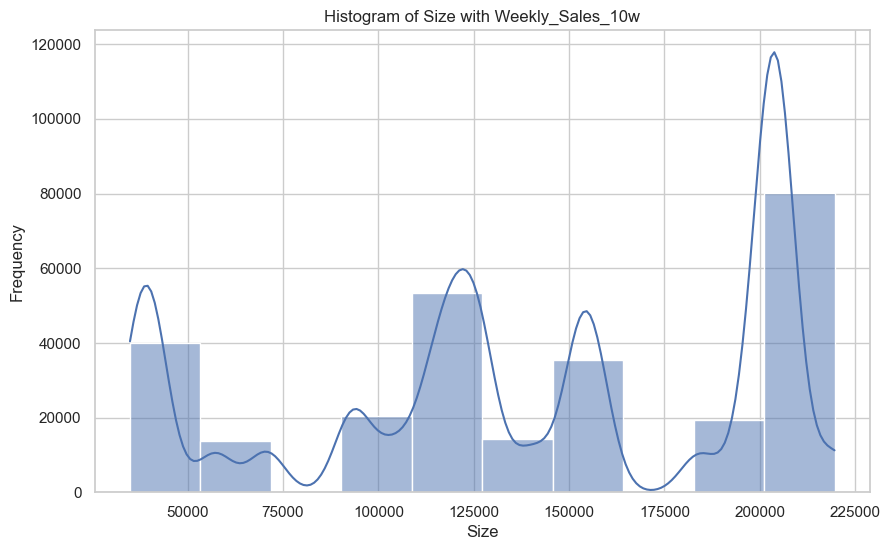

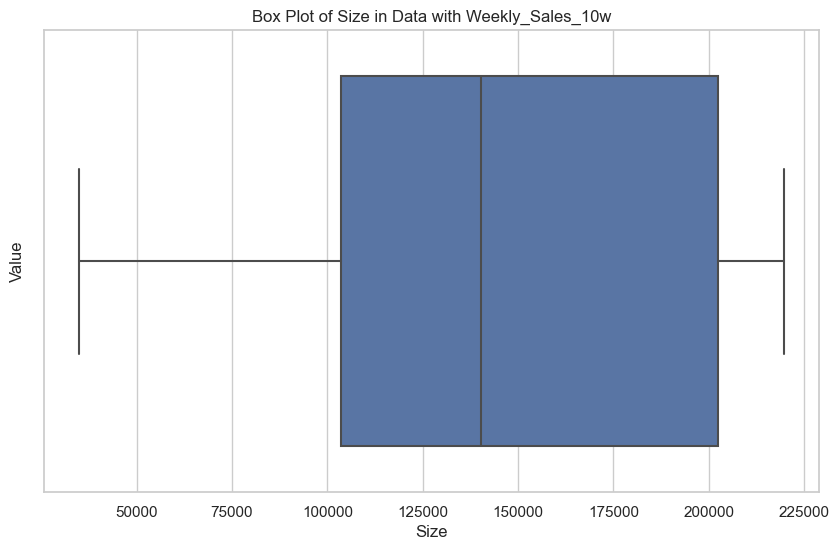

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


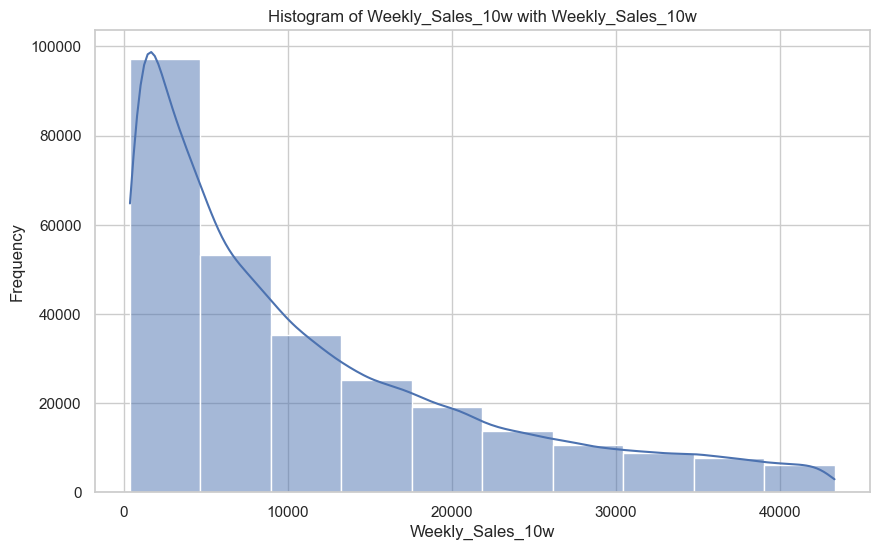

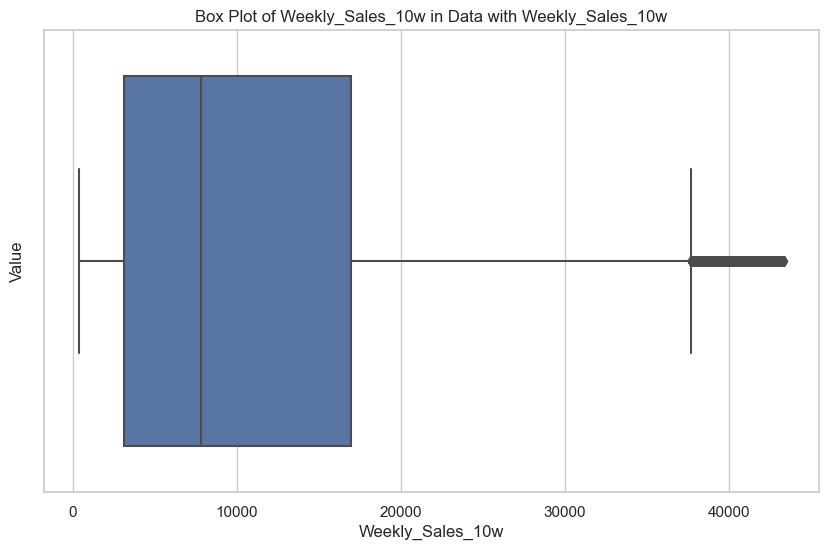

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


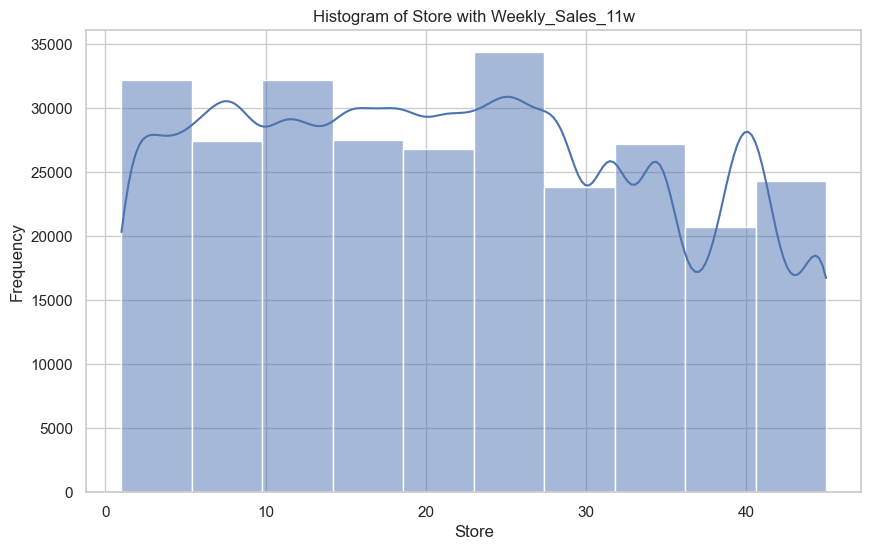

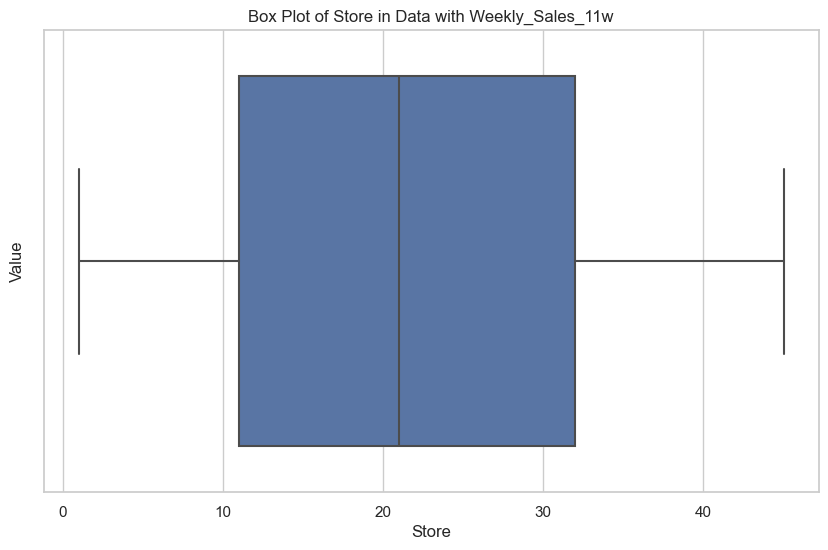

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


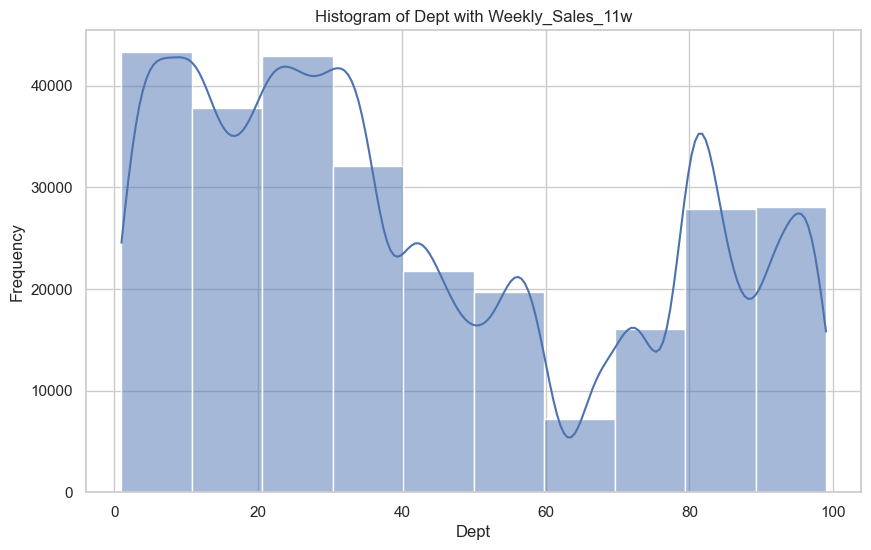

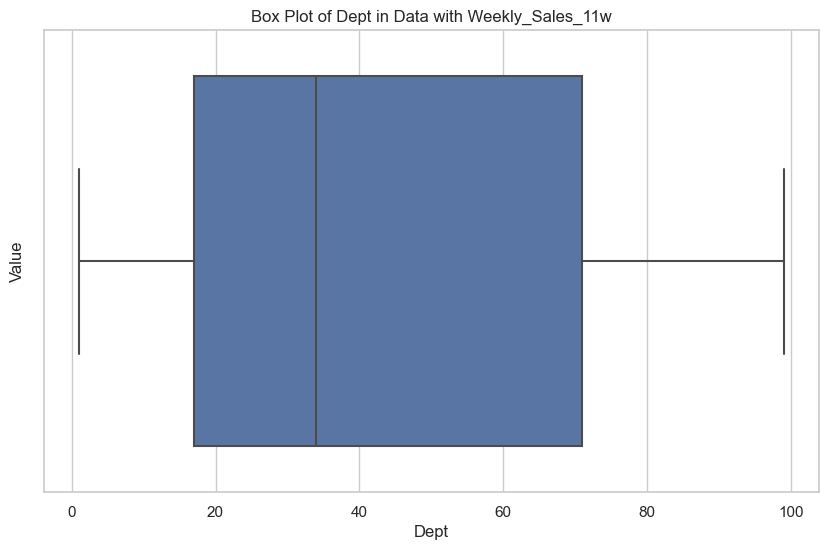

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


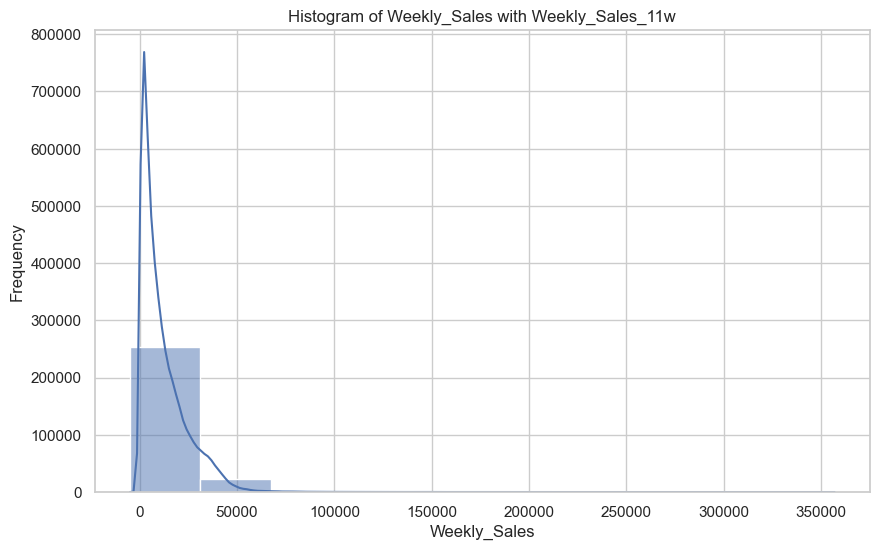

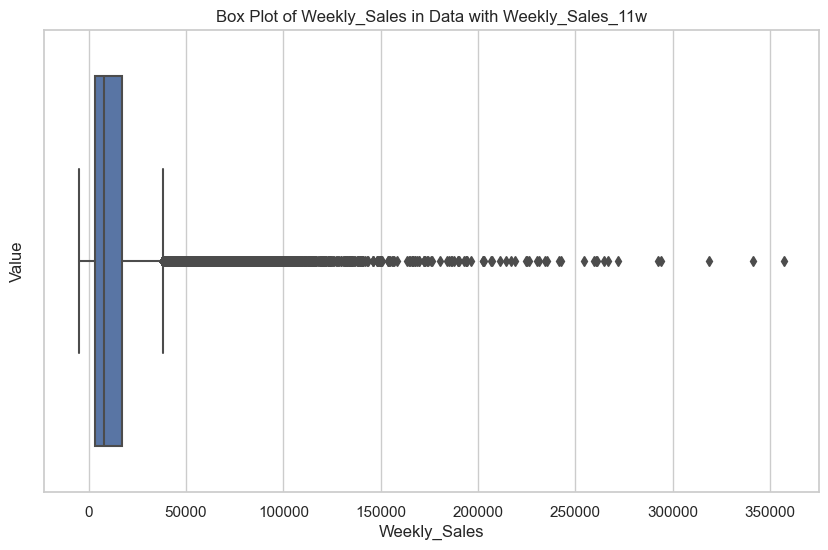

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


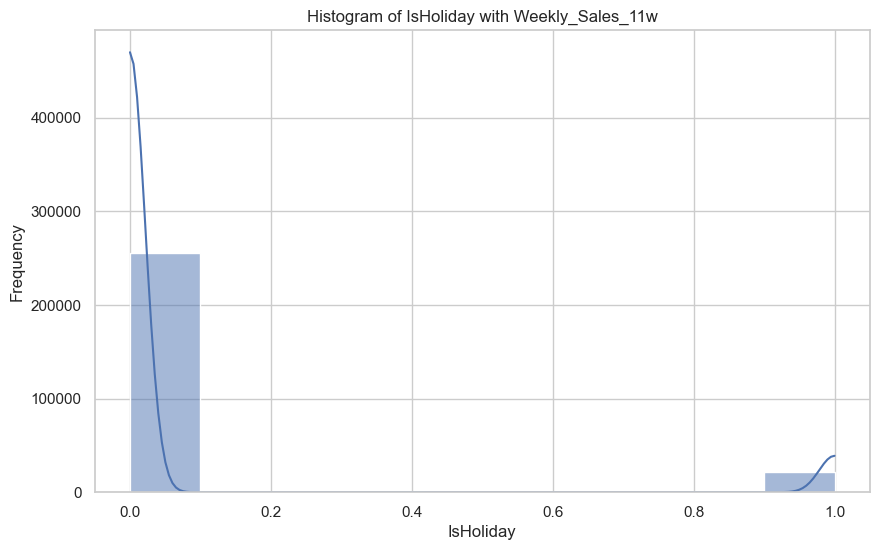

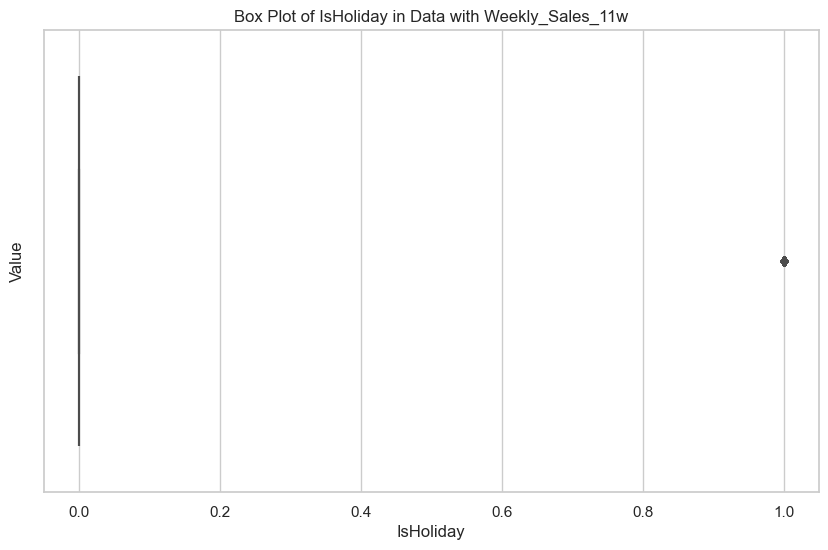

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


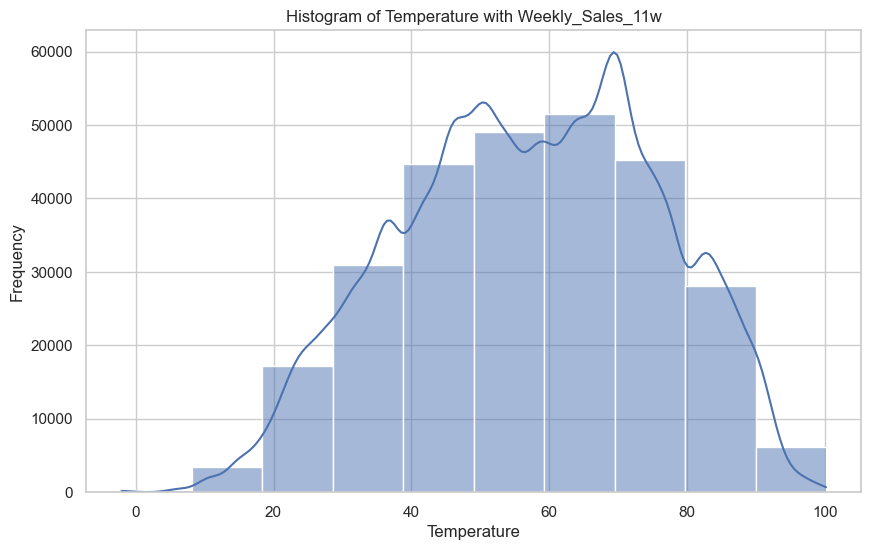

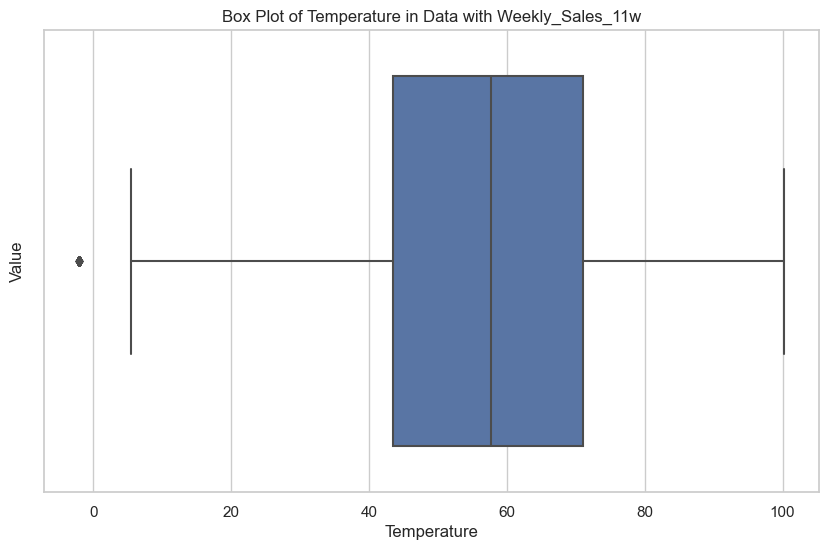

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


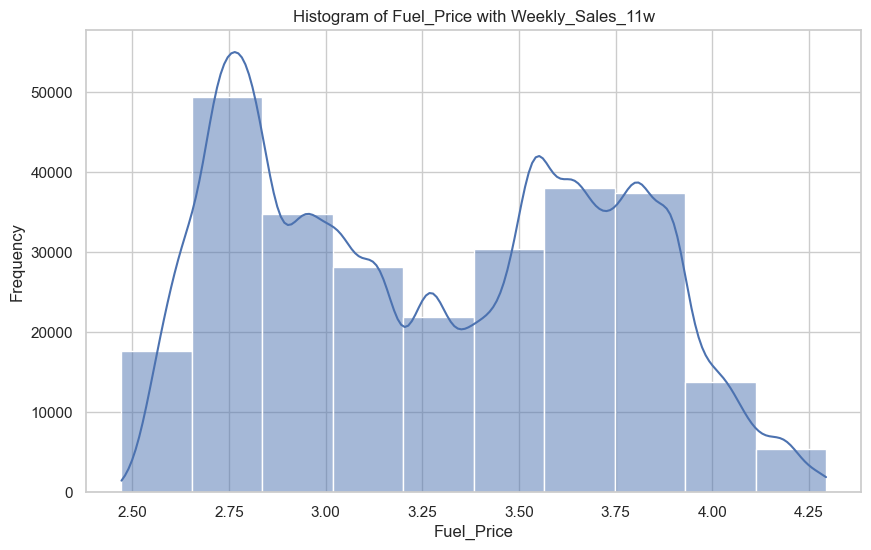

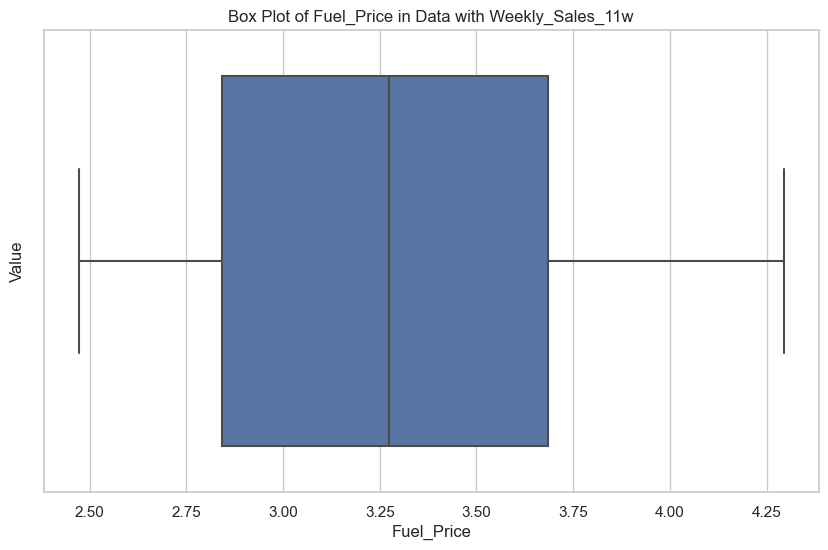

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


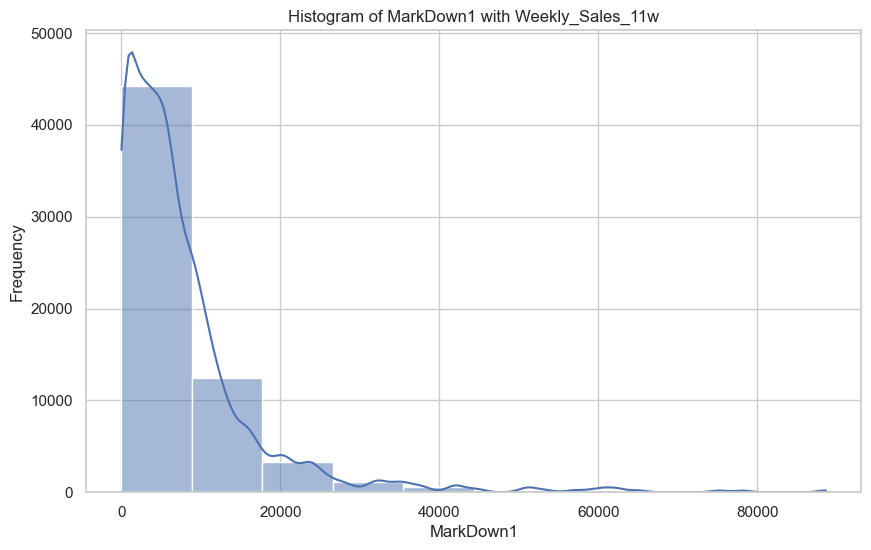

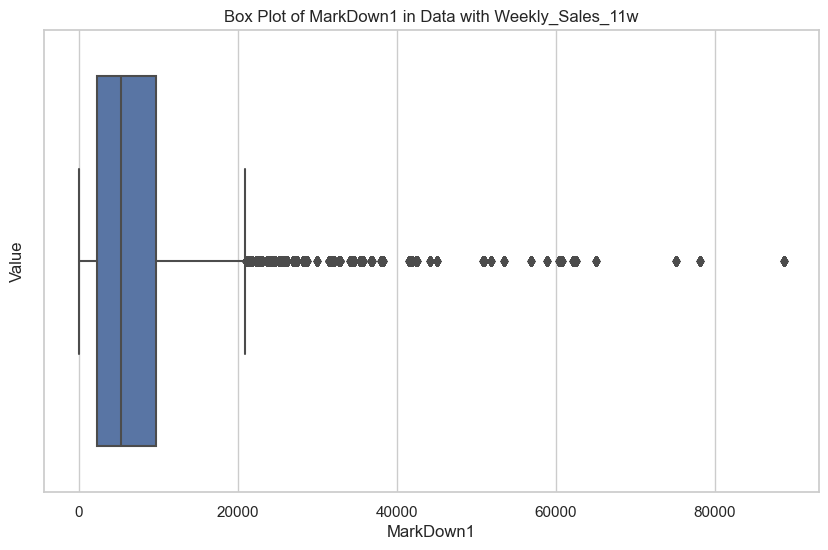

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


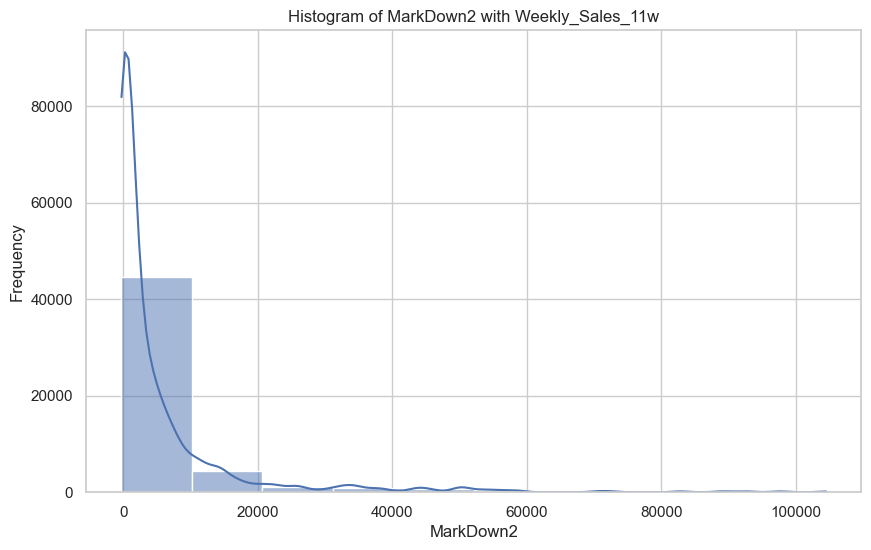

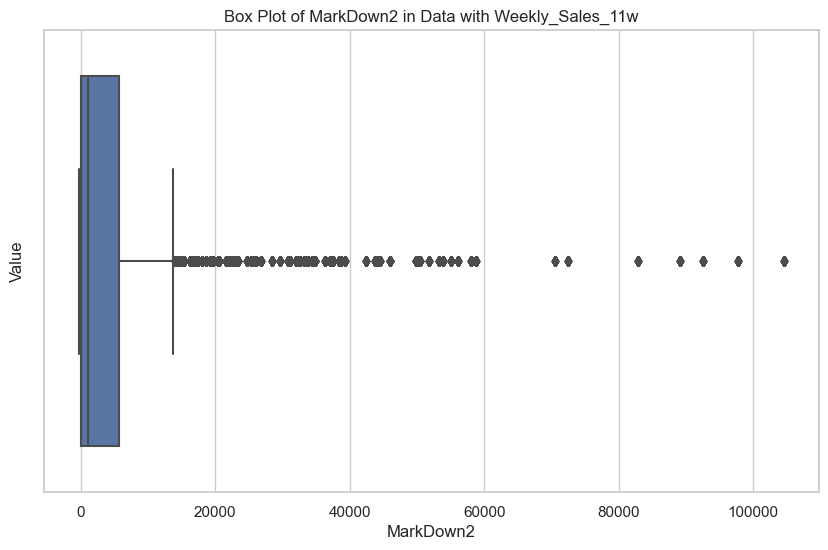

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


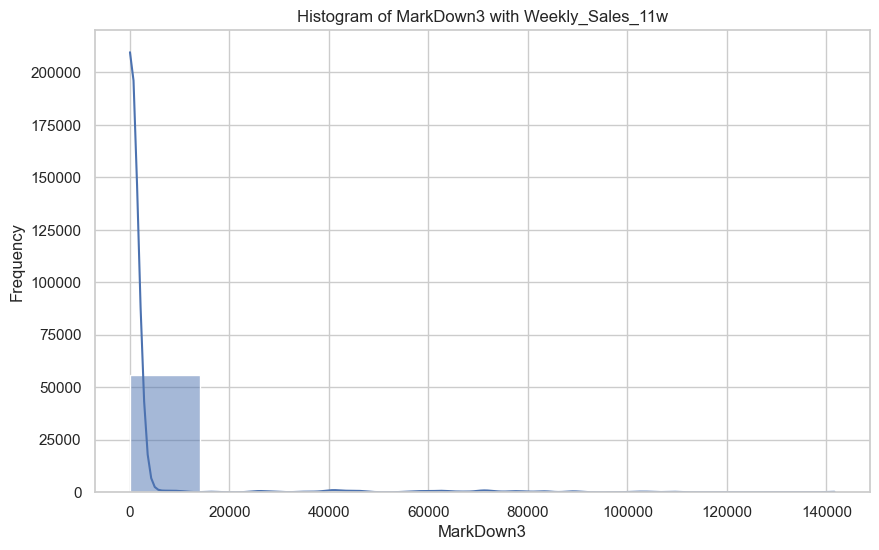

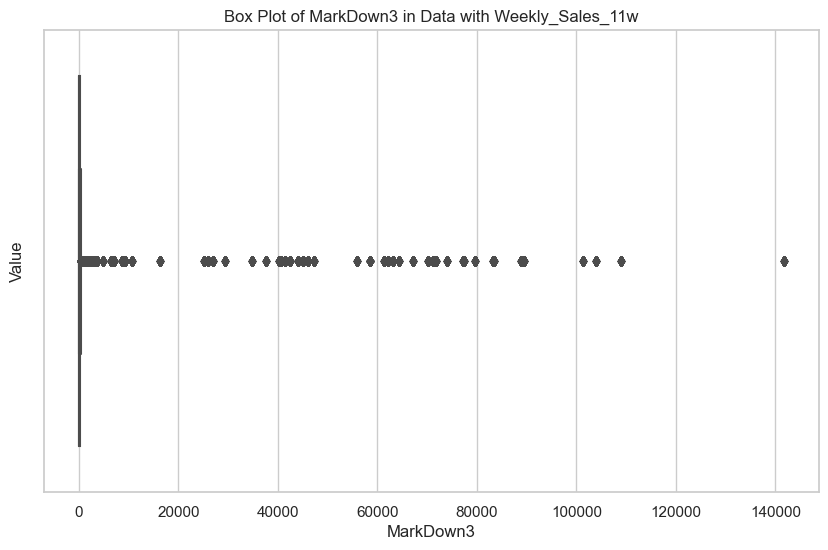

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


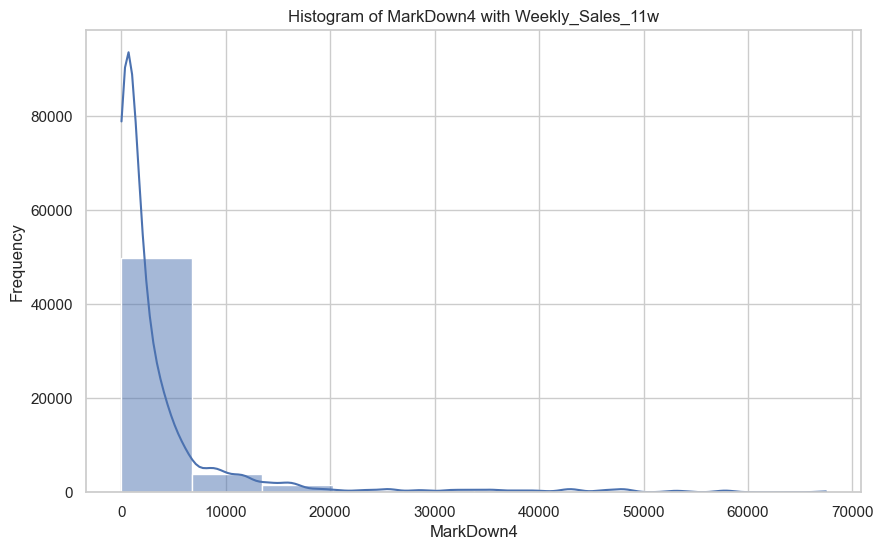

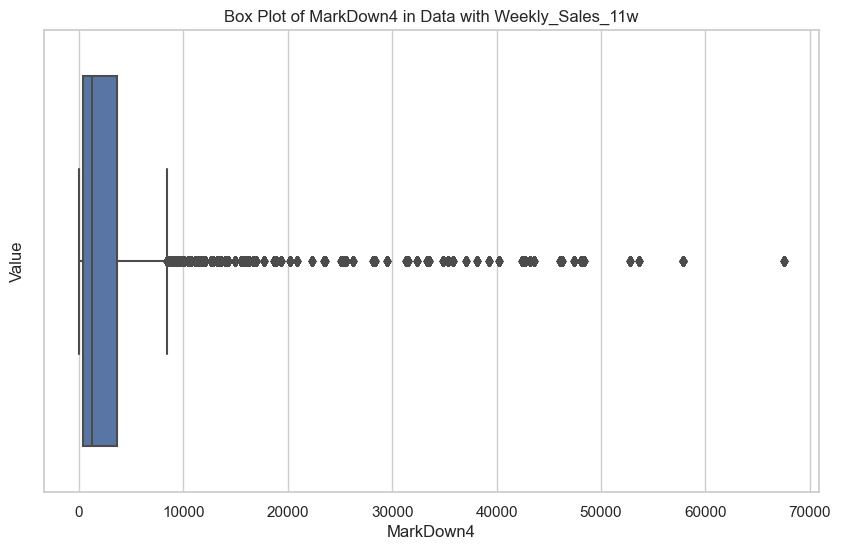

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


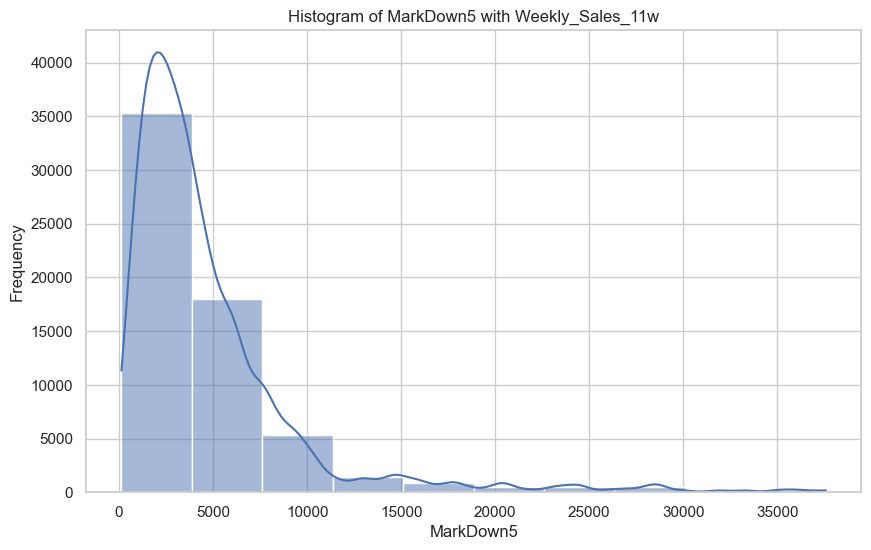

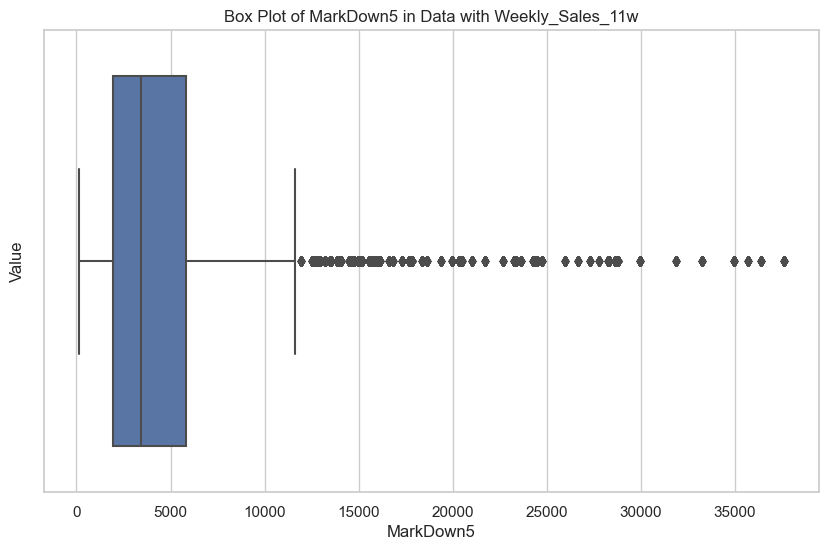

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


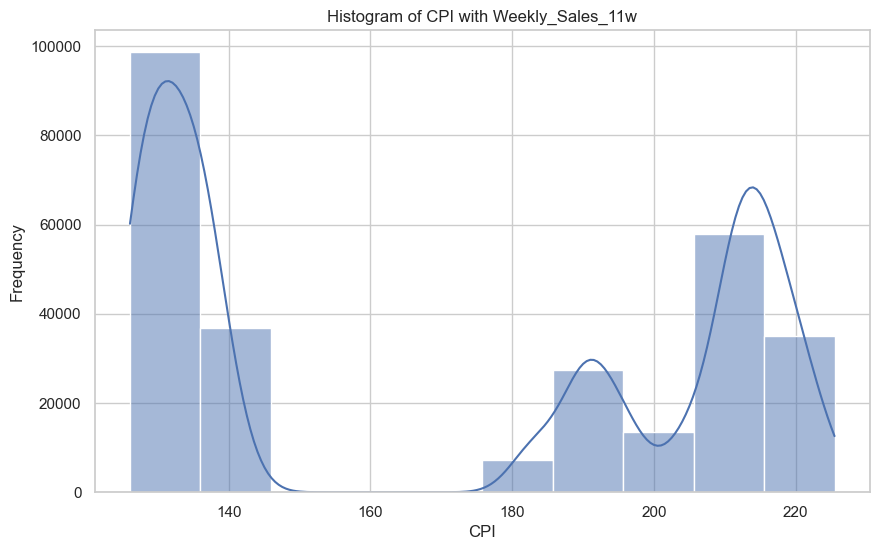

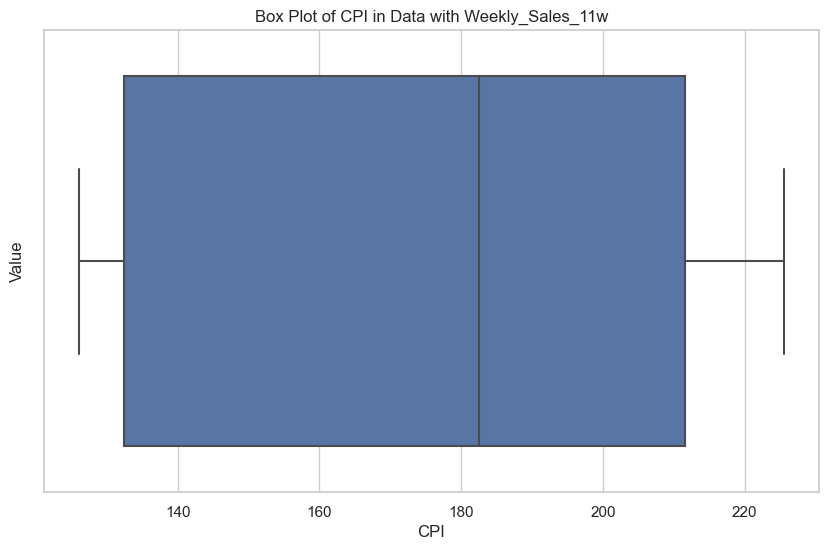

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


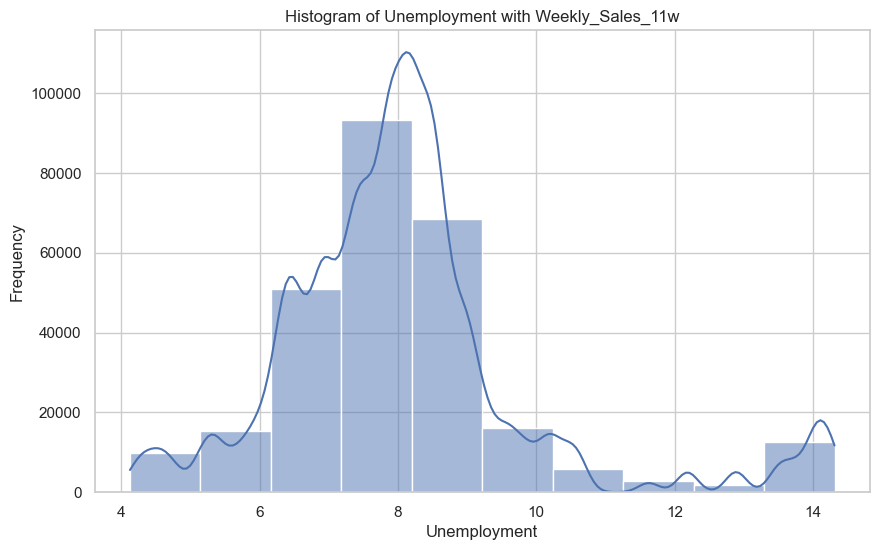

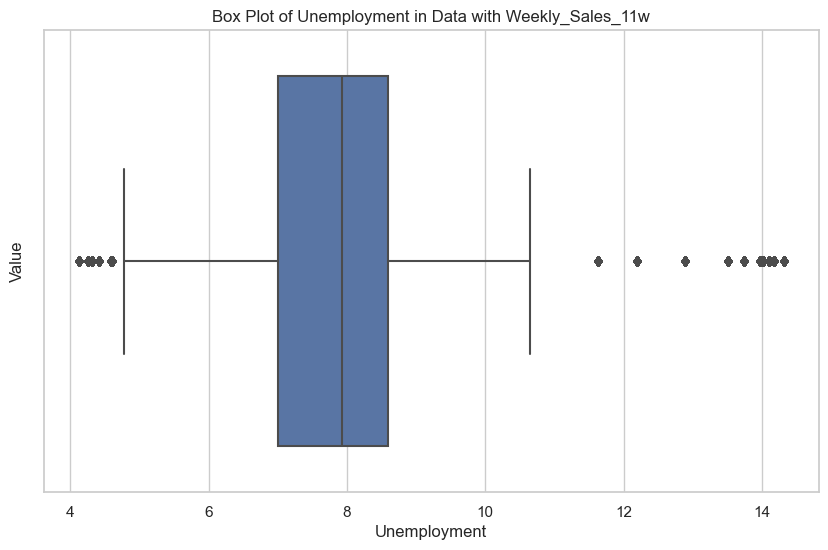

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


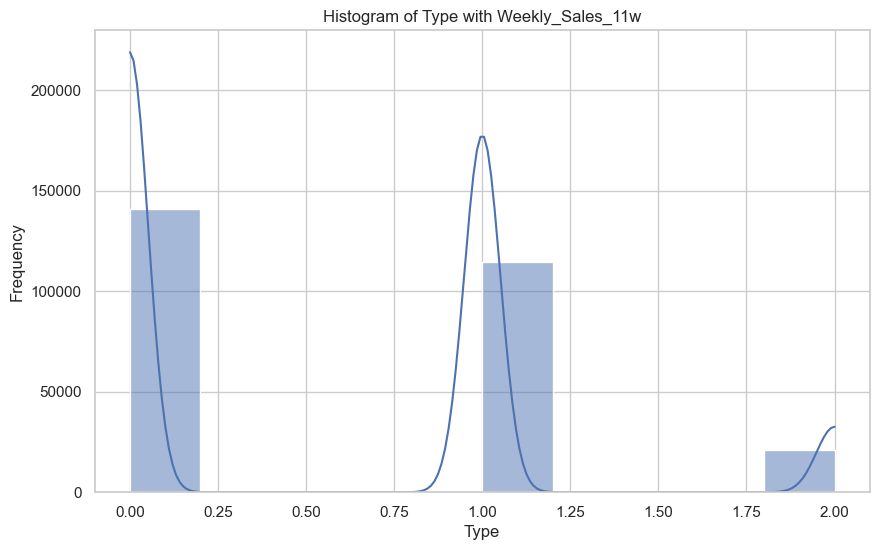

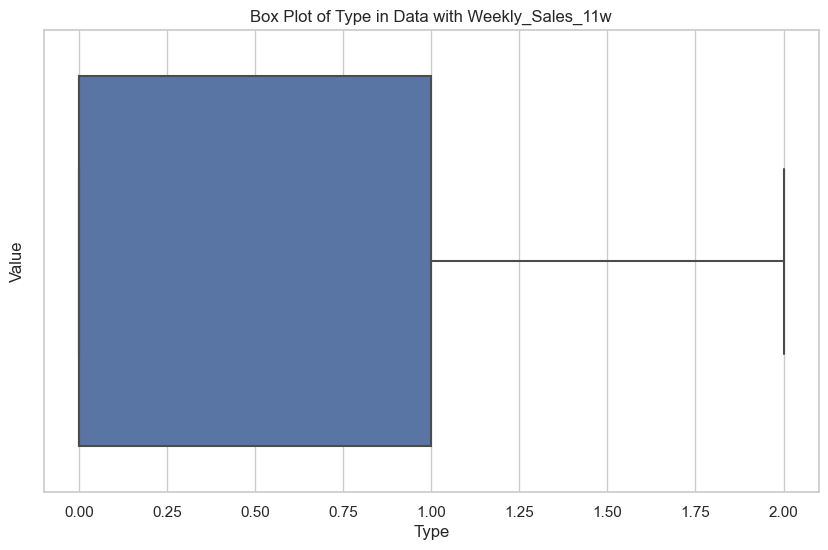

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


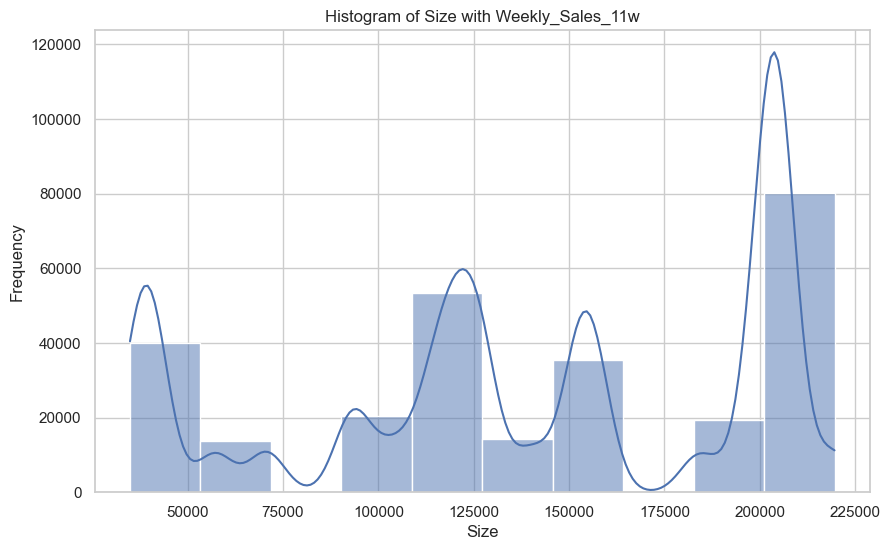

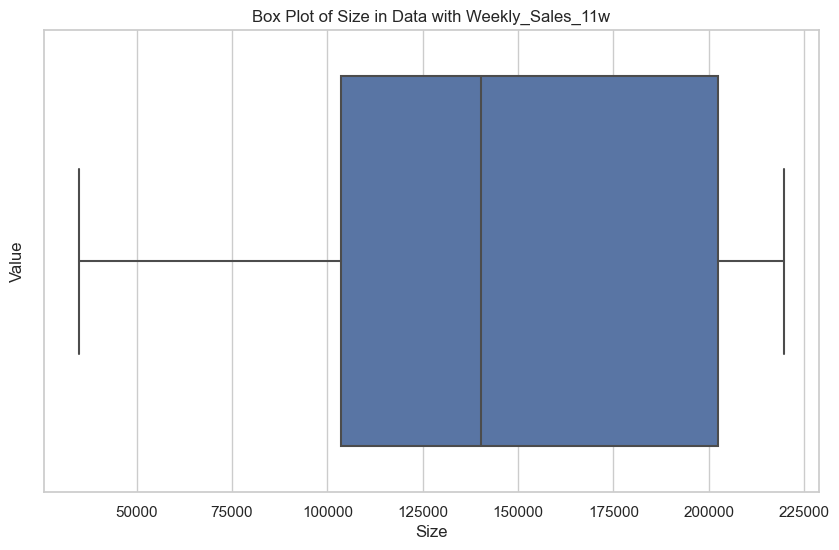

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


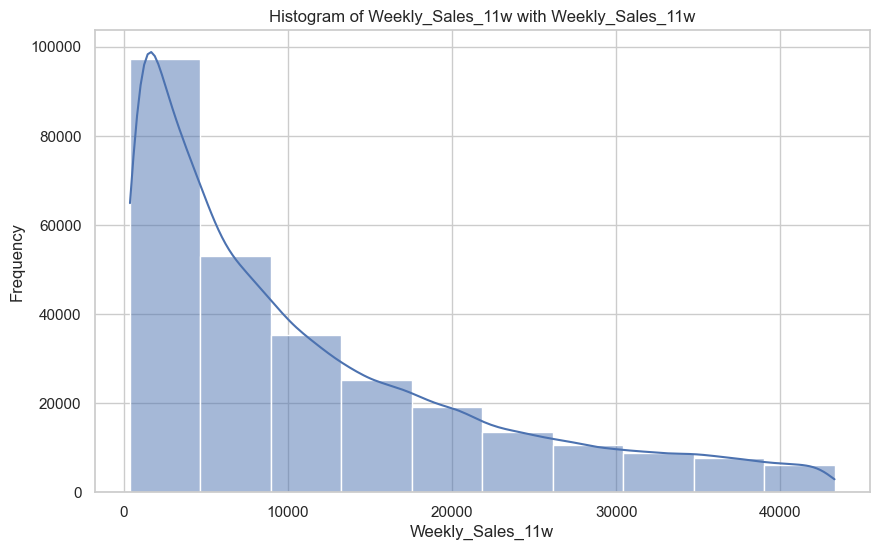

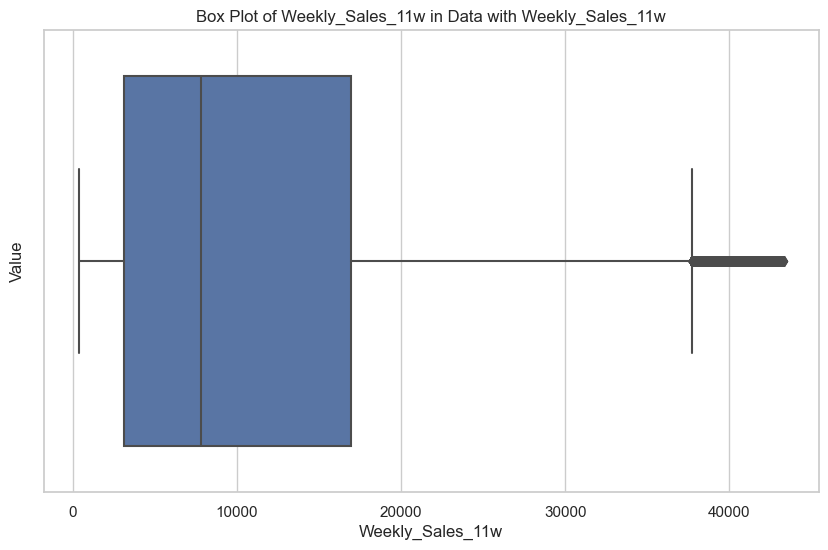

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


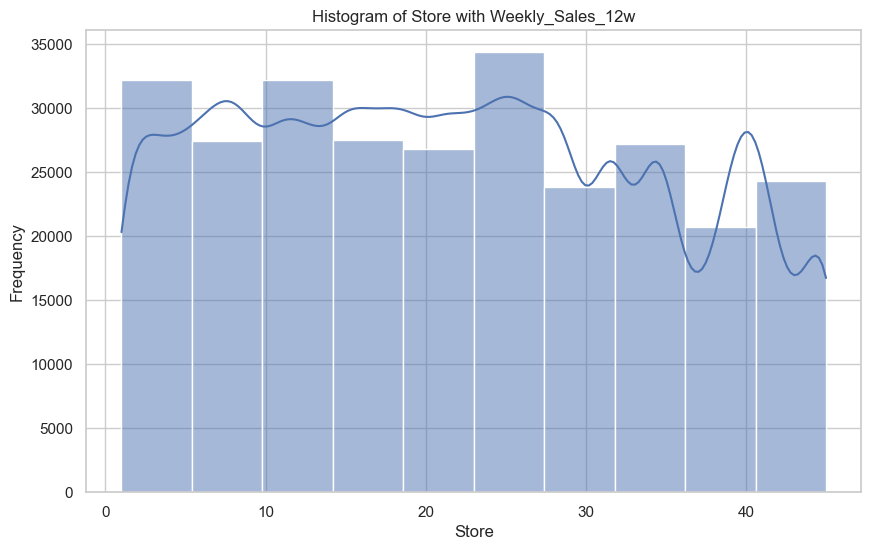

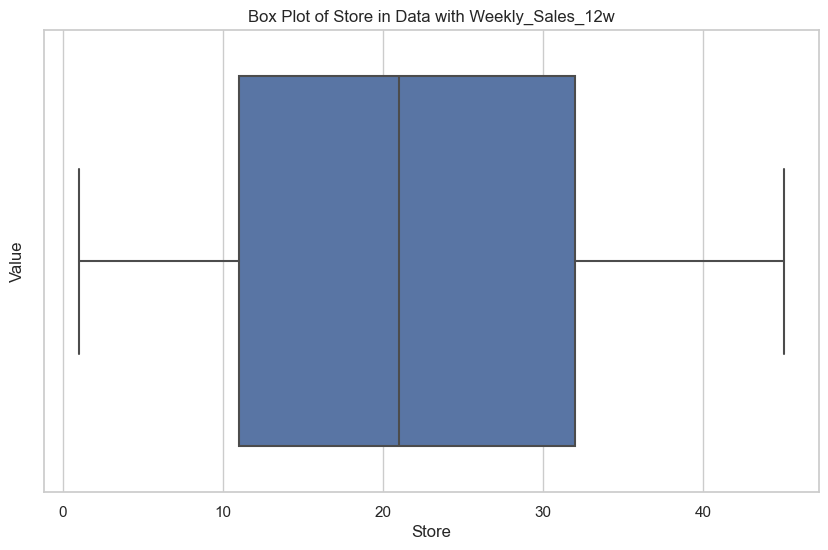

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


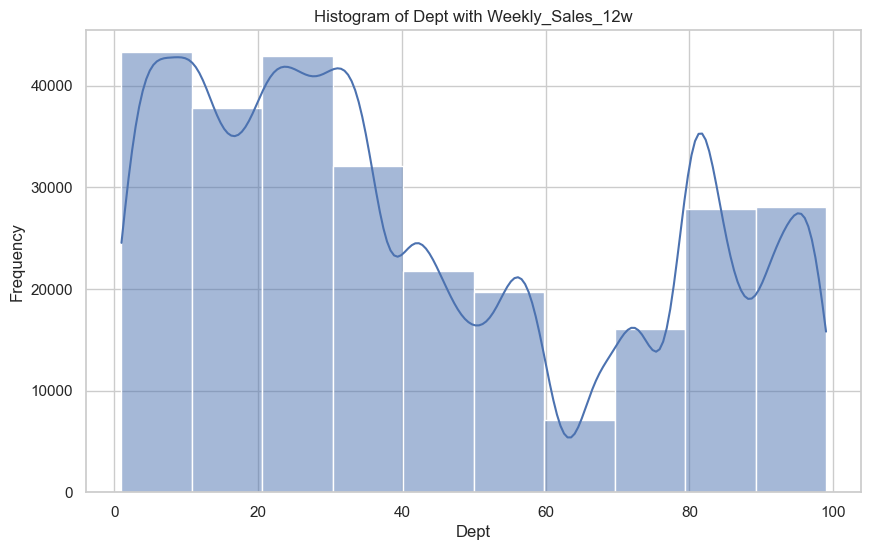

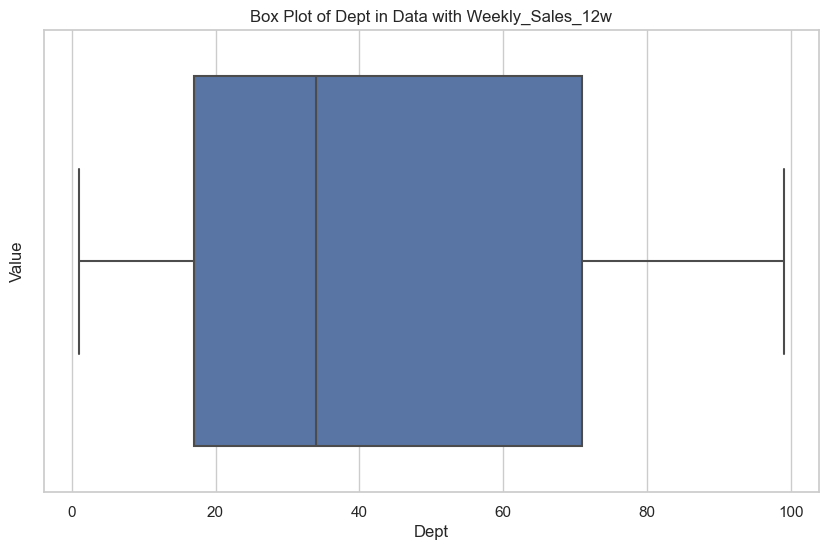

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


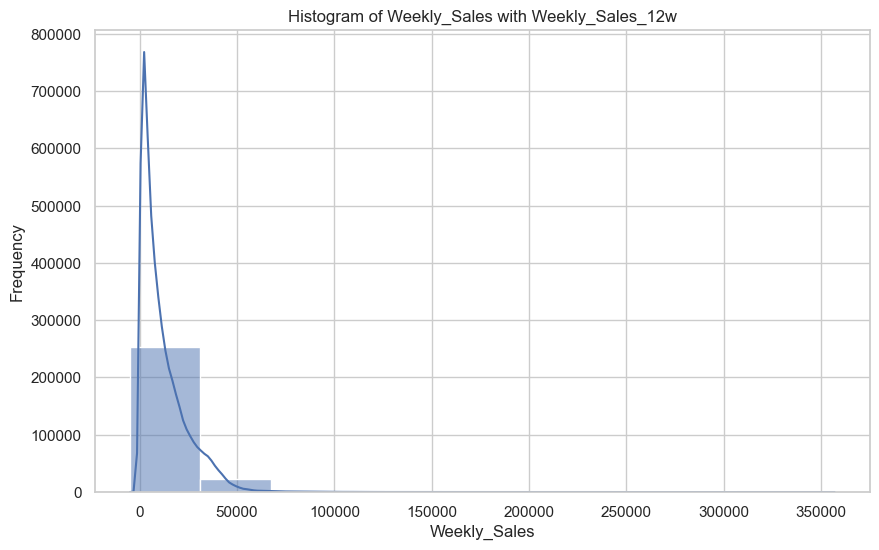

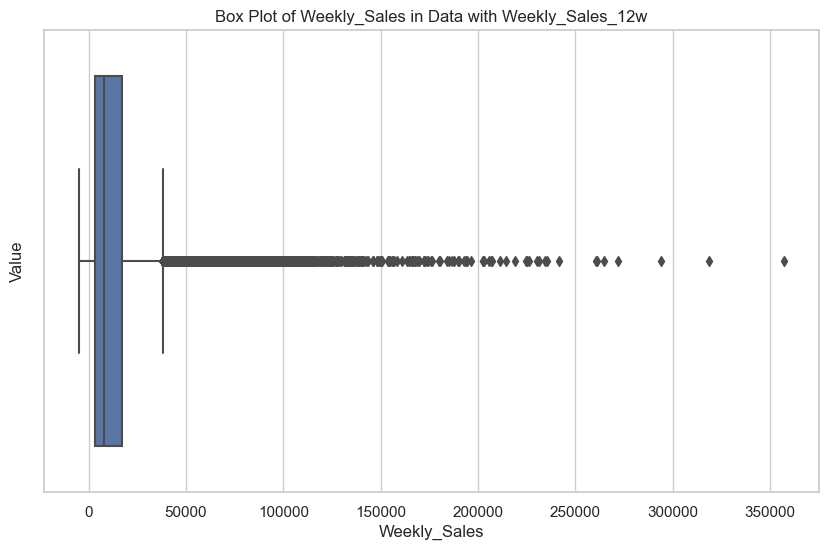

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


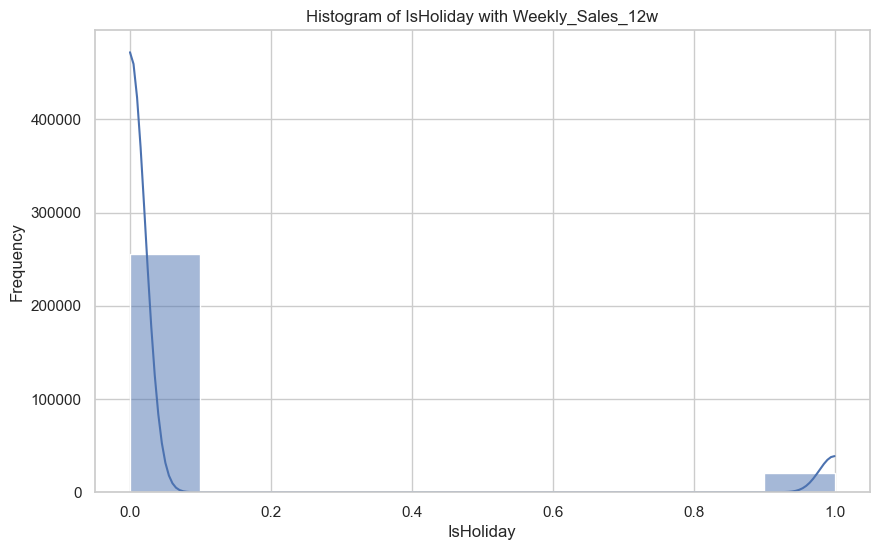

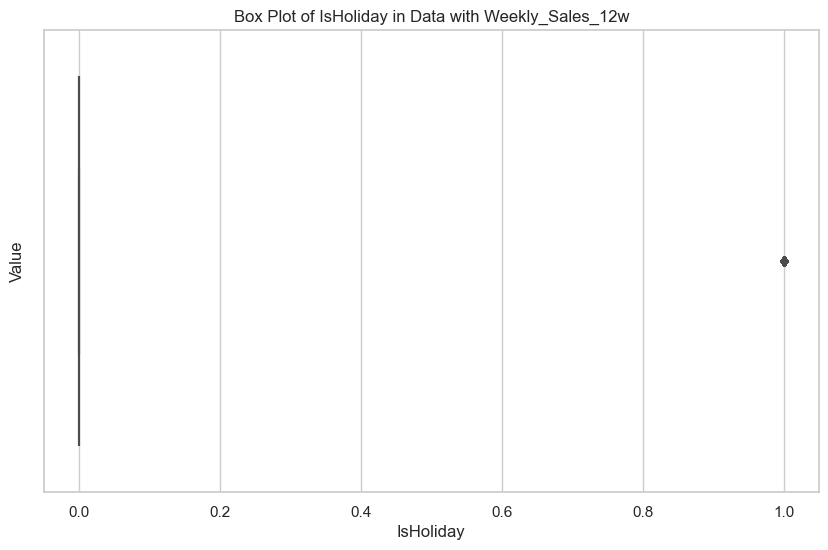

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


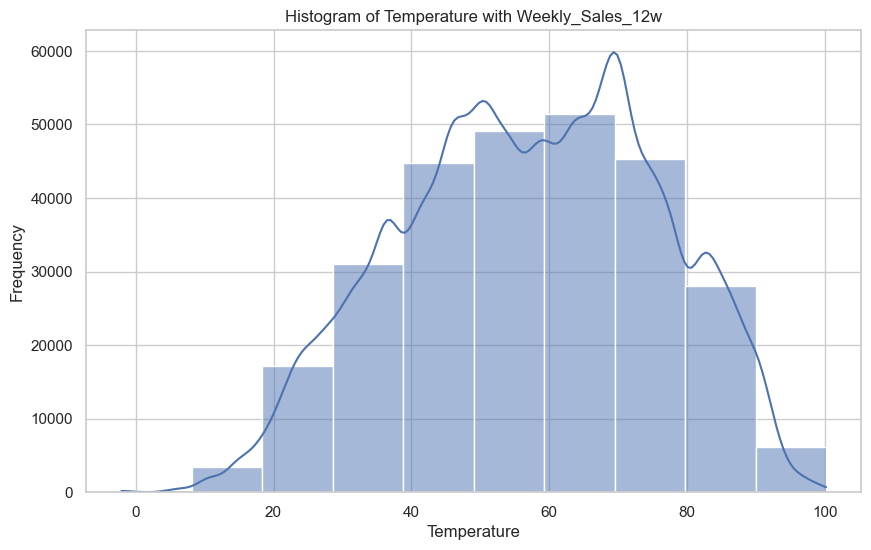

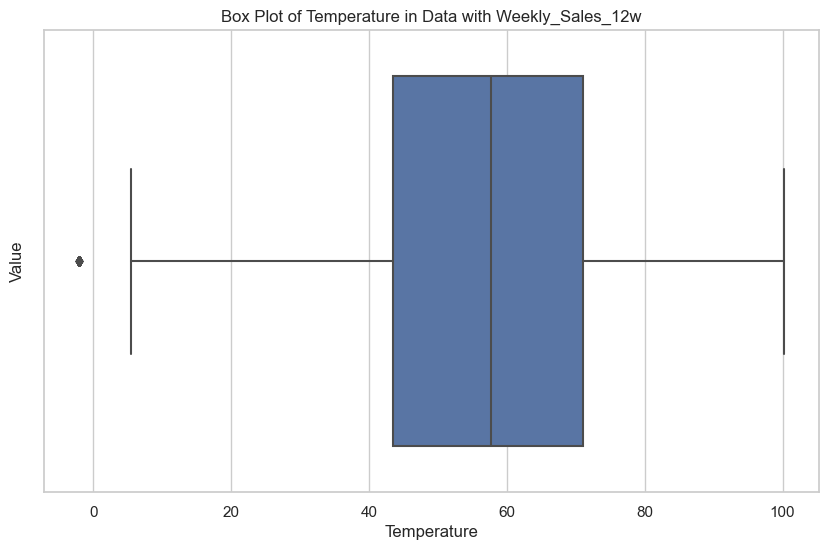

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


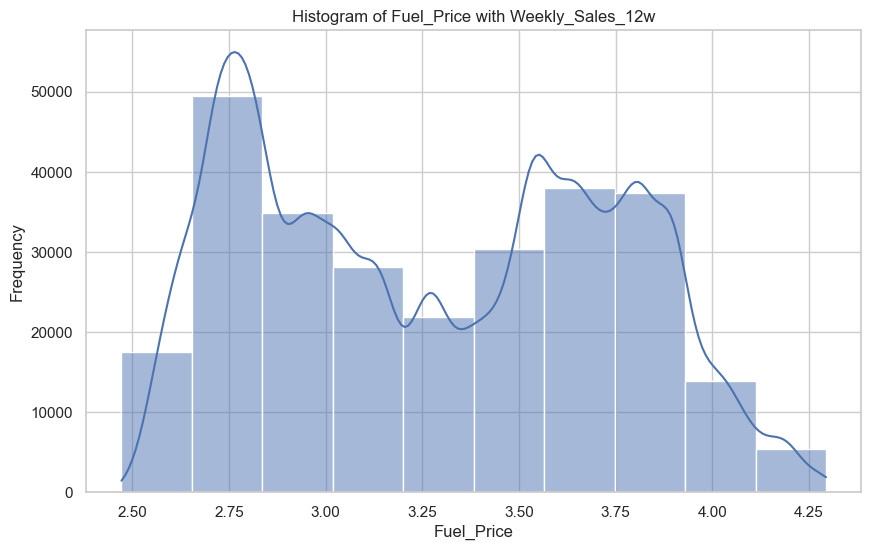

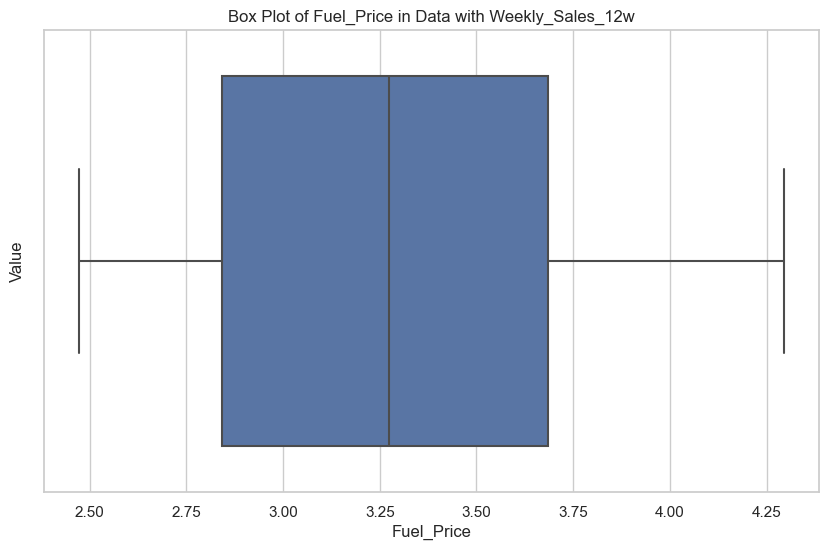

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


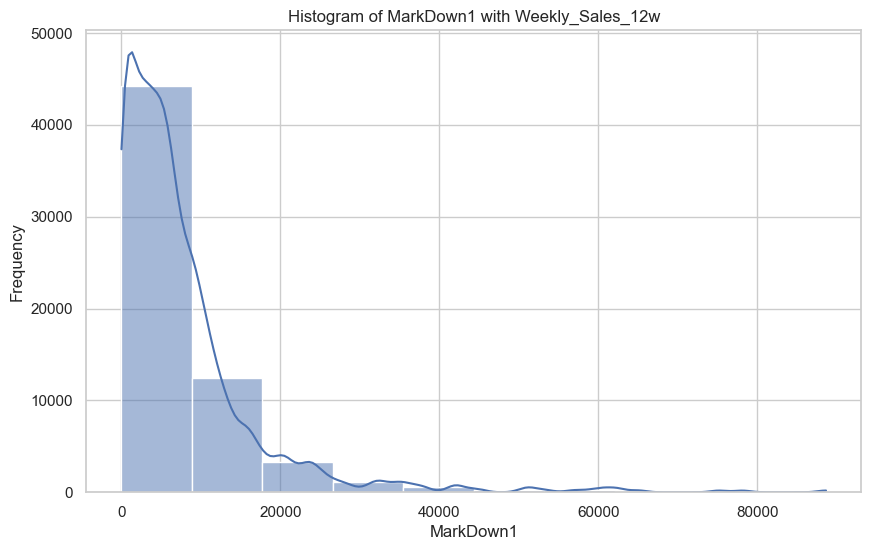

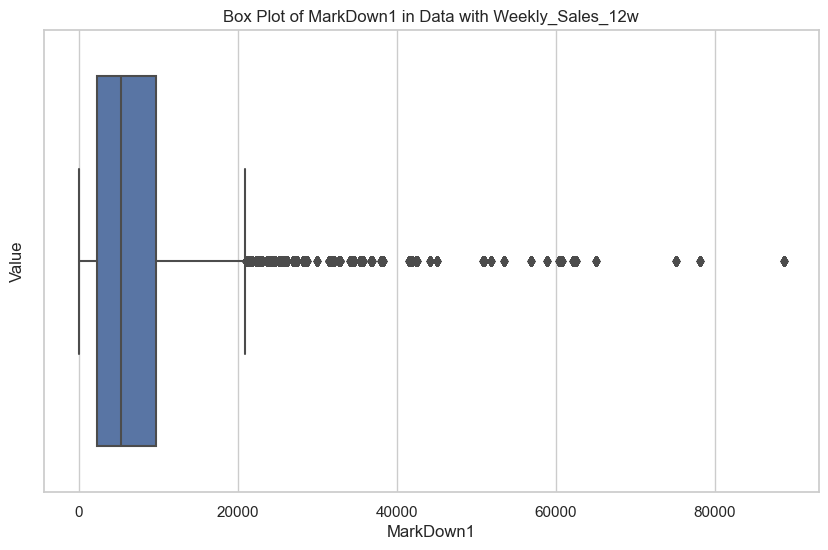

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


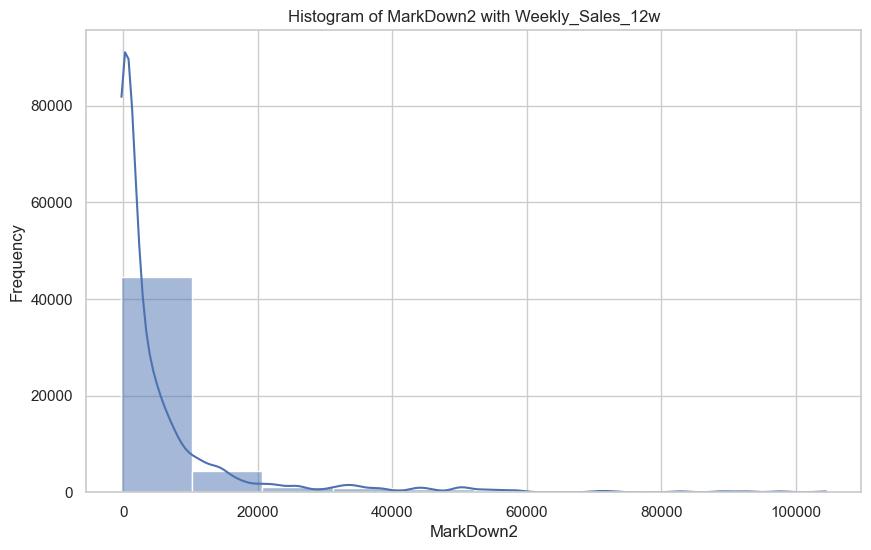

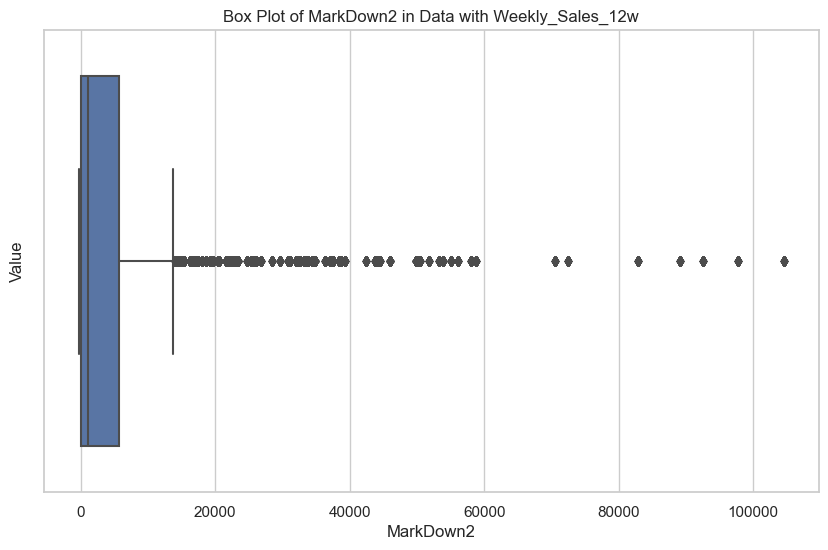

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


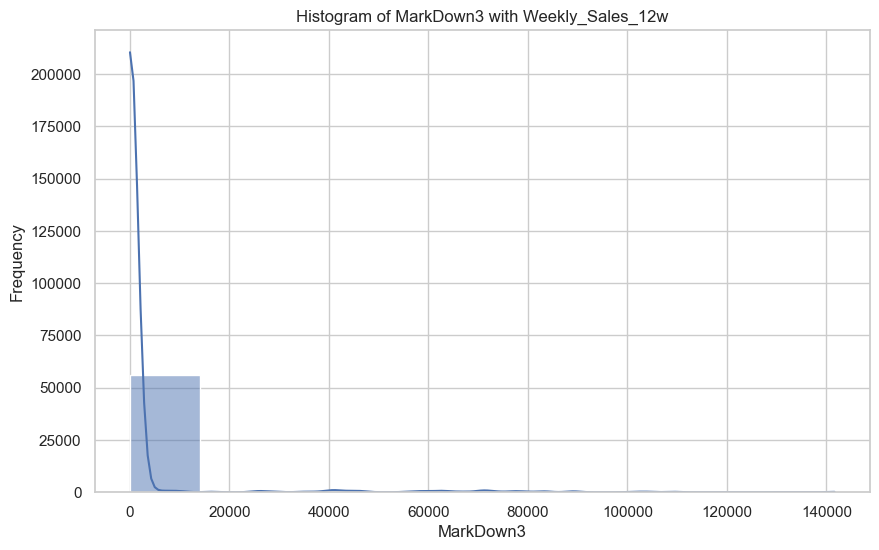

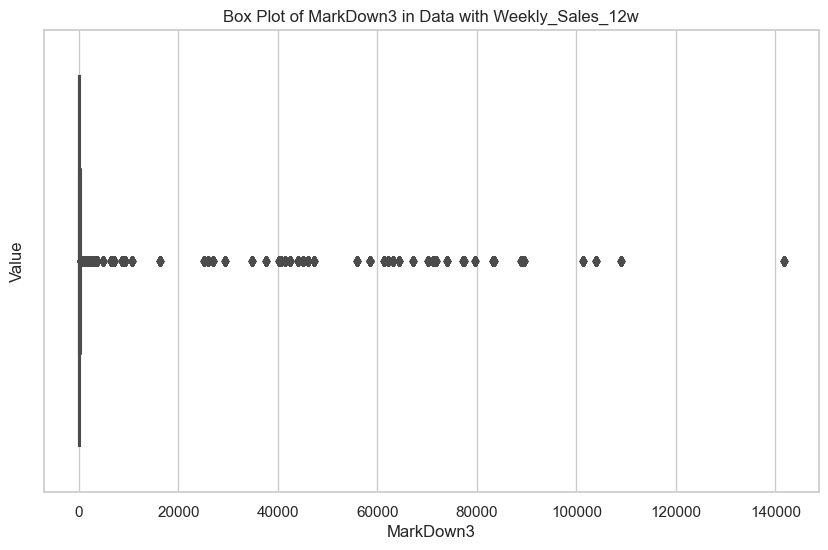

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


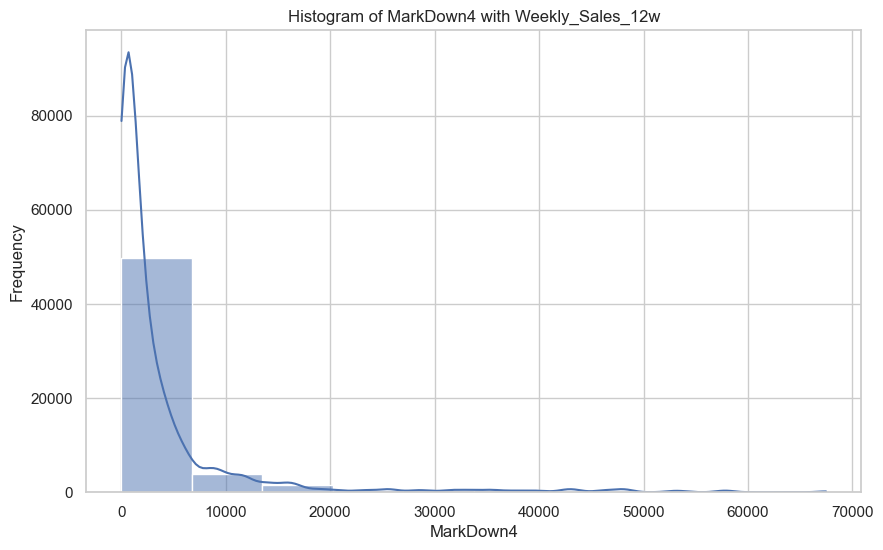

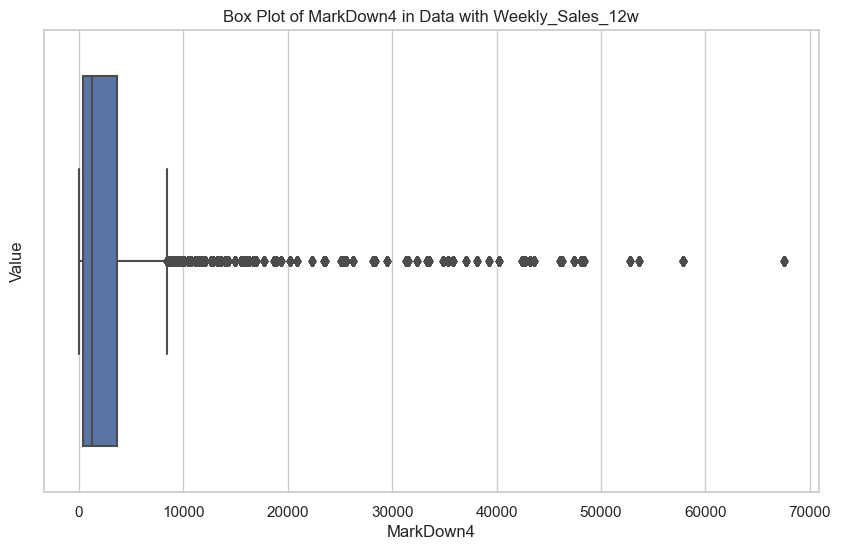

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


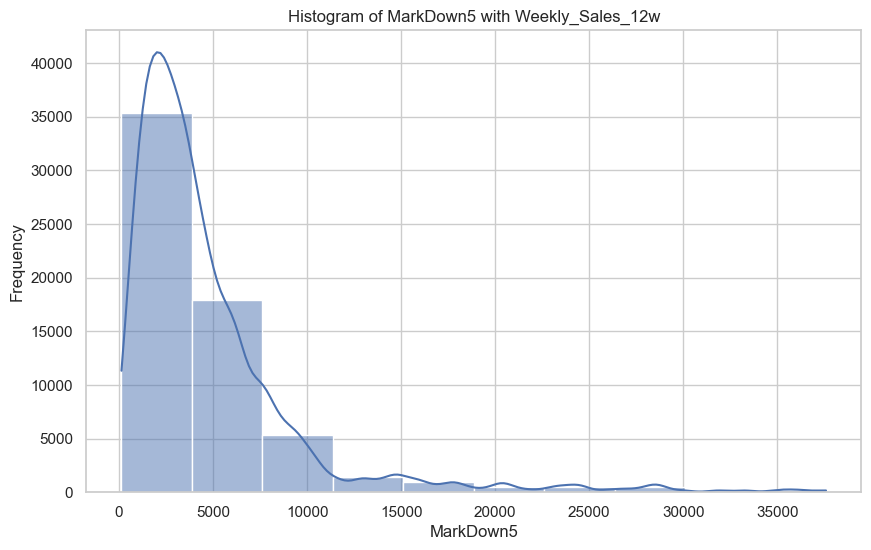

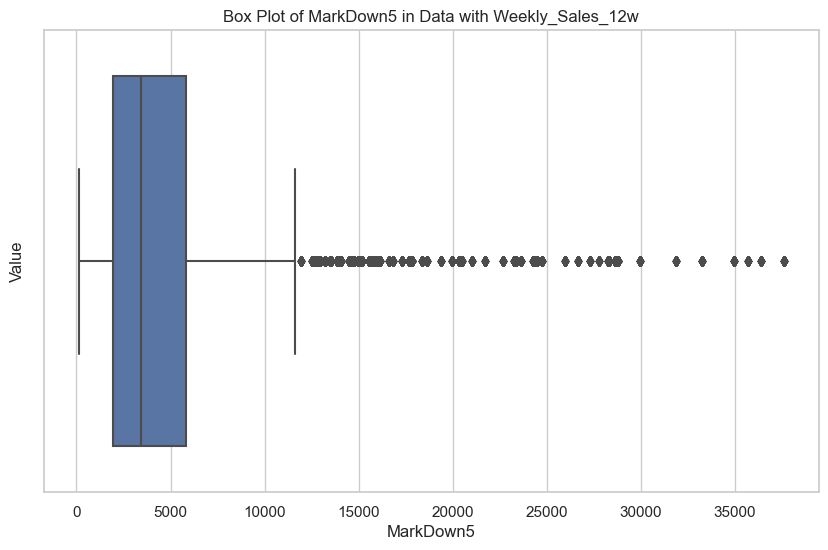

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


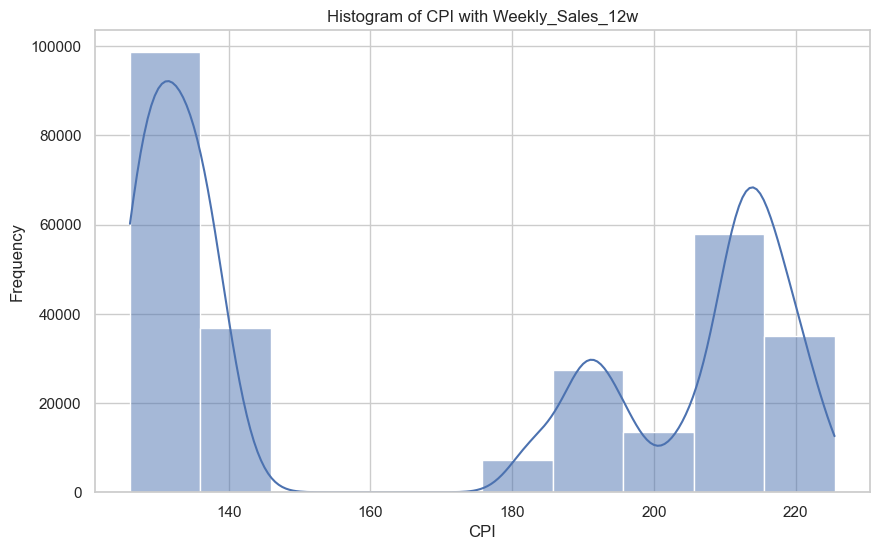

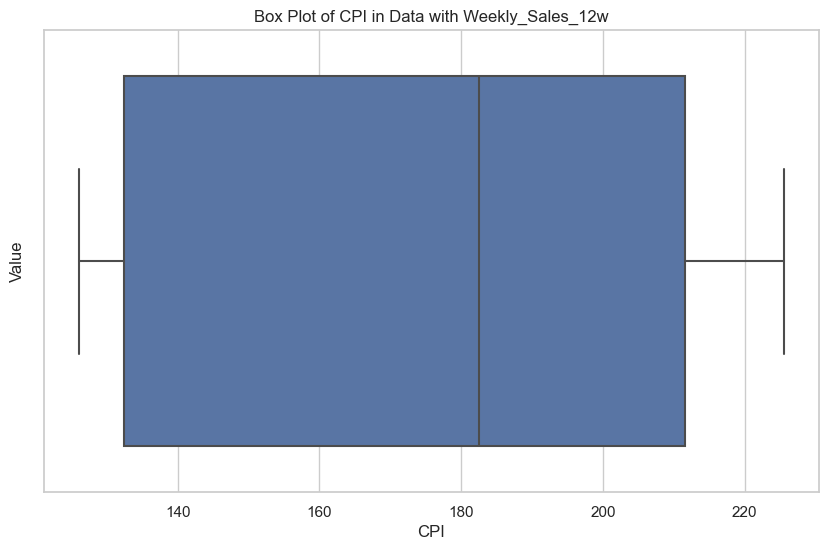

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


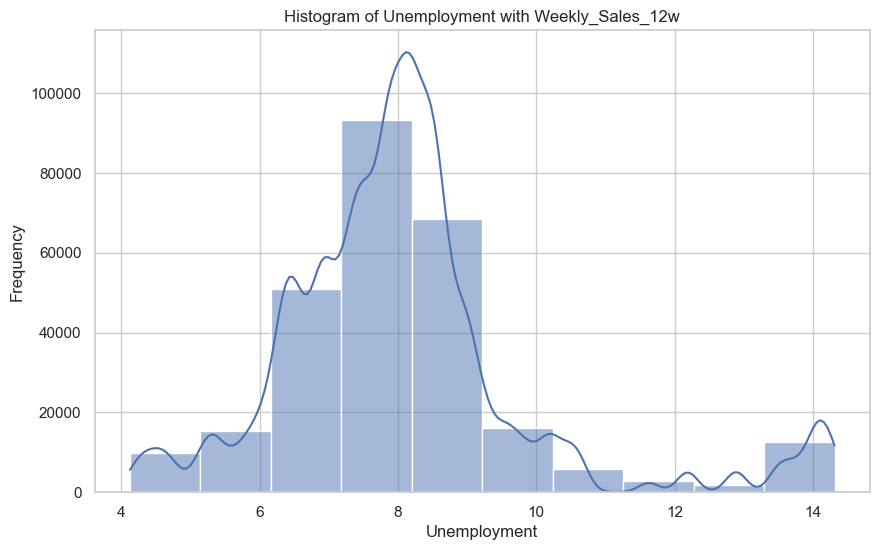

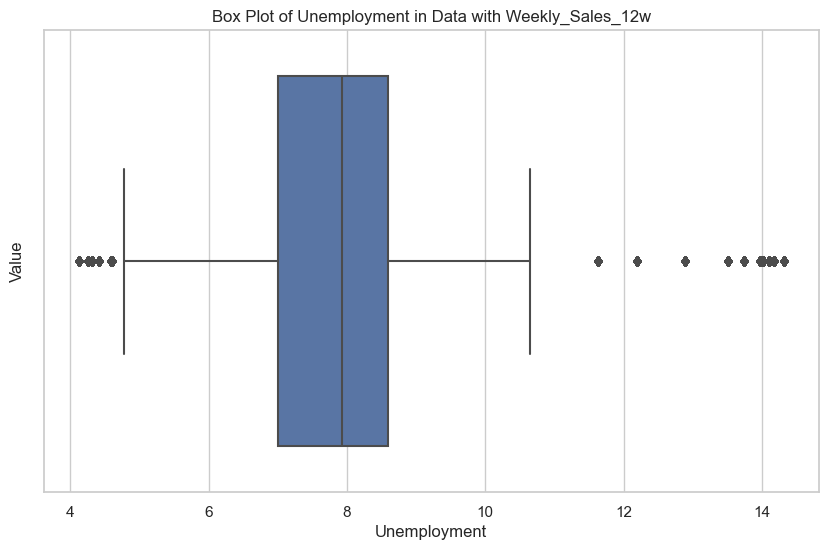

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


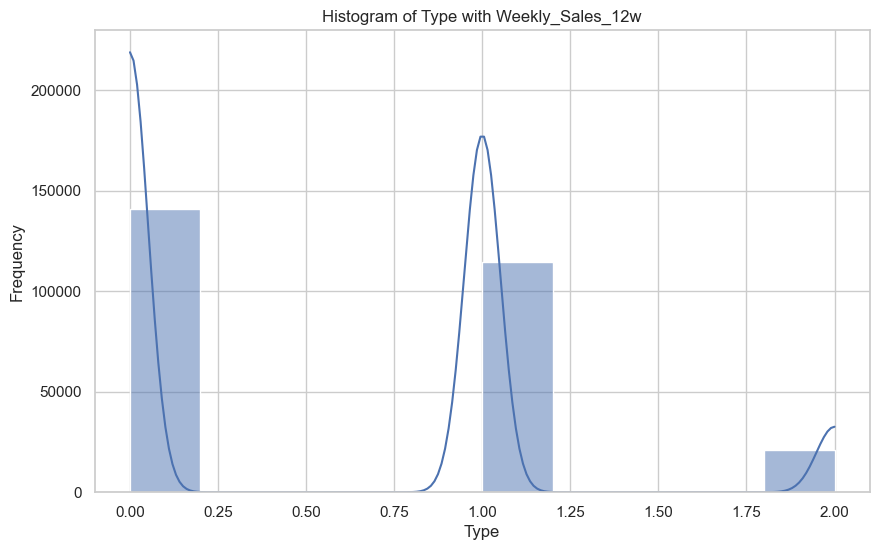

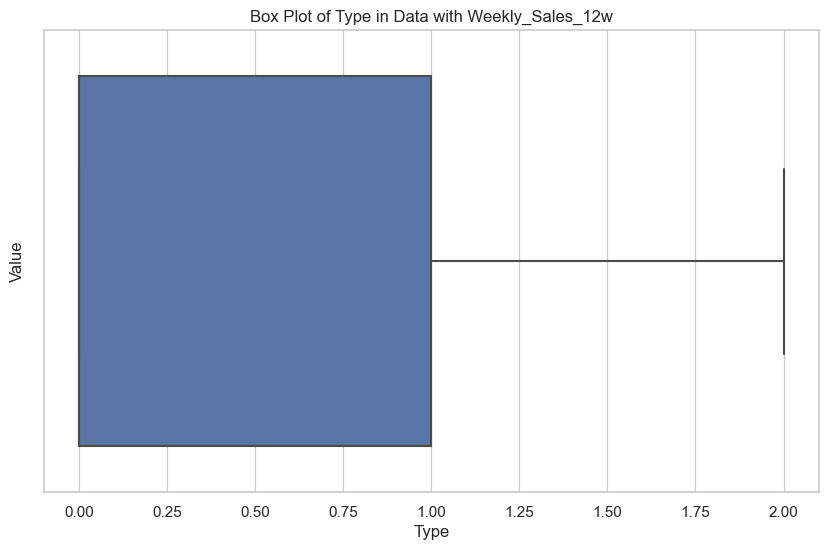

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


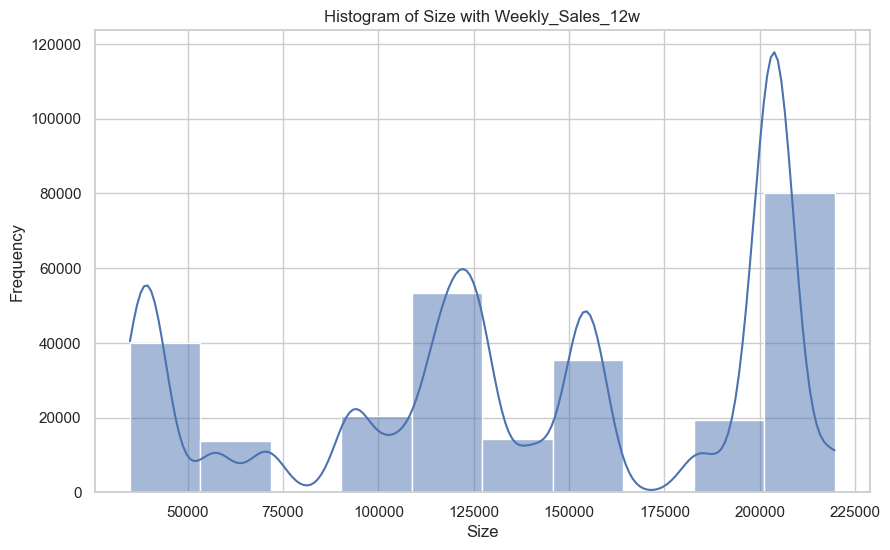

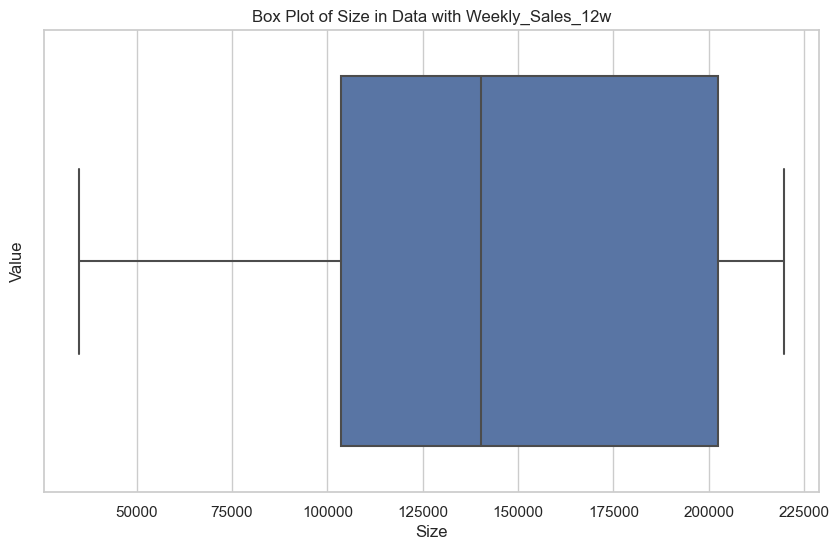

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


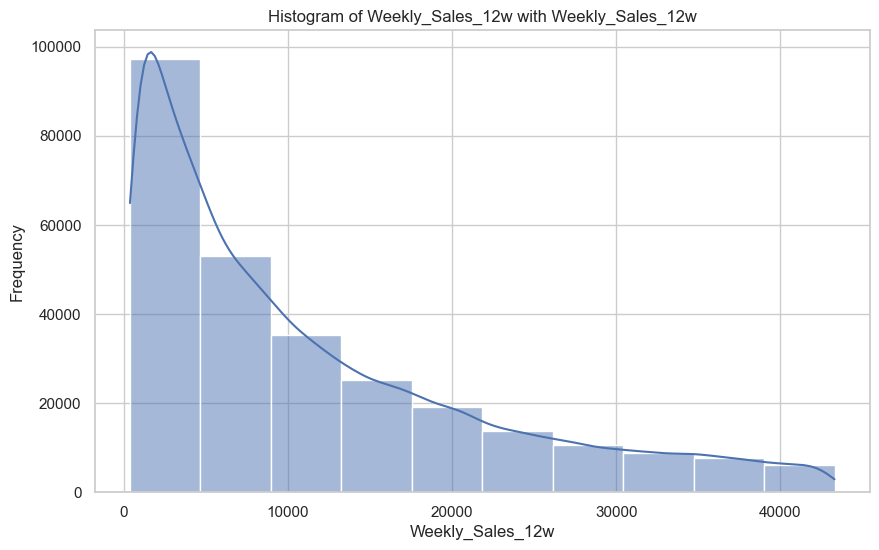

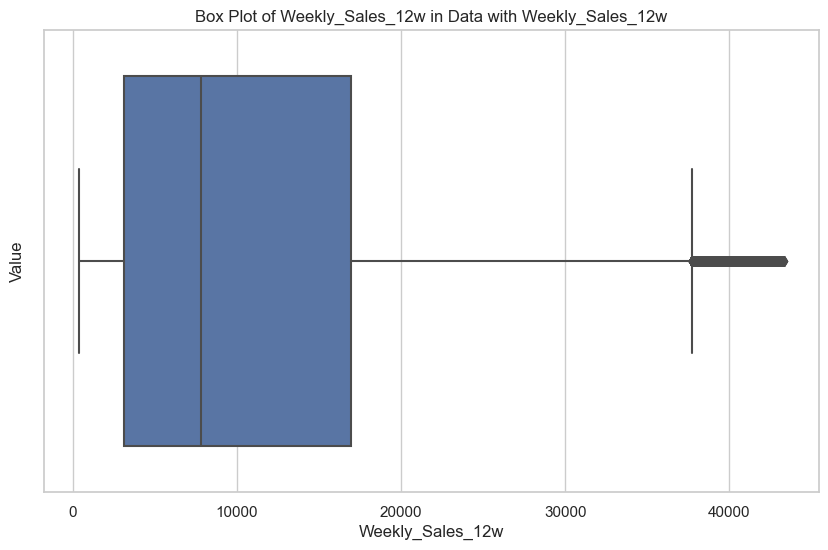

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


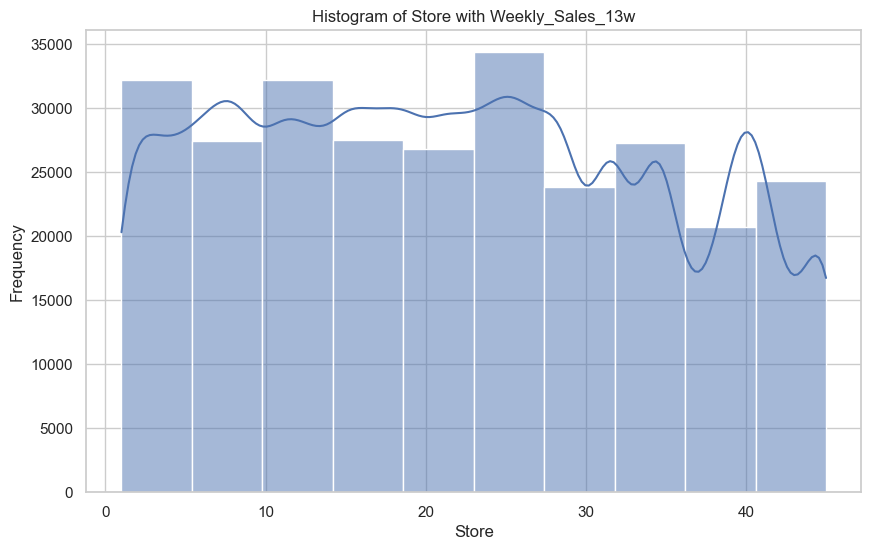

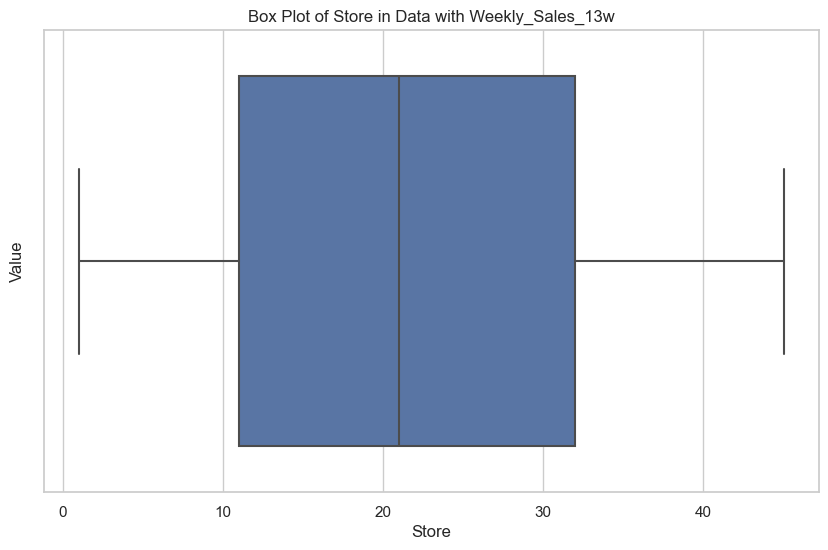

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


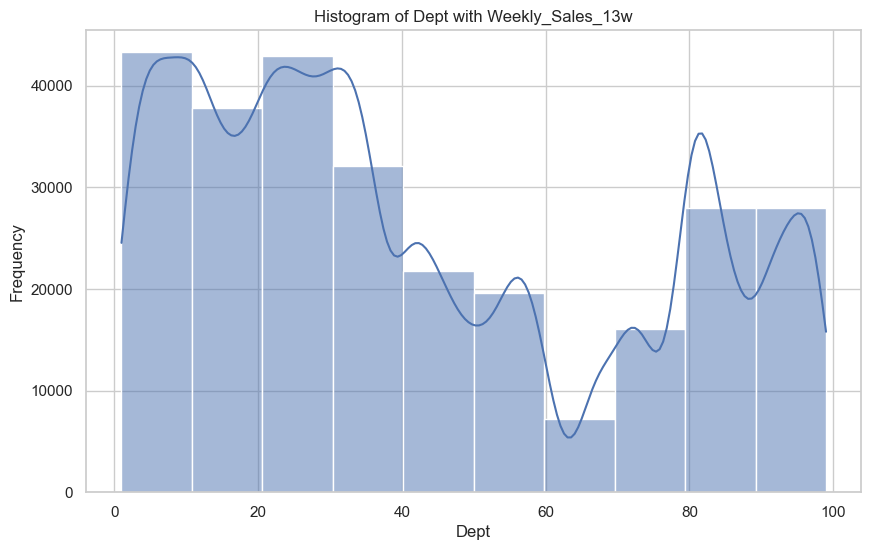

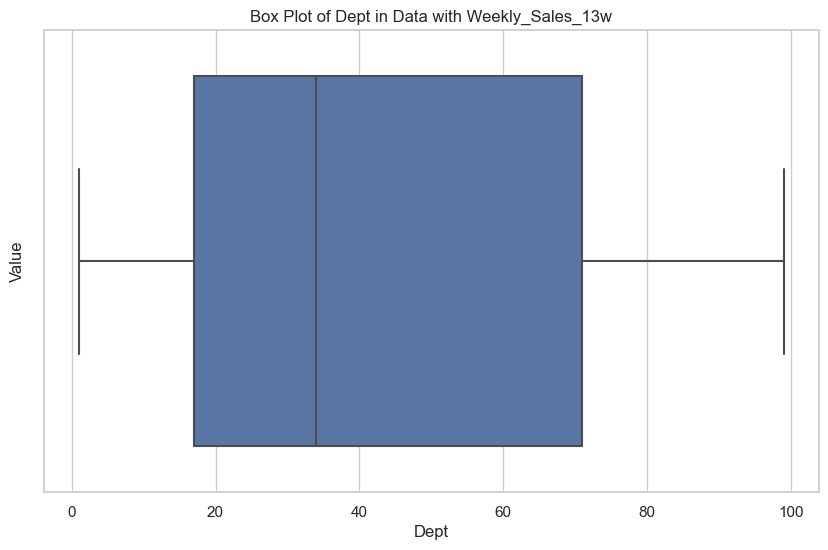

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


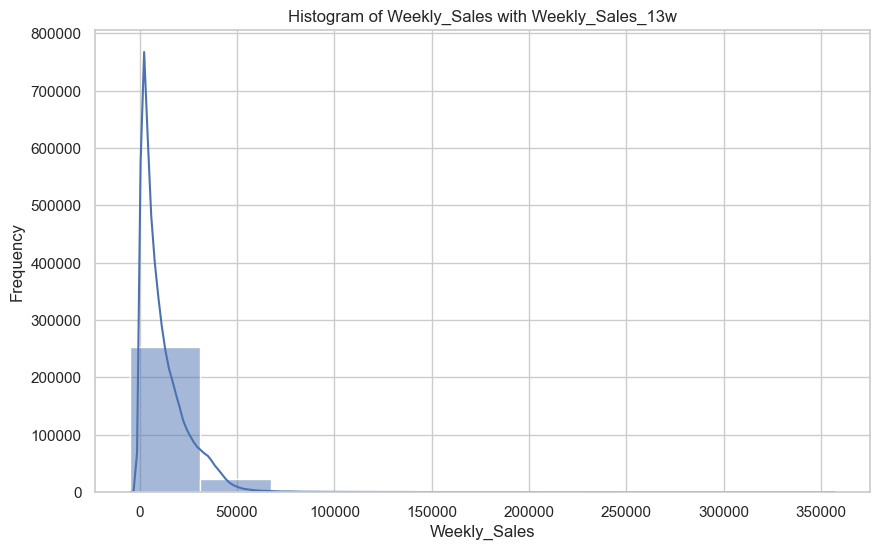

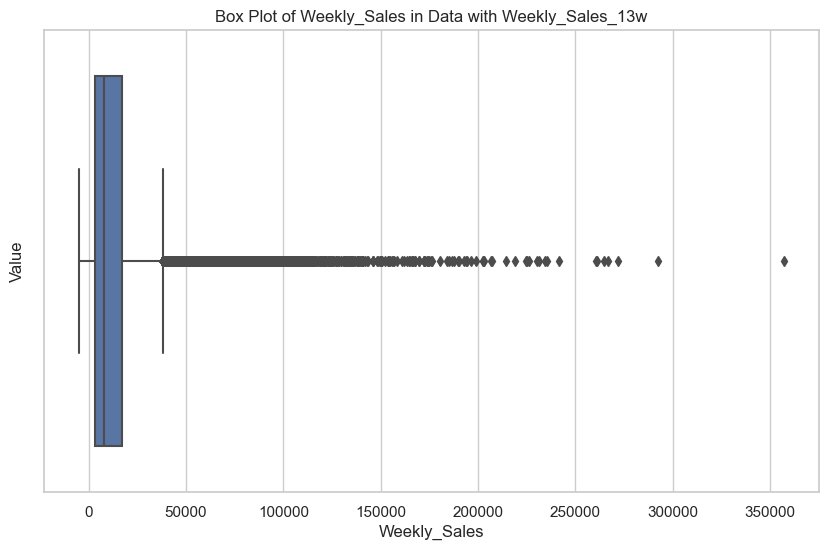

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


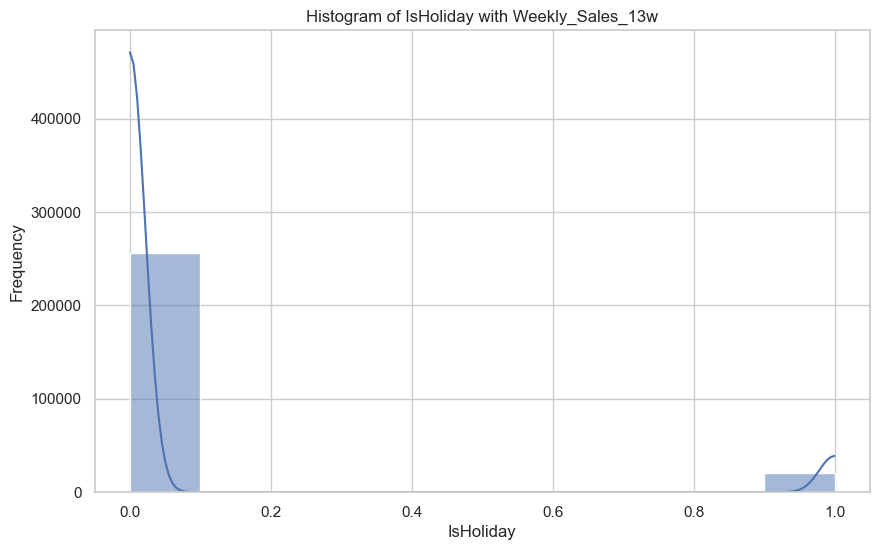

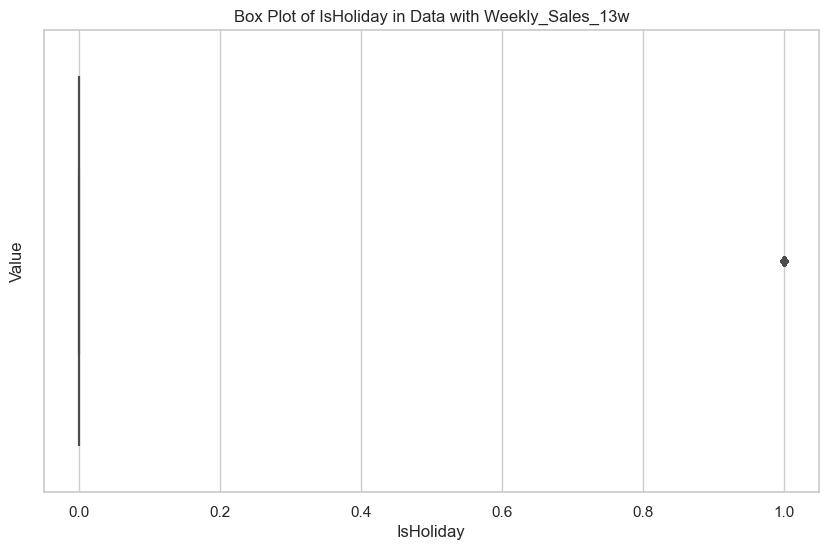

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


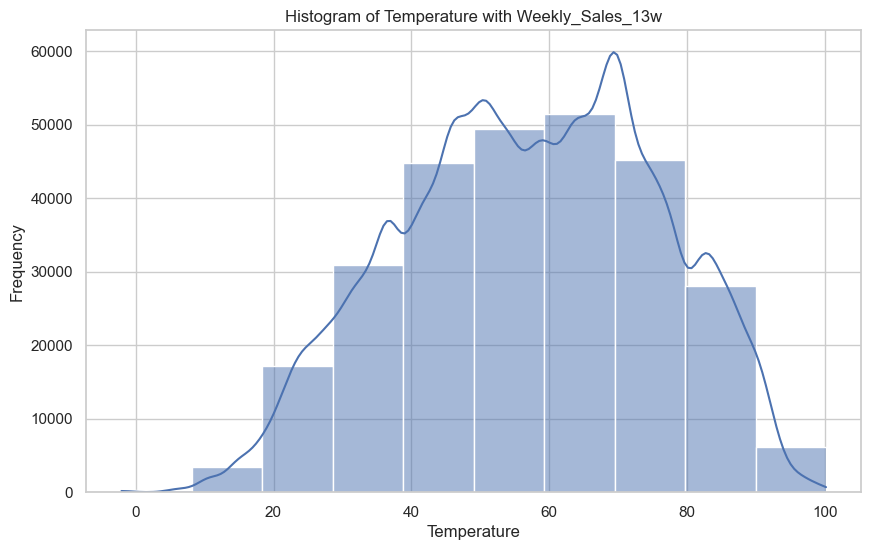

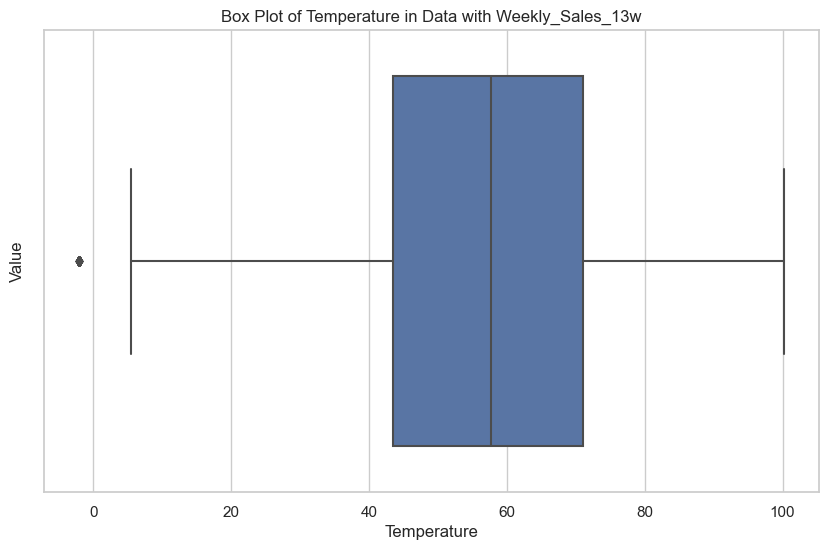

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


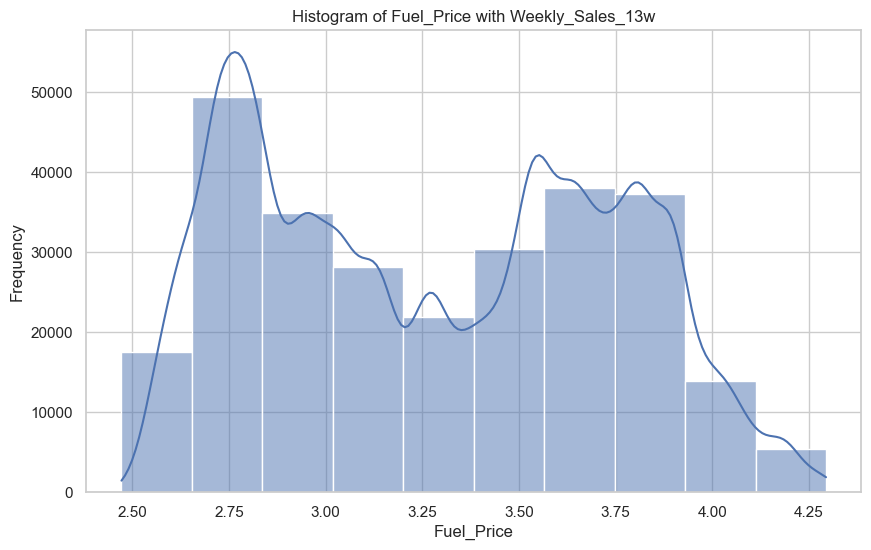

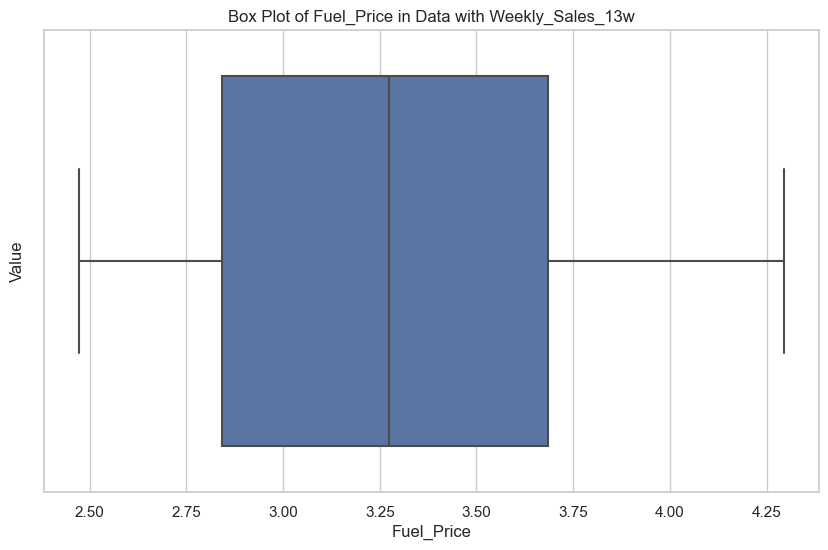

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


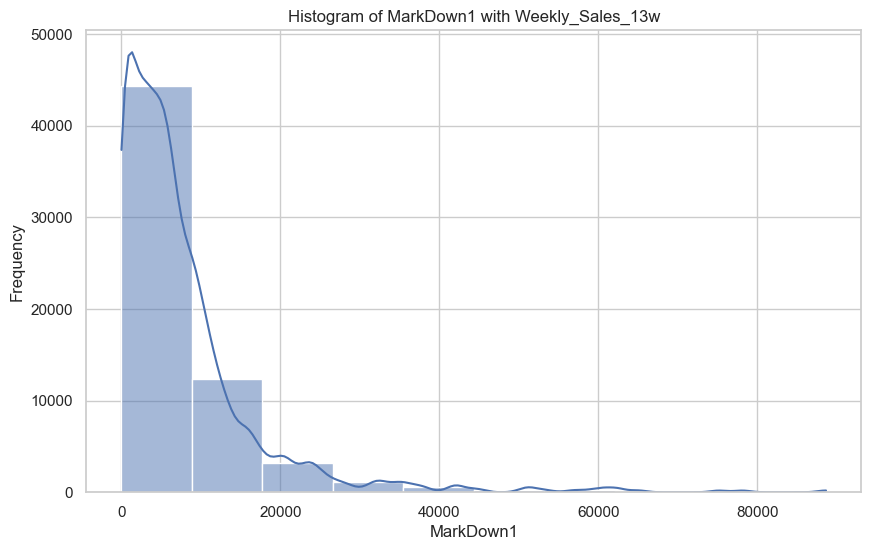

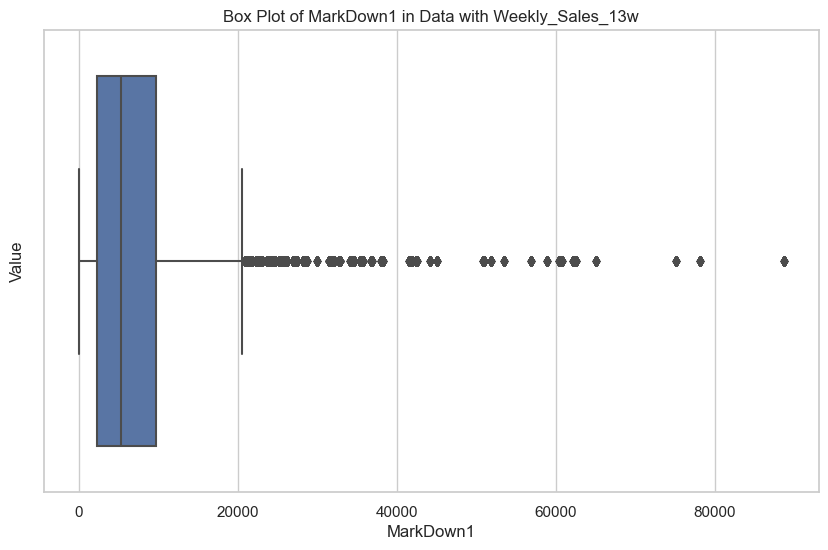

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


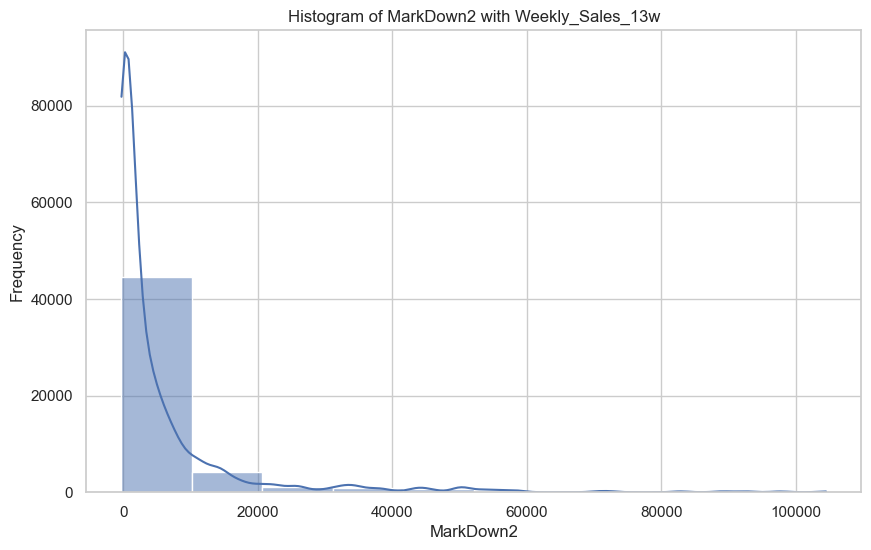

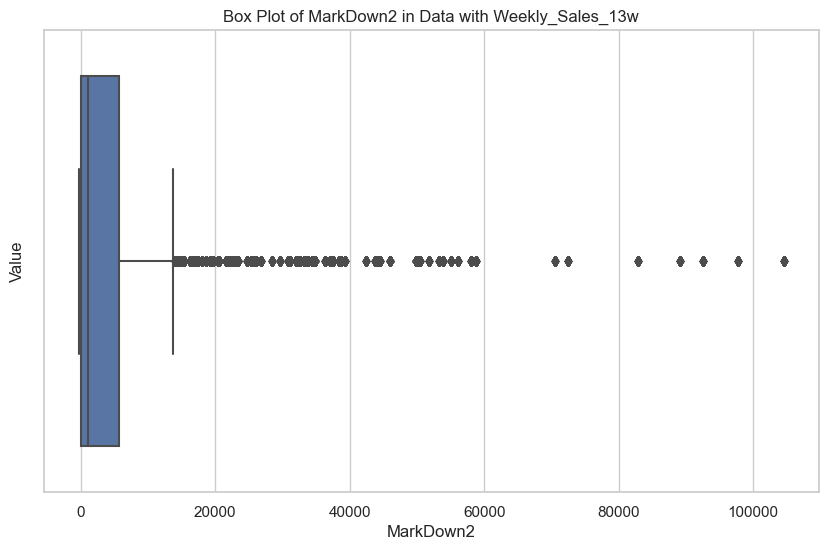

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


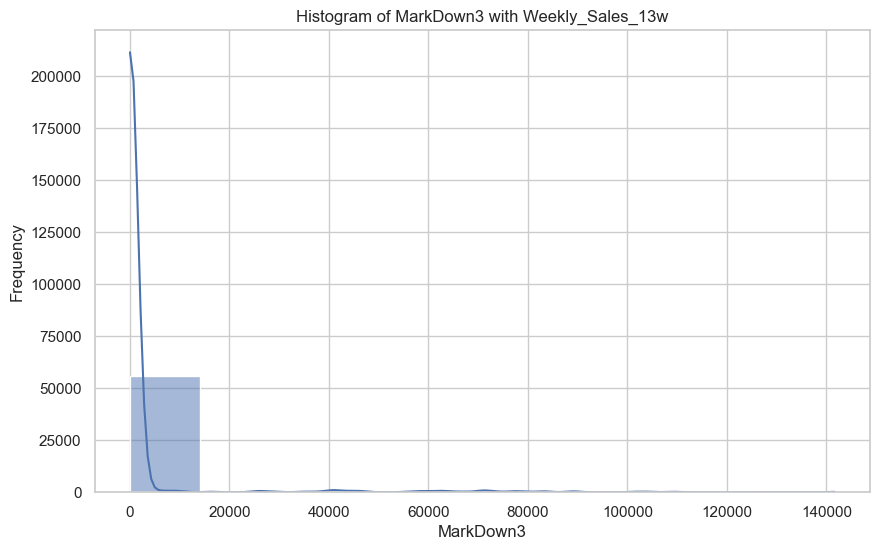

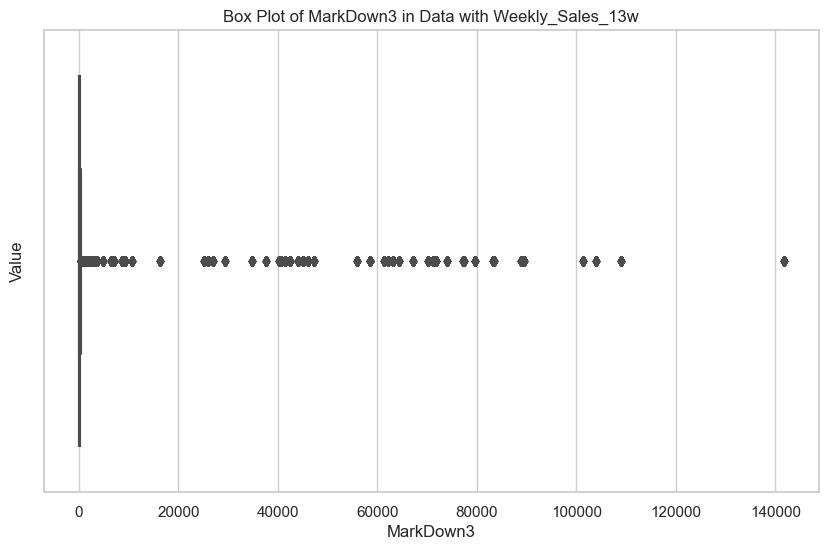

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


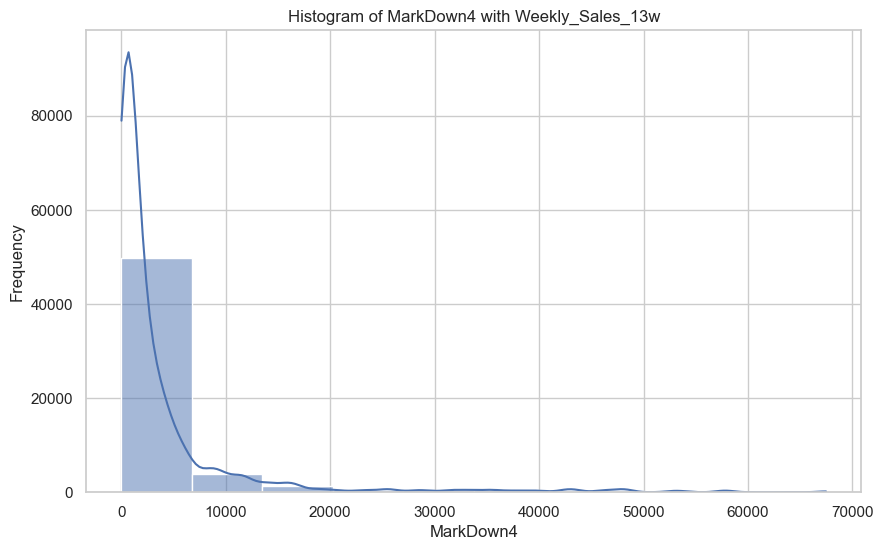

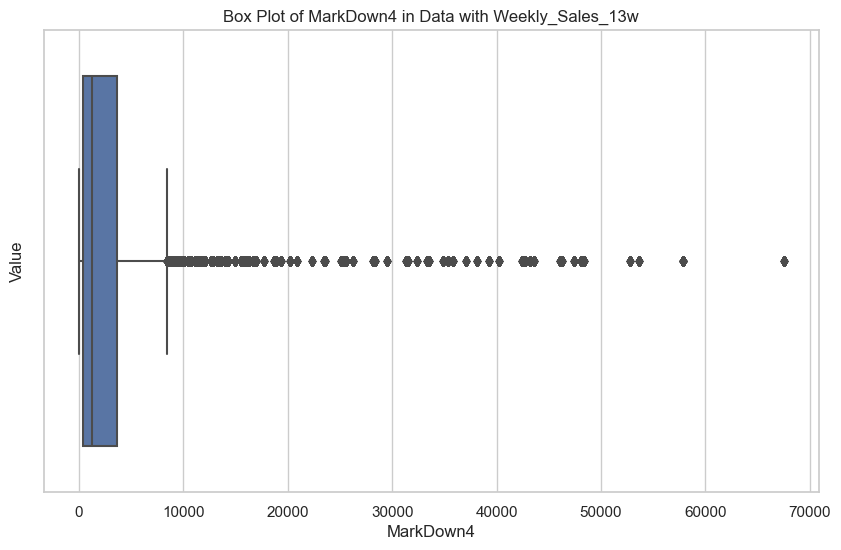

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


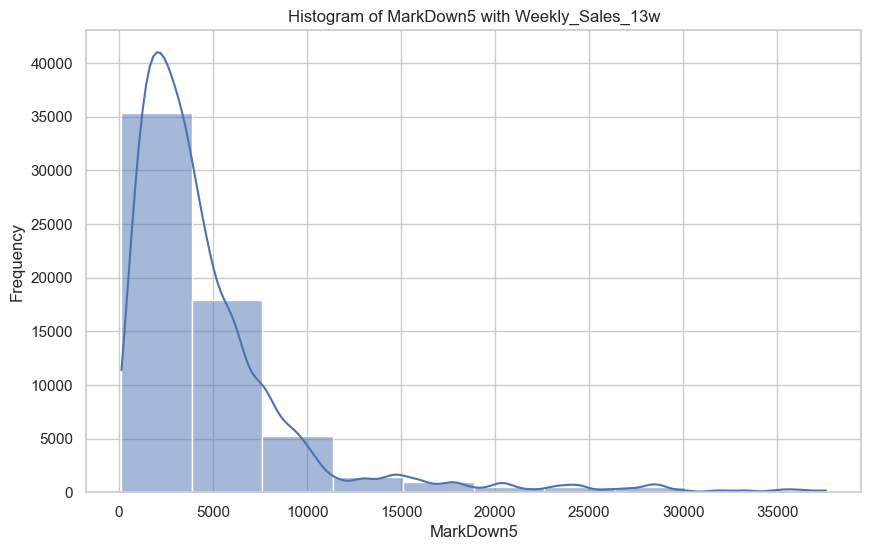

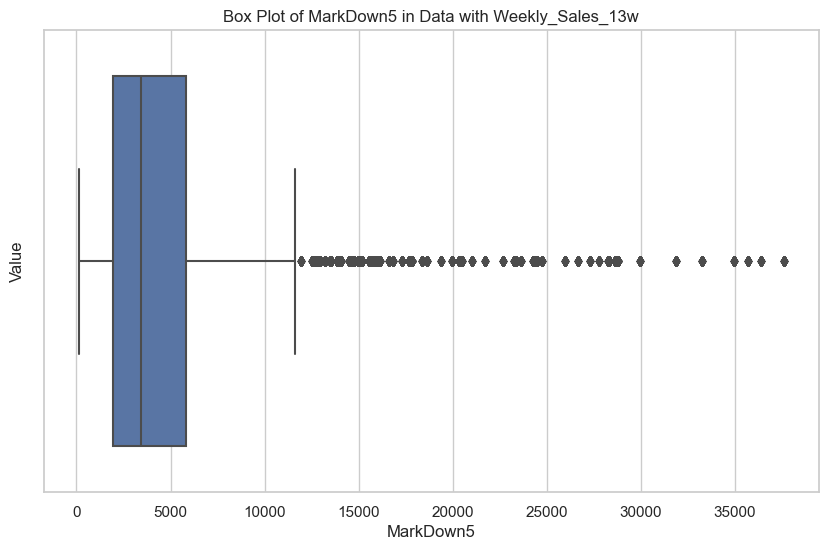

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


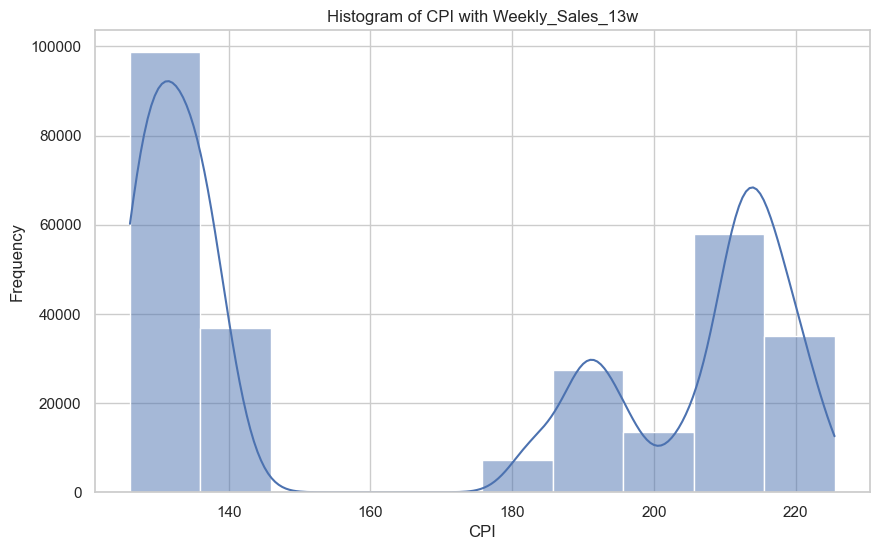

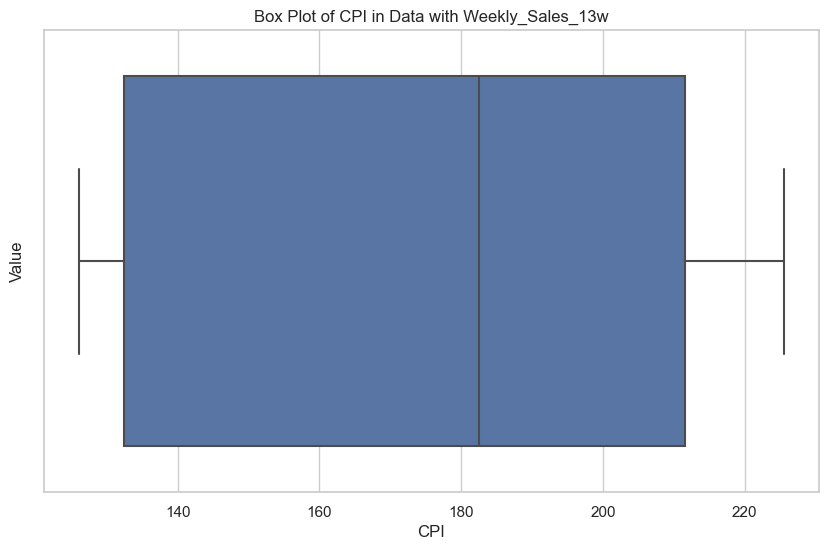

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


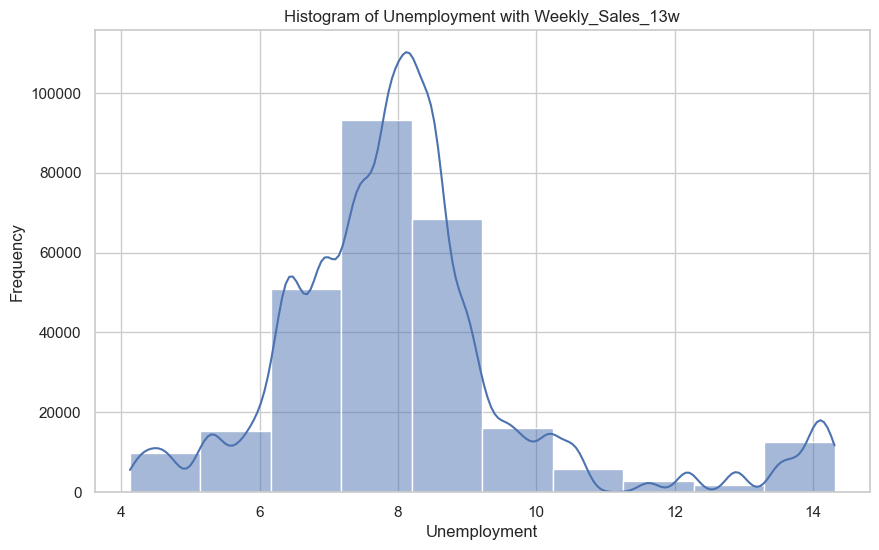

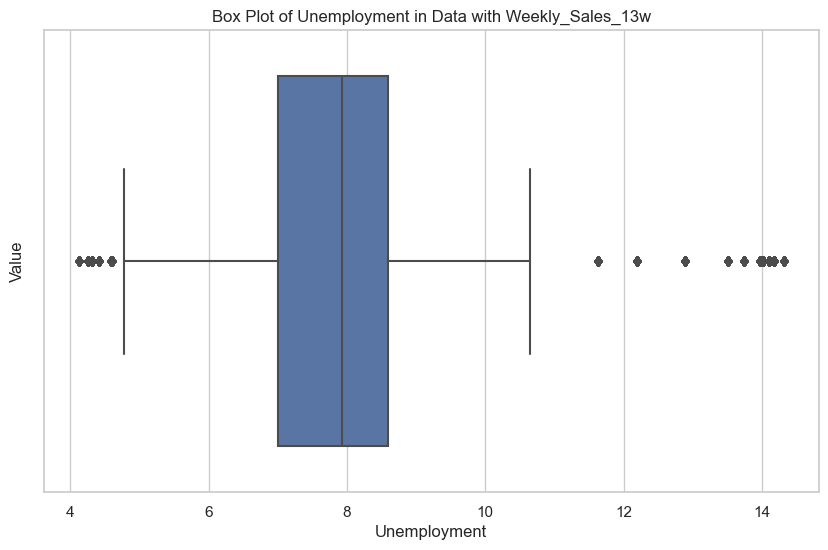

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


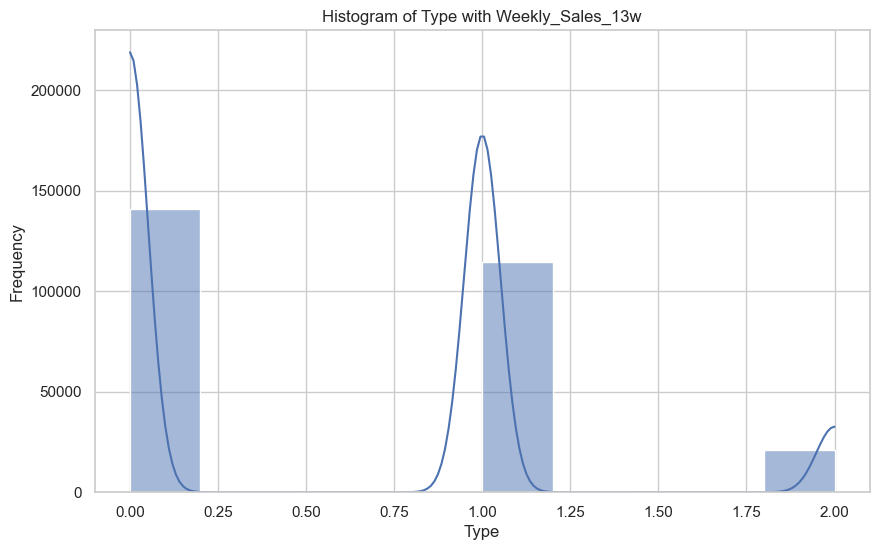

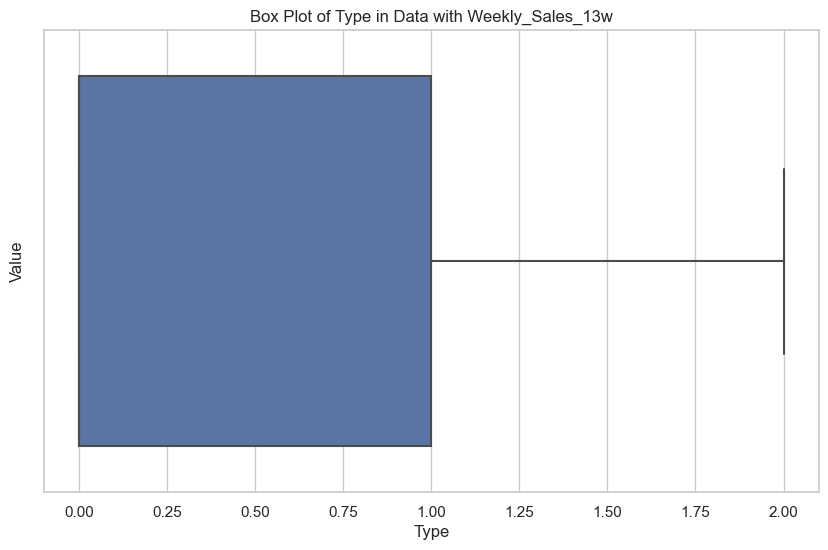

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


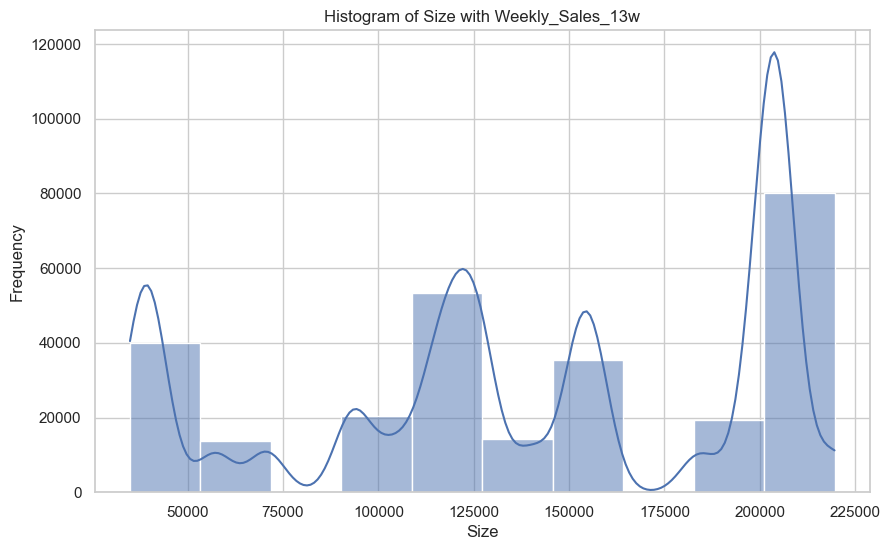

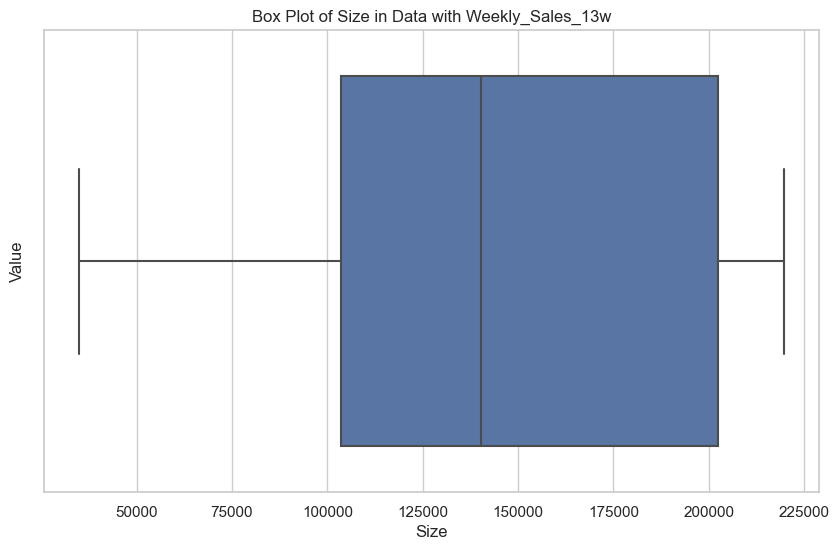

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


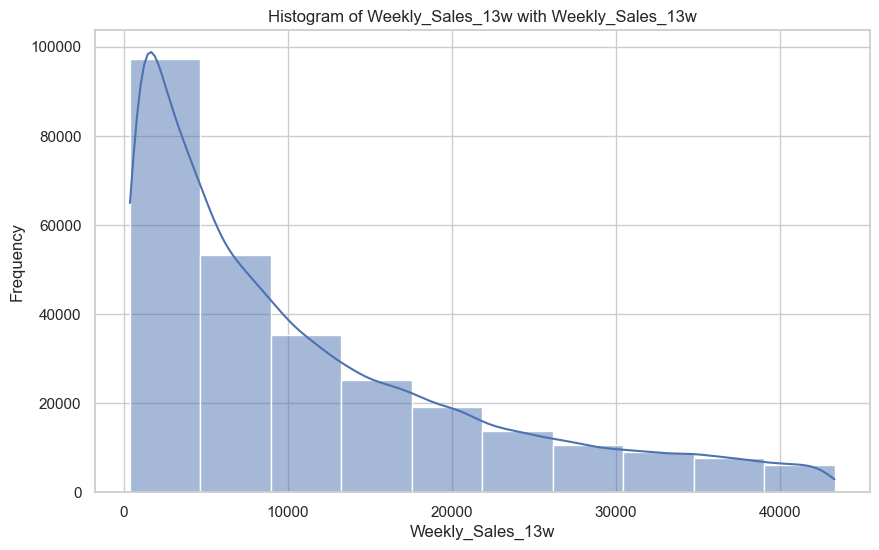

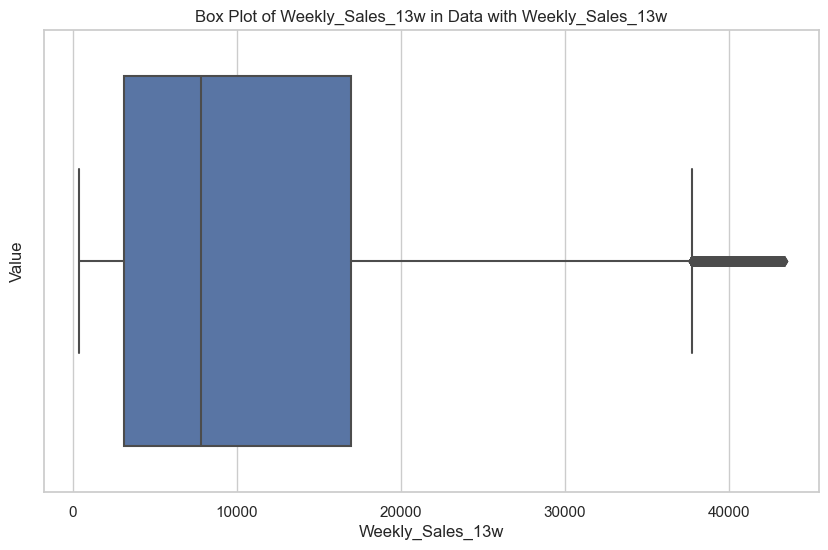

In [18]:
# Draw the histograms and box graphics to show the distribution of values and outliers intuitively and directly
# Set the style of graphics
sns.set(style="whitegrid")

# Iterate the DataFrame
for week, df in data_frames.items(): 
    # Select columns of type float64 and int64
    numerical_df = df.select_dtypes(include=['float64', 'int64'])
    
    for column in numerical_df.columns:  
        # Draw histograms
        plt.figure(figsize=(10, 6))
        sns.histplot(numerical_df[column], bins=10, kde=True)
        plt.title(f'Histogram of {column} with {week}')
        plt.xlabel(f'{column}')
        plt.ylabel('Frequency')
        plt.show()
        plt.close()  

        # Draw box diagrams
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=numerical_df[column])
        plt.title(f'Box Plot of {column} in Data with {week}')
        plt.xlabel(column)
        plt.ylabel('Value')  
        plt.show()
        plt.close()  

### 5. Identify correlated variables

Spearman Rank Correlation:
                     Store      Dept  Weekly_Sales  IsHoliday  Temperature  \
Store            1.000000  0.025280     -0.009639  -0.000218    -0.086879   
Dept             0.025280  1.000000     -0.083276  -0.000695     0.013433   
Weekly_Sales    -0.009639 -0.083276      1.000000   0.008374     0.014733   
IsHoliday       -0.000218 -0.000695      0.008374   1.000000    -0.163929   
Temperature     -0.086879  0.013433      0.014733  -0.163929     1.000000   
Fuel_Price       0.071548  0.005739      0.012982  -0.076015     0.032419   
MarkDown1       -0.145337 -0.025545      0.066864  -0.116753    -0.027580   
MarkDown2       -0.027408 -0.027085      0.001382   0.170463    -0.290759   
MarkDown3       -0.065622  0.003049      0.094533   0.258746    -0.241310   
MarkDown4        0.008755 -0.003614      0.041363  -0.077544    -0.062560   
MarkDown5       -0.101361 -0.012410      0.088438  -0.084285    -0.121497   
CPI             -0.257109 -0.021685     -0.04811

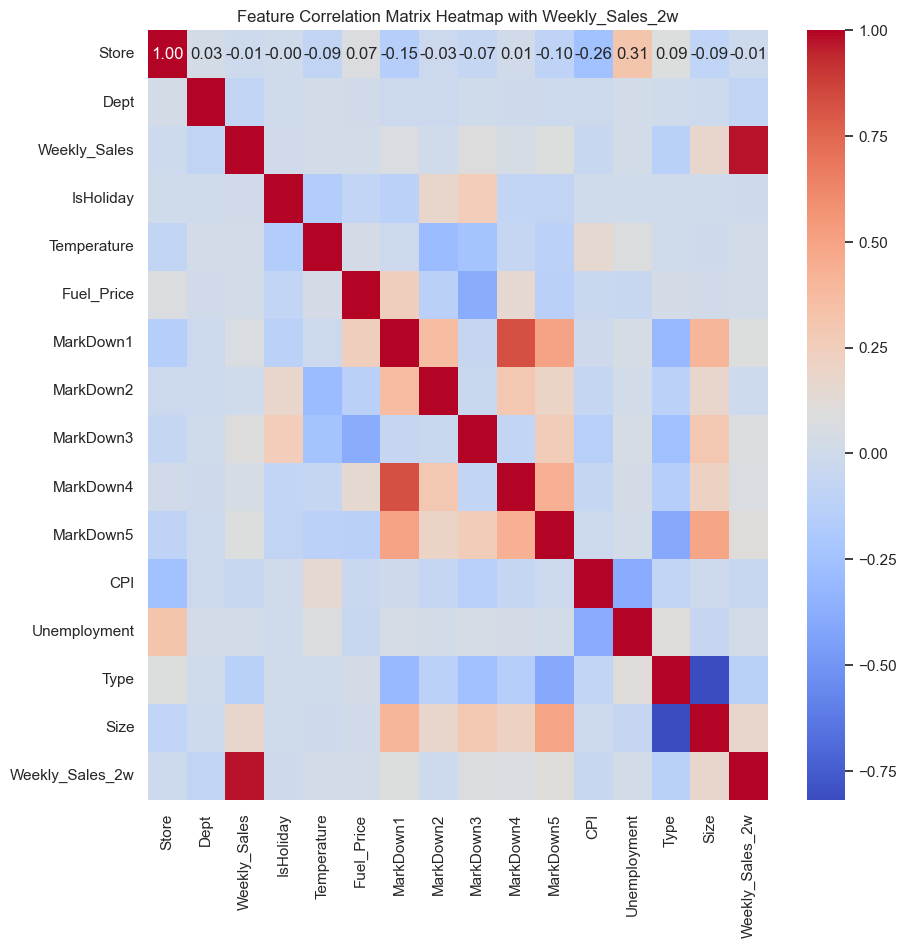

Spearman Rank Correlation:
                     Store      Dept  Weekly_Sales  IsHoliday  Temperature  \
Store            1.000000  0.025379     -0.009738  -0.000325    -0.086900   
Dept             0.025379  1.000000     -0.083235  -0.000578     0.013503   
Weekly_Sales    -0.009738 -0.083235      1.000000   0.010421     0.013959   
IsHoliday       -0.000325 -0.000578      0.010421   1.000000    -0.163641   
Temperature     -0.086900  0.013503      0.013959  -0.163641     1.000000   
Fuel_Price       0.071561  0.006023      0.012641  -0.075417     0.031904   
MarkDown1       -0.144321 -0.022786      0.068575  -0.112036    -0.030129   
MarkDown2       -0.028101 -0.022852     -0.008238   0.176048    -0.292481   
MarkDown3       -0.065842  0.002718      0.096114   0.257233    -0.241932   
MarkDown4        0.011457  0.000639      0.035618  -0.070559    -0.062711   
MarkDown5       -0.102064 -0.013258      0.090277  -0.081227    -0.120966   
CPI             -0.257250 -0.021646     -0.04819

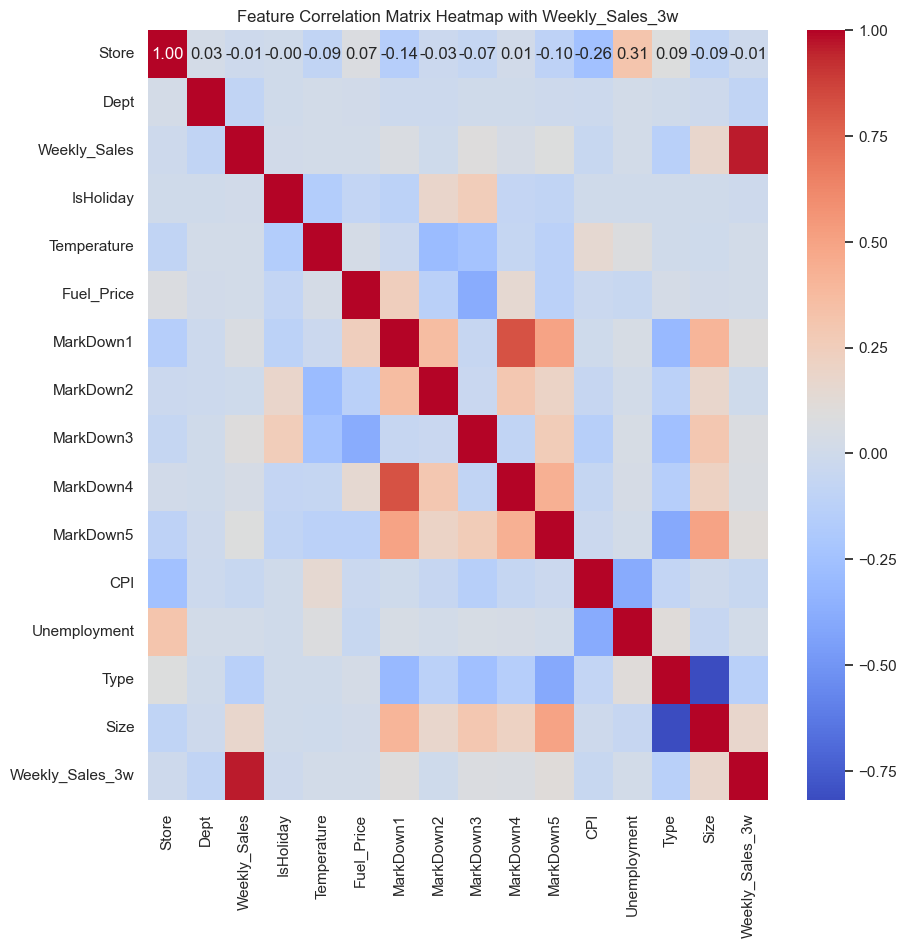

Spearman Rank Correlation:
                     Store      Dept  Weekly_Sales  IsHoliday  Temperature  \
Store            1.000000  0.025514     -0.009685  -0.000461    -0.086755   
Dept             0.025514  1.000000     -0.083505   0.000759     0.013503   
Weekly_Sales    -0.009685 -0.083505      1.000000   0.005313     0.012006   
IsHoliday       -0.000461  0.000759      0.005313   1.000000    -0.162303   
Temperature     -0.086755  0.013503      0.012006  -0.162303     1.000000   
Fuel_Price       0.071447  0.006136      0.012205  -0.074905     0.031666   
MarkDown1       -0.144809 -0.023866      0.075326  -0.112266    -0.031350   
MarkDown2       -0.026874 -0.020541     -0.012613   0.176699    -0.291031   
MarkDown3       -0.066953 -0.000430      0.101649   0.254714    -0.244515   
MarkDown4        0.010713 -0.003500      0.045191  -0.070284    -0.065464   
MarkDown5       -0.102568 -0.017168      0.099321  -0.082433    -0.123662   
CPI             -0.257345 -0.021512     -0.04811

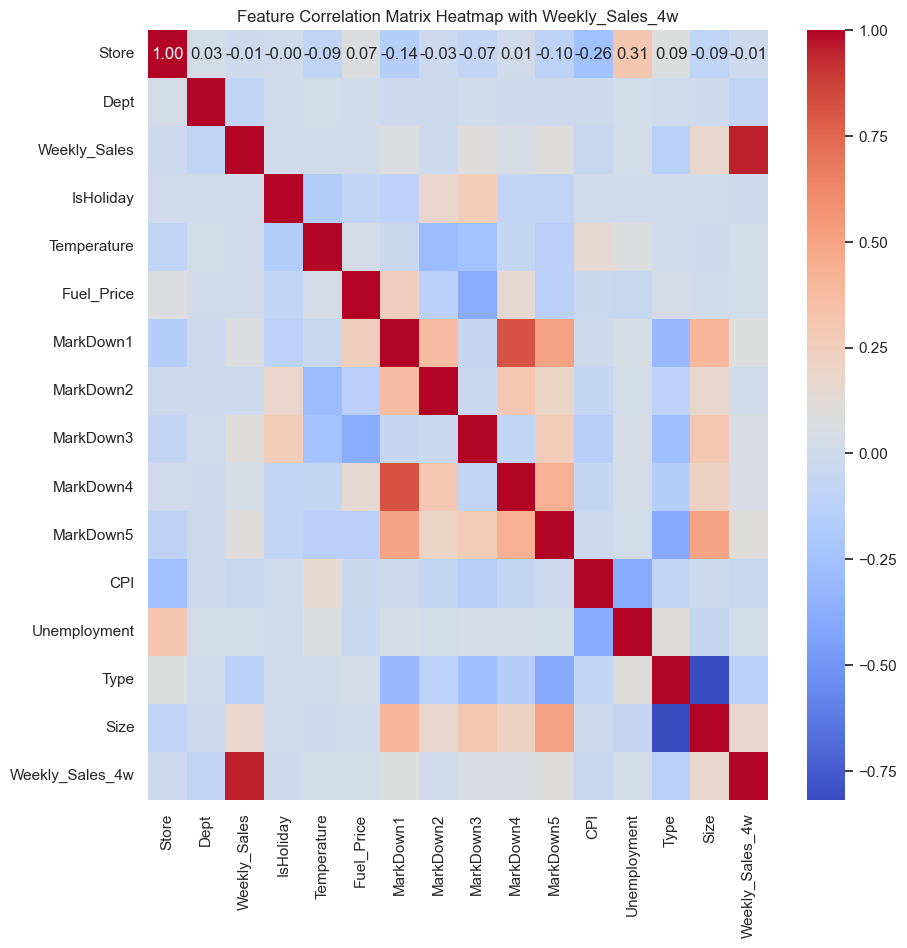

Spearman Rank Correlation:
                     Store      Dept  Weekly_Sales  IsHoliday  Temperature  \
Store            1.000000  0.025427     -0.009661  -0.000075    -0.086554   
Dept             0.025427  1.000000     -0.084232   0.000702     0.013682   
Weekly_Sales    -0.009661 -0.084232      1.000000  -0.000578     0.010402   
IsHoliday       -0.000075  0.000702     -0.000578   1.000000    -0.162821   
Temperature     -0.086554  0.013682      0.010402  -0.162821     1.000000   
Fuel_Price       0.071322  0.006150      0.011489  -0.074776     0.032005   
MarkDown1       -0.144601 -0.023106      0.073914  -0.103141    -0.031585   
MarkDown2       -0.025739 -0.016789     -0.024458   0.185519    -0.289950   
MarkDown3       -0.066279 -0.004994      0.105828   0.243914    -0.245745   
MarkDown4        0.012130 -0.005054      0.051351  -0.060890    -0.065044   
MarkDown5       -0.101666 -0.020938      0.107931  -0.078853    -0.125190   
CPI             -0.257459 -0.021454     -0.04802

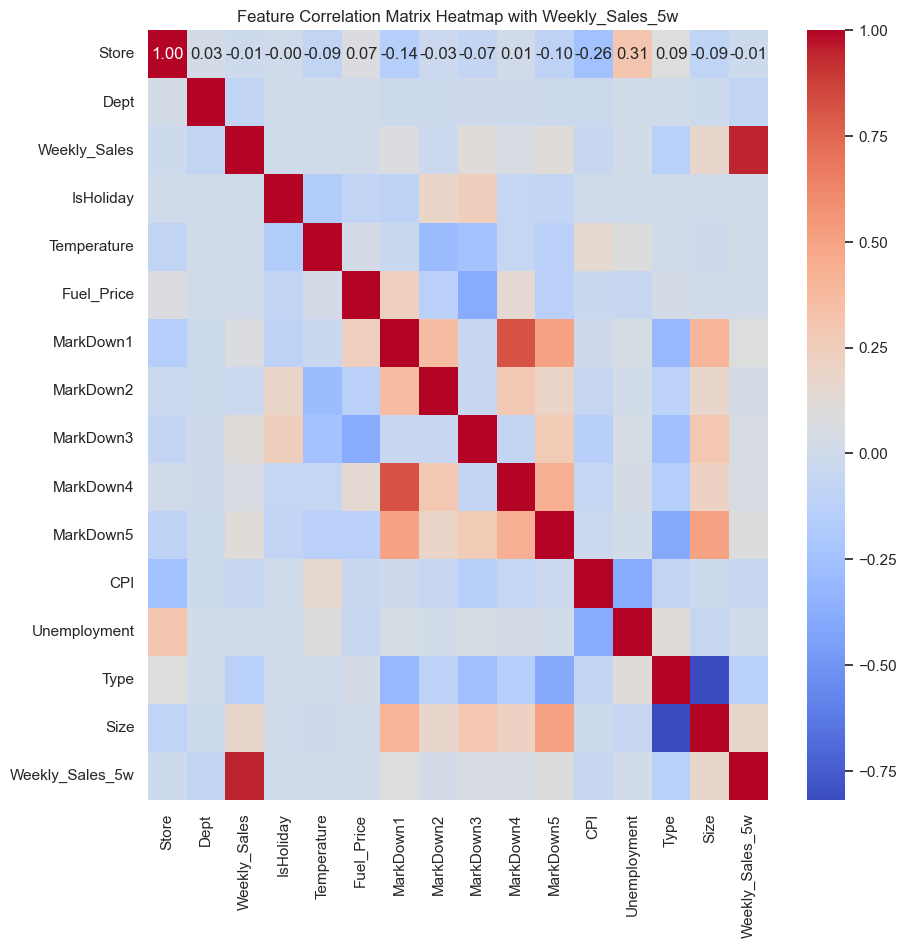

Spearman Rank Correlation:
                     Store      Dept  Weekly_Sales  IsHoliday  Temperature  \
Store            1.000000  0.025449     -0.009669   0.000287    -0.086726   
Dept             0.025449  1.000000     -0.084982  -0.003092     0.013508   
Weekly_Sales    -0.009669 -0.084982      1.000000   0.014056     0.009086   
IsHoliday        0.000287 -0.003092      0.014056   1.000000    -0.164583   
Temperature     -0.086726  0.013508      0.009086  -0.164583     1.000000   
Fuel_Price       0.071224  0.006101      0.011186  -0.075750     0.032016   
MarkDown1       -0.144556 -0.018813      0.059695  -0.115002    -0.030526   
MarkDown2       -0.023689 -0.010842     -0.040198   0.174743    -0.289790   
MarkDown3       -0.065656 -0.010577      0.116365   0.256363    -0.243584   
MarkDown4        0.011089 -0.001720      0.040631  -0.075260    -0.062898   
MarkDown5       -0.100387 -0.018674      0.100238  -0.085005    -0.126114   
CPI             -0.257476 -0.021516     -0.04793

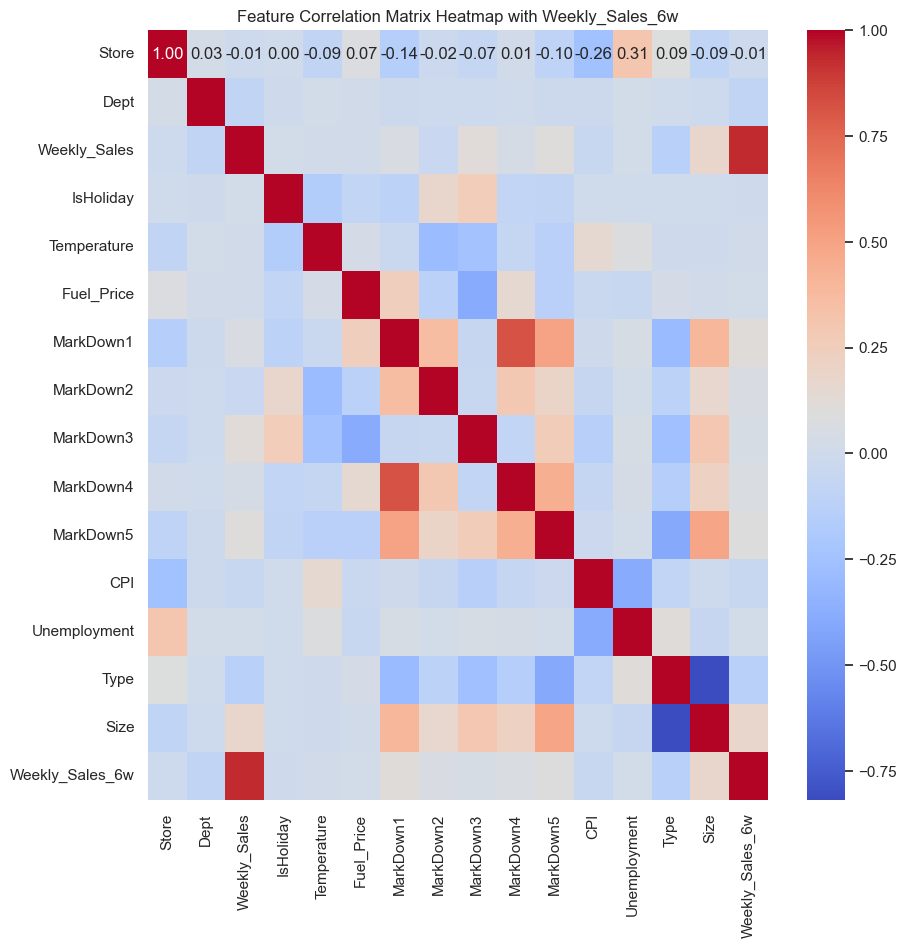

Spearman Rank Correlation:
                     Store      Dept  Weekly_Sales  IsHoliday  Temperature  \
Store            1.000000  0.025418     -0.009679  -0.000390    -0.086620   
Dept             0.025418  1.000000     -0.085147  -0.003148     0.013342   
Weekly_Sales    -0.009679 -0.085147      1.000000   0.013215     0.008051   
IsHoliday       -0.000390 -0.003148      0.013215   1.000000    -0.165244   
Temperature     -0.086620  0.013342      0.008051  -0.165244     1.000000   
Fuel_Price       0.071141  0.006045      0.011365  -0.075937     0.032407   
MarkDown1       -0.144947 -0.017007      0.062277  -0.113993    -0.029543   
MarkDown2       -0.023186 -0.006732     -0.049638   0.175969    -0.292609   
MarkDown3       -0.066454 -0.011691      0.117479   0.256435    -0.242815   
MarkDown4        0.010946  0.002762      0.040731  -0.075263    -0.063016   
MarkDown5       -0.100120 -0.018963      0.107066  -0.083920    -0.124226   
CPI             -0.257621 -0.021556     -0.04790

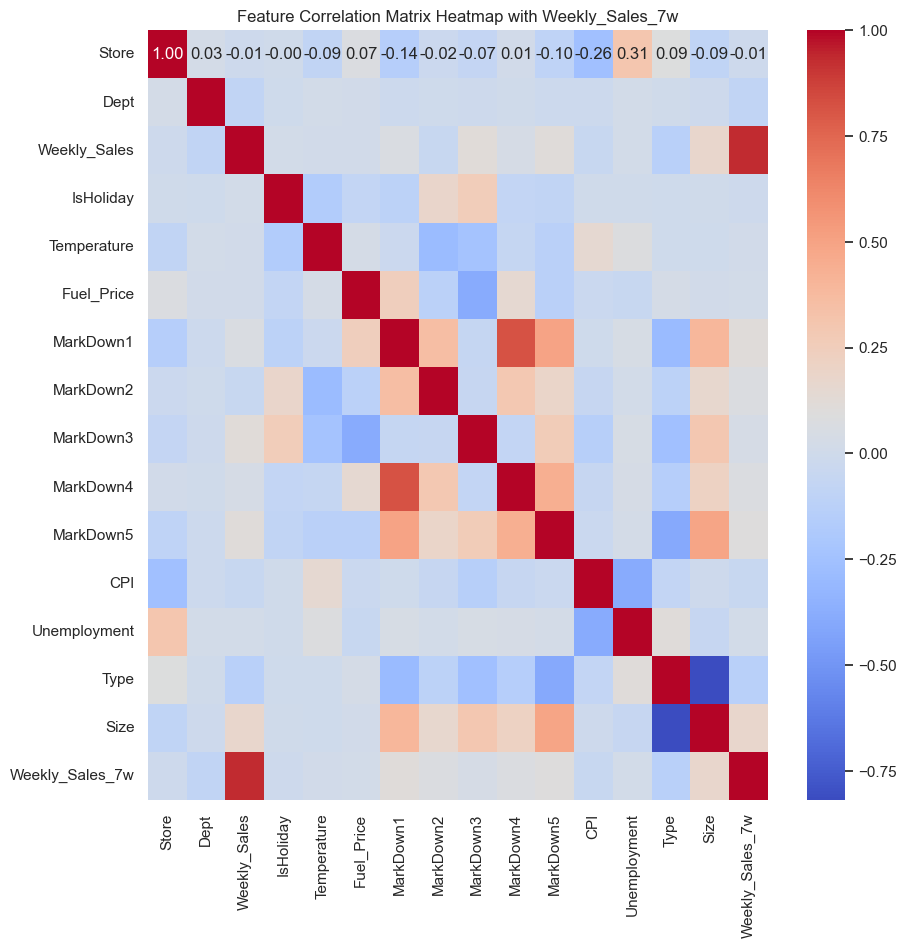

Spearman Rank Correlation:
                     Store      Dept  Weekly_Sales  IsHoliday  Temperature  \
Store            1.000000  0.025451     -0.009841  -0.000096    -0.086293   
Dept             0.025451  1.000000     -0.085263  -0.001849     0.013225   
Weekly_Sales    -0.009841 -0.085263      1.000000   0.012206     0.007005   
IsHoliday       -0.000096 -0.001849      0.012206   1.000000    -0.164077   
Temperature     -0.086293  0.013225      0.007005  -0.164077     1.000000   
Fuel_Price       0.071086  0.006003      0.011426  -0.075086     0.032665   
MarkDown1       -0.144058 -0.018841      0.070168  -0.114953    -0.028550   
MarkDown2       -0.022382 -0.008940     -0.037874   0.172198    -0.290115   
MarkDown3       -0.066018 -0.014102      0.125853   0.253697    -0.242146   
MarkDown4        0.010477  0.002258      0.046289  -0.075739    -0.063761   
MarkDown5       -0.101073 -0.021575      0.110532  -0.084623    -0.122944   
CPI             -0.257620 -0.021550     -0.04775

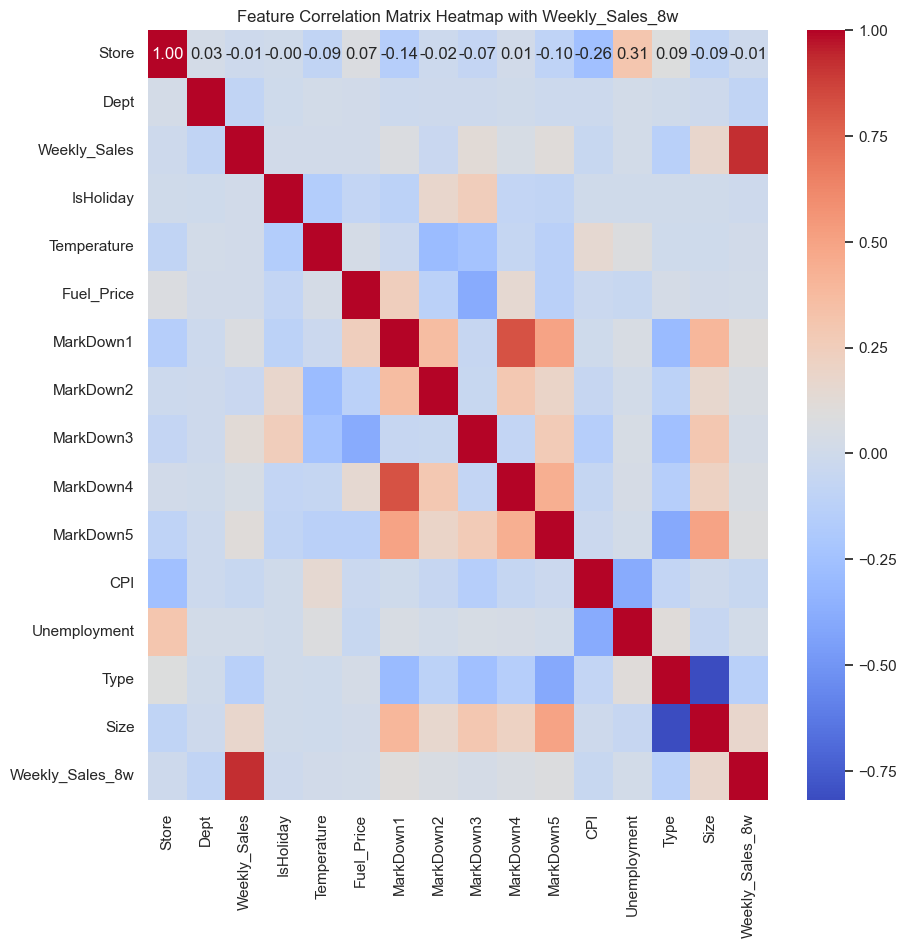

Spearman Rank Correlation:
                     Store      Dept  Weekly_Sales  IsHoliday  Temperature  \
Store            1.000000  0.025524     -0.010016  -0.000680    -0.086086   
Dept             0.025524  1.000000     -0.086059  -0.002602     0.013944   
Weekly_Sales    -0.010016 -0.086059      1.000000   0.011058     0.004640   
IsHoliday       -0.000680 -0.002602      0.011058   1.000000    -0.164656   
Temperature     -0.086086  0.013944      0.004640  -0.164656     1.000000   
Fuel_Price       0.070858  0.005876      0.011427  -0.076615     0.032635   
MarkDown1       -0.144516 -0.021131      0.070214  -0.118499    -0.029269   
MarkDown2       -0.023352 -0.013440     -0.030510   0.171507    -0.289489   
MarkDown3       -0.066000 -0.014859      0.122827   0.255022    -0.241597   
MarkDown4        0.010741 -0.000358      0.044944  -0.080869    -0.063349   
MarkDown5       -0.100316 -0.021926      0.108757  -0.089100    -0.121931   
CPI             -0.257663 -0.021471     -0.04764

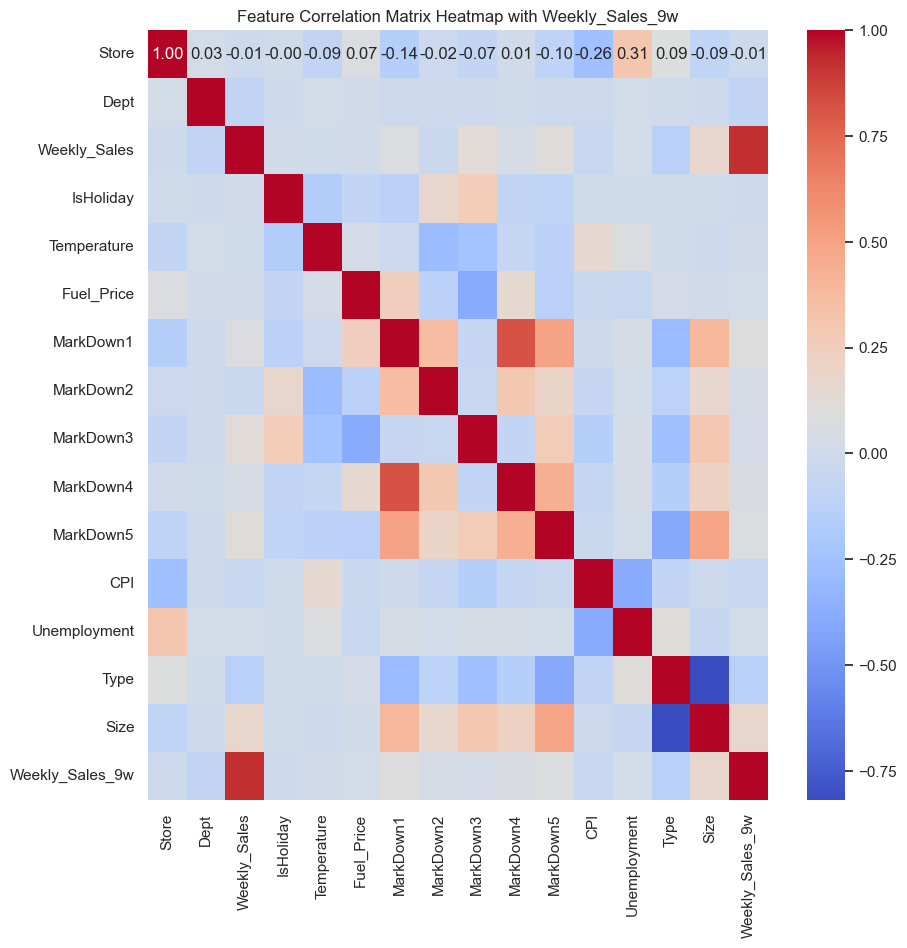

Spearman Rank Correlation:
                      Store      Dept  Weekly_Sales  IsHoliday  Temperature  \
Store             1.000000  0.025356     -0.010251  -0.000611    -0.085806   
Dept              0.025356  1.000000     -0.086471  -0.002499     0.013981   
Weekly_Sales     -0.010251 -0.086471      1.000000   0.012623     0.003094   
IsHoliday        -0.000611 -0.002499      0.012623   1.000000    -0.164844   
Temperature      -0.085806  0.013981      0.003094  -0.164844     1.000000   
Fuel_Price        0.070761  0.005705      0.011796  -0.075211     0.032571   
MarkDown1        -0.145428 -0.021335      0.067369  -0.114981    -0.028618   
MarkDown2        -0.023893 -0.013672     -0.028085   0.171073    -0.289169   
MarkDown3        -0.065179 -0.015326      0.120477   0.256561    -0.241949   
MarkDown4         0.009886 -0.001347      0.039546  -0.076177    -0.062606   
MarkDown5        -0.101318 -0.021914      0.106112  -0.085516    -0.122241   
CPI              -0.257618 -0.021463

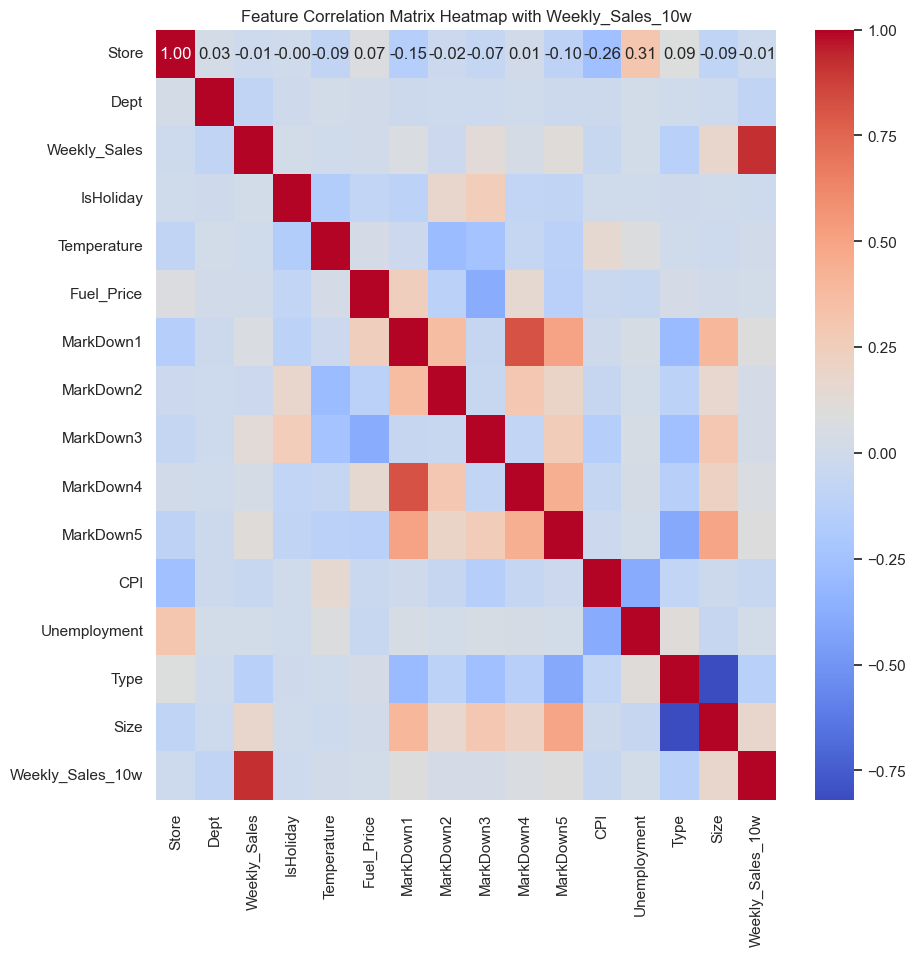

Spearman Rank Correlation:
                      Store      Dept  Weekly_Sales  IsHoliday  Temperature  \
Store             1.000000  0.025356     -0.010315  -0.000600    -0.085665   
Dept              0.025356  1.000000     -0.086956  -0.001715     0.014043   
Weekly_Sales     -0.010315 -0.086956      1.000000   0.009760     0.001537   
IsHoliday        -0.000600 -0.001715      0.009760   1.000000    -0.163901   
Temperature      -0.085665  0.014043      0.001537  -0.163901     1.000000   
Fuel_Price        0.070657  0.005359      0.012582  -0.075439     0.032598   
MarkDown1        -0.146589 -0.022132      0.078333  -0.115635    -0.026907   
MarkDown2        -0.024264 -0.012543     -0.023329   0.172608    -0.289040   
MarkDown3        -0.065493 -0.015464      0.119285   0.254966    -0.241234   
MarkDown4         0.009331 -0.000704      0.050984  -0.076370    -0.060226   
MarkDown5        -0.102372 -0.021555      0.111906  -0.085698    -0.121193   
CPI              -0.257525 -0.021571

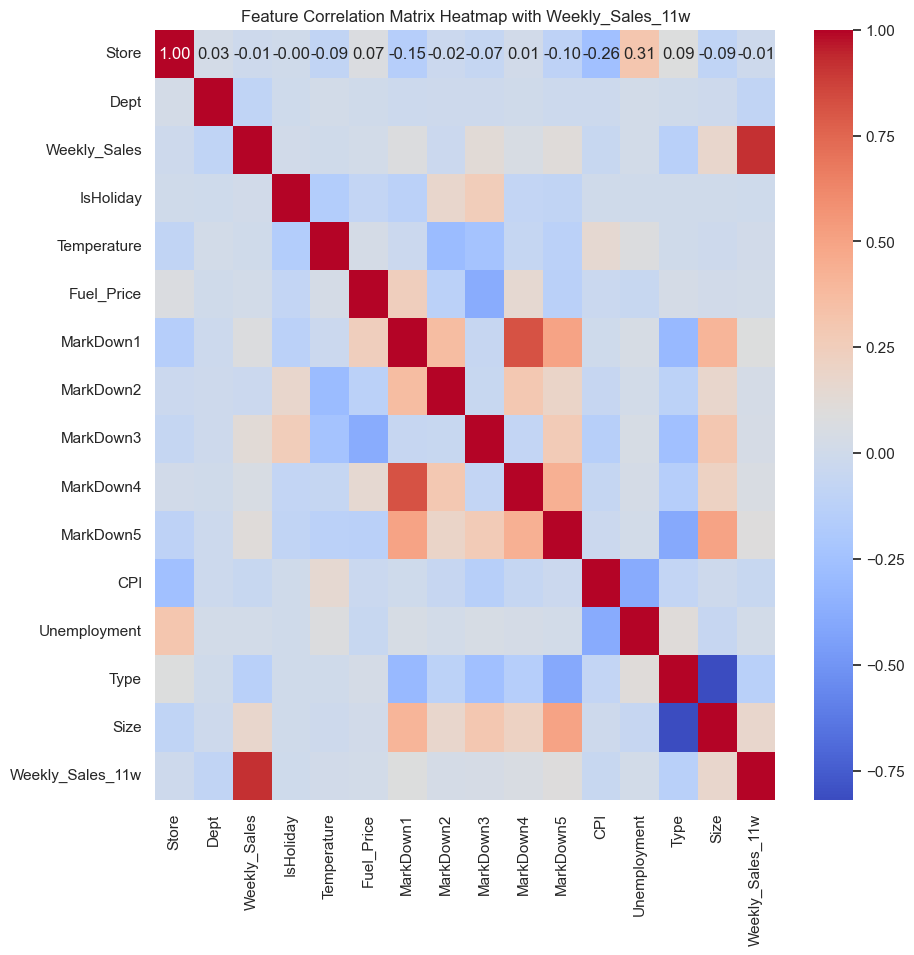

Spearman Rank Correlation:
                      Store      Dept  Weekly_Sales  IsHoliday  Temperature  \
Store             1.000000  0.025229     -0.010315   0.001032    -0.085646   
Dept              0.025229  1.000000     -0.087537   0.001082     0.013979   
Weekly_Sales     -0.010315 -0.087537      1.000000   0.006701     0.000880   
IsHoliday         0.001032  0.001082      0.006701   1.000000    -0.168291   
Temperature      -0.085646  0.013979      0.000880  -0.168291     1.000000   
Fuel_Price        0.070615  0.005068      0.013133  -0.074733     0.032966   
MarkDown1        -0.147672 -0.020893      0.082411  -0.115501    -0.026170   
MarkDown2        -0.023716 -0.010203     -0.022243   0.173925    -0.288500   
MarkDown3        -0.065947 -0.014440      0.120213   0.253623    -0.242194   
MarkDown4         0.008292  0.000952      0.053512  -0.075914    -0.059377   
MarkDown5        -0.102535 -0.020099      0.113604  -0.086301    -0.122552   
CPI              -0.257643 -0.021686

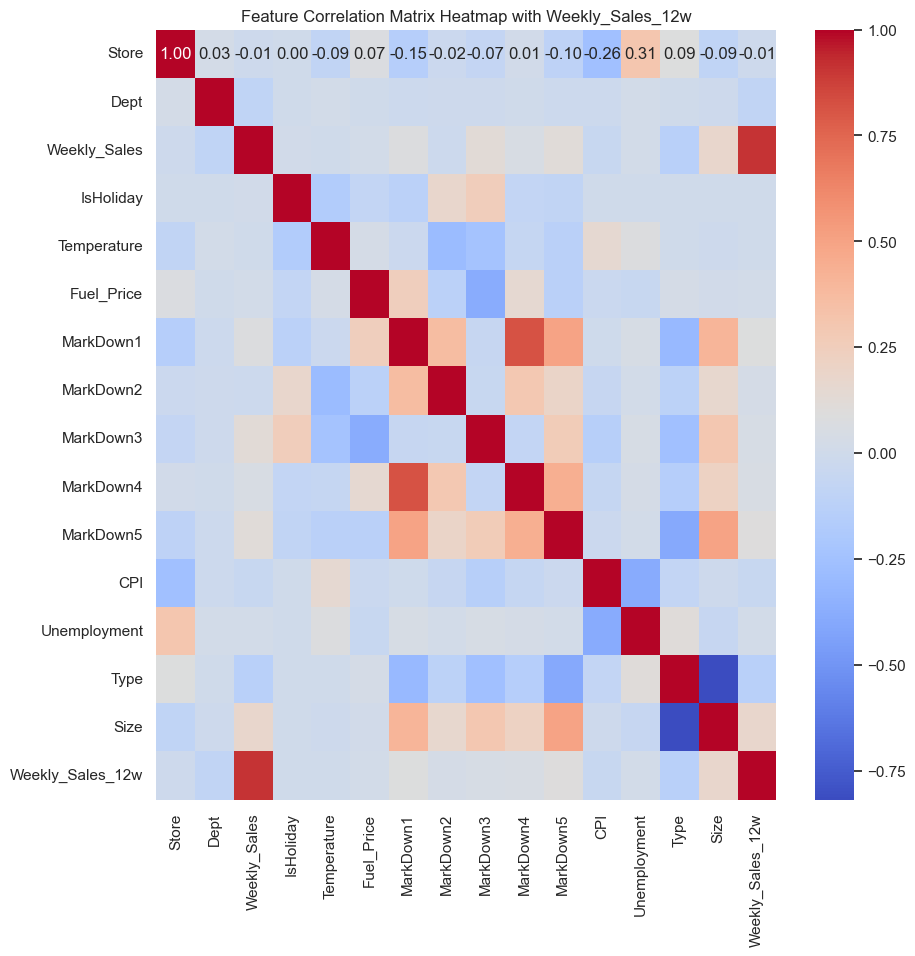

Spearman Rank Correlation:
                      Store      Dept  Weekly_Sales  IsHoliday  Temperature  \
Store             1.000000  0.025212     -0.010312   0.000471    -0.085553   
Dept              0.025212  1.000000     -0.088383   0.000134     0.014531   
Weekly_Sales     -0.010312 -0.088383      1.000000   0.007836    -0.000620   
IsHoliday         0.000471  0.000134      0.007836   1.000000    -0.165228   
Temperature      -0.085553  0.014531     -0.000620  -0.165228     1.000000   
Fuel_Price        0.070681  0.004985      0.013129  -0.075087     0.033338   
MarkDown1        -0.147549 -0.021392      0.078364  -0.115440    -0.027025   
MarkDown2        -0.024764 -0.010167     -0.025443   0.175376    -0.288501   
MarkDown3        -0.065494 -0.013474      0.119470   0.253183    -0.243266   
MarkDown4         0.008387 -0.000939      0.049060  -0.076505    -0.059618   
MarkDown5        -0.102489 -0.021416      0.111339  -0.086422    -0.122426   
CPI              -0.257731 -0.021636

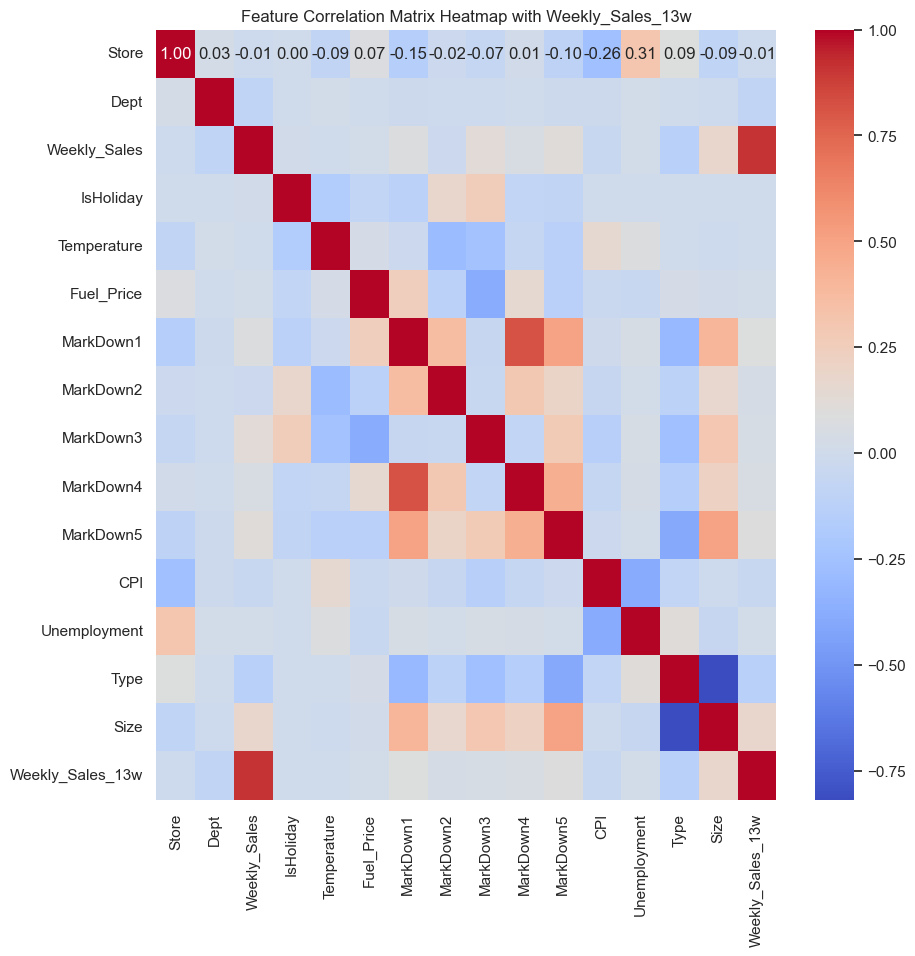

In [22]:
# Correlation coefficient check
for week, df in data_frames.items():
    numerical_df = df.select_dtypes(include=['float64', 'int64']) 
    # Calculate the correlation matrix
    correlation = numerical_df.corr(method="spearman")  
    print(f"Spearman Rank Correlation:\n {correlation}")

    # Create a heatmap with seaborn 
    plt.figure(figsize=(10, 10))
    sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title(f'Feature Correlation Matrix Heatmap with {week}')
    plt.savefig('Feature Correlation Matrix Heatmap.png', dpi=300)
    plt.show()

### 6. Summary

Data Selection and Preparation:
I selected the "w" store dataset, merging features, stores, and sales tables, with the goal of predicting sales for the next 12 weeks.

Data Analysis:
The dataset contains 382,955 rows and 27 columns. Key findings include missing values in MarkDown1-5 exceeding 70%, and "Store" and "Dept" being categorical despite being numeric."Type" and "IsHoliday" need conversion to numeric formats. Significant variability was noted in several columns.

Data Cleaning:
Data cleaning involved converting data types, handling missing values, and processing outliers. Separate datasets were stored for different target variables.

Visualization:
Heatmaps, histograms, and box plots helped visualize missing values and data distribution, enhancing dataset understanding.

Correlation Analysis:
Strong correlations were found between weekly sales and the target, as well as between other variables like CPI, unemployment, and Markdown values. This informed potential reductions in model inputs.

Conclusion:
The initial data exploration and analysis provide a strong foundation for subsequent modeling.

## MSA 2024 Phase 2 - Part 2 Training and Evaluation

In [38]:
!/opt/anaconda3/bin/python -m pip install joblib
!/opt/anaconda3/bin/python -m pip install Cython 
!/opt/anaconda3/bin/python -m pip install pystan==2.19.1.1
!/opt/anaconda3/bin/python -m pip install prophet
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from keras.models import Sequential
from keras.layers import Input,LSTM, Dense
from statsmodels.tsa.arima.model import ARIMA
from prophet import Prophet
import tensorflow as tf
import sklearn.metrics as skm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

  Using cached Cython-3.0.10-py2.py3-none-any.whl.metadata (3.2 kB)
Using cached Cython-3.0.10-py2.py3-none-any.whl (1.2 MB)
  Using cached pystan-2.19.1.1.tar.gz (16.2 MB)
  Preparing metadata (setup.py) ... done
  Created wheel for pystan: filename=pystan-2.19.1.1-cp311-cp311-macosx_14_0_arm64.whl size=29357106 sha256=de67a0c028e4c1ff0d51adc447e9c5b91f09af3dadac9b30da187e1063d11ef8
  Stored in directory: /Users/liufang/Library/Caches/pip/wheels/64/c0/9d/4a4407389d24c0c0dbbc43a84039fcf77841f0312057281cfc
Successfully built pystan


### 1.Data normalization and definition of model evaluation indicators and model dictionaries

In [40]:
# 归一化
# 需要归一化的列
columns_to_scale = ['Weekly_Sales', 'Temperature', 'Fuel_Price', 'CPI','Unemployment','Size']

# 初始化一个字典来存储每个周的归一化器
scalers = {}

for week, df in data_frames.items():
    # 使用副本进行操作，避免改变原始数据
    df_scaled = df.copy()
    
    # 为每个周创建一个新的归一化器
    scaler = MinMaxScaler()
    df_scaled[columns_to_scale] = scaler.fit_transform(df_scaled[columns_to_scale])
    
    # 将归一化器存储在字典中
    scalers[week] = scaler
    
    # 更新归一化后的数据回字典
    data_frames[week] = df_scaled
    
    # 查看归一化数据
    print(f"Normalized data set for {week}:\n{df_scaled.head()}")

Normalized data set for Weekly_Sales_2w:
   Store  Dept        Date  Weekly_Sales  IsHoliday  Temperature  Fuel_Price  \
1      1     1  2010-02-12      0.141019          1     0.396967    0.041712   
2      1     1  2010-02-19      0.128738          0     0.410861    0.023052   
3      1     1  2010-02-26      0.067409          0     0.476419    0.048847   
4      1     1  2010-03-05      0.074109          0     0.475147    0.083974   
5      1     1  2010-03-12      0.071941          0     0.585616    0.107025   

   MarkDown1  MarkDown2  MarkDown3  MarkDown4  MarkDown5       CPI  \
1        NaN        NaN        NaN        NaN        NaN  0.856800   
2        NaN        NaN        NaN        NaN        NaN  0.857273   
3        NaN        NaN        NaN        NaN        NaN  0.857580   
4        NaN        NaN        NaN        NaN        NaN  0.857886   
5        NaN        NaN        NaN        NaN        NaN  0.858193   

   Unemployment  Type      Size  Weekly_Sales_2w  
1     

In [42]:
# Define a function to calculate the metrics including MSE\MAE\RMSE\R-square
def calculate_metrics(y_true,y_pred):
    mse=skm.mean_squared_error(y_true,y_pred)
    mae=skm.mean_absolute_error(y_true, y_pred)
    rmse=np.sqrt(mse)
    r2=skm.r2_score(y_true, y_pred)
    non_zero_idx = y_true != 0
    # Calculate MAPE 
    mape = np.mean(np.abs((y_true[non_zero_idx] - y_pred[non_zero_idx]) / y_true[non_zero_idx])) * 100

    # Calculate SMAPE
    smape = 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

    # Calculate MPE
    mpe = np.mean((y_true[non_zero_idx] - y_pred[non_zero_idx]) / y_true[non_zero_idx]) * 100

    return mse, mae, rmse, r2, mpe, mape, smape
    

In [139]:
# Create LSTM model
def create_lstm_model(input_shape):
    model = Sequential([
        Input(shape=input_shape),
        LSTM(50, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model
# Creat neural network model
def create_nn_model(input_dim):
    model = Sequential()
    model.add(Dense(128, activation='relu', input_shape=(input_dim,)))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model


In [46]:
# Calculate the number of features for LSTM
# Add some other needed features 
additional_features = ['Store', 'Dept', 'Type', 'IsHoliday']

num_features = len(columns_to_scale) + len(additional_features)
lstm_model = create_lstm_model((1, num_features))

In [90]:
# Define the models dictionary
models = {
    'LR': LinearRegression(),
    'Ridge': Ridge(alpha=10.0),
    'Lasso': Lasso(alpha=0.1),
    'DT': DecisionTreeRegressor(max_depth=5, min_samples_split=50),
    'RF': RandomForestRegressor(n_estimators=200, max_depth=10, min_samples_split=10),
    'XGB': XGBRegressor(learning_rate=0.01, max_depth=10, n_estimators=500, subsample=0.8,colsample_bytree=0.8),
    'LSTM': create_lstm_model,  
    'NN': create_nn_model
}

### 2. Load and split preprocessed data
### 3. Choose an algorithm
### 4. Train and test a model
### 5. Evaluate the model

In [92]:
from joblib import dump

# 迭代每个DataFrame
for week, df in data_frames.items():
    # 获取当前周数，假设 week 格式为 'Weekly_Sales_Xw'
    current_week = int(week.split('_')[2][:-1])
    
    # 选择float64和int64类型的列
    numerical_df = df.select_dtypes(include=['float64', 'int64'])

    # 准备训练和测试数据
    if f'Weekly_Sales_{current_week}w' in numerical_df.columns:
        y = numerical_df[f'Weekly_Sales_{current_week}w']
        # 删除所有不相关的销售周和预测列
        columns_to_drop = [col for col in numerical_df.columns if 'Weekly_Sales_' in col  or 'Mark'  in col]
        X  = numerical_df.drop(columns=columns_to_drop)
        
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

        print(f"Processing model for week {current_week}")

        # 训练模型并进行预测
        for model_name, model in models.items():
            # 为当前模型准备数据
            X_train_next, X_test_next = X_train.copy(), X_test.copy()
            if model_name == 'LSTM':
                # 重新初始化 LSTM 模型
                lstm_model = model((1, X_train_next.shape[1]))
                X_train_reshaped = X_train_next.values.reshape((-1, 1, X_train_next.shape[1]))
                X_test_reshaped = X_test_next.values.reshape((-1, 1, X_test_next.shape[1]))
                lstm_model.fit(X_train_reshaped, y_train, epochs=50, verbose=0)
                y_train_pred = lstm_model.predict(X_train_reshaped).flatten()
                y_test_pred = lstm_model.predict(X_test_reshaped).flatten()
                model_to_save = lstm_model
            elif model_name == 'NN':
                # 重新初始化 NN 模型
                nn_model = model(X_train_next.shape[1])
                nn_model.fit(X_train_next, y_train, epochs=50, verbose=0)
                y_train_pred = nn_model.predict(X_train_next).flatten()
                y_test_pred = nn_model.predict(X_test_next).flatten()
                model_to_save = nn_model
            else:
                model.fit(X_train_next, y_train)
                y_train_pred = model.predict(X_train_next)
                y_test_pred = model.predict(X_test_next)
                model_to_save = model
            # 组合模型名和周数，创建唯一的文件名
            filename = f'model_{model_name}_{current_week}w.joblib'
            # 保存模型到指定的文件
            dump(model_to_save, filename)
        
            # 计算并打印评估指标
            mse, mae, rmse, r2, mpe, smape, mape = calculate_metrics(y_train, y_train_pred)
            print(f"Week {current_week}, Model {model_name} - Training Metrics: MSE={mse:.2f}, MAE={mae:.2f}, RMSE={rmse:.2f}, R2={r2:.3f}, MPE={mpe:.3f}%, SMAPE={smape:.3f}%, MAPE={mape:.3f}%")

            mse, mae, rmse, r2, mpe,smape, mape = calculate_metrics(y_test, y_test_pred)
            print(f"Week {current_week}, Model {model_name} - Testing Metrics: MSE={mse:.2f}, MAE={mae:.2f}, RMSE={rmse:.2f}, R2={r2:.3f}, MPE={mpe:.3f}%, SMAPE={smape:.3f}%, MAPE={mape:.3f}%")
        # 更新 data_frames 字典
        data_frames[week] = df
       

Processing model for week 2
Week 2, Model LR - Training Metrics: MSE=14987968.02, MAE=1976.03, RMSE=3871.43, R2=0.864, MPE=-31.765%, SMAPE=41.734%, MAPE=27.573%
Week 2, Model LR - Testing Metrics: MSE=17054201.78, MAE=1982.27, RMSE=4129.67, R2=0.846, MPE=-31.884%, SMAPE=41.772%, MAPE=27.672%
Week 2, Model Ridge - Training Metrics: MSE=15233287.33, MAE=2200.60, RMSE=3902.98, R2=0.862, MPE=-42.113%, SMAPE=52.303%, MAPE=31.662%
Week 2, Model Ridge - Testing Metrics: MSE=17072403.20, MAE=2206.92, RMSE=4131.88, R2=0.846, MPE=-42.329%, SMAPE=52.413%, MAPE=31.788%
Week 2, Model Lasso - Training Metrics: MSE=14987979.89, MAE=1977.31, RMSE=3871.43, R2=0.864, MPE=-31.834%, SMAPE=41.801%, MAPE=27.600%
Week 2, Model Lasso - Testing Metrics: MSE=17052659.70, MAE=1983.56, RMSE=4129.49, R2=0.846, MPE=-31.954%, SMAPE=41.840%, MAPE=27.700%
Week 2, Model DT - Training Metrics: MSE=7989378.34, MAE=1549.58, RMSE=2826.55, R2=0.927, MPE=-8.837%, SMAPE=21.183%, MAPE=17.902%
Week 2, Model DT - Testing Metrics

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6051/6051 ━━━━━━━━━━━━━━━━━━━━ 1s 214us/step
2594/2594 ━━━━━━━━━━━━━━━━━━━━ 1s 227us/step
Week 2, Model NN - Training Metrics: MSE=7781139.28, MAE=1605.76, RMSE=2789.47, R2=0.929, MPE=-20.459%, SMAPE=28.127%, MAPE=21.147%
Week 2, Model NN - Testing Metrics: MSE=7792903.25, MAE=1603.72, RMSE=2791.58, R2=0.930, MPE=-20.356%, SMAPE=27.998%, MAPE=21.174%
Processing model for week 3
Week 3, Model LR - Training Metrics: MSE=25066885.37, MAE=2699.71, RMSE=5006.68, R2=0.772, MPE=-52.747%, SMAPE=65.041%, MAPE=36.455%
Week 3, Model LR - Testing Metrics: MSE=24317417.63, MAE=2700.60, RMSE=4931.27, R2=0.781, MPE=-52.826%, SMAPE=64.927%, MAPE=36.549%
Week 3, Model Ridge - Training Metrics: MSE=25361976.26, MAE=2958.76, RMSE=5036.07, R2=0.770, MPE=-63.536%, SMAPE=76.398%, MAPE=39.980%
Week 3, Model Ridge - Testing Metrics: MSE=24718523.20, MAE=2960.48, RMSE=4971.77, R2=0.777, MPE=-63.652%, SMAPE=76.315%, MAPE=40.103%
Week 3, Model Lasso - Training Metrics: MSE=25066899.04, MAE=2701.26, RMSE=5006.69,

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6051/6051 ━━━━━━━━━━━━━━━━━━━━ 1s 227us/step
2594/2594 ━━━━━━━━━━━━━━━━━━━━ 1s 216us/step
Week 3, Model NN - Training Metrics: MSE=10734084.15, MAE=1862.35, RMSE=3276.29, R2=0.903, MPE=-17.841%, SMAPE=29.338%, MAPE=22.215%
Week 3, Model NN - Testing Metrics: MSE=11158892.16, MAE=1875.44, RMSE=3340.49, R2=0.899, MPE=-17.888%, SMAPE=29.260%, MAPE=22.246%
Processing model for week 4
Week 4, Model LR - Training Metrics: MSE=28404982.71, MAE=2986.91, RMSE=5329.63, R2=0.743, MPE=-58.676%, SMAPE=72.148%, MAPE=39.132%
Week 4, Model LR - Testing Metrics: MSE=29740796.99, MAE=2979.18, RMSE=5453.51, R2=0.731, MPE=-58.768%, SMAPE=72.176%, MAPE=39.219%
Week 4, Model Ridge - Training Metrics: MSE=28676338.80, MAE=3225.12, RMSE=5355.03, R2=0.740, MPE=-68.882%, SMAPE=82.854%, MAPE=42.258%
Week 4, Model Ridge - Testing Metrics: MSE=29831516.58, MAE=3218.91, RMSE=5461.82, R2=0.730, MPE=-69.039%, SMAPE=82.940%, MAPE=42.365%
Week 4, Model Lasso - Training Metrics: MSE=28404996.08, MAE=2988.39, RMSE=5329.6

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6051/6051 ━━━━━━━━━━━━━━━━━━━━ 1s 230us/step
2594/2594 ━━━━━━━━━━━━━━━━━━━━ 1s 215us/step
Week 4, Model NN - Training Metrics: MSE=13848047.85, MAE=2277.18, RMSE=3721.30, R2=0.875, MPE=-36.447%, SMAPE=45.232%, MAPE=29.715%
Week 4, Model NN - Testing Metrics: MSE=13587525.03, MAE=2273.25, RMSE=3686.13, R2=0.877, MPE=-36.504%, SMAPE=45.323%, MAPE=29.843%
Processing model for week 5
Week 5, Model LR - Training Metrics: MSE=31222899.22, MAE=3179.68, RMSE=5587.75, R2=0.718, MPE=-64.594%, SMAPE=78.789%, MAPE=41.151%
Week 5, Model LR - Testing Metrics: MSE=28886719.60, MAE=3156.93, RMSE=5374.64, R2=0.740, MPE=-63.943%, SMAPE=78.049%, MAPE=41.092%
Week 5, Model Ridge - Training Metrics: MSE=31474697.46, MAE=3413.11, RMSE=5610.23, R2=0.716, MPE=-74.278%, SMAPE=88.981%, MAPE=44.007%
Week 5, Model Ridge - Testing Metrics: MSE=29390685.06, MAE=3390.63, RMSE=5421.32, R2=0.735, MPE=-73.635%, SMAPE=88.238%, MAPE=43.964%
Week 5, Model Lasso - Training Metrics: MSE=31222912.57, MAE=3181.17, RMSE=5587.7

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6051/6051 ━━━━━━━━━━━━━━━━━━━━ 1s 210us/step
2594/2594 ━━━━━━━━━━━━━━━━━━━━ 1s 212us/step
Week 5, Model NN - Training Metrics: MSE=14600201.47, MAE=2153.52, RMSE=3821.02, R2=0.868, MPE=-12.982%, SMAPE=31.499%, MAPE=24.604%
Week 5, Model NN - Testing Metrics: MSE=14553518.23, MAE=2148.64, RMSE=3814.91, R2=0.869, MPE=-12.522%, SMAPE=31.107%, MAPE=24.612%
Processing model for week 6
Week 6, Model LR - Training Metrics: MSE=35170702.32, MAE=3491.55, RMSE=5930.49, R2=0.683, MPE=-72.812%, SMAPE=88.081%, MAPE=44.051%
Week 6, Model LR - Testing Metrics: MSE=31632591.64, MAE=3459.52, RMSE=5624.29, R2=0.715, MPE=-72.644%, SMAPE=87.846%, MAPE=44.210%
Week 6, Model Ridge - Training Metrics: MSE=35387706.25, MAE=3700.75, RMSE=5948.76, R2=0.681, MPE=-81.557%, SMAPE=97.291%, MAPE=46.478%
Week 6, Model Ridge - Testing Metrics: MSE=32227823.83, MAE=3670.30, RMSE=5676.96, R2=0.709, MPE=-81.498%, SMAPE=97.152%, MAPE=46.658%
Week 6, Model Lasso - Training Metrics: MSE=35170714.89, MAE=3492.97, RMSE=5930.4

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6052/6052 ━━━━━━━━━━━━━━━━━━━━ 1s 221us/step
2594/2594 ━━━━━━━━━━━━━━━━━━━━ 1s 209us/step
Week 6, Model NN - Training Metrics: MSE=16529697.49, MAE=2354.90, RMSE=4065.67, R2=0.851, MPE=-15.281%, SMAPE=37.182%, MAPE=29.313%
Week 6, Model NN - Testing Metrics: MSE=16513161.22, MAE=2351.51, RMSE=4063.64, R2=0.851, MPE=-14.810%, SMAPE=36.876%, MAPE=29.446%
Processing model for week 7
Week 7, Model LR - Training Metrics: MSE=35562538.60, MAE=3549.83, RMSE=5963.43, R2=0.680, MPE=-73.347%, SMAPE=88.902%, MAPE=44.523%
Week 7, Model LR - Testing Metrics: MSE=37026698.80, MAE=3575.29, RMSE=6084.96, R2=0.668, MPE=-74.349%, SMAPE=89.867%, MAPE=44.823%
Week 7, Model Ridge - Training Metrics: MSE=35778261.52, MAE=3752.06, RMSE=5981.49, R2=0.678, MPE=-82.054%, SMAPE=98.034%, MAPE=46.896%
Week 7, Model Ridge - Testing Metrics: MSE=37068159.21, MAE=3776.34, RMSE=6088.36, R2=0.667, MPE=-83.102%, SMAPE=99.041%, MAPE=47.202%
Week 7, Model Lasso - Training Metrics: MSE=35562551.17, MAE=3551.20, RMSE=5963.4

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6051/6051 ━━━━━━━━━━━━━━━━━━━━ 1s 228us/step
2594/2594 ━━━━━━━━━━━━━━━━━━━━ 1s 216us/step
Week 7, Model NN - Training Metrics: MSE=17897849.61, MAE=2500.99, RMSE=4230.59, R2=0.839, MPE=-12.917%, SMAPE=36.389%, MAPE=29.236%
Week 7, Model NN - Testing Metrics: MSE=18193286.92, MAE=2527.38, RMSE=4265.36, R2=0.837, MPE=-13.785%, SMAPE=37.260%, MAPE=29.569%
Processing model for week 8
Week 8, Model LR - Training Metrics: MSE=36801764.81, MAE=3651.98, RMSE=6066.45, R2=0.669, MPE=-76.501%, SMAPE=92.345%, MAPE=45.543%
Week 8, Model LR - Testing Metrics: MSE=36492681.15, MAE=3655.69, RMSE=6040.92, R2=0.673, MPE=-76.337%, SMAPE=92.271%, MAPE=45.709%
Week 8, Model Ridge - Training Metrics: MSE=36930161.80, MAE=3805.51, RMSE=6077.02, R2=0.668, MPE=-83.175%, SMAPE=99.350%, MAPE=47.330%
Week 8, Model Ridge - Testing Metrics: MSE=36688828.46, MAE=3808.61, RMSE=6057.13, R2=0.671, MPE=-83.047%, SMAPE=99.280%, MAPE=47.483%
Week 8, Model Lasso - Training Metrics: MSE=36801774.85, MAE=3653.18, RMSE=6066.4

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6051/6051 ━━━━━━━━━━━━━━━━━━━━ 1s 210us/step
2594/2594 ━━━━━━━━━━━━━━━━━━━━ 1s 214us/step
Week 8, Model NN - Training Metrics: MSE=18258801.26, MAE=2525.45, RMSE=4273.03, R2=0.836, MPE=-24.611%, SMAPE=41.527%, MAPE=29.424%
Week 8, Model NN - Testing Metrics: MSE=18813265.33, MAE=2547.25, RMSE=4337.43, R2=0.831, MPE=-24.285%, SMAPE=41.543%, MAPE=29.689%
Processing model for week 9
Week 9, Model LR - Training Metrics: MSE=34646946.82, MAE=3541.57, RMSE=5886.17, R2=0.690, MPE=-71.289%, SMAPE=86.926%, MAPE=44.229%
Week 9, Model LR - Testing Metrics: MSE=37269098.93, MAE=3551.97, RMSE=6104.84, R2=0.666, MPE=-72.553%, SMAPE=87.880%, MAPE=44.463%
Week 9, Model Ridge - Training Metrics: MSE=34786449.36, MAE=3697.76, RMSE=5898.00, R2=0.689, MPE=-78.374%, SMAPE=94.297%, MAPE=46.150%
Week 9, Model Ridge - Testing Metrics: MSE=37137661.45, MAE=3705.88, RMSE=6094.07, R2=0.667, MPE=-79.698%, SMAPE=95.296%, MAPE=46.392%
Week 9, Model Lasso - Training Metrics: MSE=34646957.04, MAE=3542.74, RMSE=5886.1

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6052/6052 ━━━━━━━━━━━━━━━━━━━━ 1s 212us/step
2594/2594 ━━━━━━━━━━━━━━━━━━━━ 1s 211us/step
Week 9, Model NN - Training Metrics: MSE=18949647.33, MAE=2573.95, RMSE=4353.12, R2=0.831, MPE=-17.869%, SMAPE=39.402%, MAPE=30.104%
Week 9, Model NN - Testing Metrics: MSE=19280988.20, MAE=2577.83, RMSE=4391.01, R2=0.827, MPE=-18.622%, SMAPE=39.990%, MAPE=30.320%
Processing model for week 10
Week 10, Model LR - Training Metrics: MSE=36452774.62, MAE=3661.65, RMSE=6037.61, R2=0.674, MPE=-75.147%, SMAPE=91.169%, MAPE=45.427%
Week 10, Model LR - Testing Metrics: MSE=37550047.31, MAE=3657.83, RMSE=6127.81, R2=0.663, MPE=-76.007%, SMAPE=91.865%, MAPE=45.530%
Week 10, Model Ridge - Training Metrics: MSE=36600885.06, MAE=3824.46, RMSE=6049.87, R2=0.673, MPE=-82.396%, SMAPE=98.732%, MAPE=47.356%
Week 10, Model Ridge - Testing Metrics: MSE=37549164.36, MAE=3818.90, RMSE=6127.74, R2=0.663, MPE=-83.271%, SMAPE=99.425%, MAPE=47.451%
Week 10, Model Lasso - Training Metrics: MSE=36452785.25, MAE=3662.87, RMSE=

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6051/6051 ━━━━━━━━━━━━━━━━━━━━ 1s 218us/step
2594/2594 ━━━━━━━━━━━━━━━━━━━━ 1s 219us/step
Week 10, Model NN - Training Metrics: MSE=20034507.48, MAE=2603.03, RMSE=4475.99, R2=0.821, MPE=-9.579%, SMAPE=37.743%, MAPE=31.356%
Week 10, Model NN - Testing Metrics: MSE=19617385.04, MAE=2590.43, RMSE=4429.15, R2=0.824, MPE=-10.288%, SMAPE=38.146%, MAPE=31.351%
Processing model for week 11
Week 11, Model LR - Training Metrics: MSE=35965708.80, MAE=3664.10, RMSE=5997.14, R2=0.678, MPE=-74.453%, SMAPE=90.590%, MAPE=45.403%
Week 11, Model LR - Testing Metrics: MSE=36739900.64, MAE=3661.35, RMSE=6061.34, R2=0.671, MPE=-74.378%, SMAPE=90.186%, MAPE=45.423%
Week 11, Model Ridge - Training Metrics: MSE=36101627.11, MAE=3813.25, RMSE=6008.46, R2=0.677, MPE=-81.456%, SMAPE=97.852%, MAPE=47.232%
Week 11, Model Ridge - Testing Metrics: MSE=36751088.92, MAE=3810.05, RMSE=6062.27, R2=0.670, MPE=-81.389%, SMAPE=97.460%, MAPE=47.274%
Week 11, Model Lasso - Training Metrics: MSE=35965719.00, MAE=3665.23, RMSE

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6052/6052 ━━━━━━━━━━━━━━━━━━━━ 1s 226us/step
2594/2594 ━━━━━━━━━━━━━━━━━━━━ 1s 223us/step
Week 11, Model NN - Training Metrics: MSE=21066537.67, MAE=2805.89, RMSE=4589.83, R2=0.811, MPE=-38.176%, SMAPE=52.438%, MAPE=33.740%
Week 11, Model NN - Testing Metrics: MSE=20922871.83, MAE=2797.13, RMSE=4574.15, R2=0.812, MPE=-38.180%, SMAPE=52.204%, MAPE=33.670%
Processing model for week 12
Week 12, Model LR - Training Metrics: MSE=36082172.68, MAE=3690.38, RMSE=6006.84, R2=0.677, MPE=-74.917%, SMAPE=91.169%, MAPE=45.557%
Week 12, Model LR - Testing Metrics: MSE=36800395.94, MAE=3700.54, RMSE=6066.33, R2=0.670, MPE=-75.590%, SMAPE=91.677%, MAPE=45.689%
Week 12, Model Ridge - Training Metrics: MSE=36218379.13, MAE=3837.04, RMSE=6018.17, R2=0.676, MPE=-81.913%, SMAPE=98.418%, MAPE=47.381%
Week 12, Model Ridge - Testing Metrics: MSE=36840009.11, MAE=3844.61, RMSE=6069.60, R2=0.670, MPE=-82.612%, SMAPE=98.929%, MAPE=47.503%
Week 12, Model Lasso - Training Metrics: MSE=36082182.89, MAE=3691.50, RMS

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6051/6051 ━━━━━━━━━━━━━━━━━━━━ 1s 218us/step
2594/2594 ━━━━━━━━━━━━━━━━━━━━ 1s 222us/step
Week 12, Model NN - Training Metrics: MSE=20598809.02, MAE=2760.54, RMSE=4538.59, R2=0.816, MPE=-33.363%, SMAPE=50.072%, MAPE=32.808%
Week 12, Model NN - Testing Metrics: MSE=21184322.26, MAE=2783.66, RMSE=4602.64, R2=0.810, MPE=-34.011%, SMAPE=50.699%, MAPE=32.974%
Processing model for week 13
Week 13, Model LR - Training Metrics: MSE=36758628.46, MAE=3736.74, RMSE=6062.89, R2=0.672, MPE=-76.712%, SMAPE=93.085%, MAPE=45.973%
Week 13, Model LR - Testing Metrics: MSE=35655881.60, MAE=3714.52, RMSE=5971.25, R2=0.679, MPE=-77.136%, SMAPE=93.201%, MAPE=45.919%
Week 13, Model Ridge - Training Metrics: MSE=36892830.28, MAE=3881.20, RMSE=6073.95, R2=0.671, MPE=-83.632%, SMAPE=100.253%, MAPE=47.756%
Week 13, Model Ridge - Testing Metrics: MSE=35809290.63, MAE=3857.52, RMSE=5984.09, R2=0.678, MPE=-84.045%, SMAPE=100.355%, MAPE=47.713%
Week 13, Model Lasso - Training Metrics: MSE=36758638.62, MAE=3737.85, R

/opt/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6051/6051 ━━━━━━━━━━━━━━━━━━━━ 1s 210us/step
2594/2594 ━━━━━━━━━━━━━━━━━━━━ 1s 258us/step
Week 13, Model NN - Training Metrics: MSE=21572123.43, MAE=2892.22, RMSE=4644.58, R2=0.807, MPE=-46.331%, SMAPE=60.958%, MAPE=36.354%
Week 13, Model NN - Testing Metrics: MSE=21422403.52, MAE=2882.63, RMSE=4628.43, R2=0.807, MPE=-46.692%, SMAPE=61.128%, MAPE=36.345%


### 6. Summary

Data Selection and Preparation:
The dataset was centered on the "w" store, where tables containing features, stores, and sales were merged to create a comprehensive dataset. Columns with high missing values, such as MarkDown1-5, were excluded to maintain data integrity. Data normalization was applied to standardize the range of variables, ensuring all features contributed equally to model performance. The dataset was split into training and testing sets, with a 70/30 split to balance model training and validation.

Choice of Algorithms:
A diverse set of models was selected, including Linear Regression, Ridge, Lasso, Decision Tree, Random Forest, XGBoost, LSTM, Neural Network, ARIMA, and Prophet. These models cover a range of techniques from linear and regularized regression to tree-based and time-series forecasting, as well as deep learning. The selection aimed to explore different data patterns and relationships within the dataset. XGBoost was chosen for its efficiency and effectiveness in handling diverse data types.

Evaluation Metrics:
The models were evaluated using metrics such as MSE, MAE, RMSE, R2, MPE, SMAPE, and MAPE. These metrics provided insights into model accuracy, error magnitude, and percentage errors, which are crucial for assessing forecast performance. SMAPE and MAPE were particularly relevant for financial forecasting, offering insights into the error proportions relative to actual values.

Training and Parameter Tuning:
During initial training, some models showed signs of overfitting, indicated by discrepancies between training and testing metrics. To mitigate this, rigorous parameter tuning was conducted, particularly for XGBoost and neural networks. Adjustments to parameters like learning rate, tree depth, and the number of estimators were made to balance bias and variance, leading to improved model performance.

Model Saving and Selection:
After training, each model was saved using joblib for future use. XGBoost emerged as the best-performing model, offering a strong balance between accuracy and computational efficiency. The final selection of XGBoost was based on its superior performance across multiple evaluation metrics.

Conclusion:
This structured approach ensured the application of appropriate machine learning algorithms, leading to robust predictive models for sales forecasting. The thorough evaluation and refinement process, guided by multiple metrics, resulted in the selection of XGBoost as the most effective model, capable of generating reliable sales forecasts.